In [1]:
import os
import sys
cwd = os.getcwd()
module_path = os.path.abspath(os.path.join('..'))
sys.path.insert(0, os.path.join(cwd, "../"))

import pickle
import torch
import importlib
import numpy as np
import pandas as pd
import tqdm
from statistics import mean as list_mean

import src.bin.tensorify as tensorify
import src.utils.data_conversion_utils as conversions
import src.data_manager.student_life_var_binned_data_manager as data_manager
import src.bin.trainer as trainer

from sklearn import metrics

from torch import nn
from copy import copy
from copy import deepcopy
from src import definitions
from src.bin import validations
from src.bin import statistics
from src.bin import plotting
from src.utils.read_utils import read_pickle
from src.utils import student_utils
from src.data_manager import sub_sampler
from src.data_manager import cross_val
from src.data_manager import helper as data_manager_helper
from tabulate import tabulate

from src.models.multitask_learning import multitask_autoencoder

pd.set_option('max_rows', 10000)
%load_ext autoreload
%autoreload 2

feature_list = data_manager.FEATURE_LIST

In [2]:
# ##### Pickle #####
data = read_pickle('../data/training_data/shuffled_splits/training_date_normalized_shuffled_splits_select_features_no_prev_stress_2.pkl')
splits = cross_val.get_k_fod_cross_val_splits_stratified_by_students(data=data, n_splits=5)
for spl in splits:
    print(sp)

############ Stats ############# 
# unnormalized_data = data_manager.get_data_for_training_in_dict_format(*student_list, normalize=False, fill_na=False)
# statistics_df, raw_df = statistics.get_statistics_on_data_dict(unnormalized_data, feature_list)
print(statistics.get_train_test_val_label_counts_from_raw_data(data))

student_label
Splits:  5
      Train    Val    Test
--  -------  -----  ------
 0      105     53      27
 1      123     50      43
 2       99     27      18


/home/nsimsiri/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


In [3]:
print(module_path)
data_path = "{}/data".format(module_path)
print(data_path)
ae_model_path = "{}/best_no_ae_multi_task_model.tar".format(data_path)
print(ae_model_path, os.path.exists(ae_model_path))

/home/nsimsiri/MultiRes/student_life
/home/nsimsiri/MultiRes/student_life/data
/home/nsimsiri/MultiRes/student_life/data/best_no_ae_multi_task_model.tar False


In [4]:
################################## Init ##################################
use_historgram = True
autencoder_bottle_neck_feature_size = 128
autoencoder_num_layers = 1
alpha , beta = 0.0001, 1
decay = 0.0001
first_key = next(iter(data['data'].keys()))
if use_historgram:
    num_features = len(data['data'][first_key][4][0])
else:
    num_features = len(data['data'][first_key][0][0])
num_covariates = len(data['data'][first_key][definitions.COVARIATE_DATA_IDX])
shared_hidden_layer_size = 256
user_dense_layer_hidden_size = 64
num_classes = 3
learning_rate = 0.000001
n_epochs = 250
shared_layer_dropout_prob=0.00
user_head_dropout_prob=0.00

device = torch.device('cuda') if torch.cuda.is_available else torch.device('cpu')

print("Num Features:", num_features)
print("Device: ", device)
print("Num_covariates:", num_covariates)


Num Features: 9
Device:  cuda
Num_covariates: 4


In [7]:
cuda_enabled = torch.cuda.is_available()
tensorified_data = tensorify.tensorify_data_gru_d(deepcopy(data), cuda_enabled)
student_list = conversions.extract_distinct_student_idsfrom_keys(data['data'].keys())

In [8]:
def evaluate_multitask_learner(data,
                               key_set: str,
                               num_classes,
                               multitask_lerner_model,
                               reconstruction_criterion,
                               classification_criterion,
                               device,
                               optimizer=None,
                               alpha=1,
                               beta=1,
                               use_histogram=False,
                               histogram_seq_len=None,
                               ordinal_regression=False,
                               use_covariates=True):
    validations.validate_data_dict_keys(data)
    validate_key_set_str(key_set)

    total_reconstruction_loss = 0
    total_classification_loss = 0
    total_joint_loss = 0

    labels = []
    predictions = []
    users = []

    if not optimizer:
        multitask_lerner_model.eval()
    else:
        multitask_lerner_model.train()

    for key in data[key_set]:
        student_id = conversions.extract_student_id_from_key(key)
        student_key = 'student_' + str(student_id)
        actual_data, covariate_data, histogram_data, train_label = data['data'][key]

        if ordinal_regression:
            train_label_vector = get_target_vector_for_ordinal_regression(train_label, num_classes, device)

        actual_data = actual_data[0].unsqueeze(0)
        if use_histogram:
            if histogram_seq_len:
                histogram_data = histogram_data[:max(histogram_seq_len, len(histogram_data))]
            actual_data = histogram_data.unsqueeze(0)

        decoded_output, y_pred = multitask_lerner_model(student_key,
                                                        actual_data,
                                                        covariate_data if use_covariates else None)

        # decoded output is `None` if training on only co-variates.
        reconstruction_loss = reconstruction_criterion(actual_data, decoded_output) if decoded_output is not None else object_generator.get_tensor_on_correct_device([0])
        total_reconstruction_loss += reconstruction_loss.item()

        if ordinal_regression:
            classification_loss = classification_criterion(y_pred, train_label_vector)
        else:
            classification_loss = classification_criterion(y_pred, train_label)

        total_classification_loss += classification_loss.item()

        joint_loss = alpha * reconstruction_loss + beta * classification_loss
        total_joint_loss += joint_loss.item()

        # Check if training
        if optimizer:
            multitask_lerner_model.zero_grad()
            joint_loss.backward()
            optimizer.step()

        labels.append(train_label)
        predicted_class = get_predicted_class(y_pred, ordinal_regression=ordinal_regression)
        predictions.append(predicted_class)
        users.append(student_id)

    return total_joint_loss, total_reconstruction_loss, total_classification_loss, labels, predictions, user

Split No:  0
## DEBUG ## - train_only_covariate (shold be false) True
## DEBUG ## - shared layer size 132


/home/nsimsiri/MultiRes/student_life/notebooks/../src/models/user_dense_heads.py:27: UserWarning: Input size greater than hidden size. This may result in a low capacity network
  warnings.warn(LOW_MODEL_CAPACITY_WARNING)
  0%|          | 0/250 [00:00<?, ?it/s]/home/nsimsiri/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/nsimsiri/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


xxxxxxxxxxxxxx epoch: 0 xxxxxxxxxxxxxx


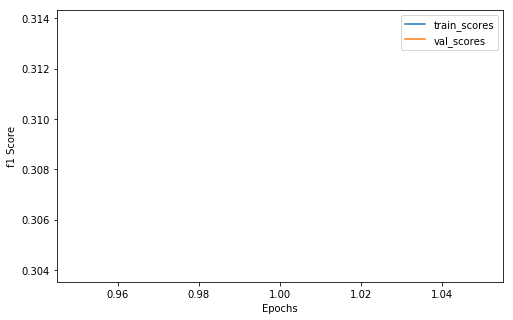

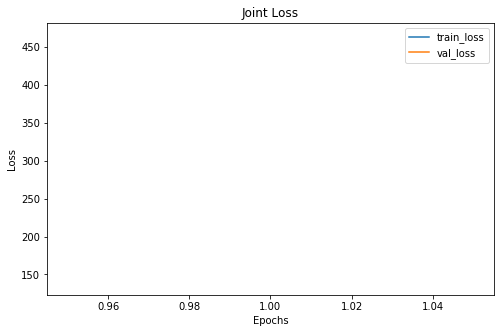

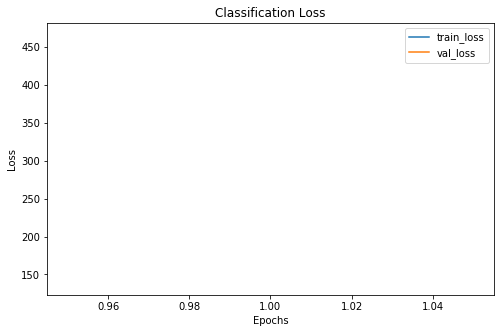

  0%|          | 1/250 [00:06<27:37,  6.65s/it]

Cofusion Matrix For Val Set: 
--  -  --
19  8  14
28  9  12
16  7  13
--  -  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    219      63
      1     77      24
      2    123      39
Score This Epoch: 0.313833023901517 Best Score: 0.313833023901517
xxxxxxxxxxxxxx epoch: 1 xxxxxxxxxxxxxx


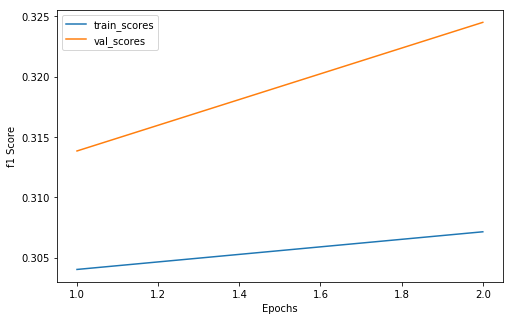

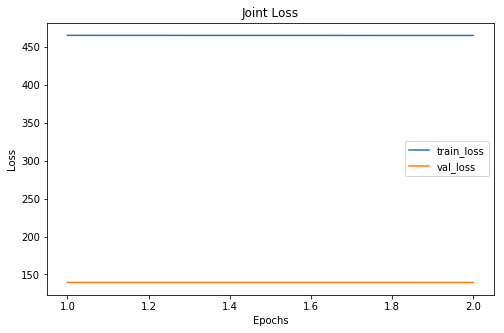

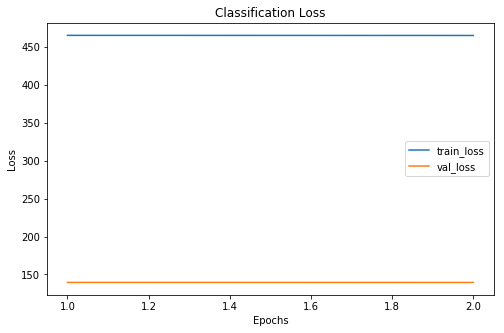

  1%|          | 2/250 [00:12<26:18,  6.37s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
28  10  11
16   7  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    217      63
      1     79      24
      2    123      39
Score This Epoch: 0.324487514008062 Best Score: 0.324487514008062
xxxxxxxxxxxxxx epoch: 2 xxxxxxxxxxxxxx


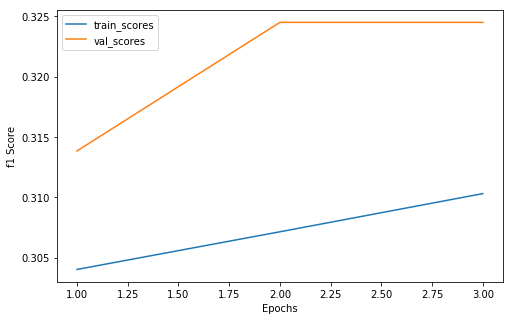

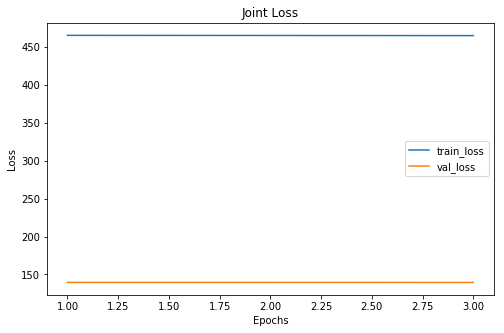

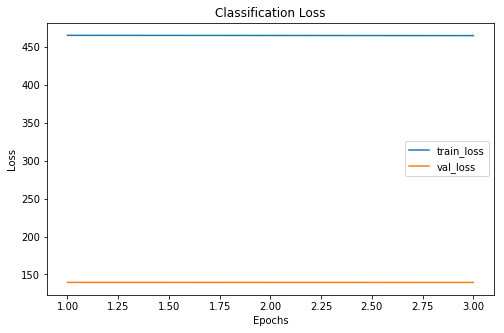

  1%|          | 3/250 [00:18<26:20,  6.40s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
28  10  11
16   7  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    216      63
      1     80      24
      2    123      39
Score This Epoch: 0.324487514008062 Best Score: 0.324487514008062
xxxxxxxxxxxxxx epoch: 3 xxxxxxxxxxxxxx


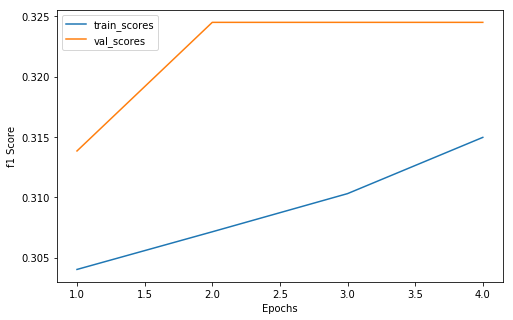

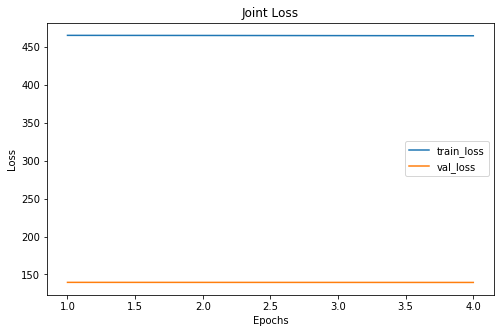

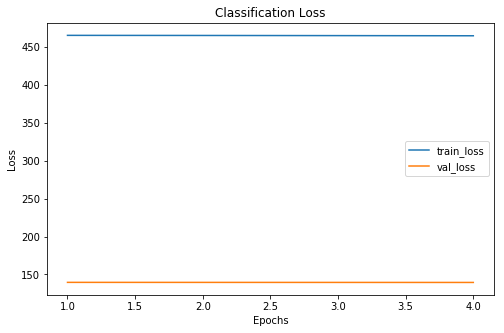

  2%|▏         | 4/250 [00:25<26:37,  6.49s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
28  10  11
16   7  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    215      63
      1     78      24
      2    126      39
Score This Epoch: 0.324487514008062 Best Score: 0.324487514008062
xxxxxxxxxxxxxx epoch: 4 xxxxxxxxxxxxxx


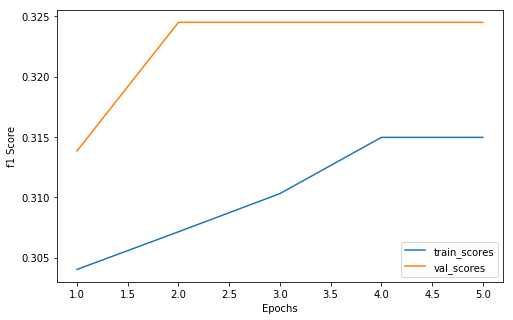

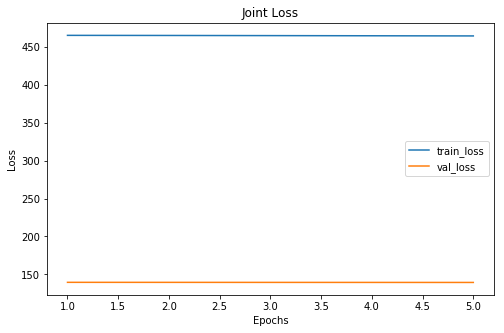

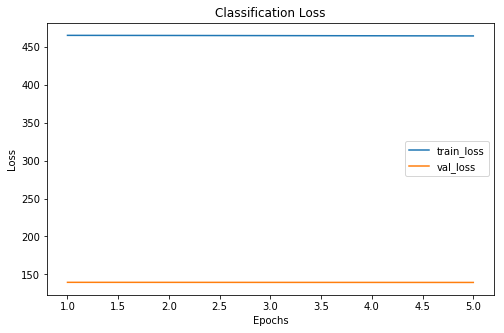

  2%|▏         | 5/250 [00:32<27:00,  6.61s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
28  10  11
16   7  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    215      63
      1     78      24
      2    126      39
Score This Epoch: 0.324487514008062 Best Score: 0.324487514008062
xxxxxxxxxxxxxx epoch: 5 xxxxxxxxxxxxxx


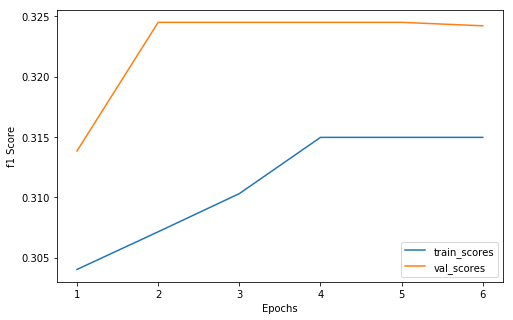

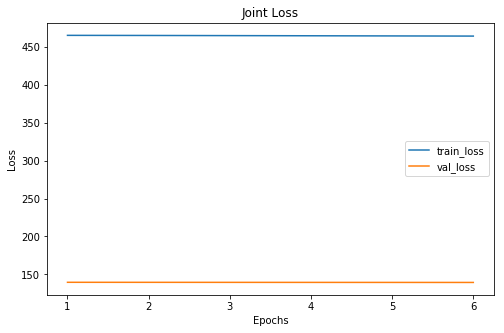

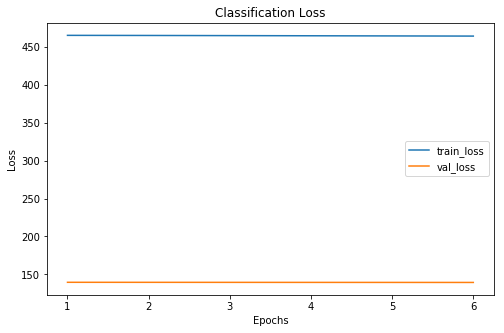

  2%|▏         | 6/250 [00:38<26:37,  6.55s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
28  10  11
15   8  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    215      62
      1     78      25
      2    126      39
Score This Epoch: 0.3242020383767957 Best Score: 0.324487514008062
xxxxxxxxxxxxxx epoch: 6 xxxxxxxxxxxxxx


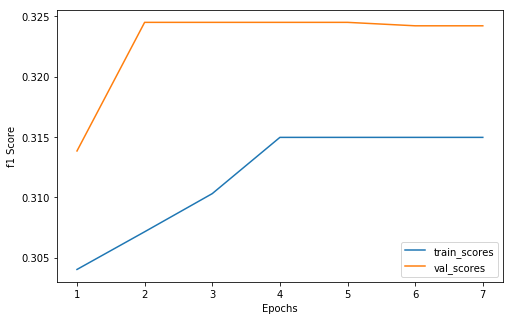

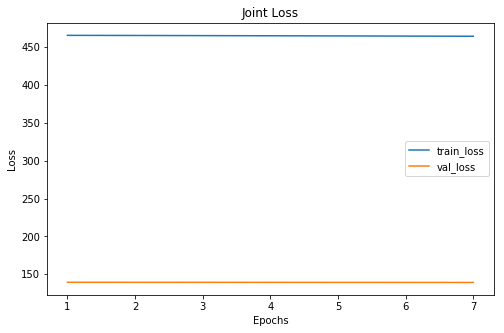

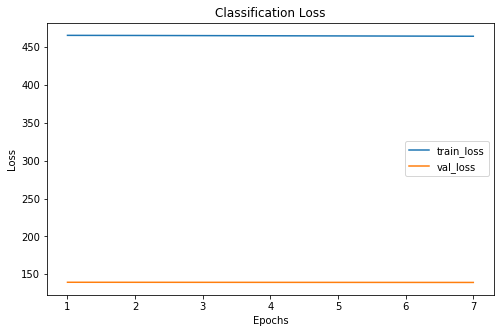

  3%|▎         | 7/250 [00:44<25:51,  6.38s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
28  10  11
15   8  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    215      62
      1     78      25
      2    126      39
Score This Epoch: 0.3242020383767957 Best Score: 0.324487514008062
xxxxxxxxxxxxxx epoch: 7 xxxxxxxxxxxxxx


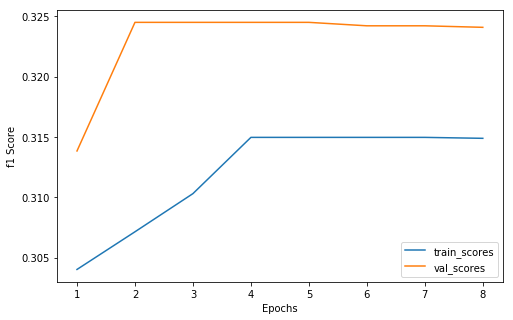

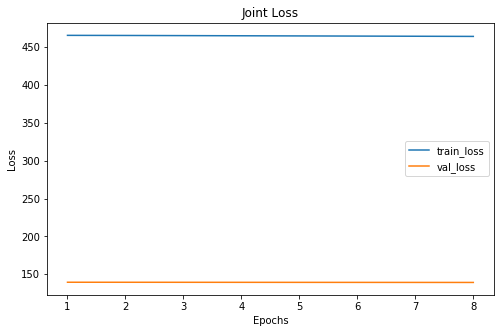

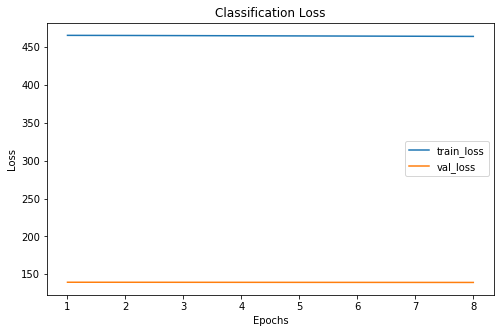

  3%|▎         | 8/250 [00:51<25:53,  6.42s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
27  10  12
15   8  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    214      61
      1     79      25
      2    126      40
Score This Epoch: 0.32407573429245257 Best Score: 0.324487514008062
xxxxxxxxxxxxxx epoch: 8 xxxxxxxxxxxxxx


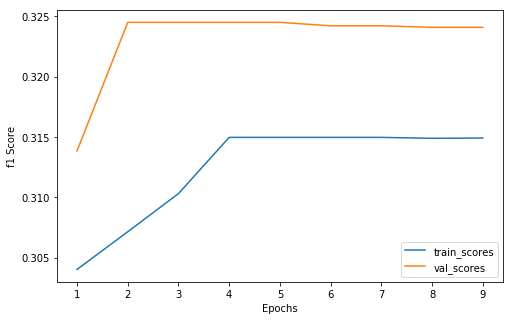

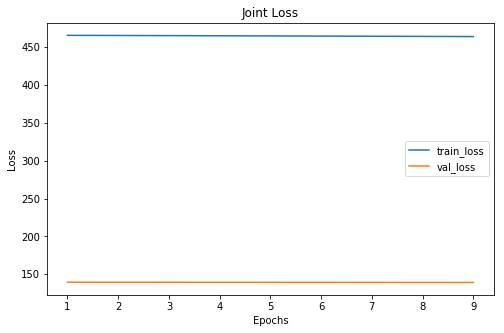

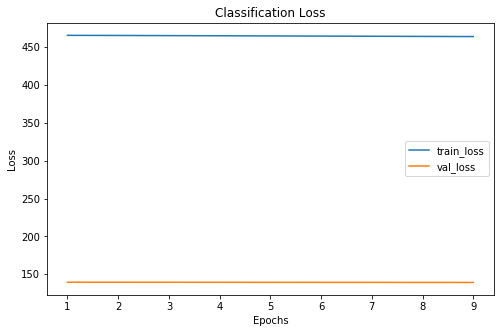

  4%|▎         | 9/250 [00:57<26:03,  6.49s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
27  10  12
15   8  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    213      61
      1     79      25
      2    127      40
Score This Epoch: 0.32407573429245257 Best Score: 0.324487514008062
xxxxxxxxxxxxxx epoch: 9 xxxxxxxxxxxxxx


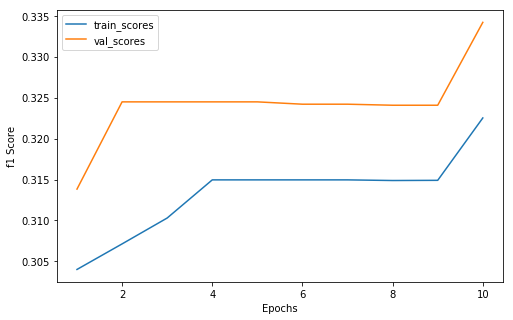

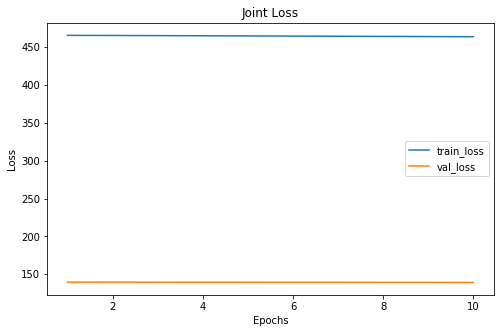

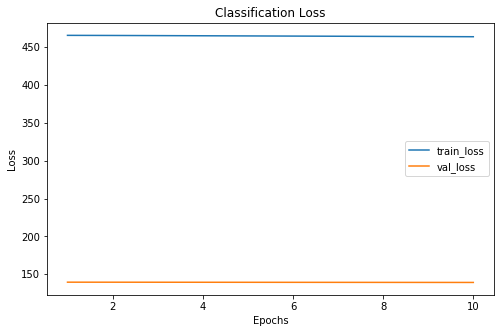

  4%|▍         | 10/250 [01:04<26:00,  6.50s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
25  11  13
15   8  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    208      59
      1     80      26
      2    131      41
Score This Epoch: 0.3341998213426785 Best Score: 0.3341998213426785
xxxxxxxxxxxxxx epoch: 10 xxxxxxxxxxxxxx


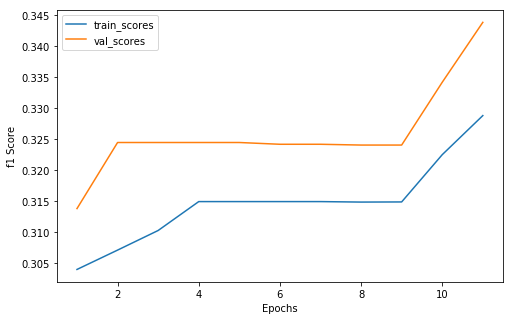

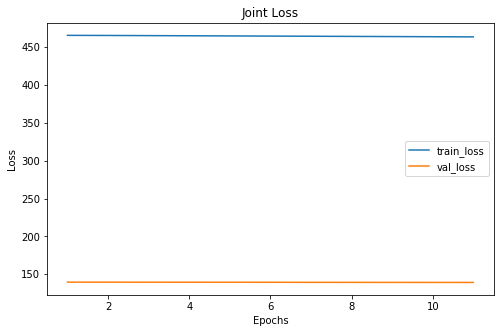

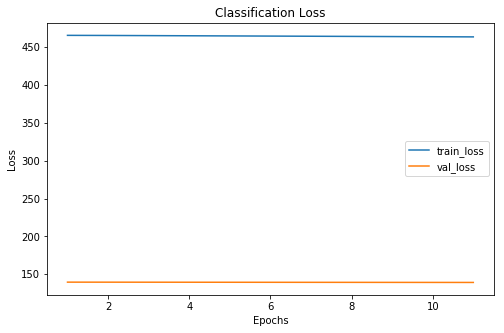

  4%|▍         | 11/250 [01:10<25:30,  6.41s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
24  12  13
14   9  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    205      57
      1     82      28
      2    132      41
Score This Epoch: 0.3438613540654357 Best Score: 0.3438613540654357
xxxxxxxxxxxxxx epoch: 11 xxxxxxxxxxxxxx


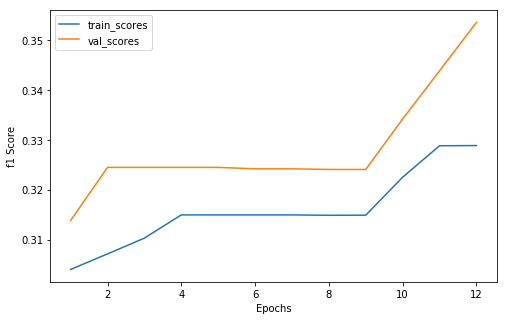

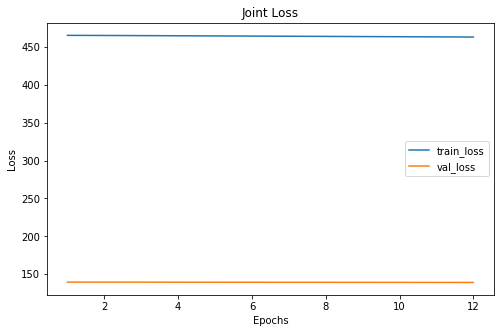

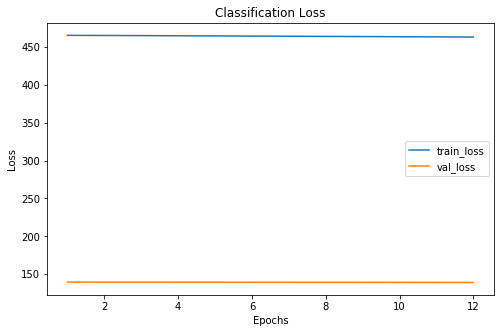

  5%|▍         | 12/250 [01:17<26:19,  6.64s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  13  13
14   9  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    204      56
      1     82      29
      2    133      41
Score This Epoch: 0.3535796282482586 Best Score: 0.3535796282482586
xxxxxxxxxxxxxx epoch: 12 xxxxxxxxxxxxxx


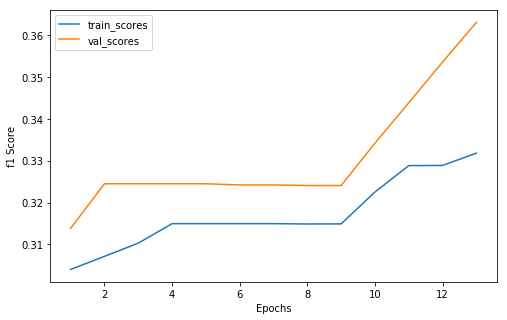

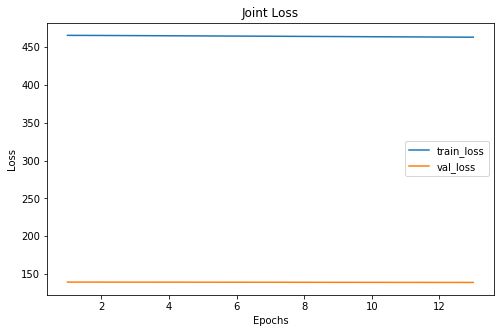

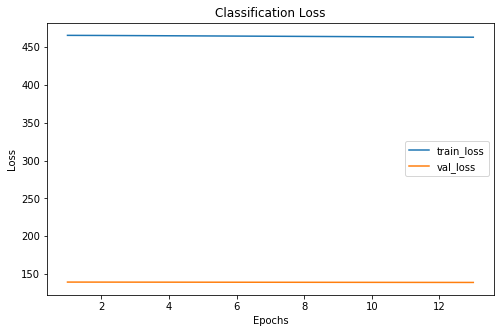

  5%|▌         | 13/250 [01:24<26:16,  6.65s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
14   9  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    201      56
      1     85      30
      2    133      40
Score This Epoch: 0.3630534424712876 Best Score: 0.3630534424712876
xxxxxxxxxxxxxx epoch: 13 xxxxxxxxxxxxxx


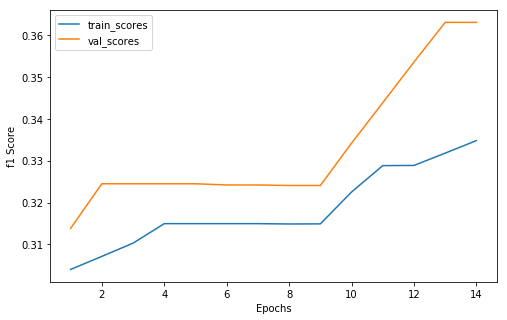

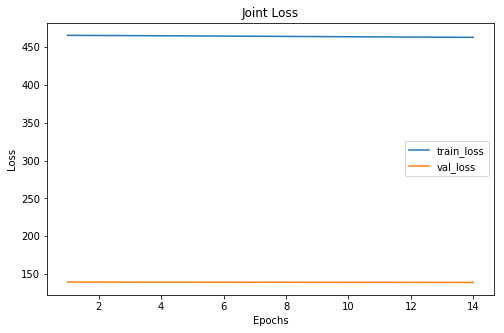

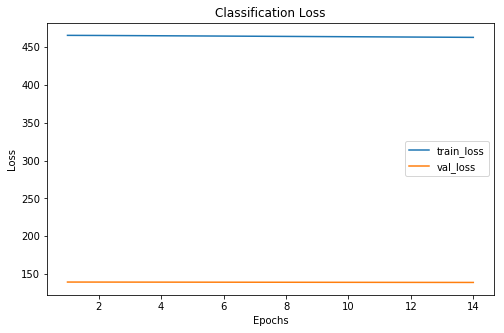

  6%|▌         | 14/250 [01:31<26:09,  6.65s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
14   9  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    199      56
      1     87      30
      2    133      40
Score This Epoch: 0.3630534424712876 Best Score: 0.3630534424712876
xxxxxxxxxxxxxx epoch: 14 xxxxxxxxxxxxxx


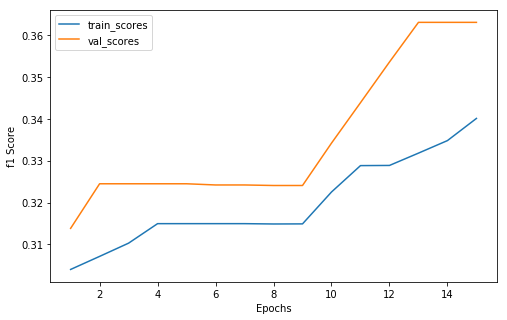

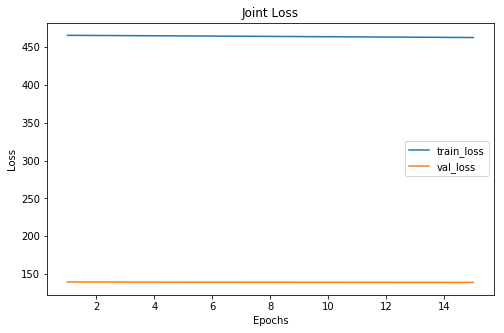

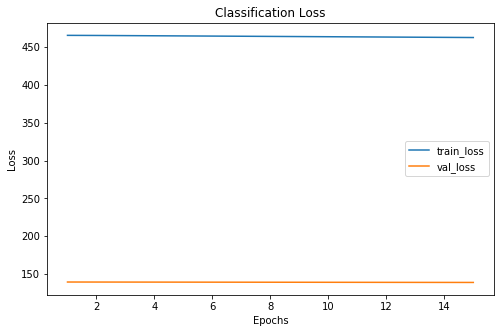

  6%|▌         | 15/250 [01:37<25:54,  6.61s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
14   9  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    196      56
      1     88      30
      2    135      40
Score This Epoch: 0.3630534424712876 Best Score: 0.3630534424712876
xxxxxxxxxxxxxx epoch: 15 xxxxxxxxxxxxxx


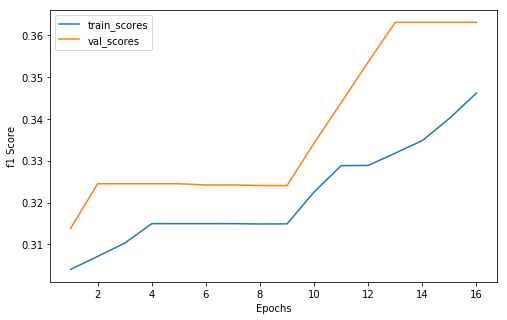

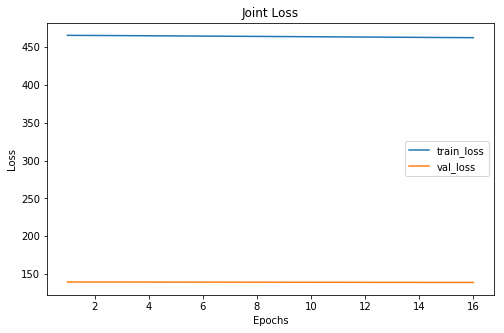

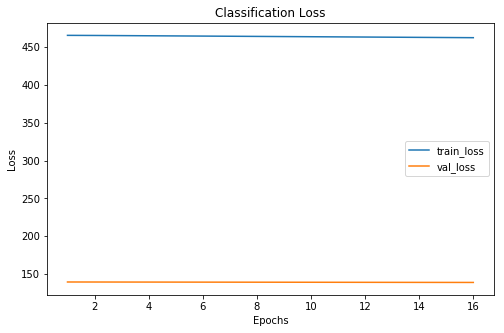

  6%|▋         | 16/250 [01:44<26:01,  6.67s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
14   9  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    194      56
      1     90      30
      2    135      40
Score This Epoch: 0.3630534424712876 Best Score: 0.3630534424712876
xxxxxxxxxxxxxx epoch: 16 xxxxxxxxxxxxxx


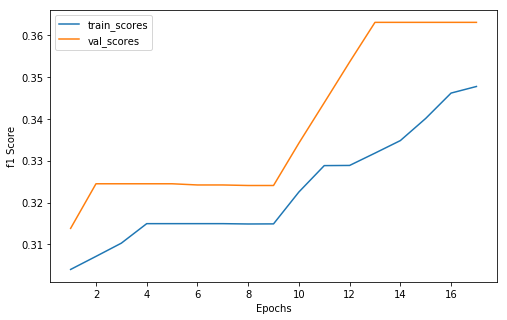

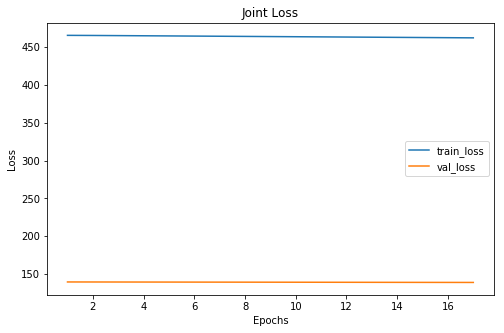

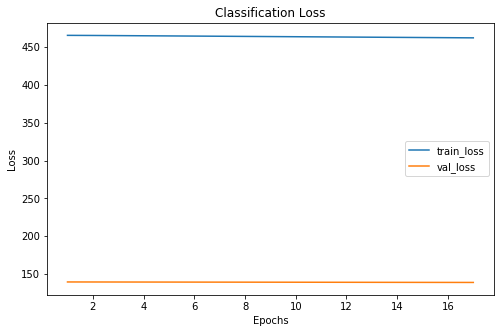

  7%|▋         | 17/250 [01:51<26:32,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
14   9  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    189      56
      1     89      30
      2    141      40
Score This Epoch: 0.3630534424712876 Best Score: 0.3630534424712876
xxxxxxxxxxxxxx epoch: 17 xxxxxxxxxxxxxx


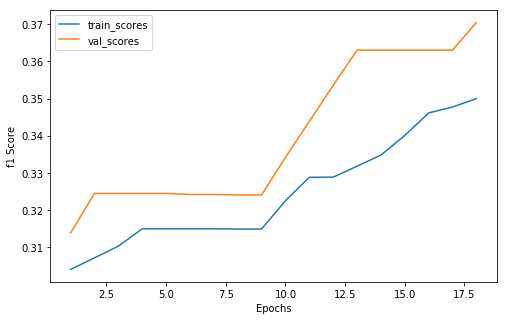

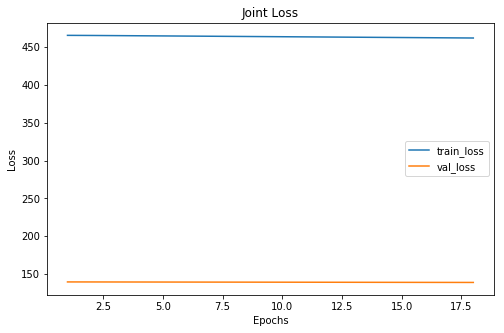

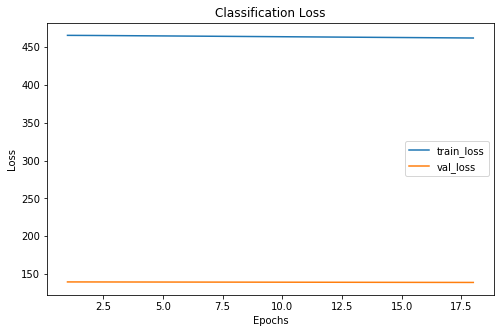

  7%|▋         | 18/250 [01:58<26:15,  6.79s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
13   9  14
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    186      55
      1     89      30
      2    144      41
Score This Epoch: 0.3705330505172278 Best Score: 0.3705330505172278
xxxxxxxxxxxxxx epoch: 18 xxxxxxxxxxxxxx


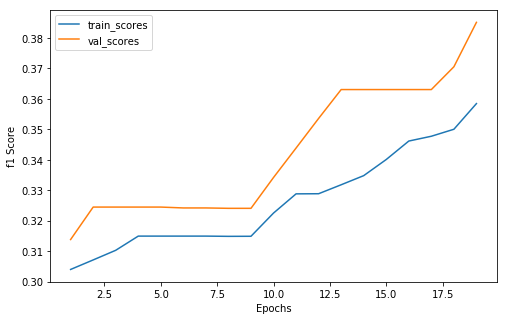

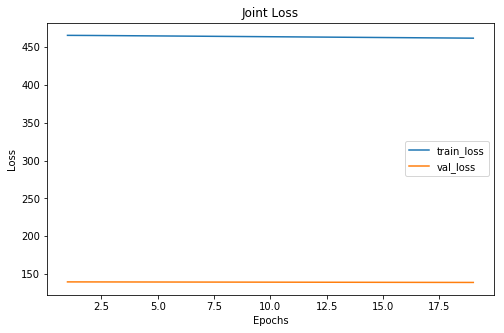

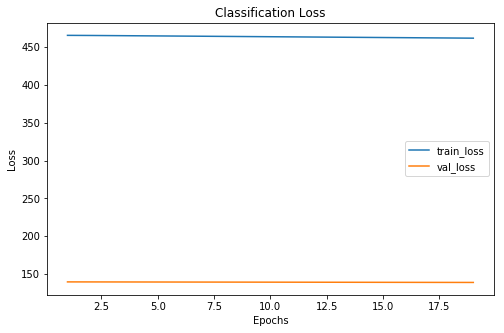

  8%|▊         | 19/250 [02:05<26:16,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
11   9  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    182      53
      1     89      30
      2    148      43
Score This Epoch: 0.385109802965984 Best Score: 0.385109802965984
xxxxxxxxxxxxxx epoch: 19 xxxxxxxxxxxxxx


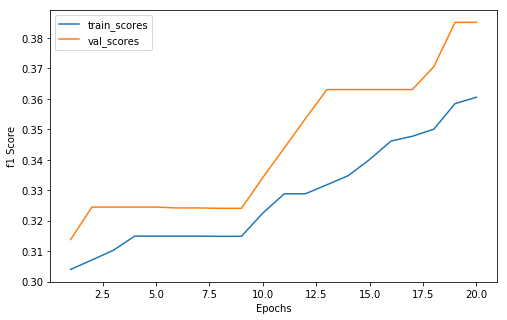

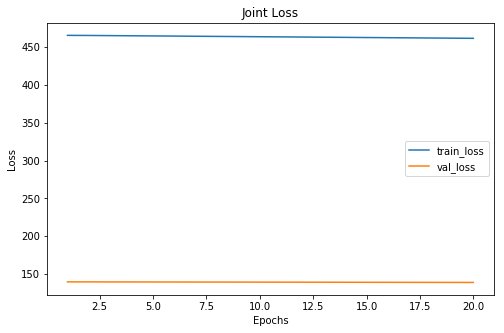

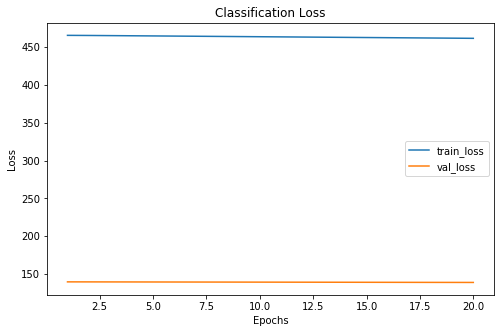

  8%|▊         | 20/250 [02:12<26:33,  6.93s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
11   9  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    181      53
      1     89      30
      2    149      43
Score This Epoch: 0.385109802965984 Best Score: 0.385109802965984
xxxxxxxxxxxxxx epoch: 20 xxxxxxxxxxxxxx


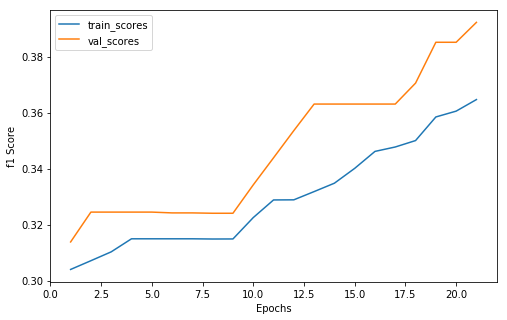

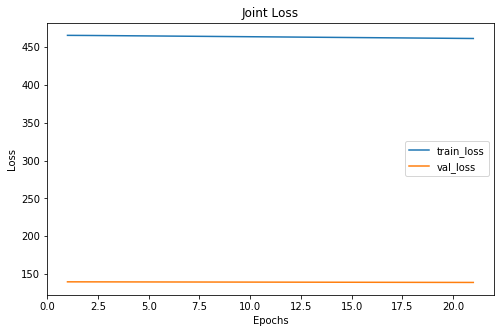

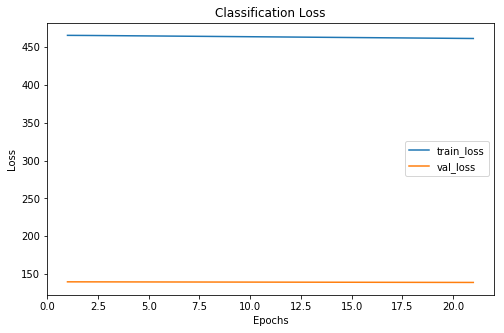

  8%|▊         | 21/250 [02:19<26:06,  6.84s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    179      52
      1     89      30
      2    151      44
Score This Epoch: 0.39222045063204714 Best Score: 0.39222045063204714
xxxxxxxxxxxxxx epoch: 21 xxxxxxxxxxxxxx


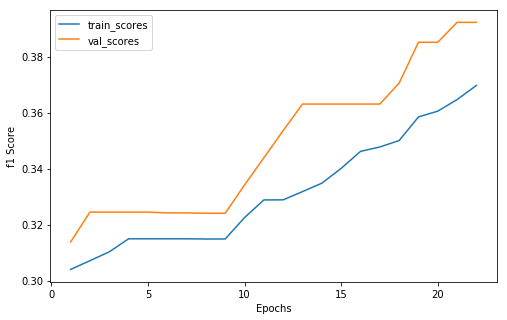

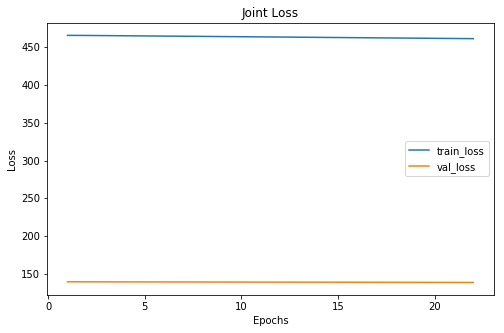

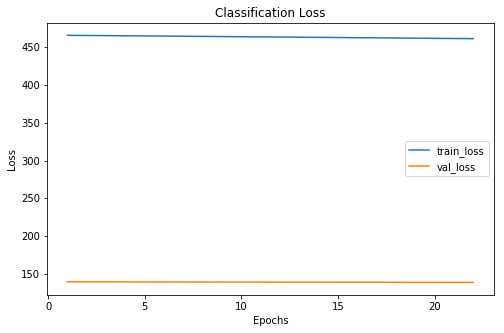

  9%|▉         | 22/250 [02:25<25:24,  6.69s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    178      52
      1     90      30
      2    151      44
Score This Epoch: 0.39222045063204714 Best Score: 0.39222045063204714
xxxxxxxxxxxxxx epoch: 22 xxxxxxxxxxxxxx


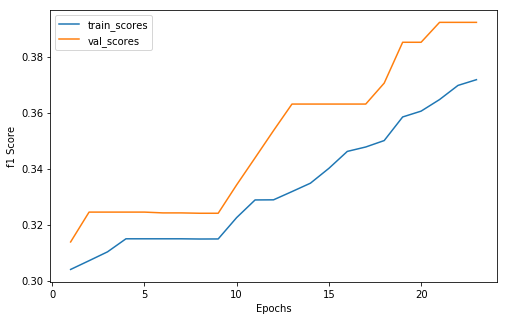

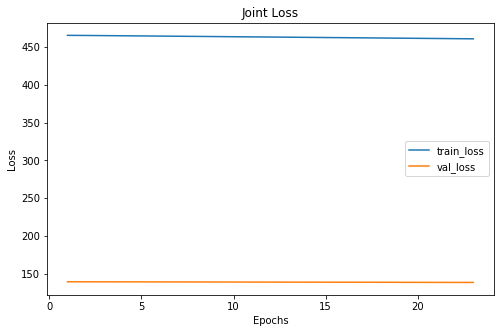

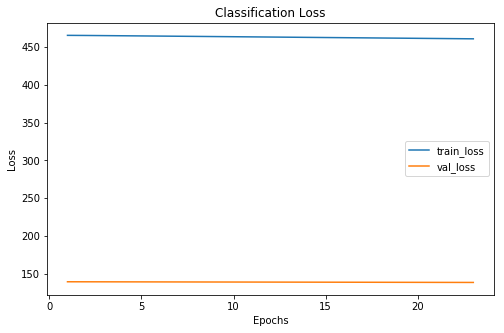

  9%|▉         | 23/250 [02:32<25:14,  6.67s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    177      52
      1     90      30
      2    152      44
Score This Epoch: 0.39222045063204714 Best Score: 0.39222045063204714
xxxxxxxxxxxxxx epoch: 23 xxxxxxxxxxxxxx


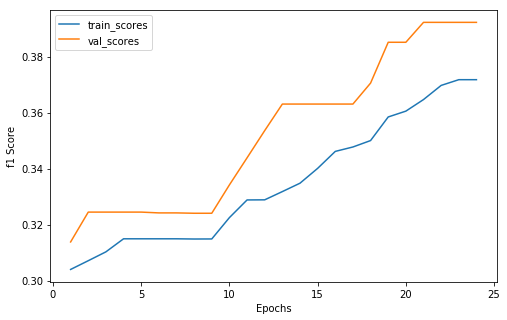

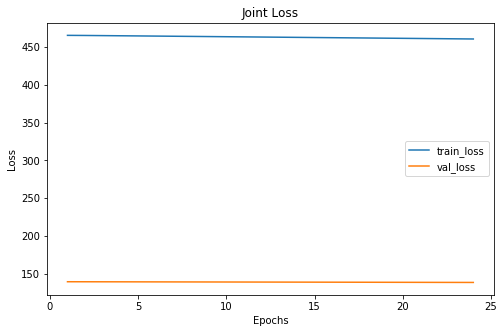

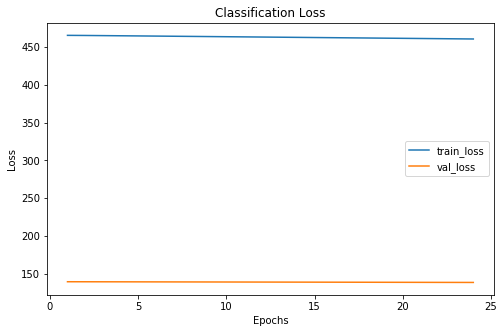

 10%|▉         | 24/250 [02:39<25:27,  6.76s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    177      52
      1     90      30
      2    152      44
Score This Epoch: 0.39222045063204714 Best Score: 0.39222045063204714
xxxxxxxxxxxxxx epoch: 24 xxxxxxxxxxxxxx


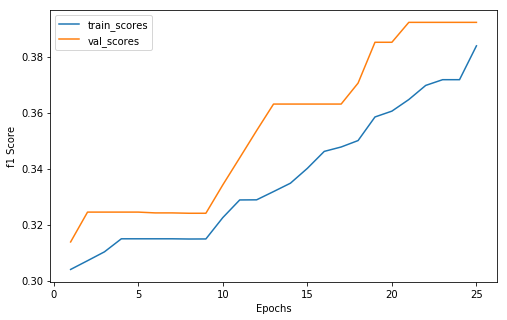

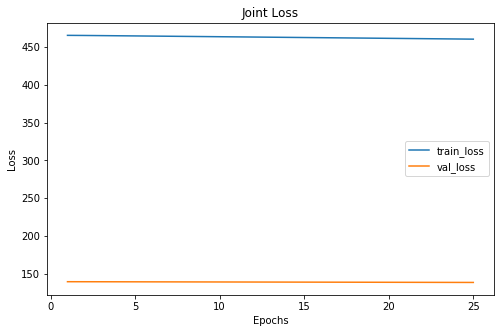

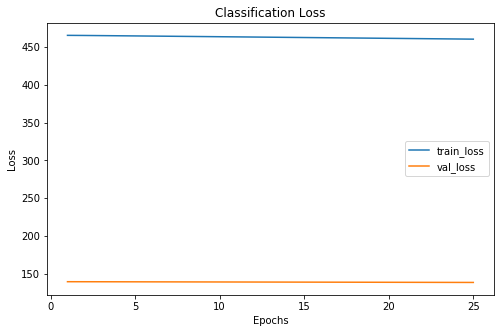

 10%|█         | 25/250 [02:45<24:51,  6.63s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    171      52
      1     90      30
      2    158      44
Score This Epoch: 0.39222045063204714 Best Score: 0.39222045063204714
xxxxxxxxxxxxxx epoch: 25 xxxxxxxxxxxxxx


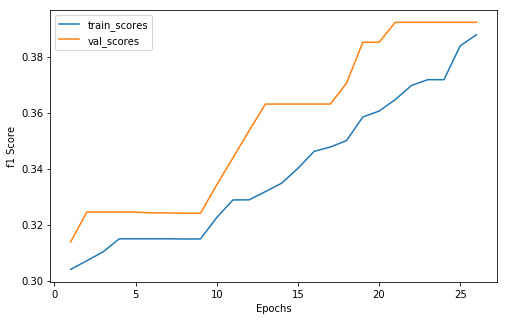

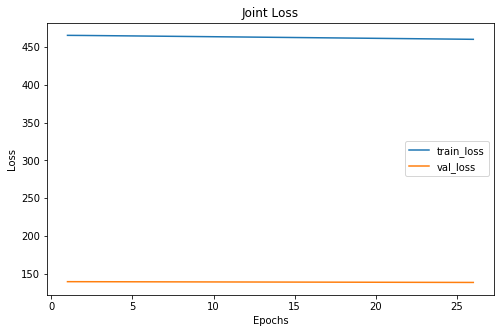

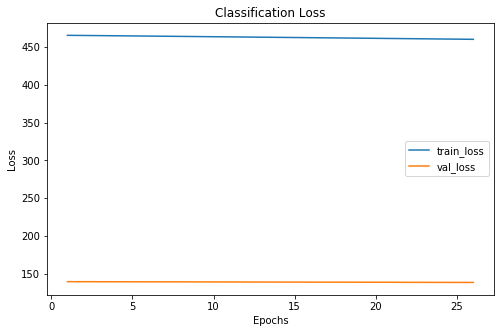

 10%|█         | 26/250 [02:52<24:52,  6.66s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    169      52
      1     90      30
      2    160      44
Score This Epoch: 0.39222045063204714 Best Score: 0.39222045063204714
xxxxxxxxxxxxxx epoch: 26 xxxxxxxxxxxxxx


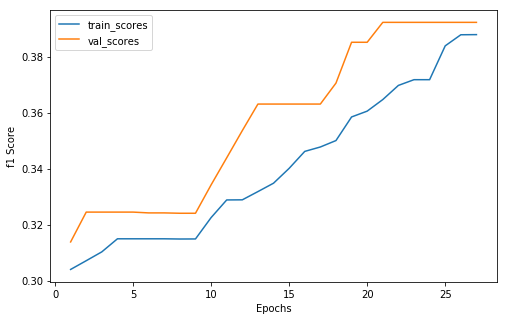

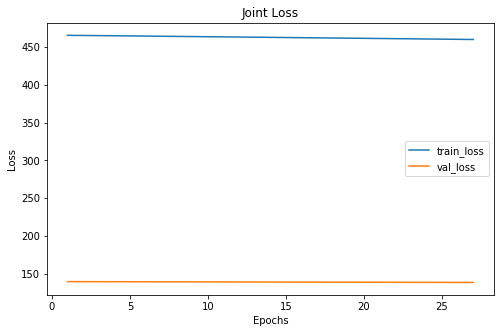

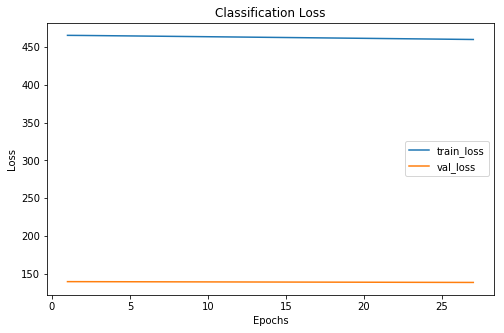

 11%|█         | 27/250 [02:58<24:35,  6.62s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  14  12
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    168      52
      1     90      30
      2    161      44
Score This Epoch: 0.39222045063204714 Best Score: 0.39222045063204714
xxxxxxxxxxxxxx epoch: 27 xxxxxxxxxxxxxx


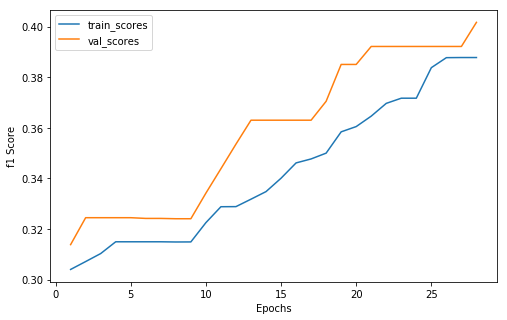

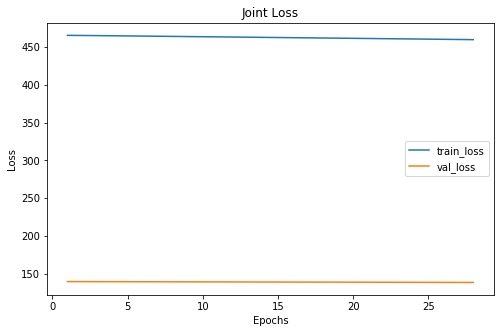

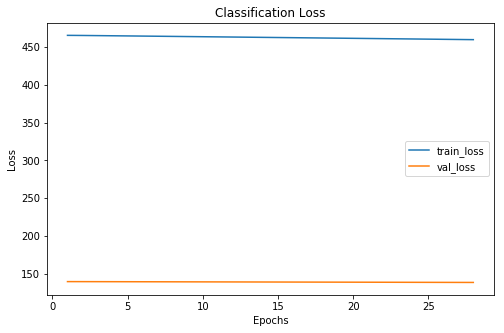

 11%|█         | 28/250 [03:05<24:55,  6.74s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  15  11
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    168      52
      1     90      31
      2    161      43
Score This Epoch: 0.401756817921579 Best Score: 0.401756817921579
xxxxxxxxxxxxxx epoch: 28 xxxxxxxxxxxxxx


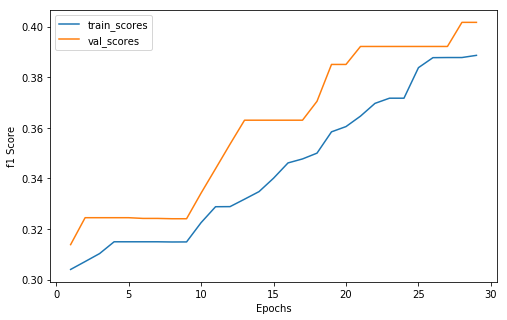

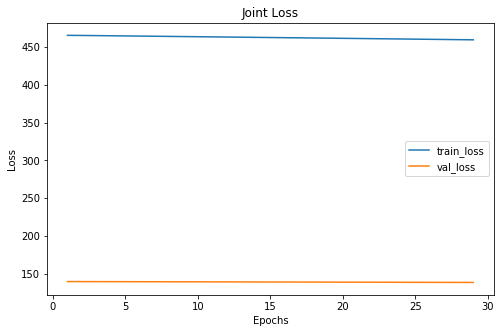

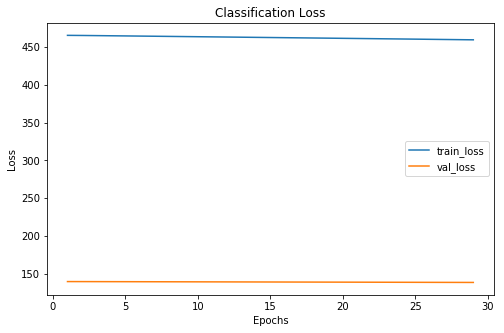

 12%|█▏        | 29/250 [03:12<24:33,  6.67s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  15  11
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    167      52
      1     91      31
      2    161      43
Score This Epoch: 0.401756817921579 Best Score: 0.401756817921579
xxxxxxxxxxxxxx epoch: 29 xxxxxxxxxxxxxx


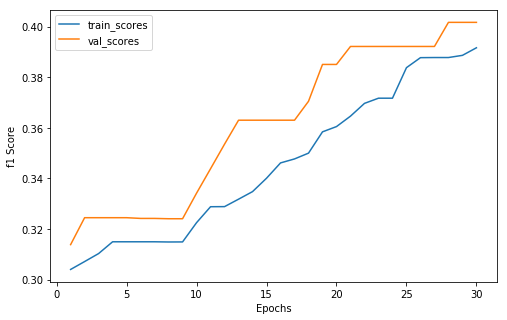

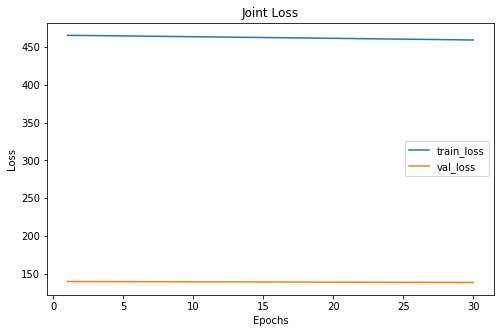

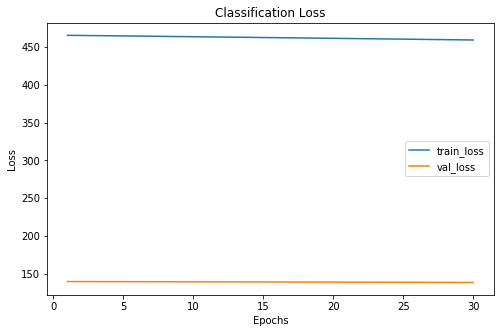

 12%|█▏        | 30/250 [03:19<24:41,  6.73s/it]

Cofusion Matrix For Val Set: 
--  --  --
19   7  15
23  15  11
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    167      52
      1     92      31
      2    160      43
Score This Epoch: 0.401756817921579 Best Score: 0.401756817921579
xxxxxxxxxxxxxx epoch: 30 xxxxxxxxxxxxxx


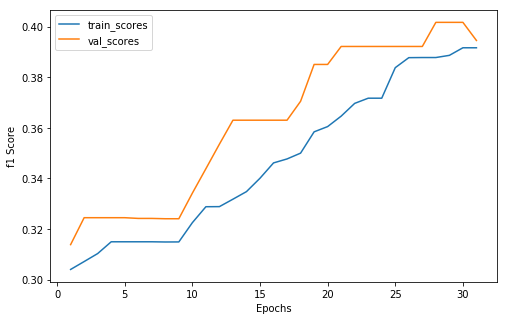

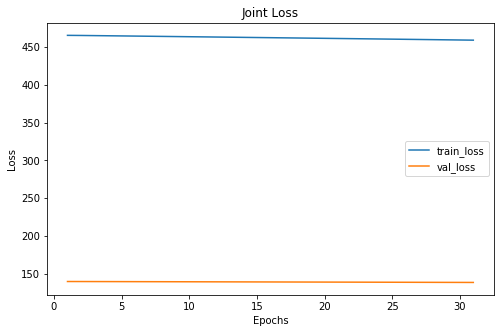

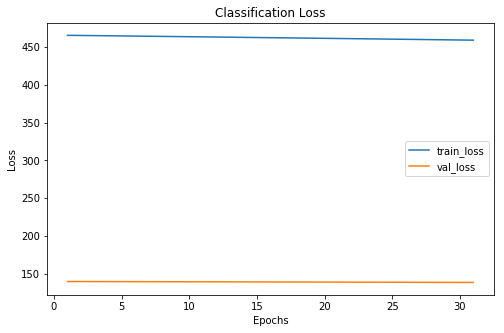

 12%|█▏        | 31/250 [03:25<24:32,  6.72s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
23  15  11
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    167      51
      1     92      31
      2    160      44
Score This Epoch: 0.39459109730848857 Best Score: 0.401756817921579
xxxxxxxxxxxxxx epoch: 31 xxxxxxxxxxxxxx


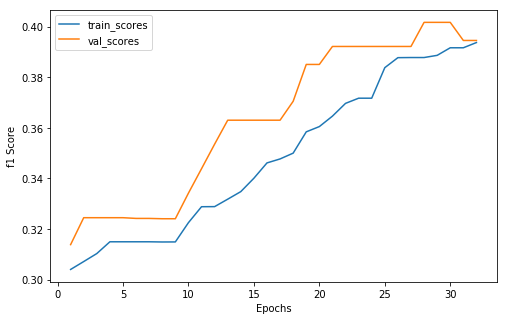

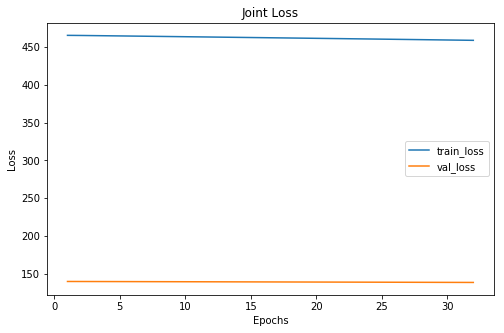

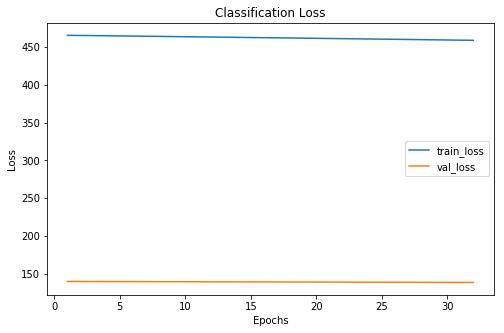

 13%|█▎        | 32/250 [03:31<23:45,  6.54s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
23  15  11
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    164      51
      1     92      31
      2    163      44
Score This Epoch: 0.39459109730848857 Best Score: 0.401756817921579
xxxxxxxxxxxxxx epoch: 32 xxxxxxxxxxxxxx


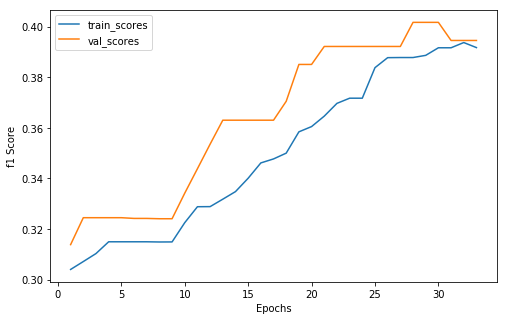

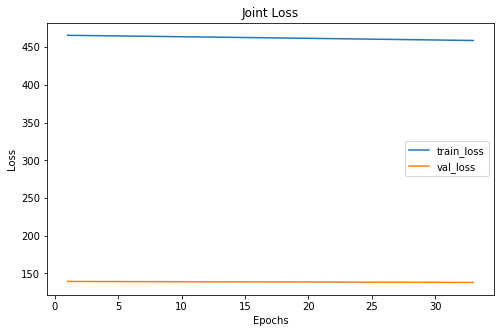

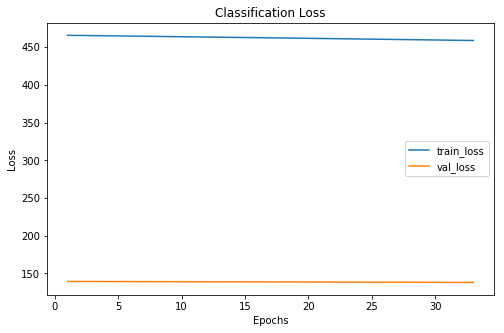

 13%|█▎        | 33/250 [03:38<23:27,  6.49s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
23  15  11
10   9  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    164      51
      1     93      31
      2    162      44
Score This Epoch: 0.39459109730848857 Best Score: 0.401756817921579
xxxxxxxxxxxxxx epoch: 33 xxxxxxxxxxxxxx


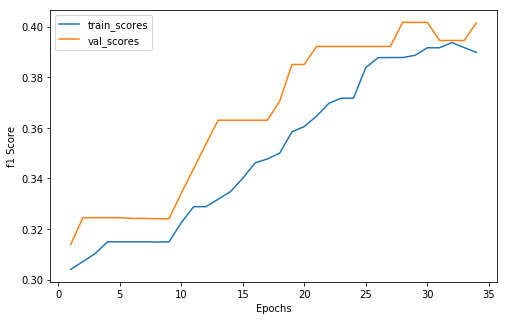

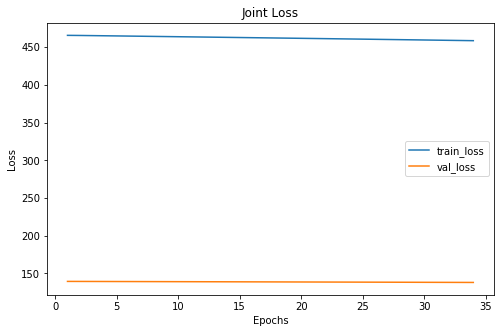

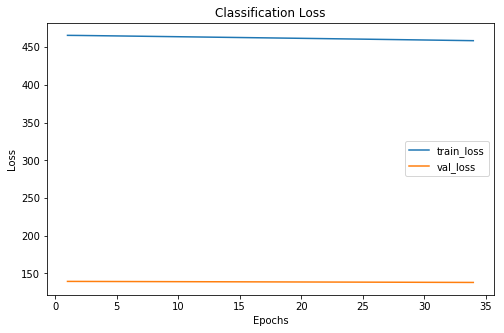

 14%|█▎        | 34/250 [03:44<23:15,  6.46s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
23  15  11
 9   9  18
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    159      50
      1     93      31
      2    167      45
Score This Epoch: 0.40154587476016046 Best Score: 0.401756817921579
xxxxxxxxxxxxxx epoch: 34 xxxxxxxxxxxxxx


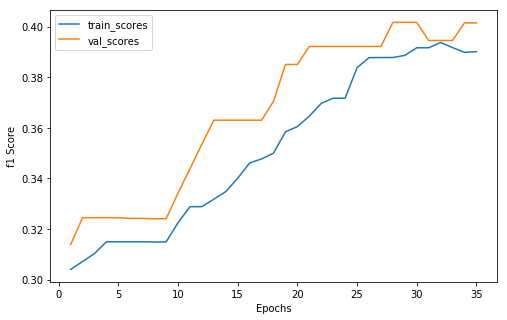

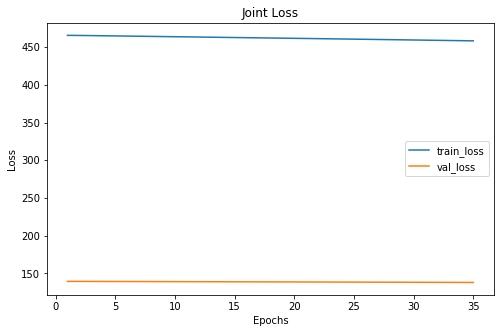

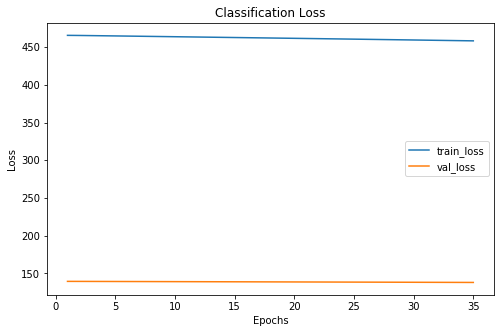

 14%|█▍        | 35/250 [03:50<22:57,  6.41s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
23  15  11
 9   9  18
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    156      50
      1     93      31
      2    170      45
Score This Epoch: 0.40154587476016046 Best Score: 0.401756817921579
xxxxxxxxxxxxxx epoch: 35 xxxxxxxxxxxxxx


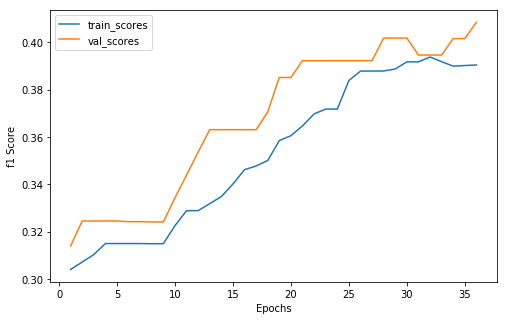

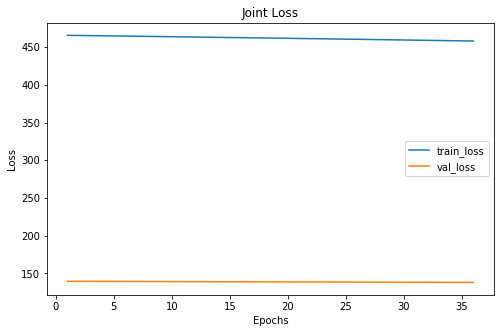

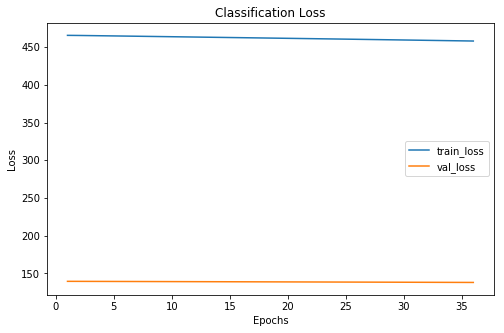

 14%|█▍        | 36/250 [03:57<23:30,  6.59s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
23  15  11
 8   9  19
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    154      49
      1     93      31
      2    172      46
Score This Epoch: 0.4083962446767326 Best Score: 0.4083962446767326
xxxxxxxxxxxxxx epoch: 36 xxxxxxxxxxxxxx


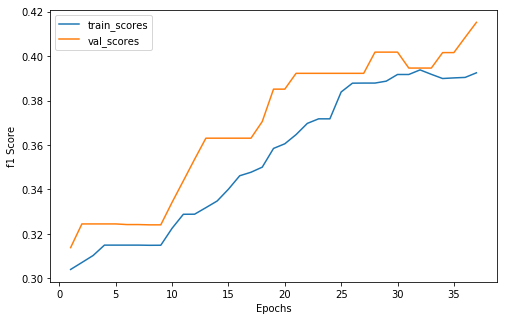

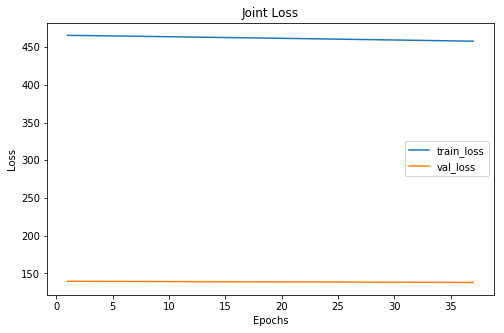

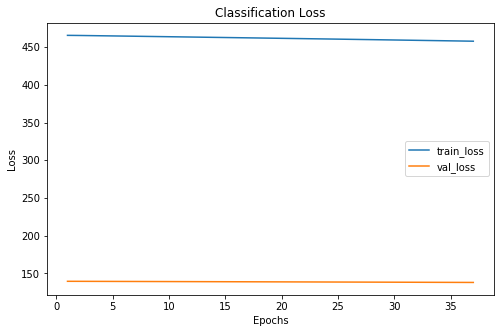

 15%|█▍        | 37/250 [04:04<23:50,  6.72s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
23  15  11
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    152      48
      1     93      31
      2    174      47
Score This Epoch: 0.4151481528038317 Best Score: 0.4151481528038317
xxxxxxxxxxxxxx epoch: 37 xxxxxxxxxxxxxx


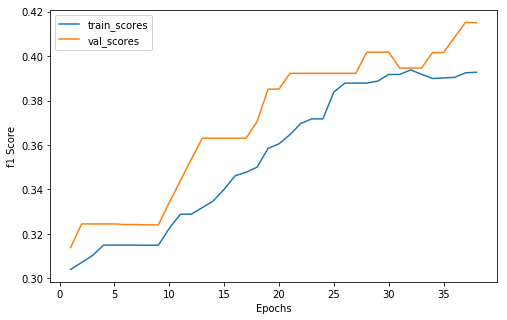

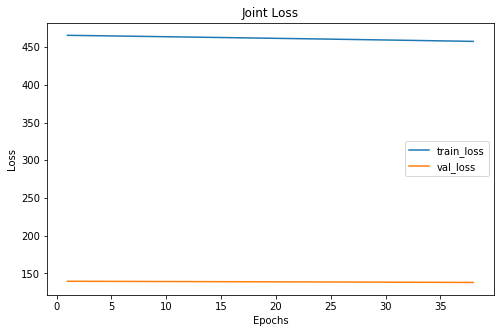

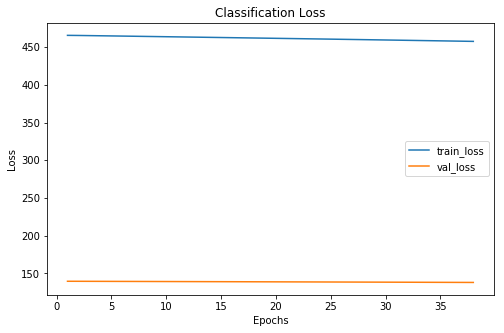

 15%|█▌        | 38/250 [04:11<23:14,  6.58s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
22  15  12
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    150      47
      1     93      31
      2    176      48
Score This Epoch: 0.41500463821892397 Best Score: 0.4151481528038317
xxxxxxxxxxxxxx epoch: 38 xxxxxxxxxxxxxx


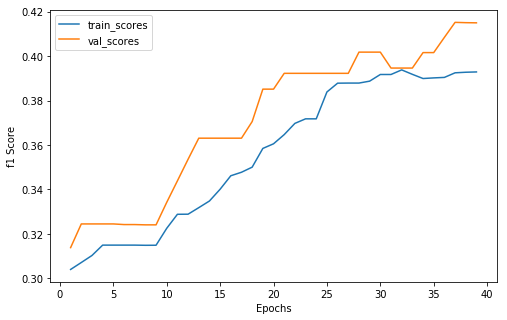

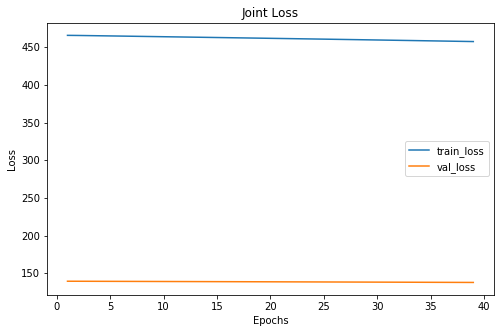

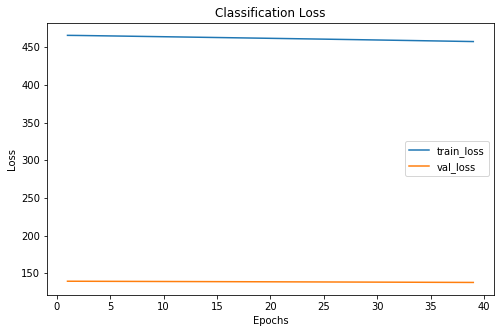

 16%|█▌        | 39/250 [04:18<23:25,  6.66s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
21  15  13
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    149      46
      1     93      31
      2    177      49
Score This Epoch: 0.4149340770791075 Best Score: 0.4151481528038317
xxxxxxxxxxxxxx epoch: 39 xxxxxxxxxxxxxx


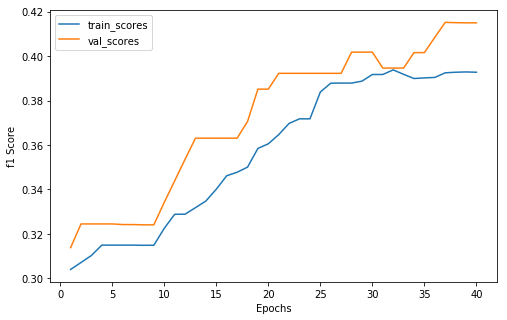

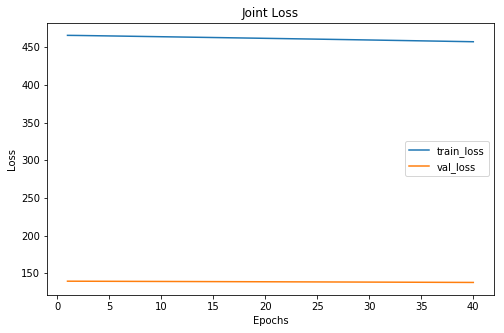

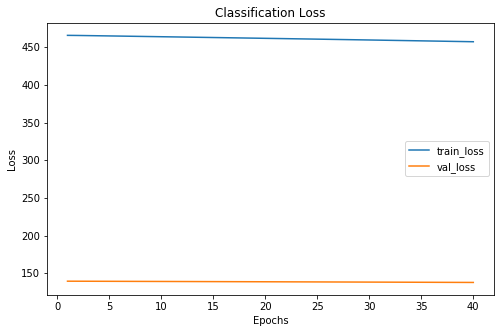

 16%|█▌        | 40/250 [04:25<23:53,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
21  15  13
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    146      46
      1     93      31
      2    180      49
Score This Epoch: 0.4149340770791075 Best Score: 0.4151481528038317
xxxxxxxxxxxxxx epoch: 40 xxxxxxxxxxxxxx


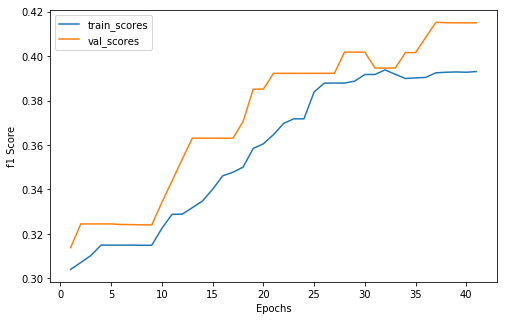

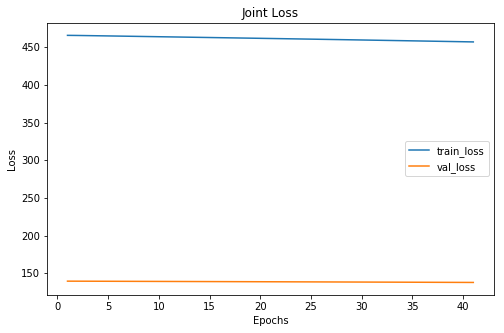

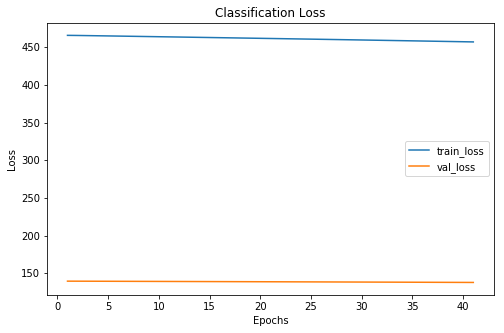

 16%|█▋        | 41/250 [04:32<23:50,  6.84s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
21  15  13
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    144      46
      1     93      31
      2    182      49
Score This Epoch: 0.4149340770791075 Best Score: 0.4151481528038317
xxxxxxxxxxxxxx epoch: 41 xxxxxxxxxxxxxx


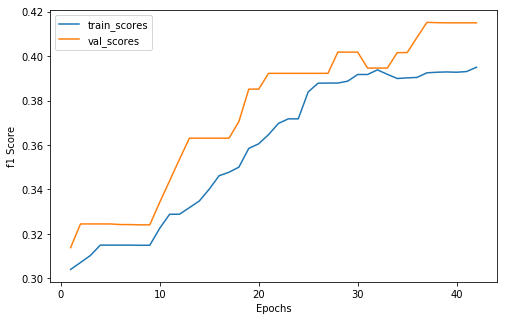

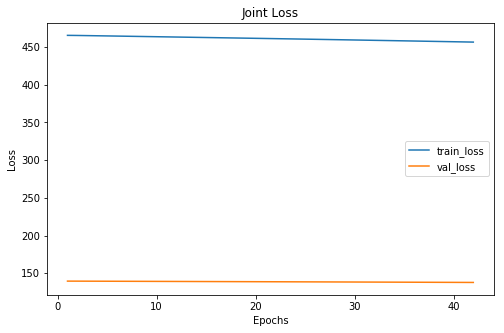

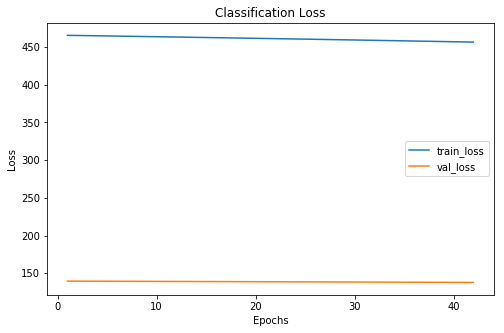

 17%|█▋        | 42/250 [04:39<23:45,  6.86s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
21  15  13
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    143      46
      1     93      31
      2    183      49
Score This Epoch: 0.4149340770791075 Best Score: 0.4151481528038317
xxxxxxxxxxxxxx epoch: 42 xxxxxxxxxxxxxx


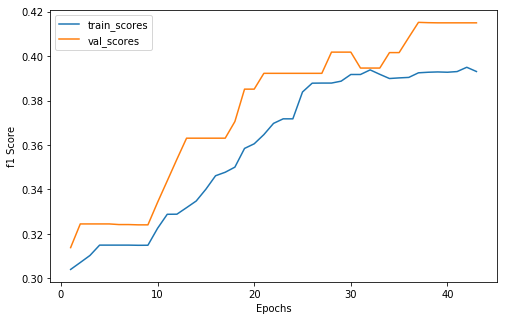

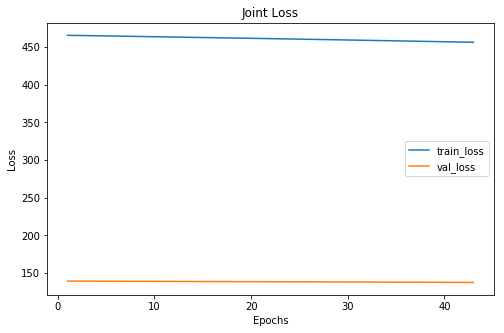

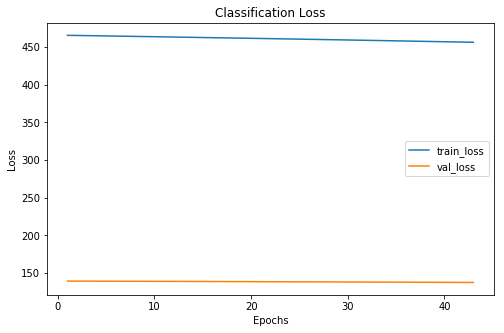

 17%|█▋        | 43/250 [04:46<24:27,  7.09s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
21  15  13
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    143      46
      1     94      31
      2    182      49
Score This Epoch: 0.4149340770791075 Best Score: 0.4151481528038317
xxxxxxxxxxxxxx epoch: 43 xxxxxxxxxxxxxx


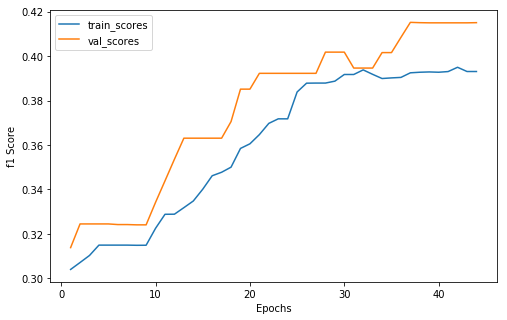

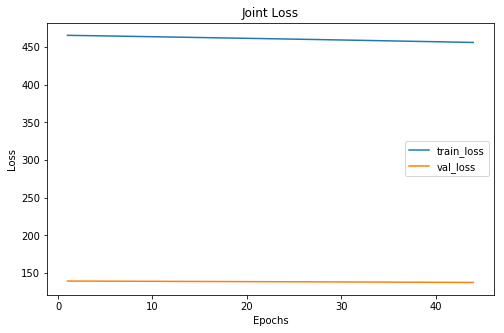

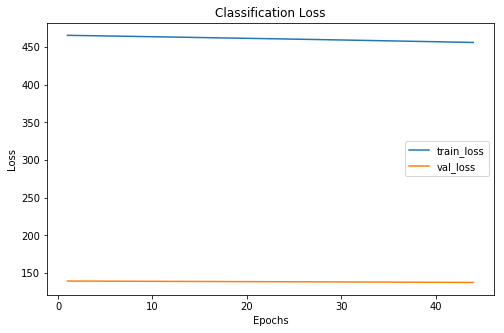

 18%|█▊        | 44/250 [04:53<23:52,  6.95s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
19  15  15
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    143      44
      1     94      31
      2    182      51
Score This Epoch: 0.4150113493673332 Best Score: 0.4151481528038317
xxxxxxxxxxxxxx epoch: 44 xxxxxxxxxxxxxx


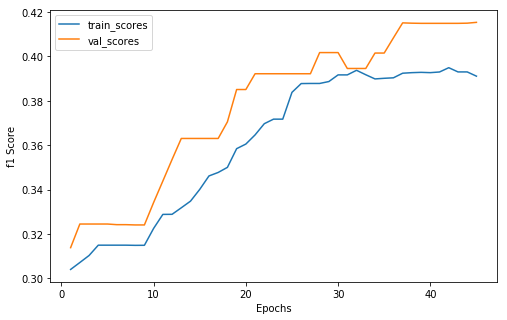

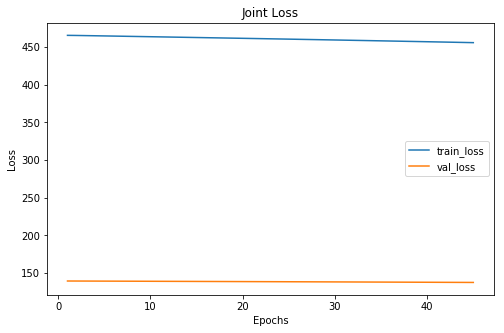

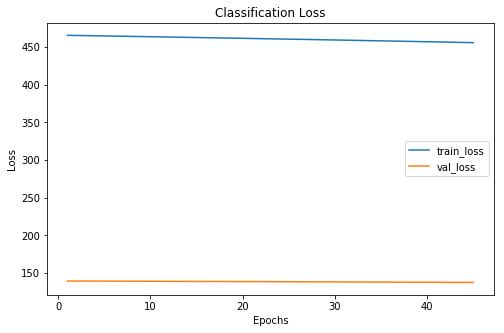

 18%|█▊        | 45/250 [05:00<23:34,  6.90s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
17  15  17
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    140      42
      1     94      31
      2    185      53
Score This Epoch: 0.4153802207223759 Best Score: 0.4153802207223759
xxxxxxxxxxxxxx epoch: 45 xxxxxxxxxxxxxx


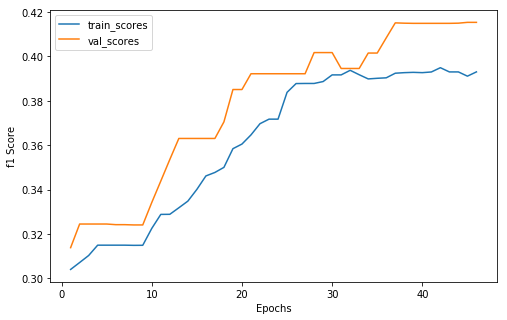

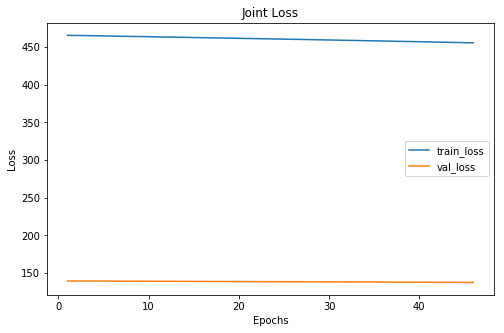

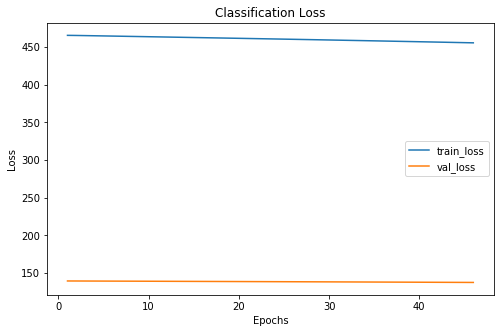

 18%|█▊        | 46/250 [05:06<23:10,  6.82s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
17  15  17
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    139      42
      1     94      31
      2    186      53
Score This Epoch: 0.4153802207223759 Best Score: 0.4153802207223759
xxxxxxxxxxxxxx epoch: 46 xxxxxxxxxxxxxx


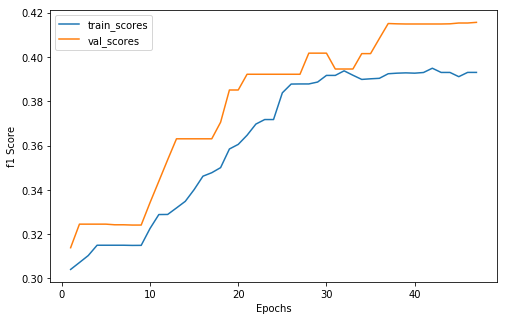

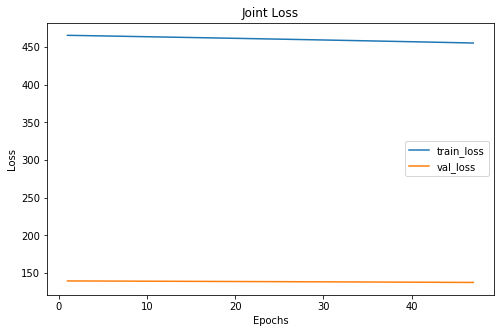

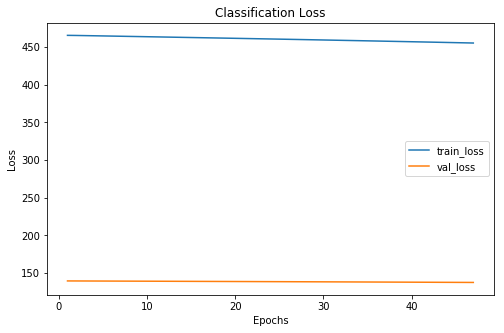

 19%|█▉        | 47/250 [05:13<22:42,  6.71s/it]

Cofusion Matrix For Val Set: 
--  --  --
18   7  16
16  15  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    139      41
      1     94      31
      2    186      54
Score This Epoch: 0.4156746031746032 Best Score: 0.4156746031746032
xxxxxxxxxxxxxx epoch: 47 xxxxxxxxxxxxxx


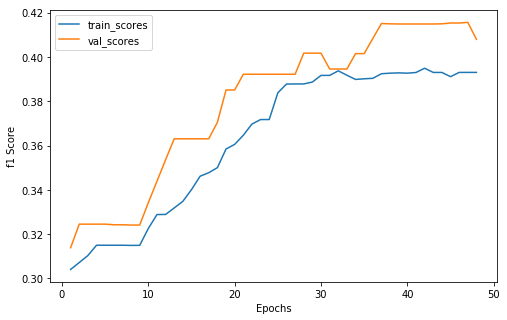

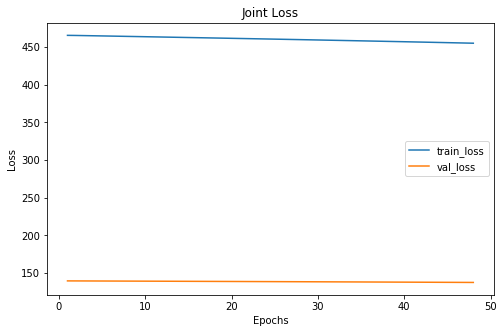

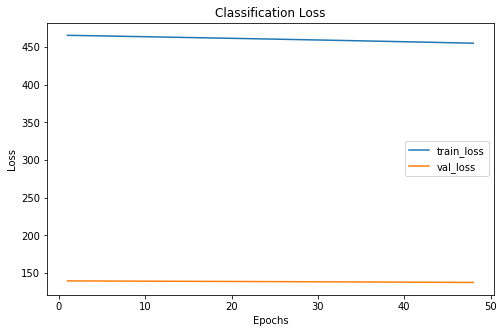

 19%|█▉        | 48/250 [05:20<22:47,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
16  15  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    139      40
      1     94      31
      2    186      55
Score This Epoch: 0.40800835212210873 Best Score: 0.4156746031746032
xxxxxxxxxxxxxx epoch: 48 xxxxxxxxxxxxxx


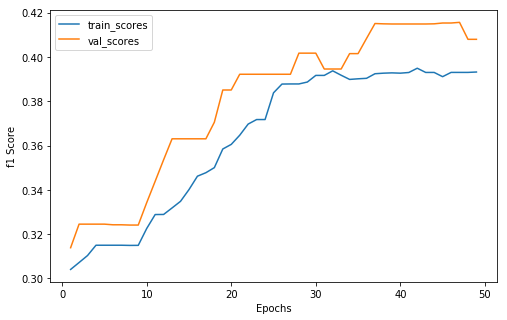

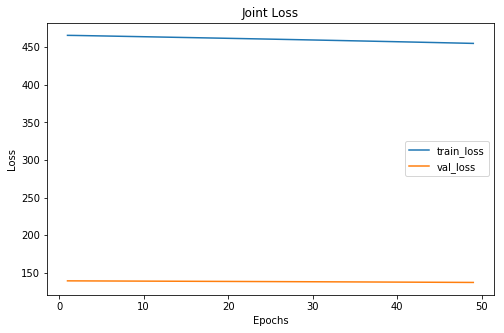

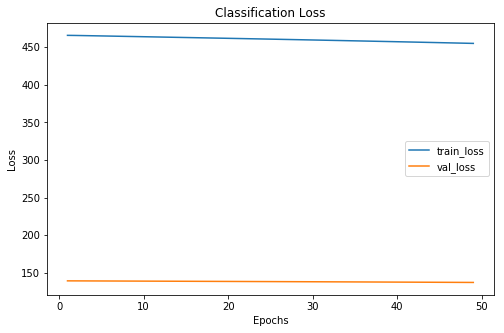

 20%|█▉        | 49/250 [05:27<22:54,  6.84s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
16  15  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    138      40
      1     94      31
      2    187      55
Score This Epoch: 0.40800835212210873 Best Score: 0.4156746031746032
xxxxxxxxxxxxxx epoch: 49 xxxxxxxxxxxxxx


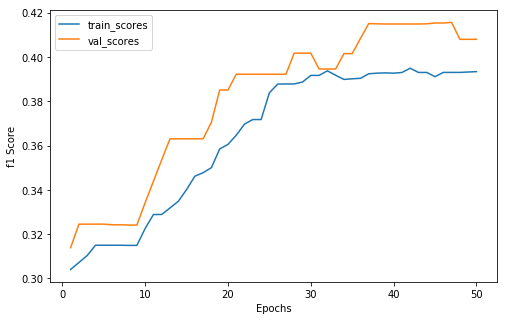

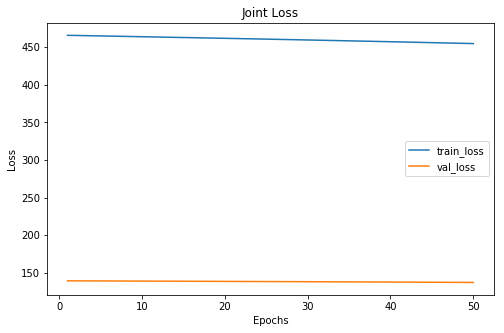

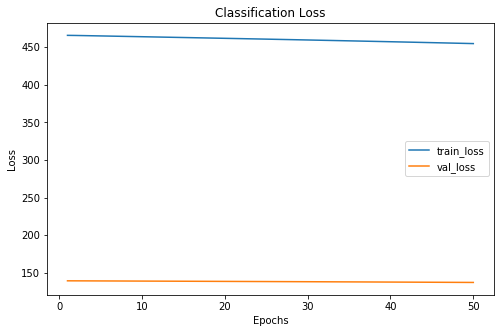

 20%|██        | 50/250 [05:34<22:54,  6.87s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
16  15  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    137      40
      1     94      31
      2    188      55
Score This Epoch: 0.40800835212210873 Best Score: 0.4156746031746032
xxxxxxxxxxxxxx epoch: 50 xxxxxxxxxxxxxx


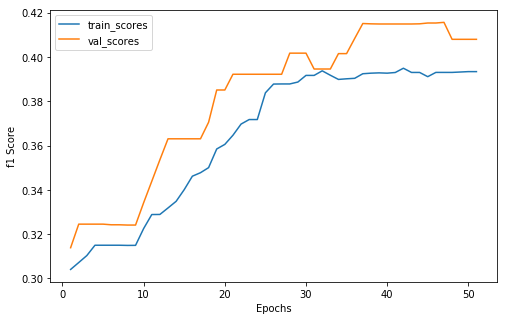

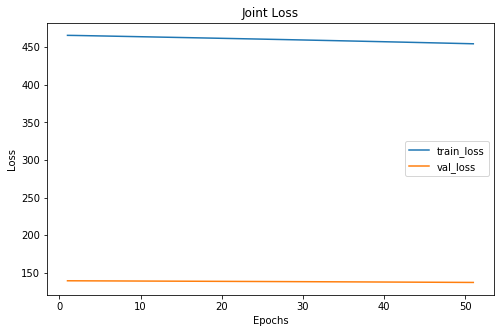

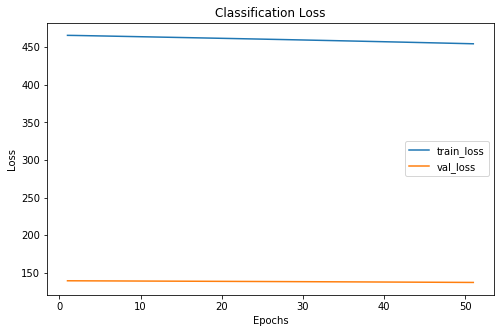

 20%|██        | 51/250 [05:40<22:36,  6.82s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
16  15  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    137      40
      1     94      31
      2    188      55
Score This Epoch: 0.40800835212210873 Best Score: 0.4156746031746032
xxxxxxxxxxxxxx epoch: 51 xxxxxxxxxxxxxx


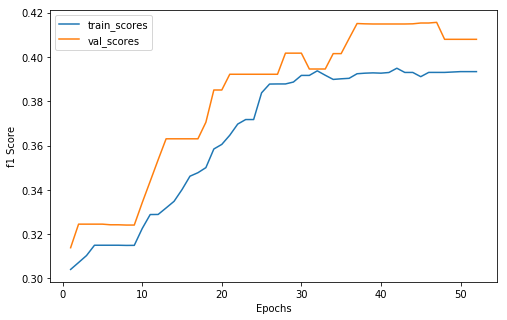

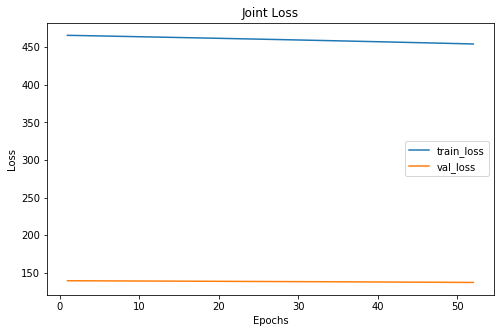

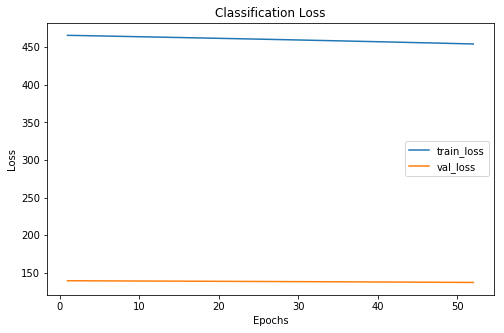

 21%|██        | 52/250 [05:47<22:21,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
16  15  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    137      40
      1     94      31
      2    188      55
Score This Epoch: 0.40800835212210873 Best Score: 0.4156746031746032
xxxxxxxxxxxxxx epoch: 52 xxxxxxxxxxxxxx


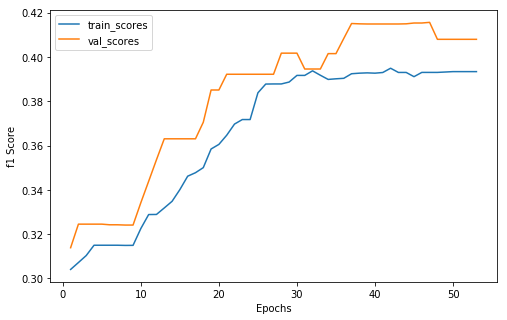

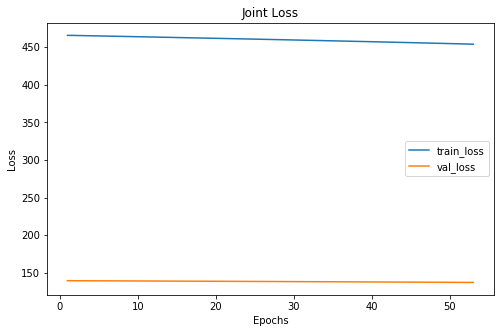

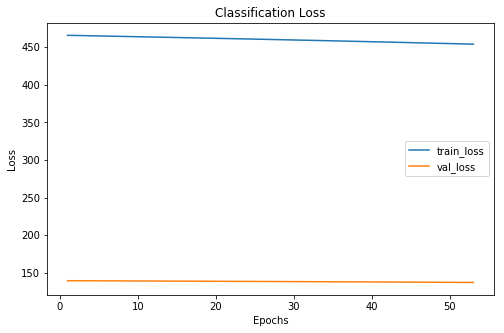

 21%|██        | 53/250 [05:54<22:15,  6.78s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
16  15  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    137      40
      1     94      31
      2    188      55
Score This Epoch: 0.40800835212210873 Best Score: 0.4156746031746032
xxxxxxxxxxxxxx epoch: 53 xxxxxxxxxxxxxx


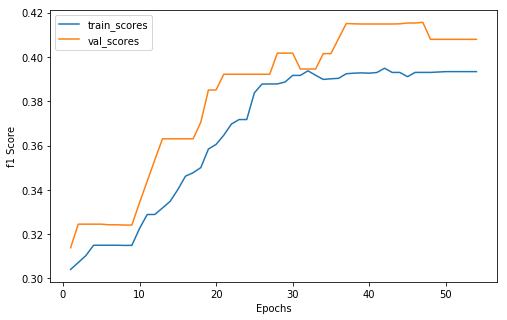

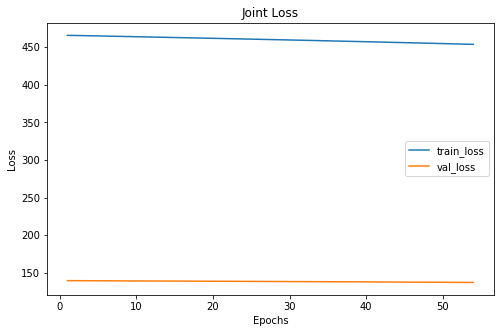

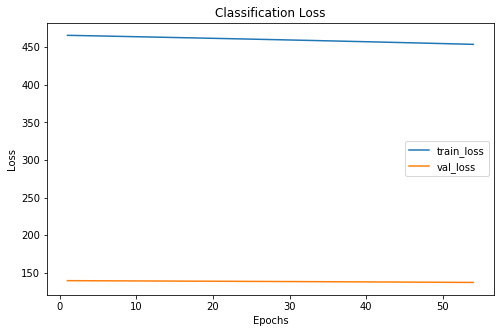

 22%|██▏       | 54/250 [06:00<21:51,  6.69s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
16  15  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    137      40
      1     94      31
      2    188      55
Score This Epoch: 0.40800835212210873 Best Score: 0.4156746031746032
xxxxxxxxxxxxxx epoch: 54 xxxxxxxxxxxxxx


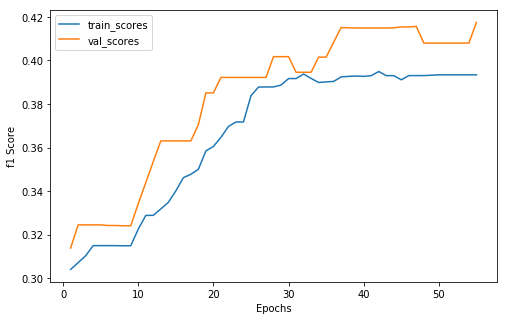

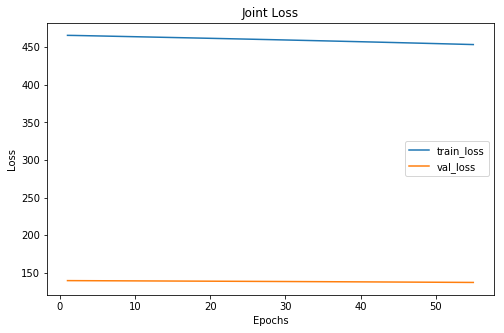

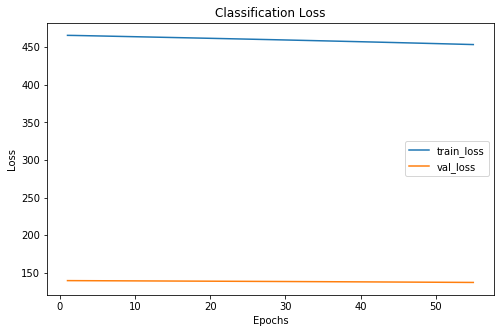

 22%|██▏       | 55/250 [06:07<21:46,  6.70s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
15  16  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    137      39
      1     94      32
      2    188      55
Score This Epoch: 0.4175174644089988 Best Score: 0.4175174644089988
xxxxxxxxxxxxxx epoch: 55 xxxxxxxxxxxxxx


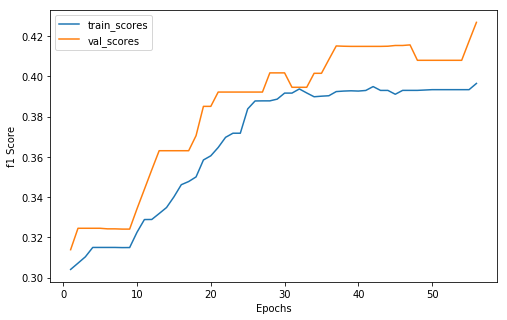

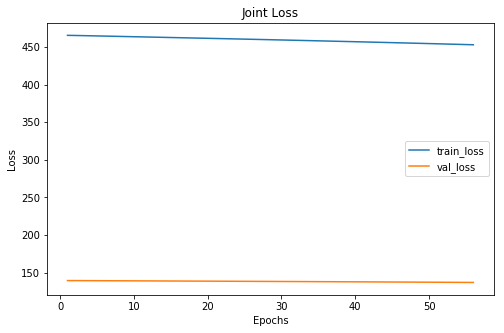

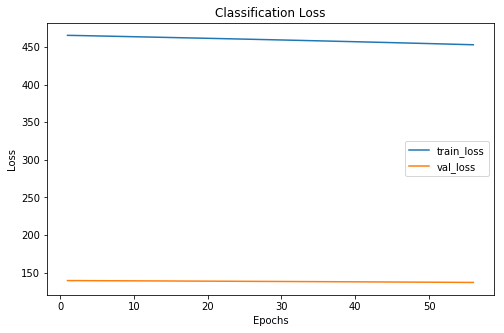

 22%|██▏       | 56/250 [06:14<21:55,  6.78s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    136      38
      1     95      33
      2    188      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 56 xxxxxxxxxxxxxx


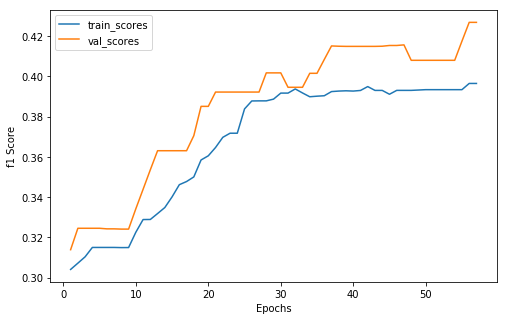

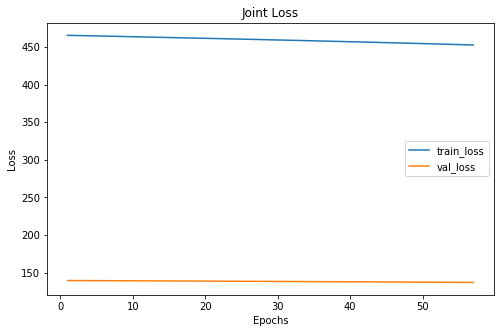

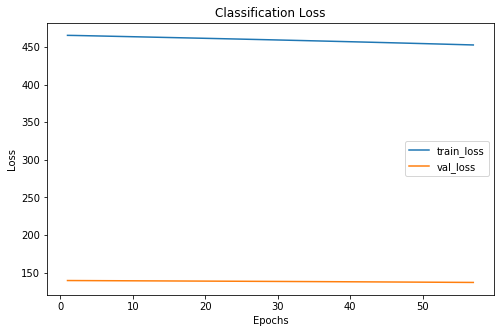

 23%|██▎       | 57/250 [06:20<21:21,  6.64s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    136      38
      1     95      33
      2    188      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 57 xxxxxxxxxxxxxx


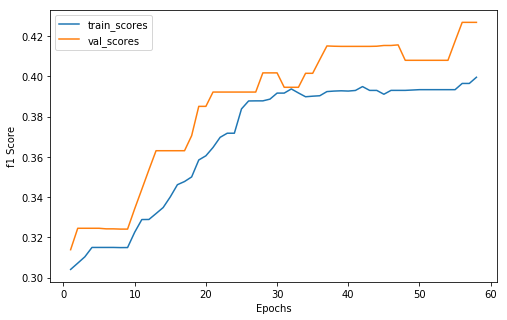

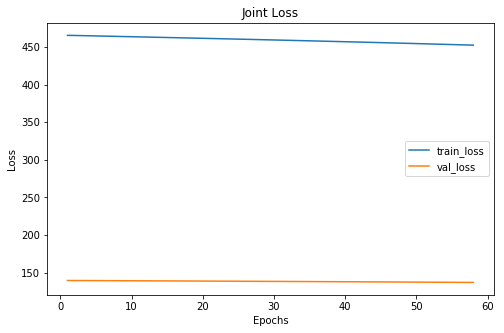

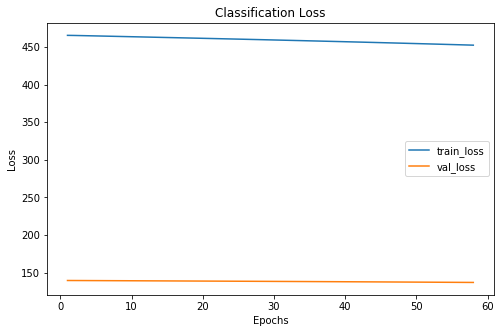

 23%|██▎       | 58/250 [06:27<21:26,  6.70s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    135      38
      1     96      33
      2    188      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 58 xxxxxxxxxxxxxx


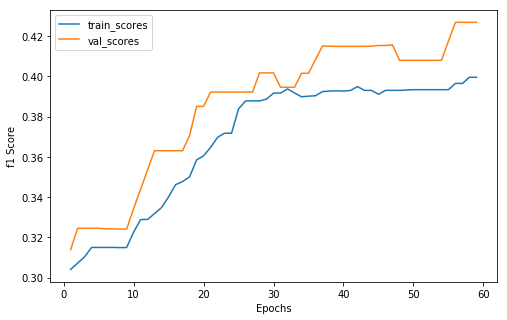

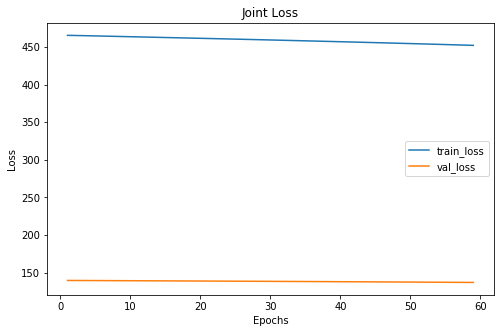

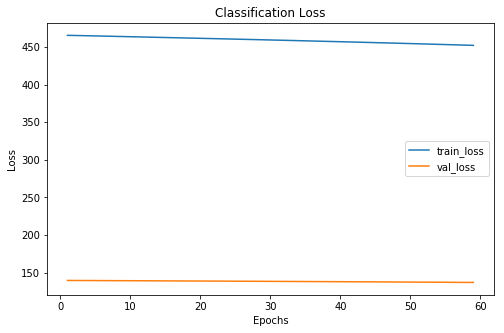

 24%|██▎       | 59/250 [06:34<21:45,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    135      38
      1     96      33
      2    188      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 59 xxxxxxxxxxxxxx


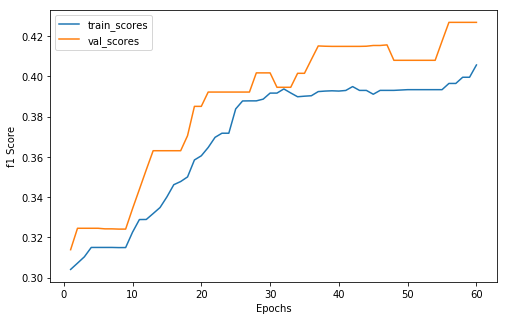

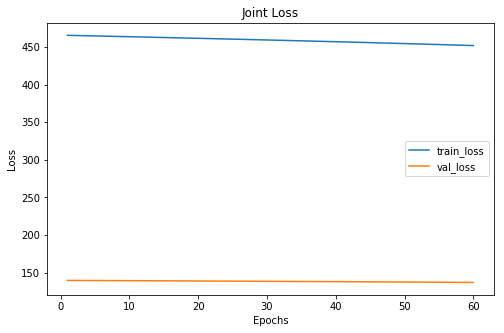

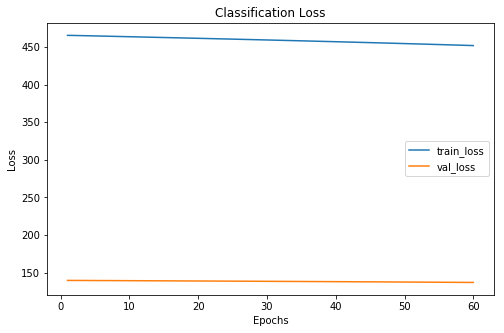

 24%|██▍       | 60/250 [06:41<21:26,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    133      38
      1     98      33
      2    188      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 60 xxxxxxxxxxxxxx


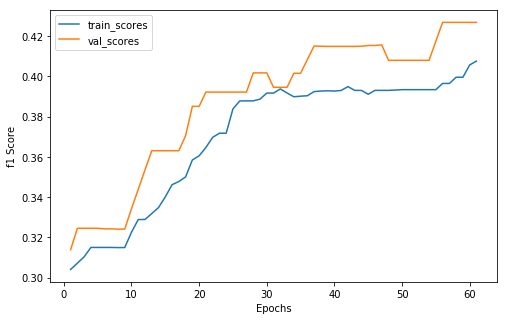

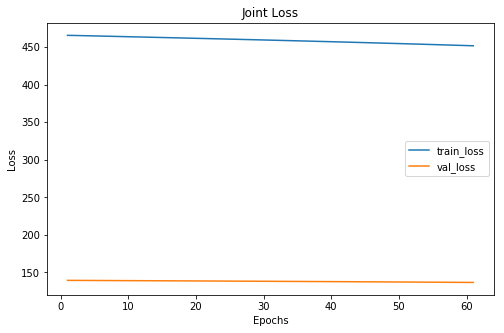

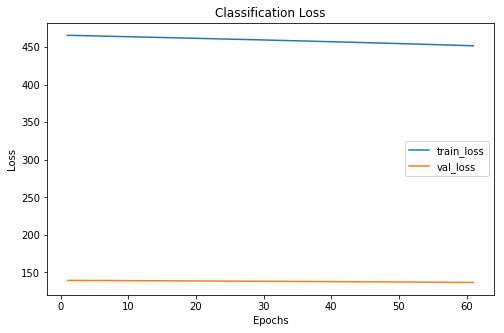

 24%|██▍       | 61/250 [06:48<21:21,  6.78s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    132      38
      1     98      33
      2    189      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 61 xxxxxxxxxxxxxx


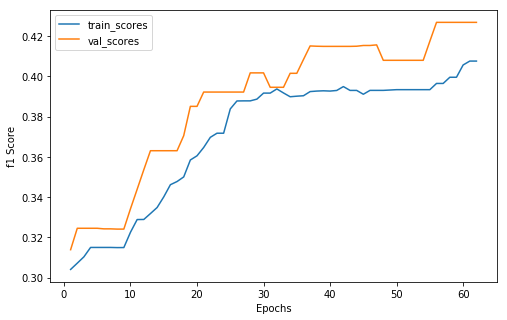

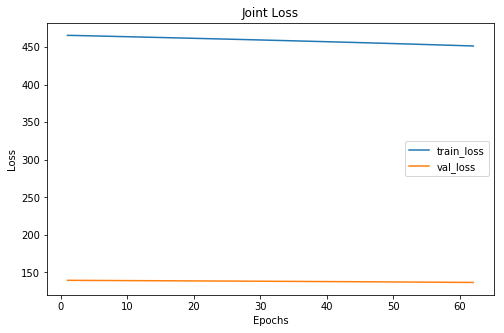

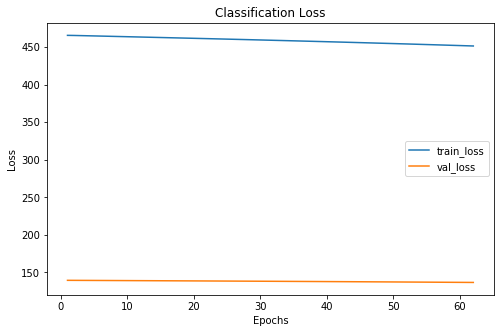

 25%|██▍       | 62/250 [06:54<21:19,  6.81s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    132      38
      1     98      33
      2    189      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 62 xxxxxxxxxxxxxx


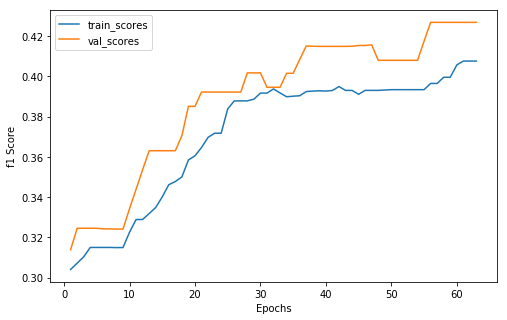

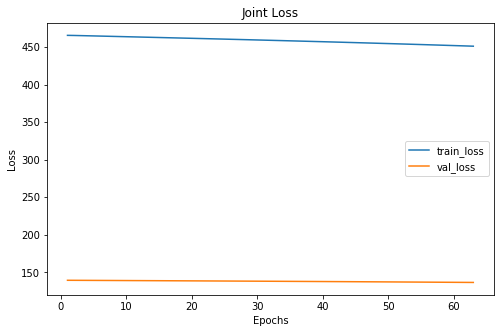

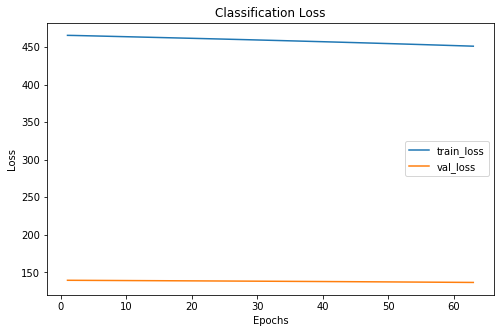

 25%|██▌       | 63/250 [07:02<21:31,  6.91s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    132      38
      1     98      33
      2    189      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 63 xxxxxxxxxxxxxx


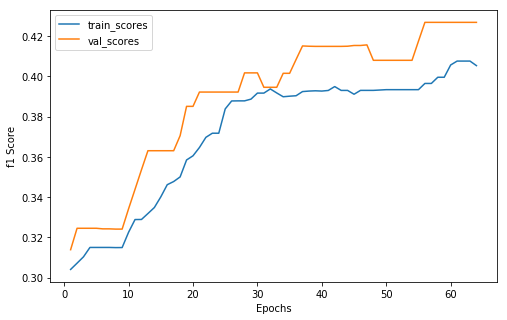

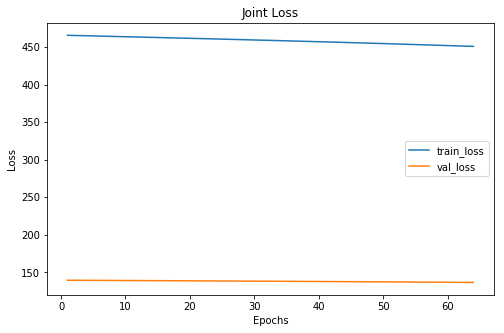

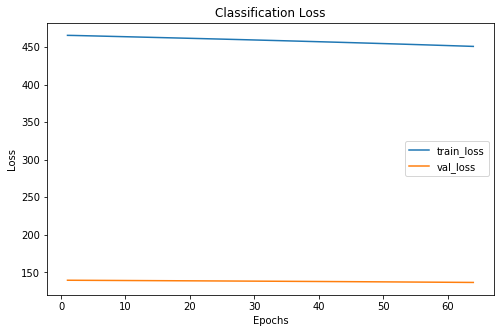

 26%|██▌       | 64/250 [07:09<21:58,  7.09s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    130      38
      1     99      33
      2    190      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 64 xxxxxxxxxxxxxx


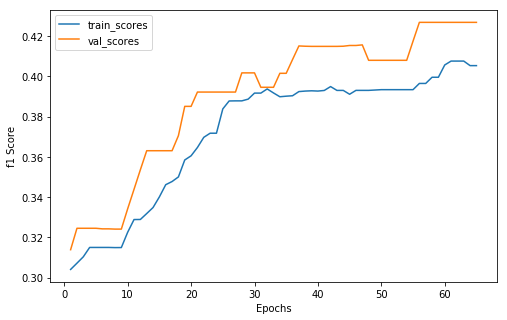

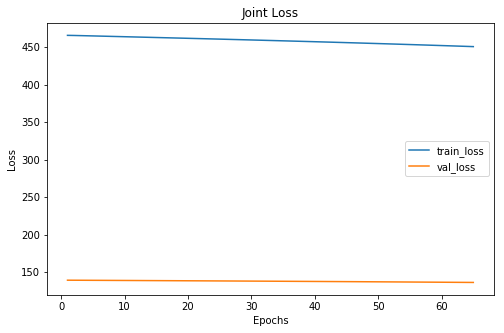

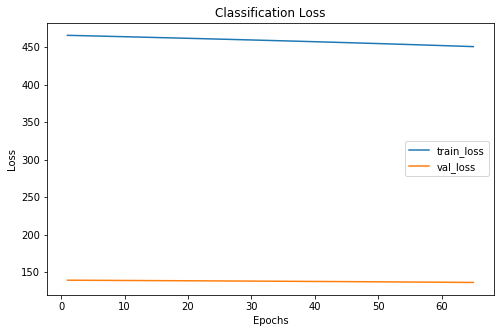

 26%|██▌       | 65/250 [07:16<22:05,  7.17s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    130      38
      1     99      33
      2    190      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 65 xxxxxxxxxxxxxx


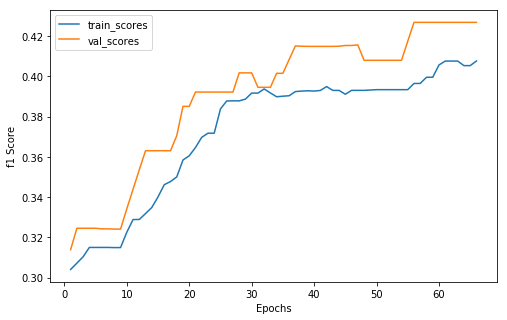

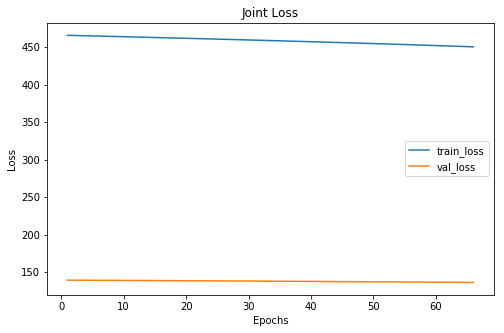

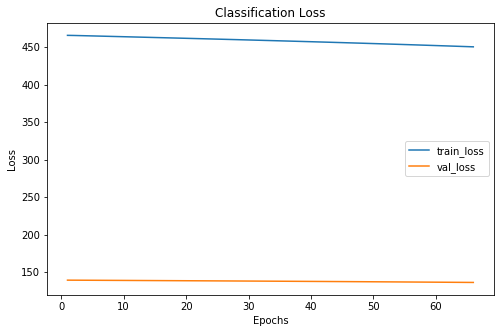

 26%|██▋       | 66/250 [07:23<21:10,  6.91s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  17  18
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    131      38
      1     99      33
      2    189      55
Score This Epoch: 0.4268795128187357 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 66 xxxxxxxxxxxxxx


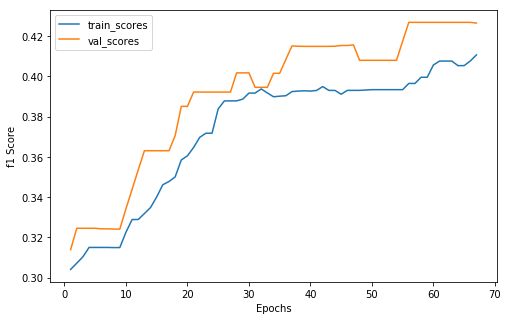

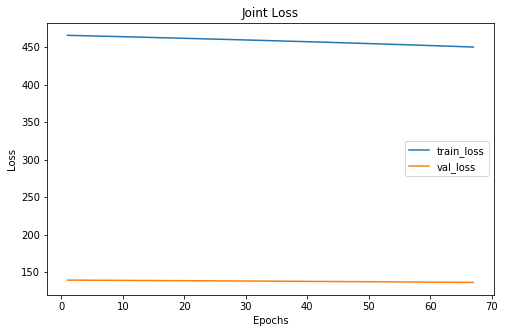

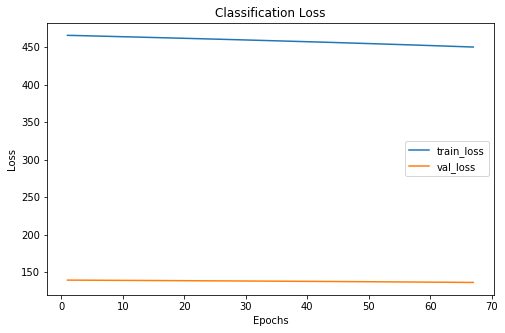

 27%|██▋       | 67/250 [07:30<21:23,  7.01s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
15  17  17
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    130      39
      1    100      33
      2    189      54
Score This Epoch: 0.4265243902439025 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 67 xxxxxxxxxxxxxx


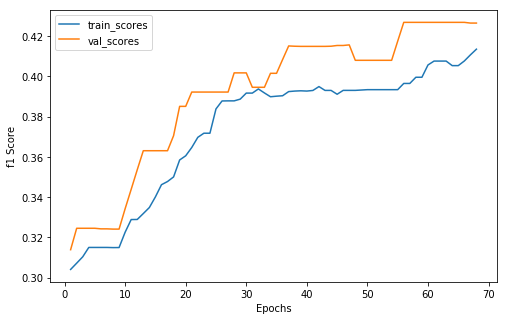

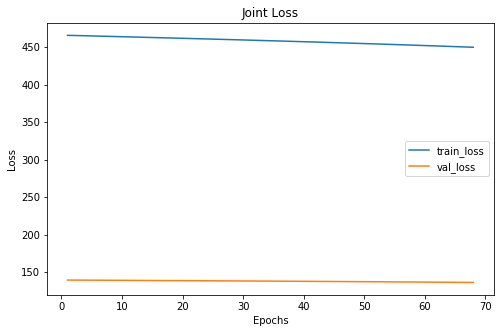

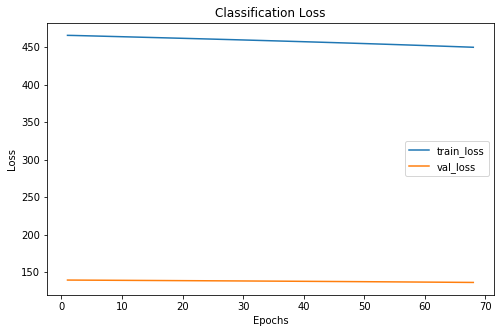

 27%|██▋       | 68/250 [07:37<21:21,  7.04s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
15  17  17
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    129      39
      1    102      33
      2    188      54
Score This Epoch: 0.4265243902439025 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 68 xxxxxxxxxxxxxx


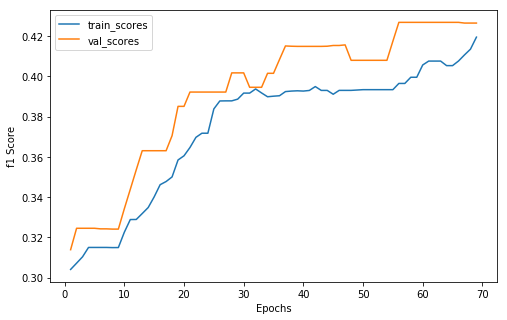

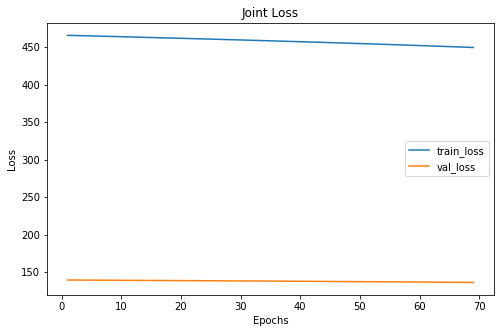

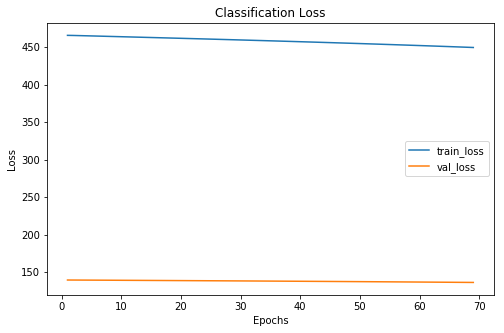

 28%|██▊       | 69/250 [07:44<20:48,  6.90s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
15  17  17
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    127      39
      1    104      33
      2    188      54
Score This Epoch: 0.4265243902439025 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 69 xxxxxxxxxxxxxx


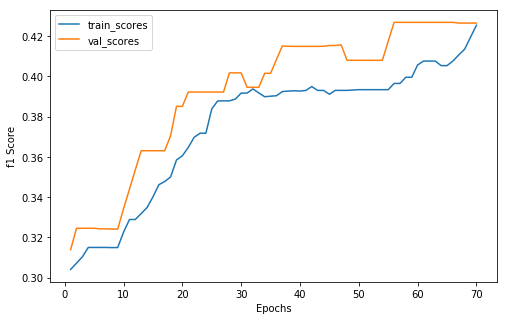

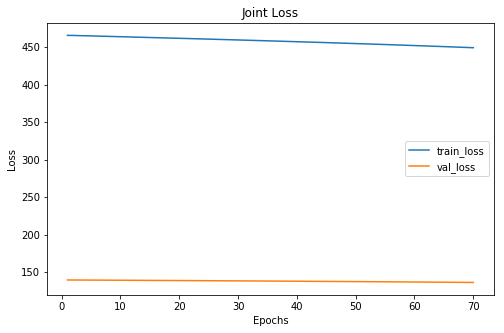

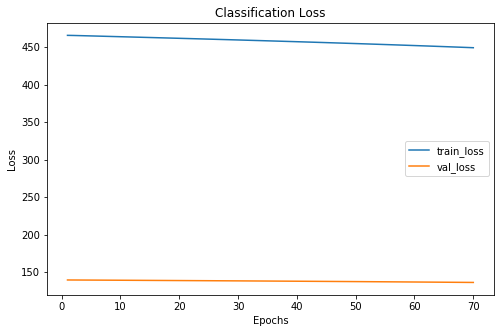

 28%|██▊       | 70/250 [07:51<20:40,  6.89s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
15  17  17
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    125      39
      1    106      33
      2    188      54
Score This Epoch: 0.4265243902439025 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 70 xxxxxxxxxxxxxx


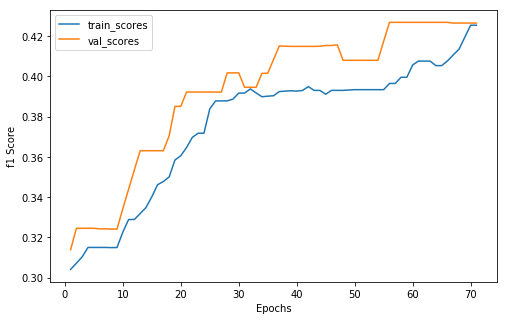

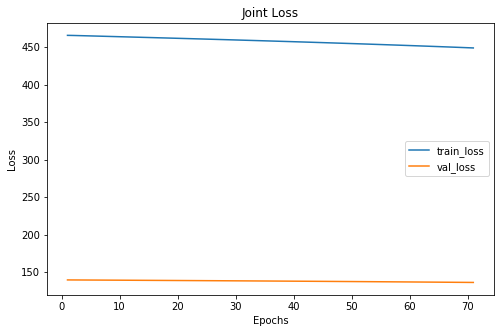

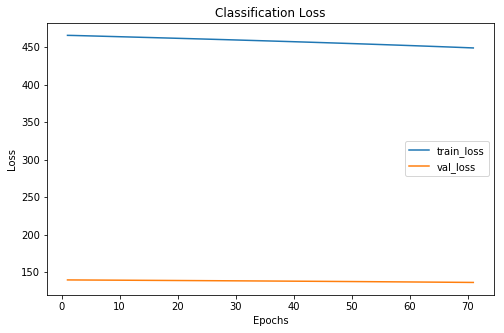

 28%|██▊       | 71/250 [07:58<20:37,  6.91s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
15  17  17
 7   9  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    125      39
      1    106      33
      2    188      54
Score This Epoch: 0.4265243902439025 Best Score: 0.4268795128187357
xxxxxxxxxxxxxx epoch: 71 xxxxxxxxxxxxxx


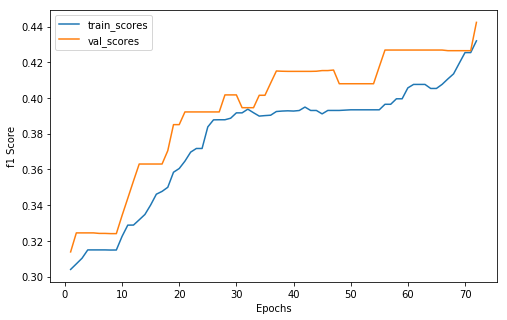

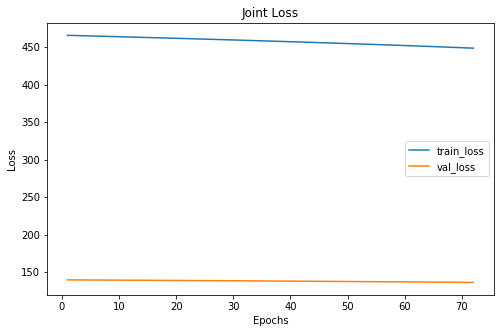

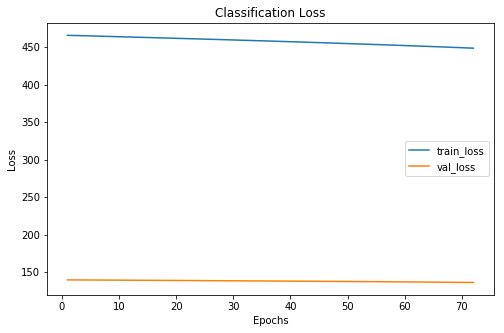

 29%|██▉       | 72/250 [08:05<20:38,  6.96s/it]

Cofusion Matrix For Val Set: 
--  --  --
17   7  17
14  18  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    127      37
      1    105      34
      2    187      55
Score This Epoch: 0.4423824725029545 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 72 xxxxxxxxxxxxxx


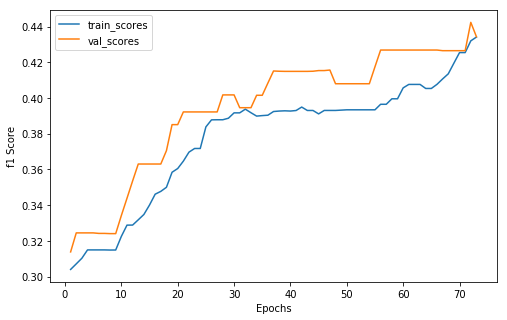

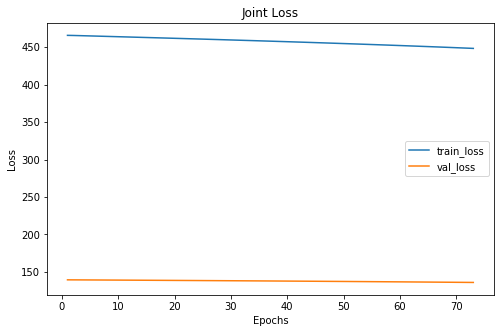

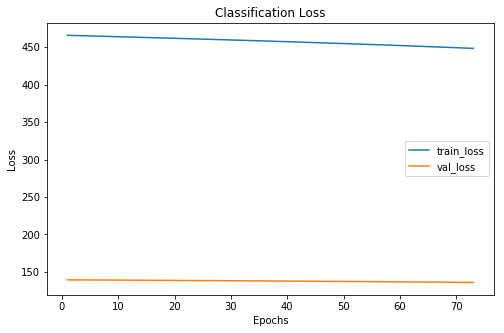

 29%|██▉       | 73/250 [08:11<20:08,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
16   7  18
14  18  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    128      36
      1    106      34
      2    185      56
Score This Epoch: 0.43433933091944016 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 73 xxxxxxxxxxxxxx


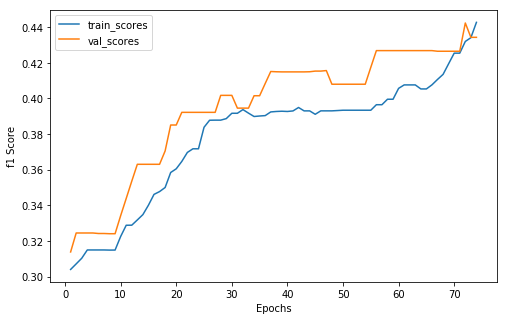

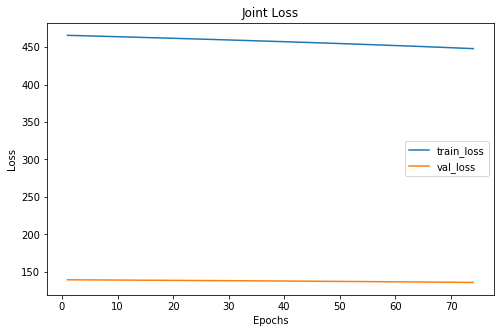

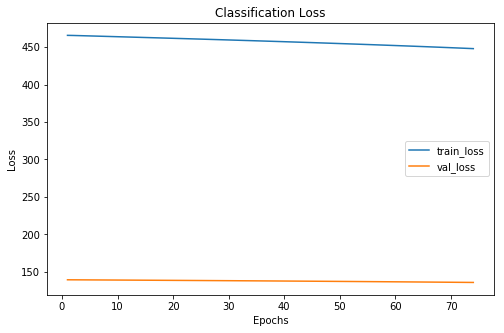

 30%|██▉       | 74/250 [08:18<19:52,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
16   7  18
14  18  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    126      36
      1    109      34
      2    184      56
Score This Epoch: 0.43433933091944016 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 74 xxxxxxxxxxxxxx


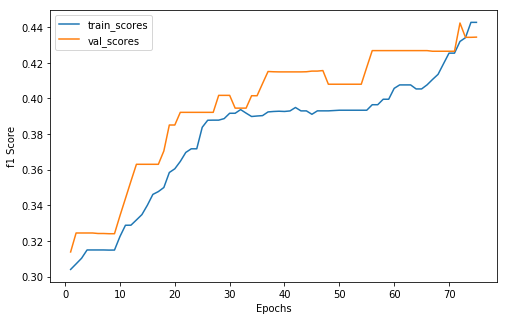

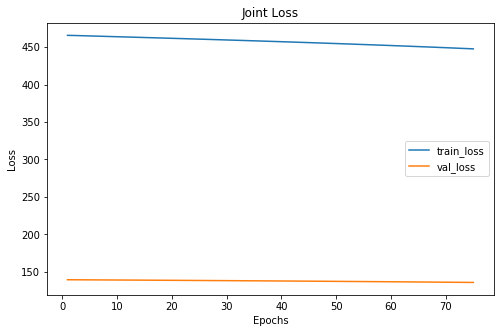

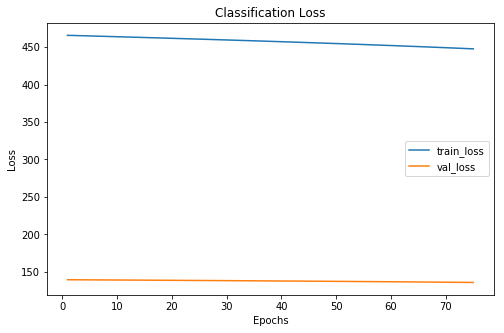

 30%|███       | 75/250 [08:24<19:30,  6.69s/it]

Cofusion Matrix For Val Set: 
--  --  --
15   8  18
13  19  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    126      34
      1    109      36
      2    184      56
Score This Epoch: 0.43444972191775255 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 75 xxxxxxxxxxxxxx


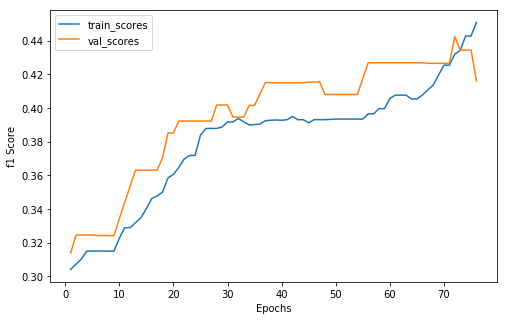

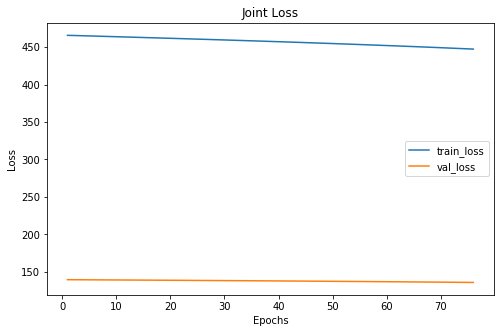

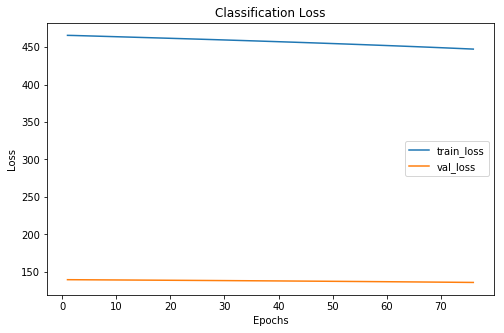

 30%|███       | 76/250 [08:31<19:16,  6.65s/it]

Cofusion Matrix For Val Set: 
--  --  --
13  10  18
13  19  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    125      32
      1    111      38
      2    183      56
Score This Epoch: 0.4161890570261727 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 76 xxxxxxxxxxxxxx


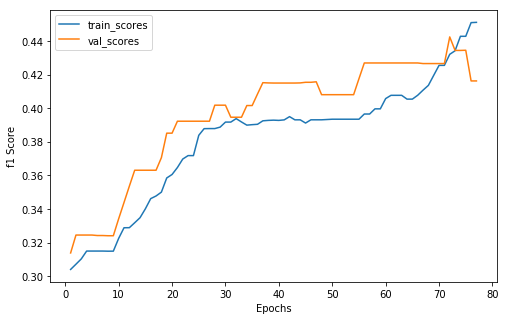

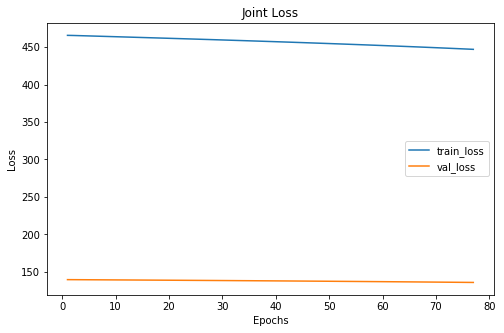

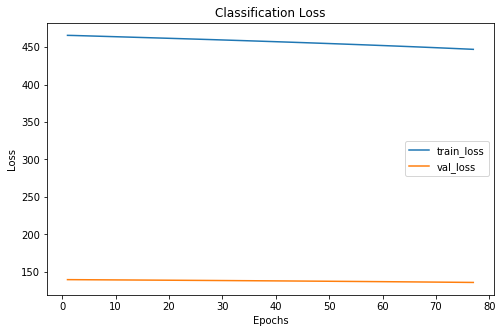

 31%|███       | 77/250 [08:37<19:11,  6.66s/it]

Cofusion Matrix For Val Set: 
--  --  --
13  10  18
13  19  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    123      32
      1    114      38
      2    182      56
Score This Epoch: 0.4161890570261727 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 77 xxxxxxxxxxxxxx


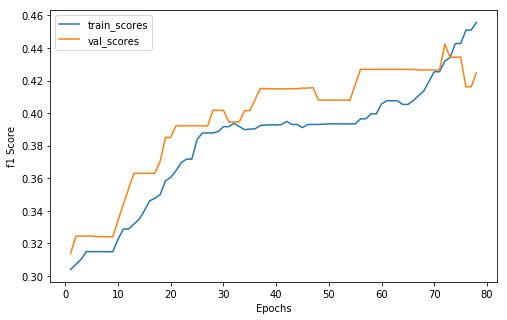

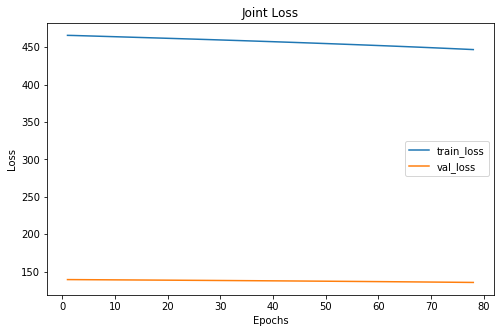

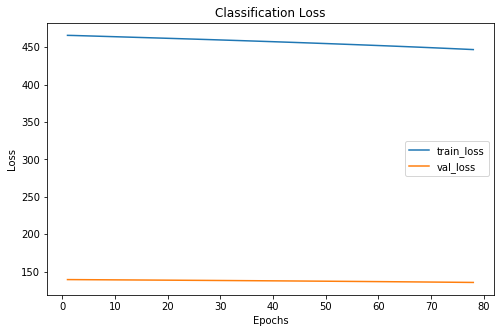

 31%|███       | 78/250 [08:44<19:19,  6.74s/it]

Cofusion Matrix For Val Set: 
--  --  --
13  10  18
12  20  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    125      31
      1    115      39
      2    179      56
Score This Epoch: 0.42470686854744827 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 78 xxxxxxxxxxxxxx


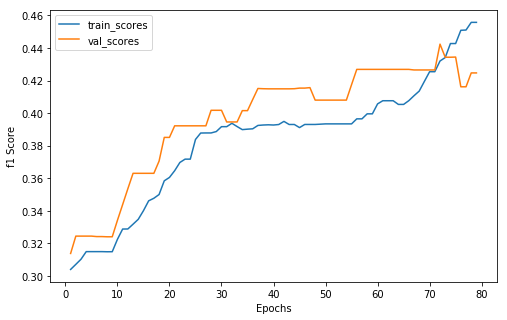

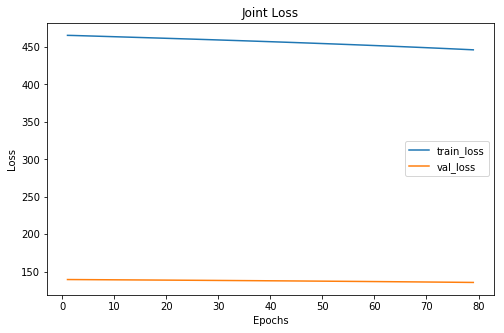

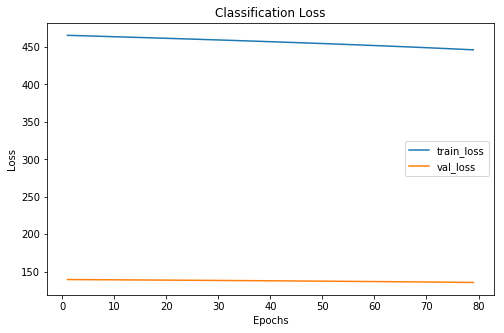

 32%|███▏      | 79/250 [08:51<19:19,  6.78s/it]

Cofusion Matrix For Val Set: 
--  --  --
13  10  18
12  20  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    125      31
      1    115      39
      2    179      56
Score This Epoch: 0.42470686854744827 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 79 xxxxxxxxxxxxxx


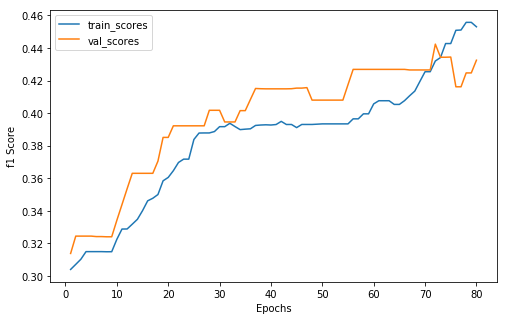

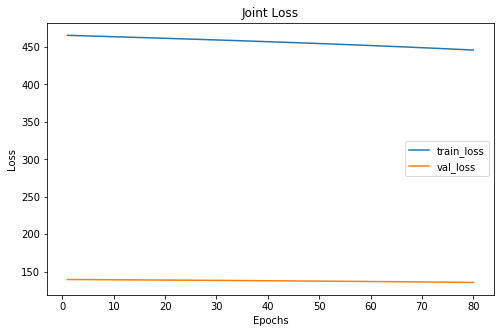

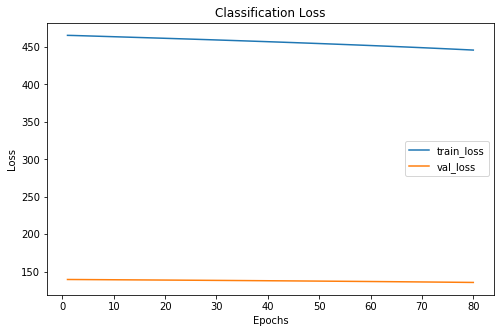

 32%|███▏      | 80/250 [08:59<19:35,  6.92s/it]

Cofusion Matrix For Val Set: 
--  --  --
13  11  17
11  21  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    124      30
      1    117      41
      2    178      55
Score This Epoch: 0.4325090141991551 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 80 xxxxxxxxxxxxxx


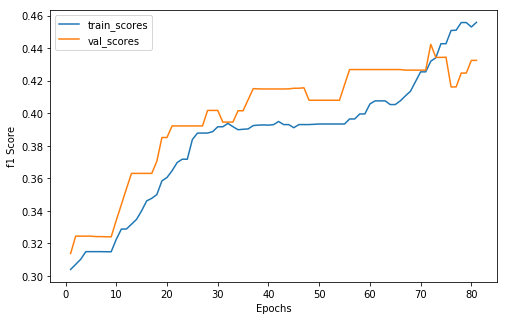

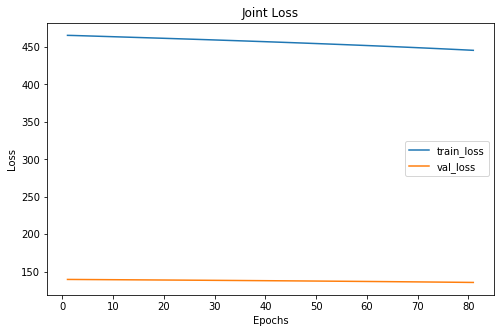

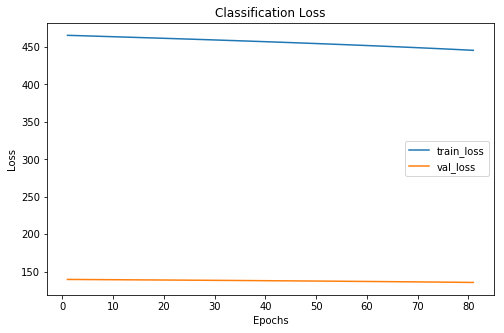

 32%|███▏      | 81/250 [09:05<19:17,  6.85s/it]

Cofusion Matrix For Val Set: 
--  --  --
13  11  17
11  21  17
 6   9  21
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    123      30
      1    118      41
      2    178      55
Score This Epoch: 0.4325090141991551 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 81 xxxxxxxxxxxxxx


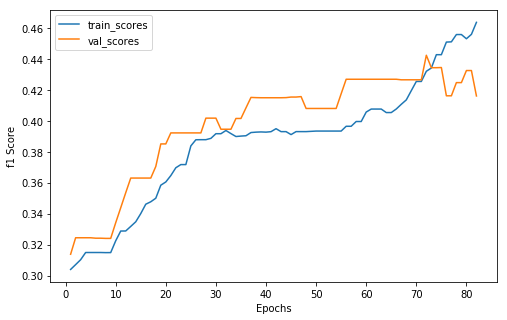

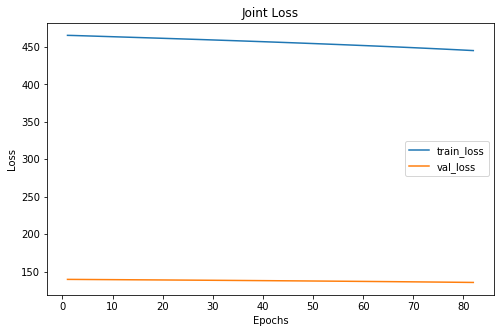

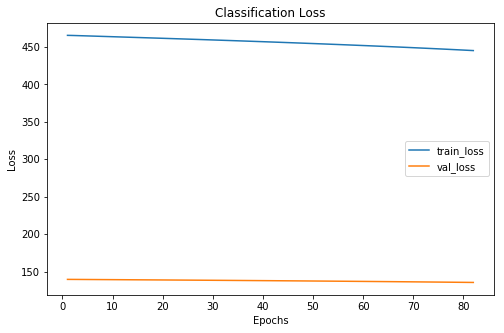

 33%|███▎      | 82/250 [09:12<19:09,  6.84s/it]

Cofusion Matrix For Val Set: 
--  --  --
12  12  17
11  21  17
 6  10  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    123      29
      1    120      43
      2    176      54
Score This Epoch: 0.4160849847185251 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 82 xxxxxxxxxxxxxx


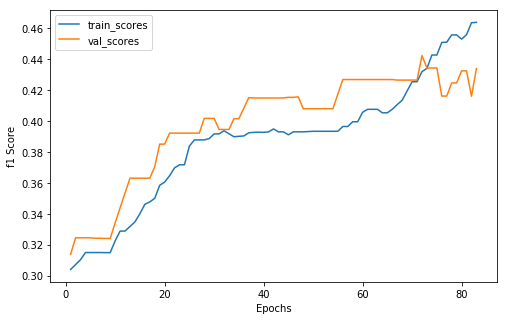

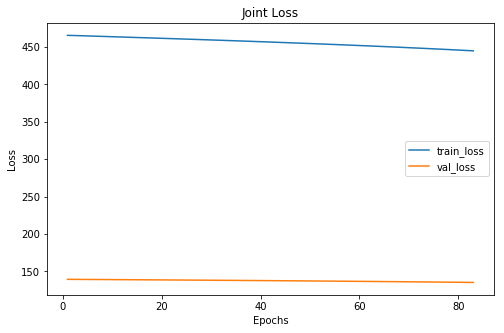

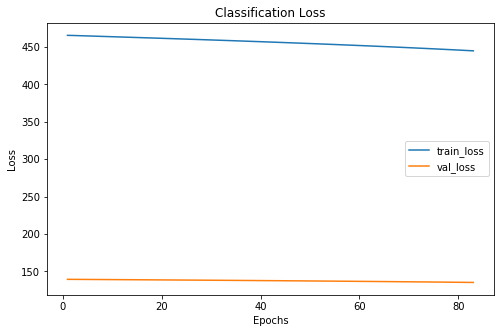

 33%|███▎      | 83/250 [09:19<18:50,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
14  12  15
11  21  17
 6  10  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    121      31
      1    122      43
      2    176      52
Score This Epoch: 0.43394957163073106 Best Score: 0.4423824725029545
xxxxxxxxxxxxxx epoch: 83 xxxxxxxxxxxxxx


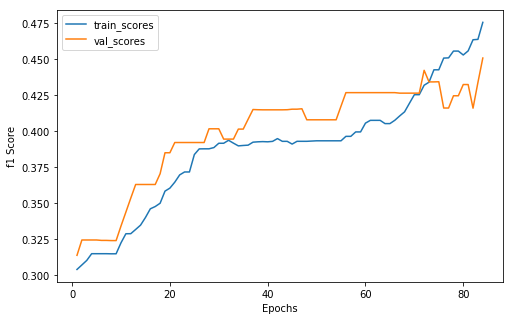

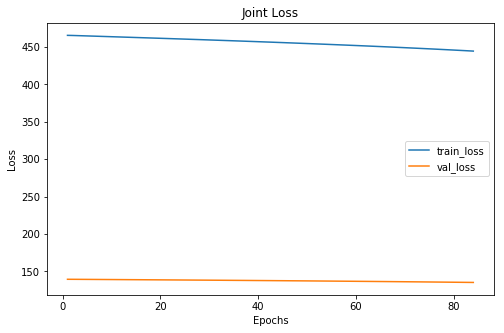

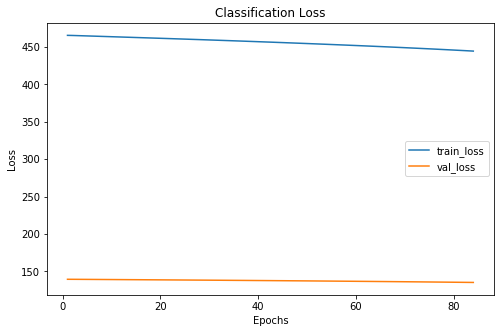

 34%|███▎      | 84/250 [09:25<18:44,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  12  14
10  22  17
 6  10  20
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    123      31
      1    123      44
      2    173      51
Score This Epoch: 0.4509353426205484 Best Score: 0.4509353426205484
xxxxxxxxxxxxxx epoch: 84 xxxxxxxxxxxxxx


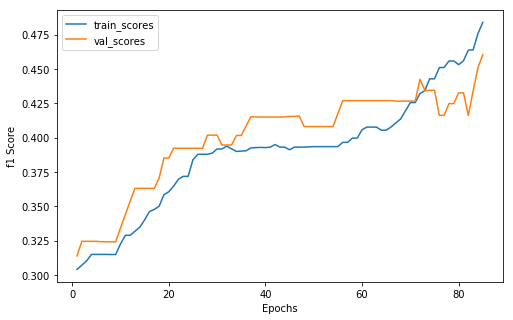

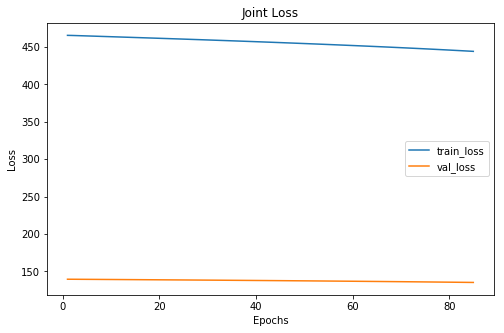

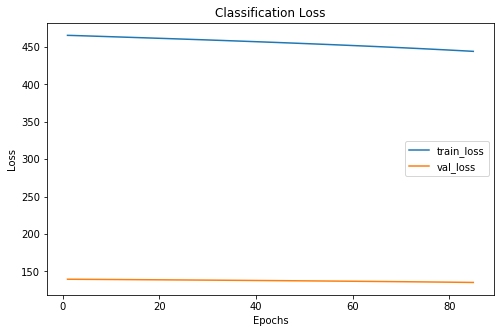

 34%|███▍      | 85/250 [09:32<18:33,  6.75s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  12  12
11  22  16
 6  11  19
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    121      34
      1    125      45
      2    173      47
Score This Epoch: 0.4603552745260001 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 85 xxxxxxxxxxxxxx


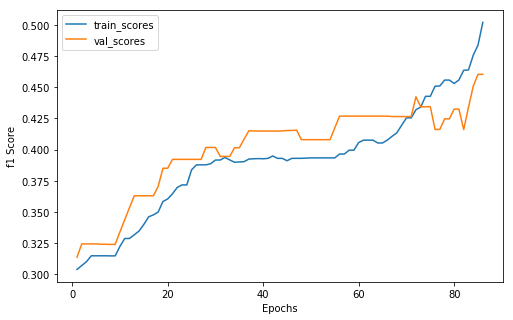

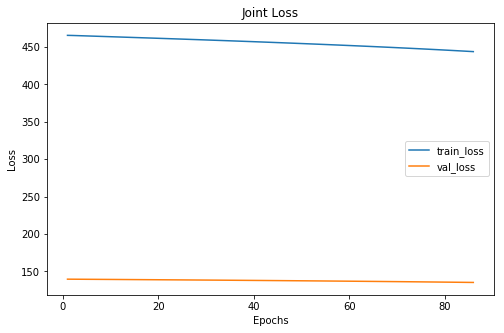

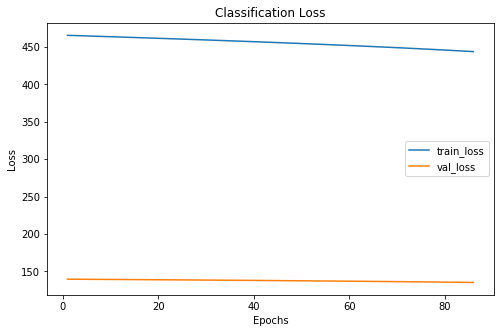

 34%|███▍      | 86/250 [09:39<18:49,  6.89s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  12  12
11  22  16
 6  11  19
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    117      34
      1    129      45
      2    173      47
Score This Epoch: 0.4603552745260001 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 86 xxxxxxxxxxxxxx


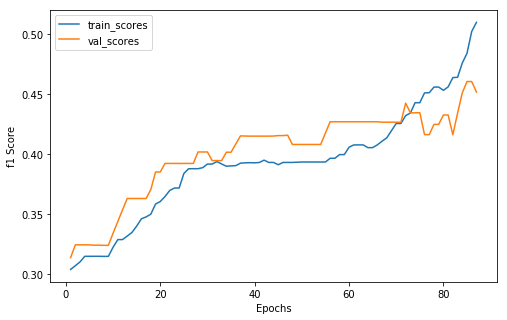

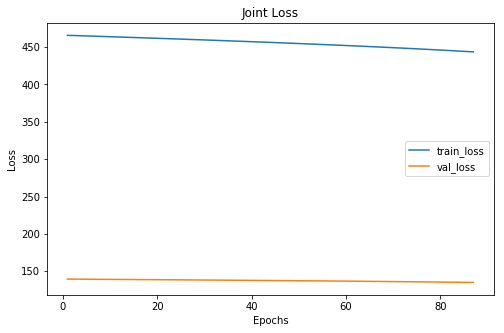

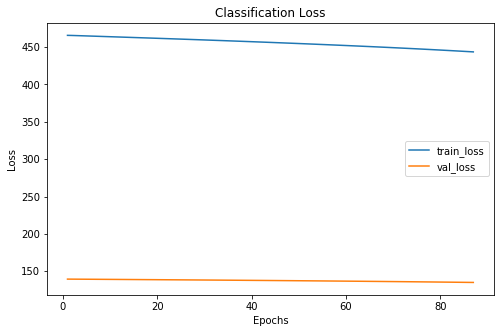

 35%|███▍      | 87/250 [09:46<18:57,  6.98s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  13  12
11  22  16
 6  11  19
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    116      33
      1    132      46
      2    171      47
Score This Epoch: 0.4516380498625268 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 87 xxxxxxxxxxxxxx


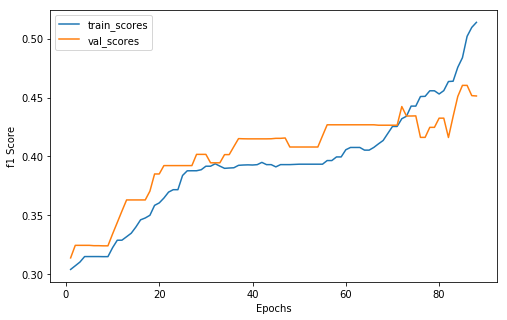

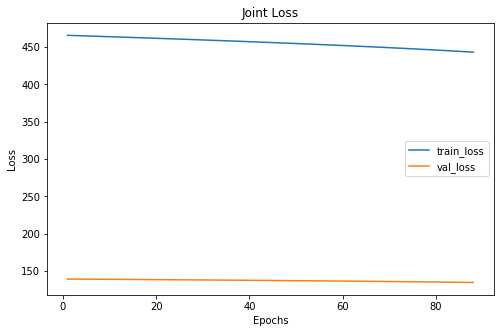

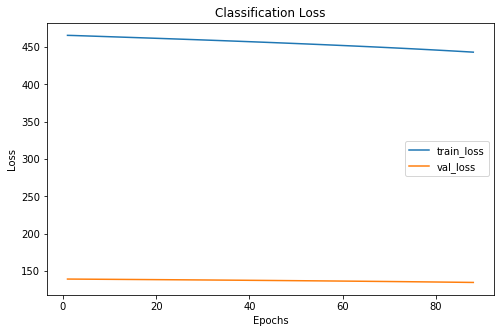

 35%|███▌      | 88/250 [09:53<18:44,  6.94s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  14  11
11  22  16
 6  11  19
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    118      33
      1    134      47
      2    167      46
Score This Epoch: 0.45135706263755043 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 88 xxxxxxxxxxxxxx


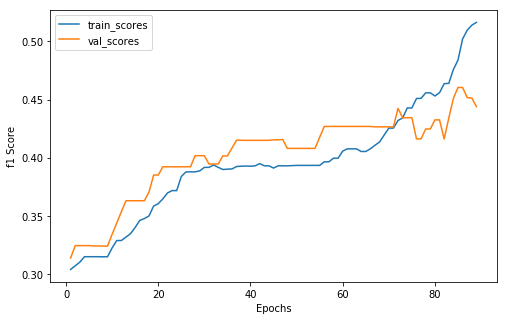

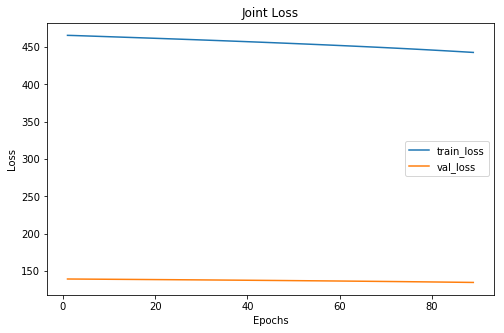

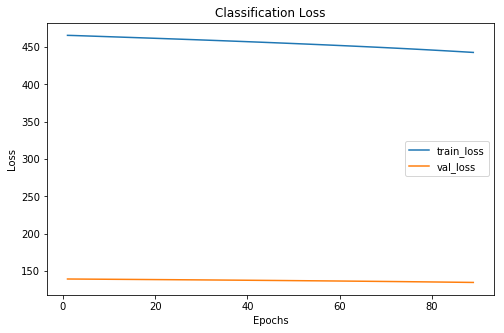

 36%|███▌      | 89/250 [10:00<18:36,  6.94s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  14  11
12  22  15
 5  13  18
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    113      33
      1    141      49
      2    165      44
Score This Epoch: 0.4438867438867439 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 89 xxxxxxxxxxxxxx


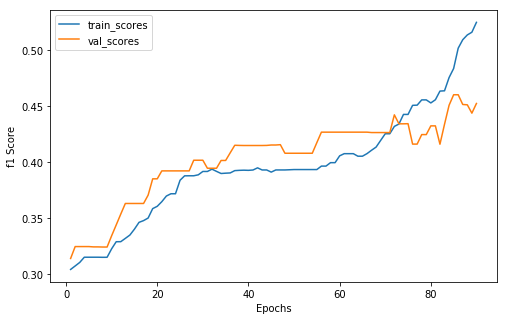

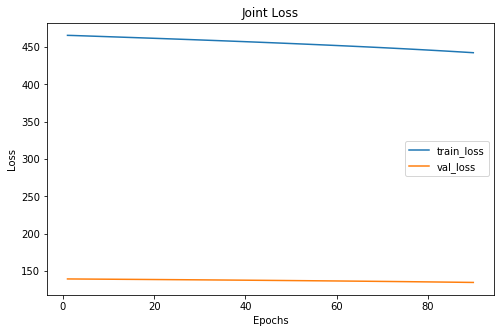

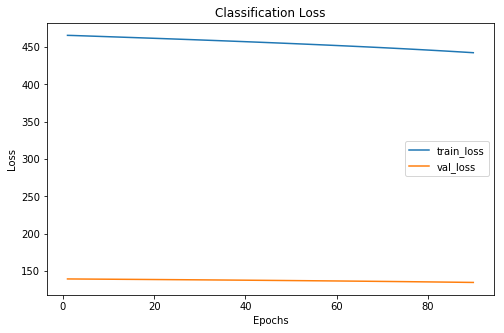

 36%|███▌      | 90/250 [10:08<18:50,  7.07s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  14  10
12  22  15
 4  14  18
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    111      33
      1    149      50
      2    159      43
Score This Epoch: 0.45254507068853056 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 90 xxxxxxxxxxxxxx


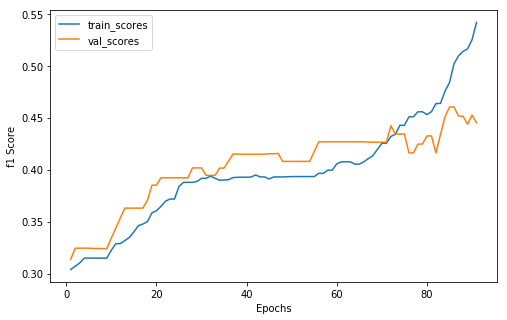

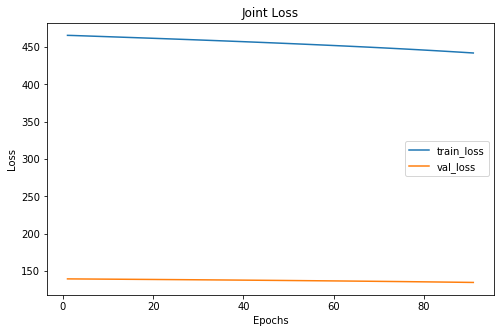

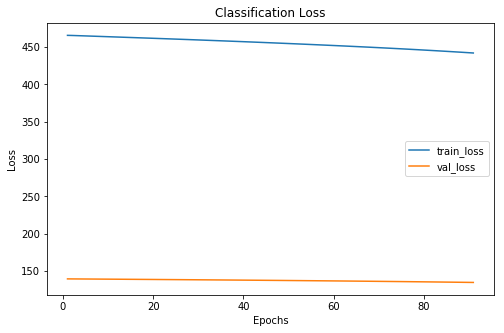

 36%|███▋      | 91/250 [10:14<18:16,  6.89s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  14  10
12  22  15
 4  15  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    111      33
      1    155      51
      2    153      42
Score This Epoch: 0.4451598851598852 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 91 xxxxxxxxxxxxxx


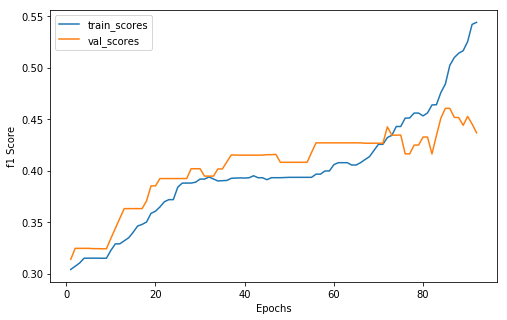

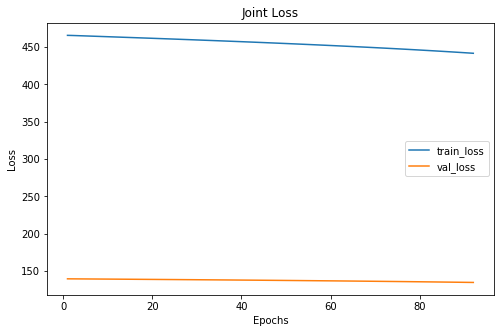

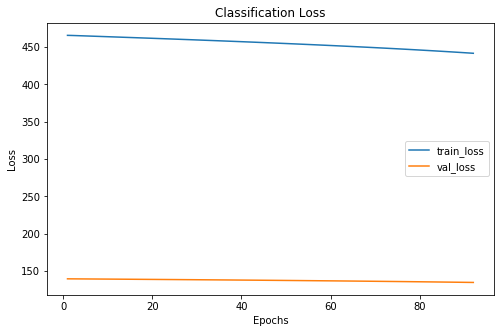

 37%|███▋      | 92/250 [10:21<18:08,  6.89s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  15  10
12  22  15
 4  15  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    110      32
      1    160      52
      2    149      42
Score This Epoch: 0.43659877051983387 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 92 xxxxxxxxxxxxxx


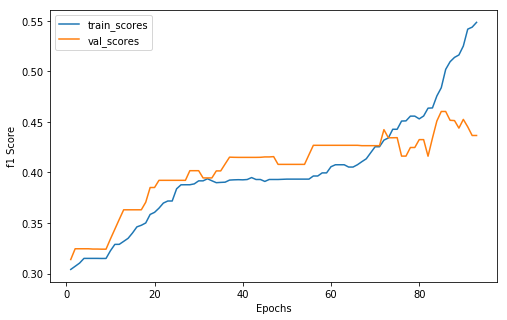

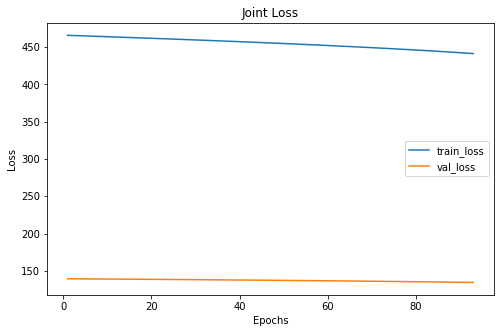

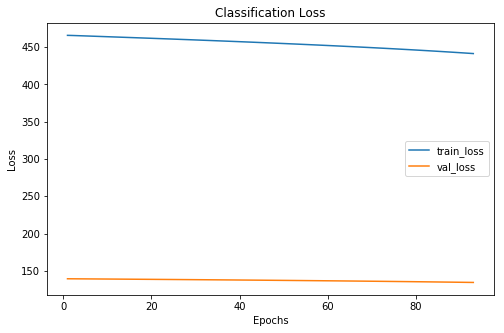

 37%|███▋      | 93/250 [10:28<17:49,  6.81s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  15  10
12  22  15
 4  15  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    112      32
      1    161      52
      2    146      42
Score This Epoch: 0.43659877051983387 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 93 xxxxxxxxxxxxxx


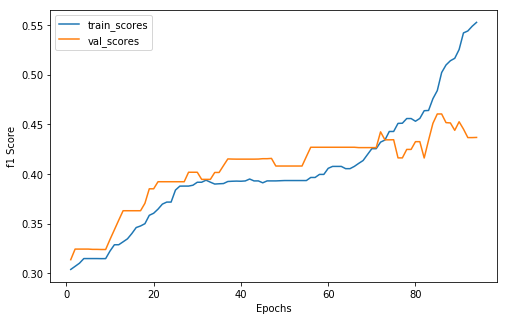

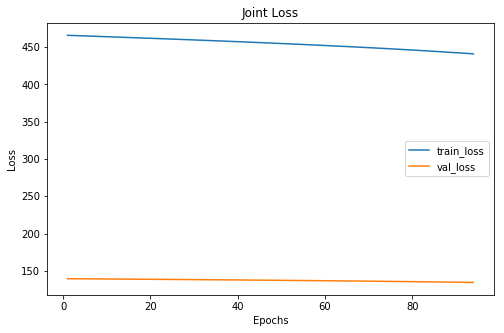

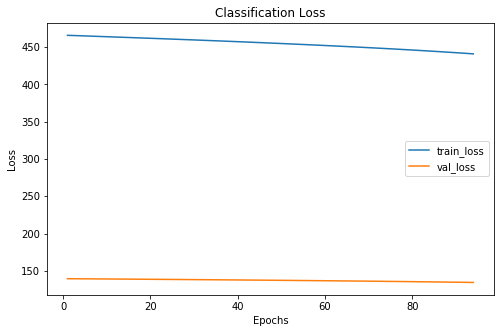

 38%|███▊      | 94/250 [10:34<17:32,  6.75s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  15  10
11  23  15
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    112      32
      1    165      53
      2    142      41
Score This Epoch: 0.43675937235278783 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 94 xxxxxxxxxxxxxx


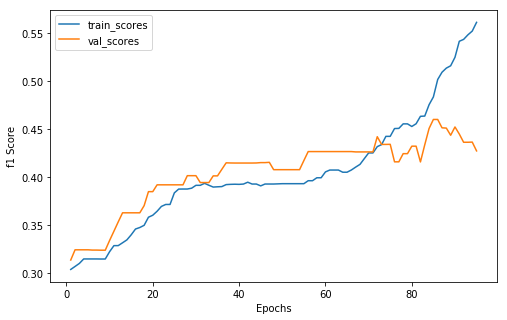

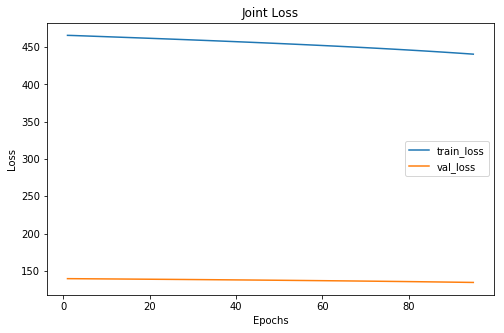

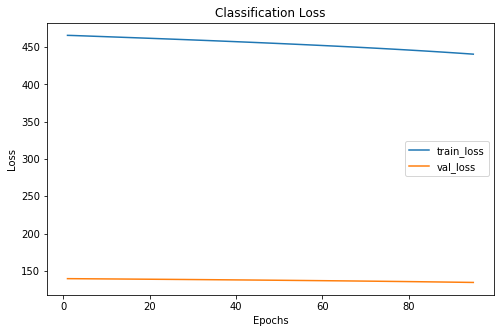

 38%|███▊      | 95/250 [10:41<17:27,  6.76s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  16  10
 9  25  15
 6  16  14
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    112      30
      1    170      57
      2    137      39
Score This Epoch: 0.4275964381677908 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 95 xxxxxxxxxxxxxx


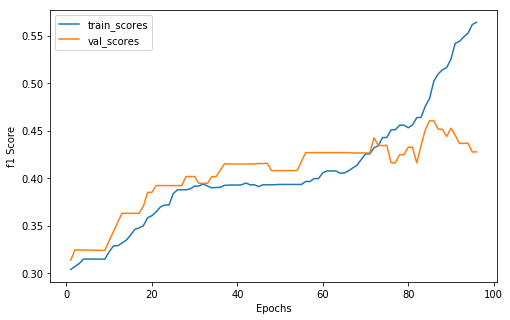

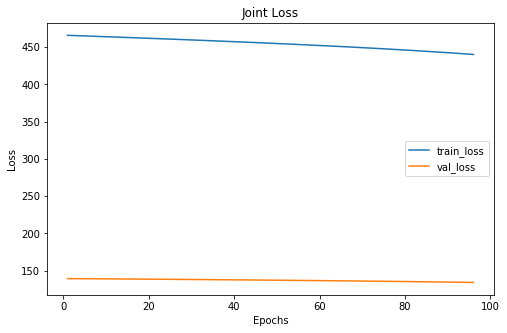

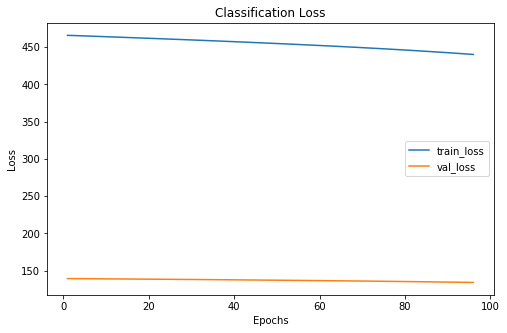

 38%|███▊      | 96/250 [10:48<17:27,  6.80s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 9  25  15
 6  17  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    114      31
      1    170      60
      2    135      35
Score This Epoch: 0.4276379764599603 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 96 xxxxxxxxxxxxxx


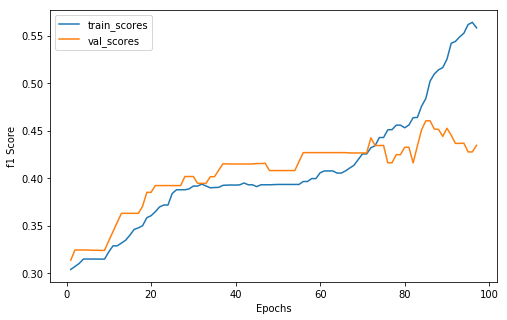

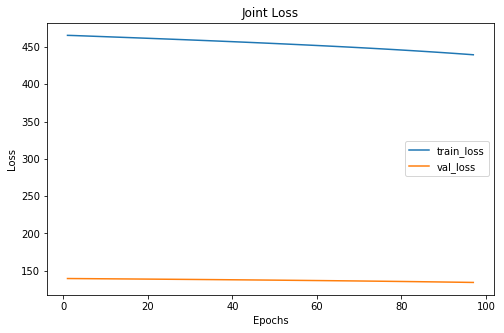

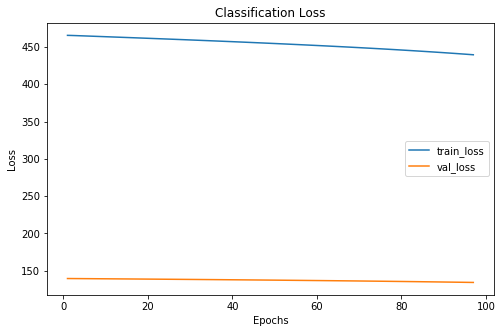

 39%|███▉      | 97/250 [10:55<17:27,  6.85s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 9  26  14
 6  17  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    111      31
      1    175      61
      2    133      34
Score This Epoch: 0.4345816441054536 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 97 xxxxxxxxxxxxxx


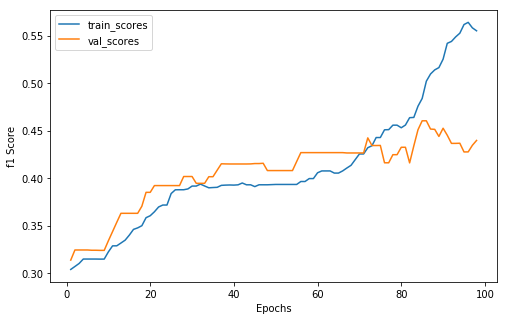

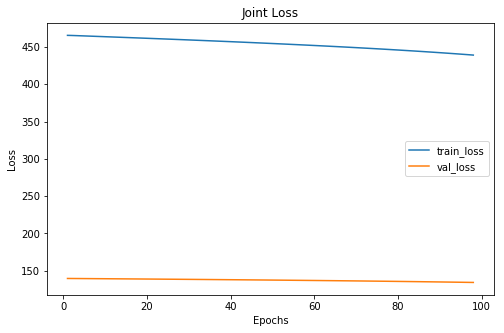

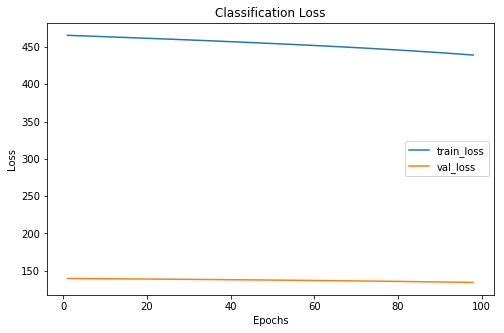

 39%|███▉      | 98/250 [11:02<17:11,  6.79s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 9  28  12
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    109      31
      1    178      64
      2    132      31
Score This Epoch: 0.4396899242142055 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 98 xxxxxxxxxxxxxx


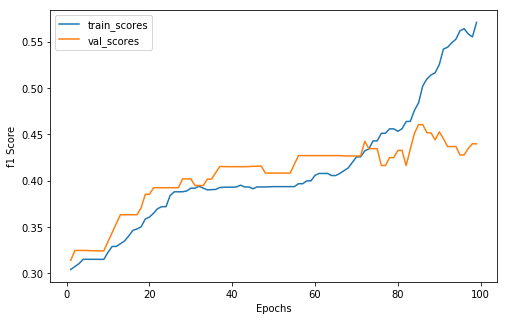

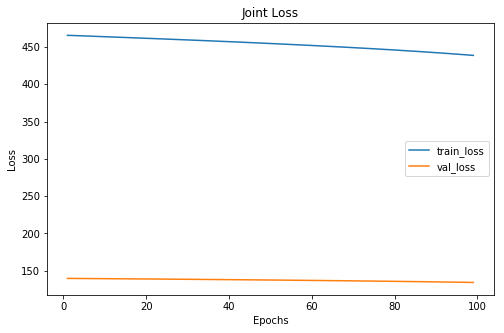

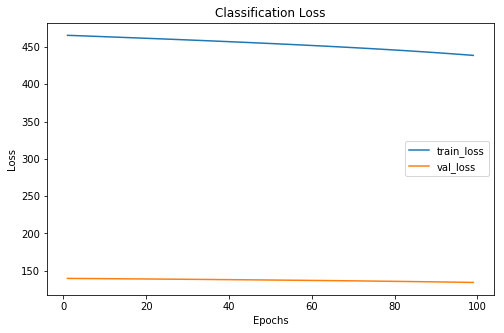

 40%|███▉      | 99/250 [11:08<17:02,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  19   6
 9  28  12
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    109      31
      1    188      65
      2    122      30
Score This Epoch: 0.43955005358514126 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 99 xxxxxxxxxxxxxx


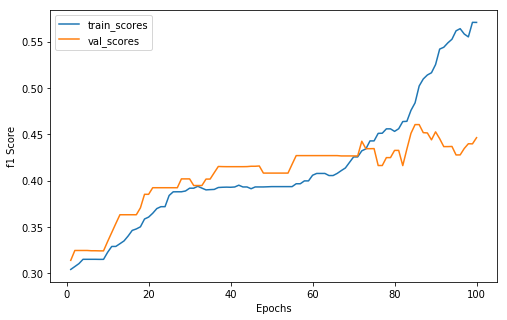

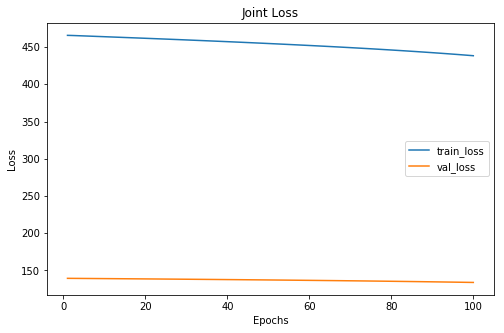

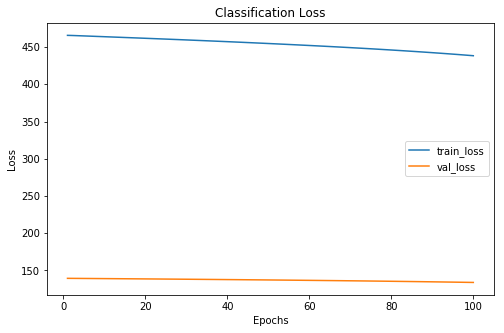

 40%|████      | 100/250 [11:15<17:10,  6.87s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  19   6
 9  29  11
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    109      31
      1    189      66
      2    121      29
Score This Epoch: 0.4462505824824665 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 100 xxxxxxxxxxxxxx


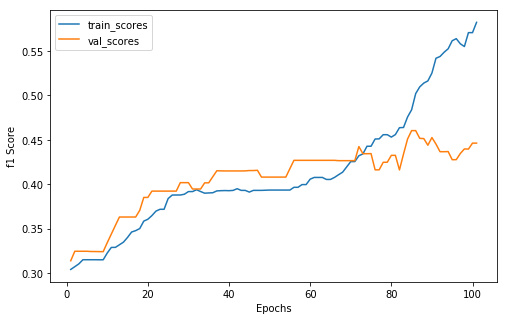

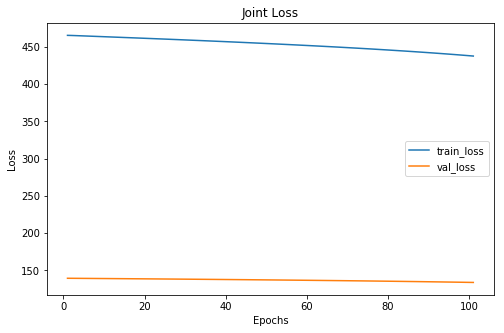

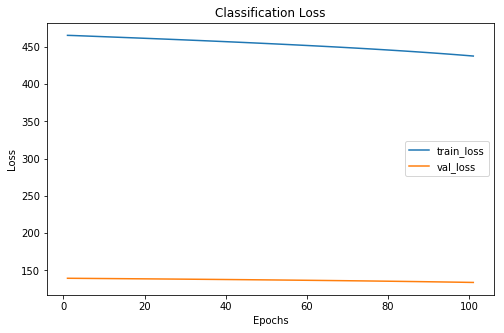

 40%|████      | 101/250 [11:22<16:58,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  19   6
 9  29  11
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    110      31
      1    189      66
      2    120      29
Score This Epoch: 0.4462505824824665 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 101 xxxxxxxxxxxxxx


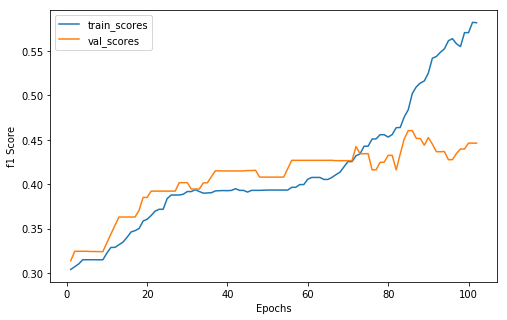

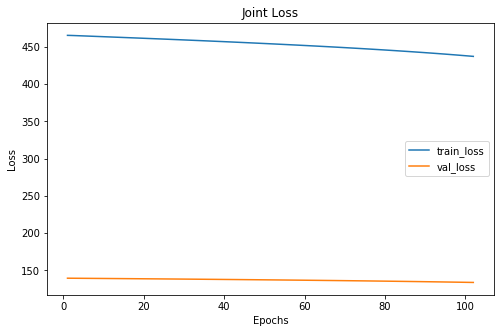

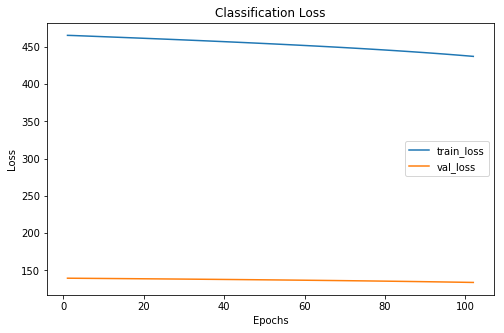

 41%|████      | 102/250 [11:28<16:27,  6.67s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 9  29  11
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    108      31
      1    192      67
      2    119      28
Score This Epoch: 0.4462081128747795 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 102 xxxxxxxxxxxxxx


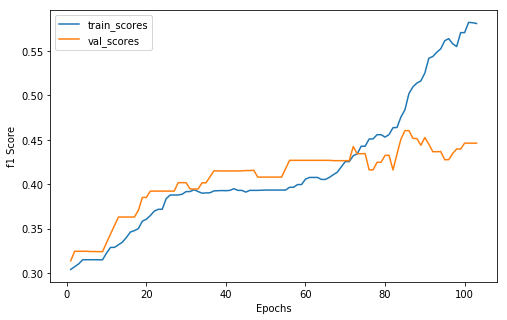

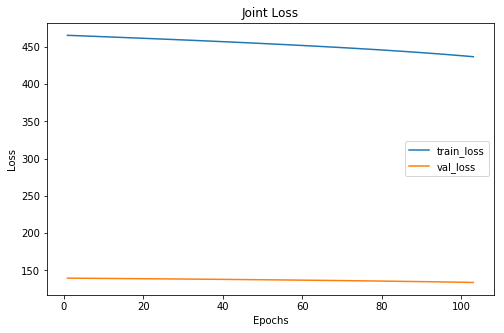

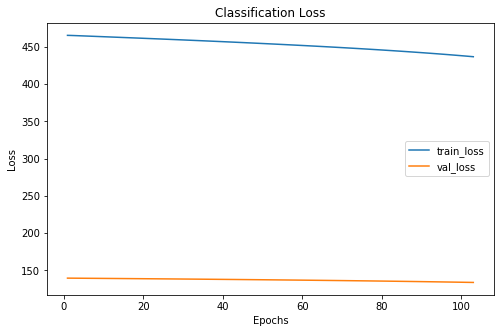

 41%|████      | 103/250 [11:36<17:02,  6.96s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 9  29  11
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    105      31
      1    195      67
      2    119      28
Score This Epoch: 0.4462081128747795 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 103 xxxxxxxxxxxxxx


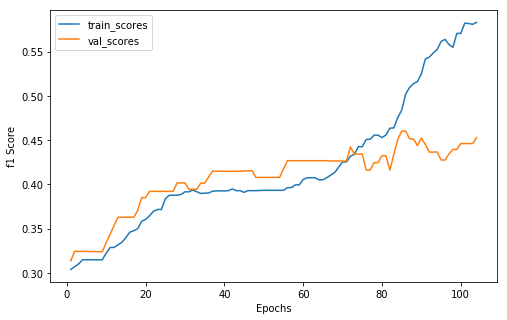

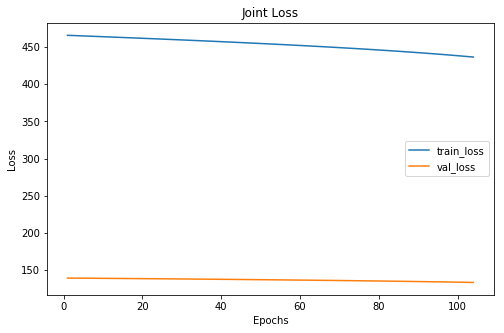

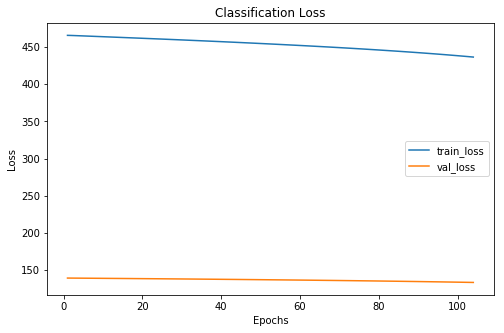

 42%|████▏     | 104/250 [11:43<16:51,  6.93s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 9  30  10
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    105      31
      1    198      68
      2    116      27
Score This Epoch: 0.4528945481326434 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 104 xxxxxxxxxxxxxx


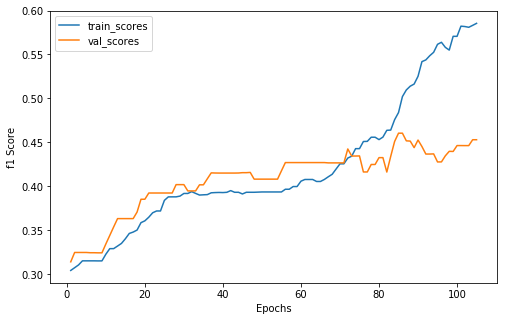

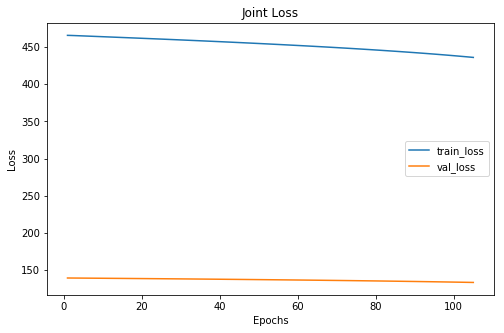

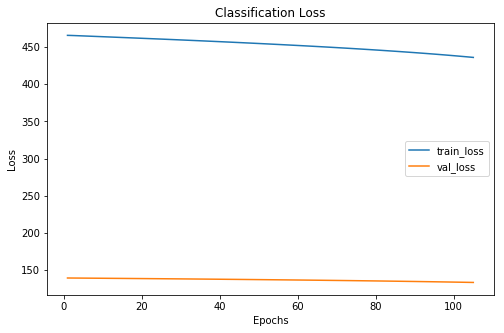

 42%|████▏     | 105/250 [11:50<16:55,  7.00s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 9  30  10
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    105      31
      1    197      68
      2    117      27
Score This Epoch: 0.4528945481326434 Best Score: 0.4603552745260001
xxxxxxxxxxxxxx epoch: 105 xxxxxxxxxxxxxx


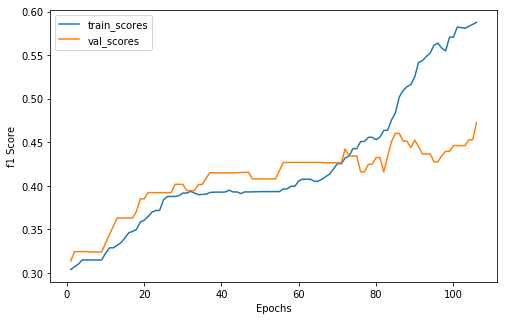

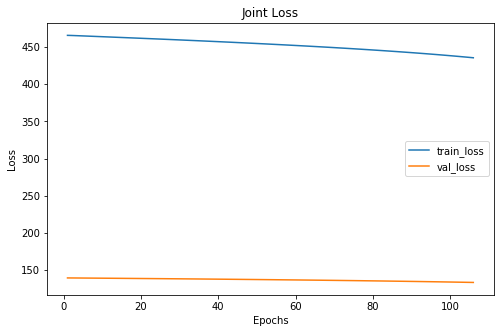

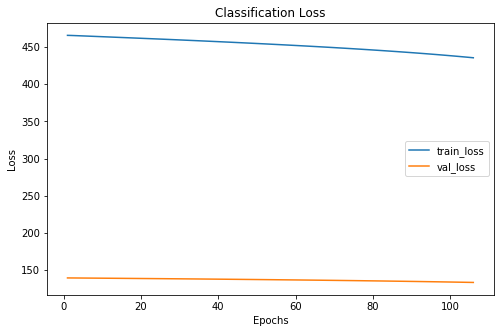

 42%|████▏     | 106/250 [11:56<16:19,  6.80s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 9  33   7
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    103      31
      1    200      71
      2    116      24
Score This Epoch: 0.4727954144620811 Best Score: 0.4727954144620811
xxxxxxxxxxxxxx epoch: 106 xxxxxxxxxxxxxx


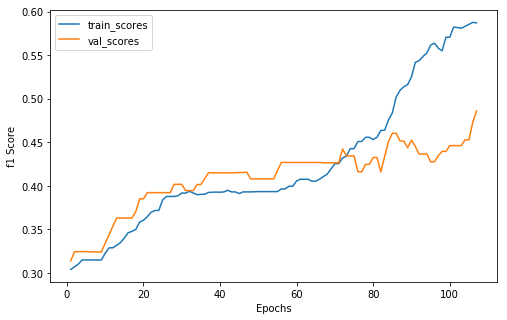

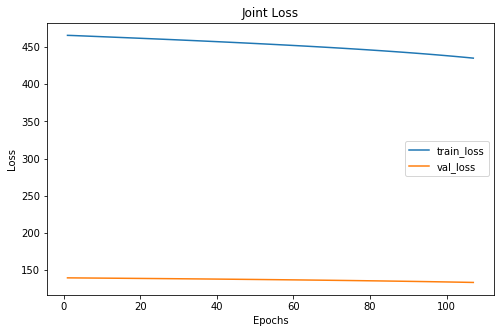

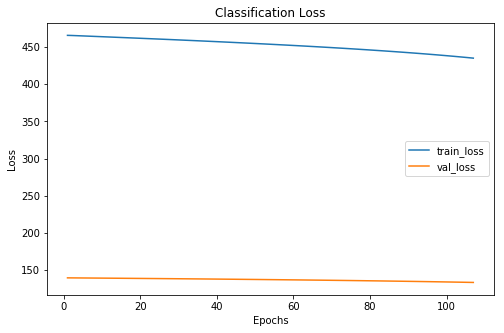

 43%|████▎     | 107/250 [12:03<16:12,  6.80s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 8  35   6
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    101      30
      1    204      73
      2    114      23
Score This Epoch: 0.4860134534476781 Best Score: 0.4860134534476781
xxxxxxxxxxxxxx epoch: 107 xxxxxxxxxxxxxx


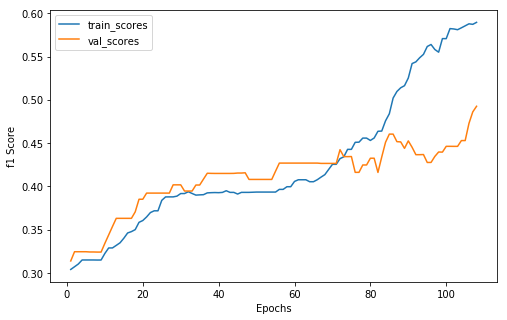

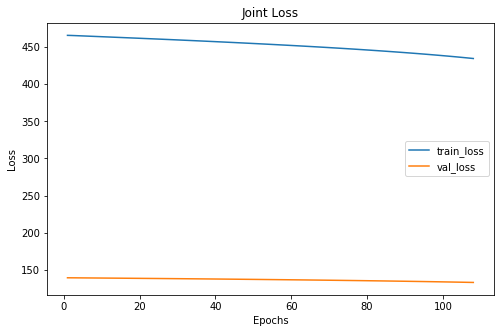

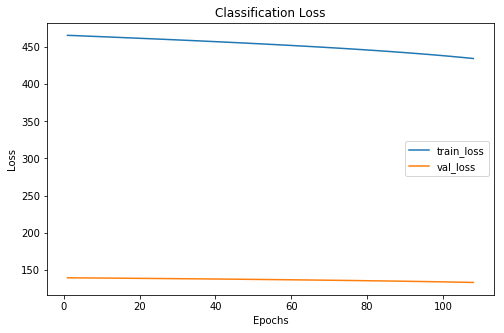

 43%|████▎     | 108/250 [12:10<16:22,  6.92s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 8  36   5
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    101      30
      1    203      74
      2    115      22
Score This Epoch: 0.4925266015304987 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 108 xxxxxxxxxxxxxx


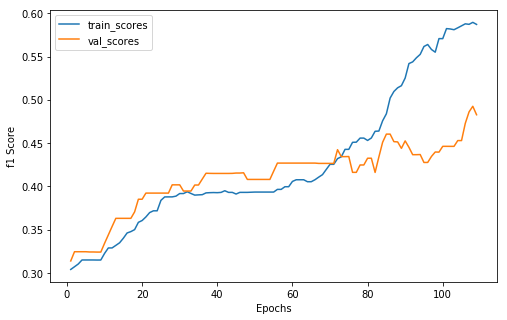

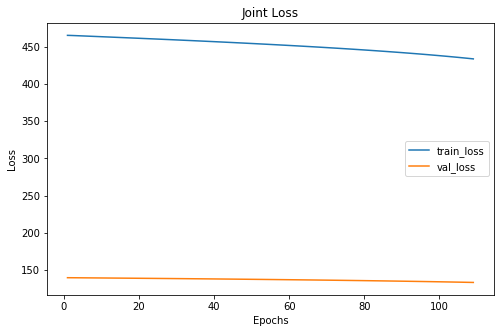

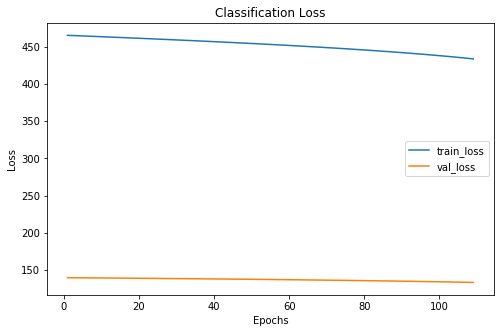

 44%|████▎     | 109/250 [12:17<15:55,  6.78s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 8  36   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0    100      30
      1    206      75
      2    113      21
Score This Epoch: 0.48273986495847376 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 109 xxxxxxxxxxxxxx


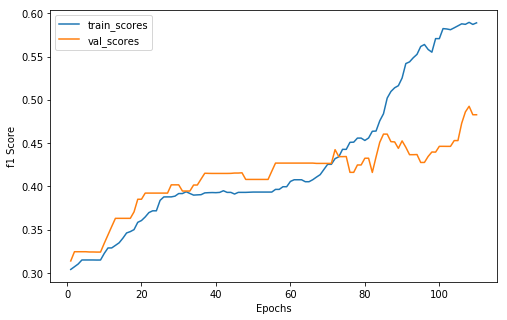

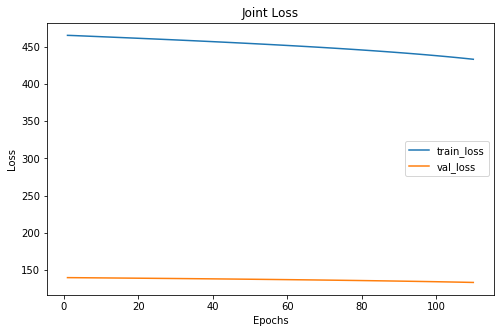

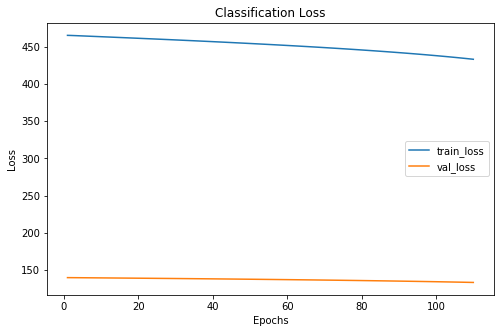

 44%|████▍     | 110/250 [12:24<15:53,  6.81s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 8  36   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     96      30
      1    211      75
      2    112      21
Score This Epoch: 0.48273986495847376 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 110 xxxxxxxxxxxxxx


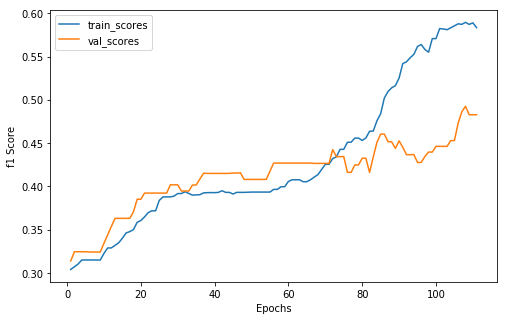

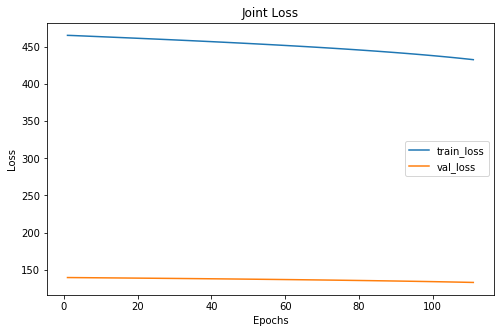

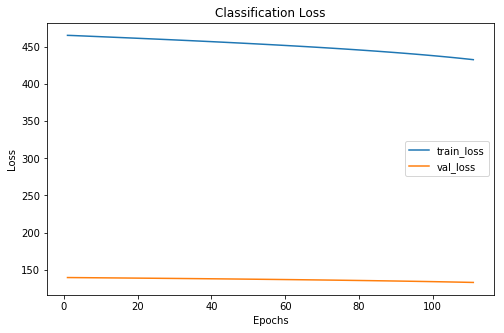

 44%|████▍     | 111/250 [12:31<15:49,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 8  36   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     94      30
      1    213      75
      2    112      21
Score This Epoch: 0.48273986495847376 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 111 xxxxxxxxxxxxxx


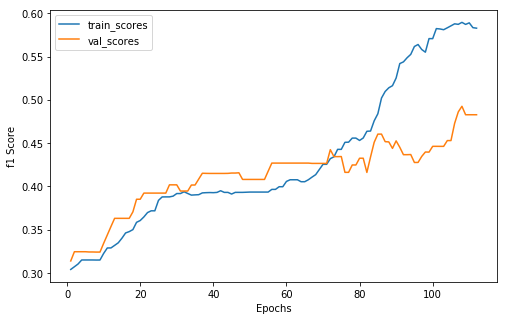

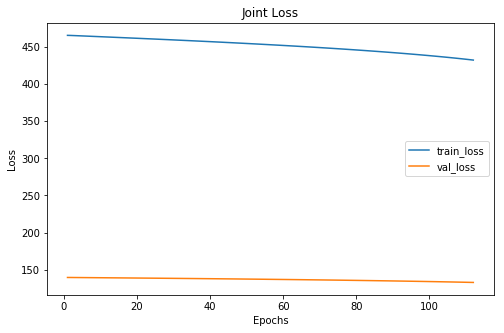

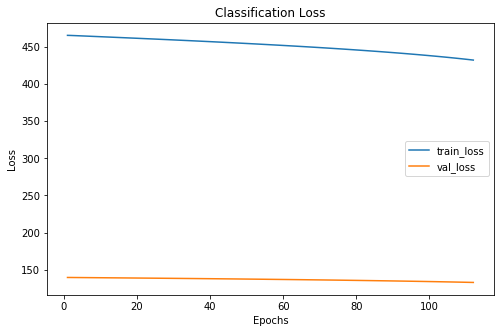

 45%|████▍     | 112/250 [12:38<15:58,  6.94s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 8  36   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     93      30
      1    216      75
      2    110      21
Score This Epoch: 0.48273986495847376 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 112 xxxxxxxxxxxxxx


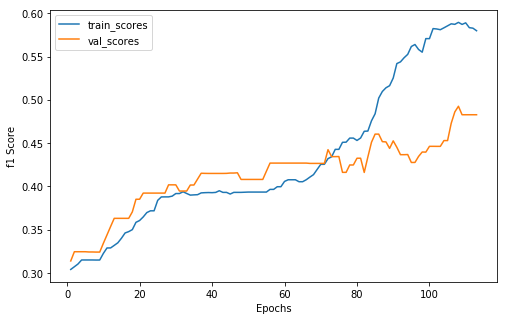

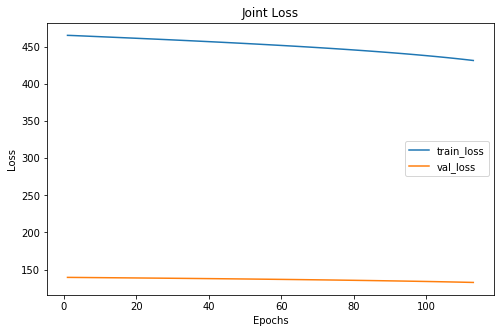

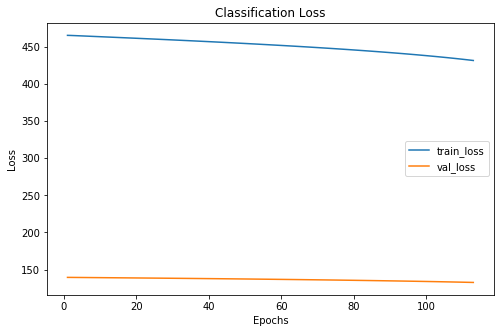

 45%|████▌     | 113/250 [12:44<15:26,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 8  36   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     91      30
      1    219      75
      2    109      21
Score This Epoch: 0.48273986495847376 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 113 xxxxxxxxxxxxxx


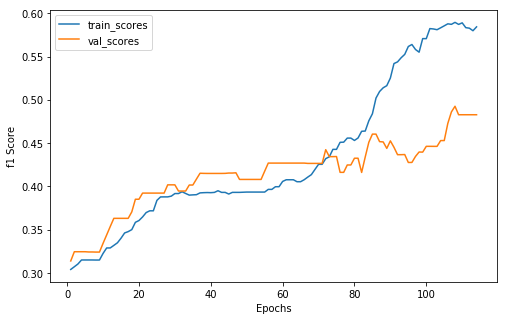

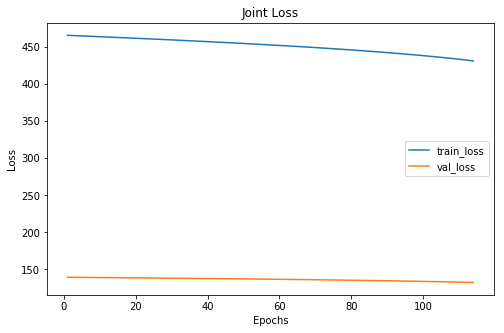

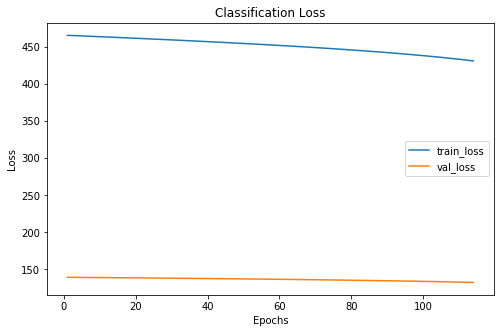

 46%|████▌     | 114/250 [12:51<15:19,  6.76s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 8  36   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     90      30
      1    219      75
      2    110      21
Score This Epoch: 0.48273986495847376 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 114 xxxxxxxxxxxxxx


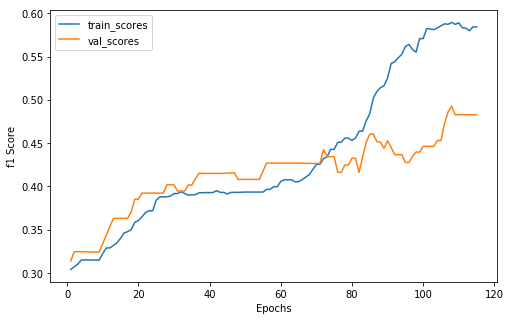

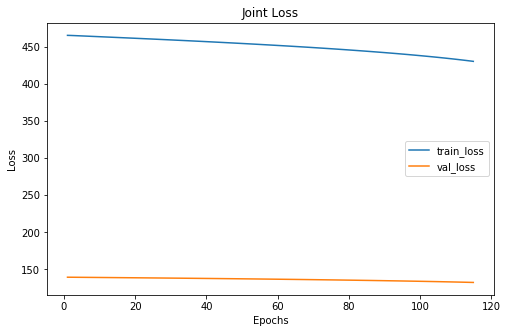

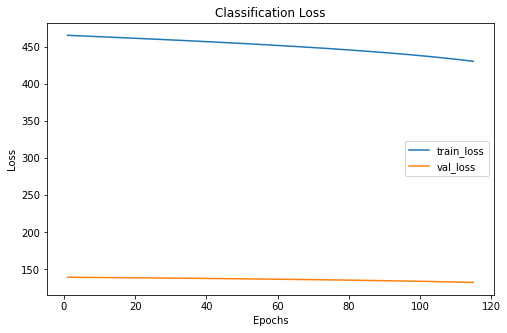

 46%|████▌     | 115/250 [12:59<16:17,  7.24s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 8  36   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     90      30
      1    219      75
      2    110      21
Score This Epoch: 0.48273986495847376 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 115 xxxxxxxxxxxxxx


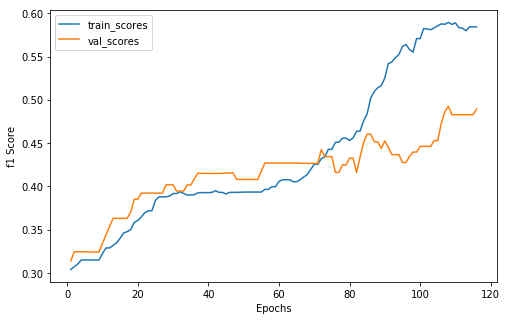

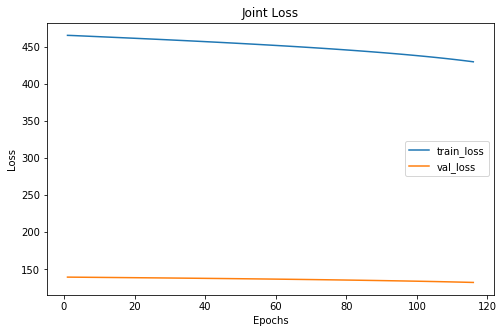

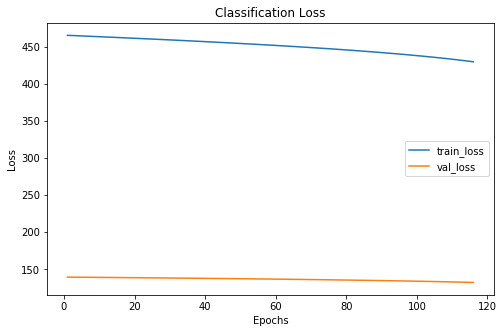

 46%|████▋     | 116/250 [13:06<15:41,  7.02s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 7  37   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     90      29
      1    219      76
      2    110      21
Score This Epoch: 0.48925074591240003 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 116 xxxxxxxxxxxxxx


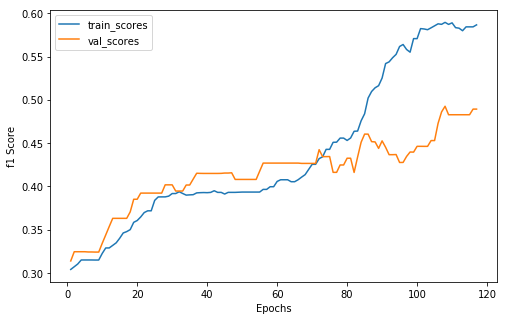

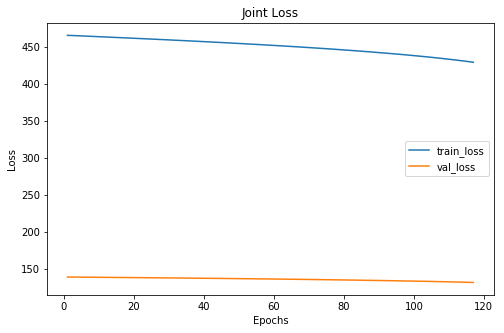

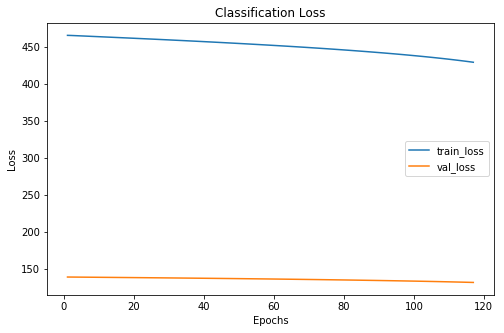

 47%|████▋     | 117/250 [13:12<15:11,  6.85s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 7  37   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     90      29
      1    218      76
      2    111      21
Score This Epoch: 0.48925074591240003 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 117 xxxxxxxxxxxxxx


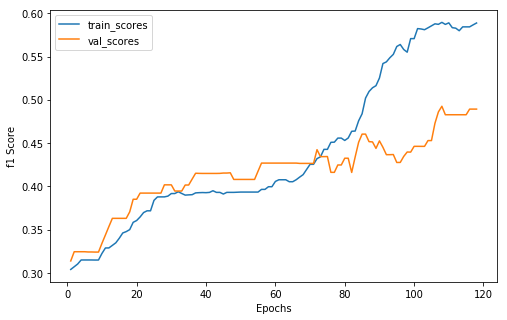

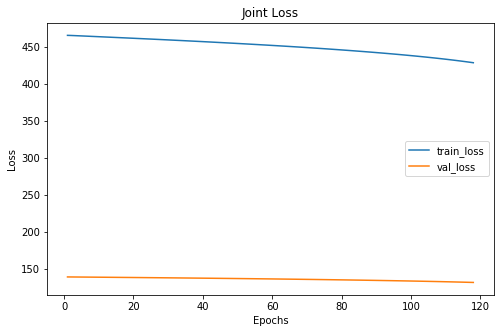

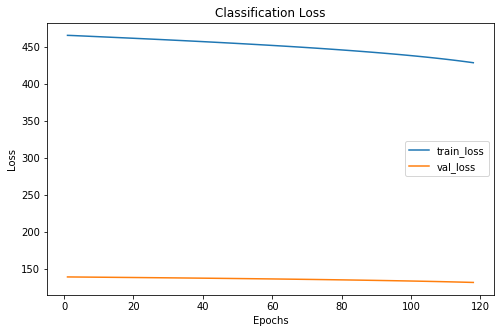

 47%|████▋     | 118/250 [13:19<15:03,  6.85s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 7  37   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    219      76
      2    111      21
Score This Epoch: 0.48925074591240003 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 118 xxxxxxxxxxxxxx


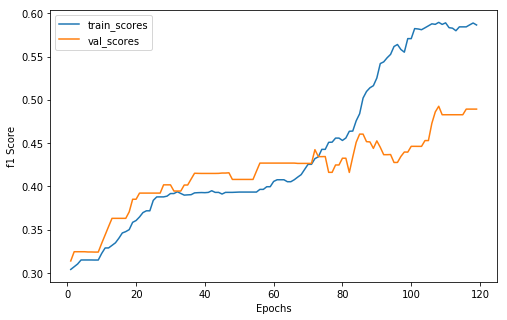

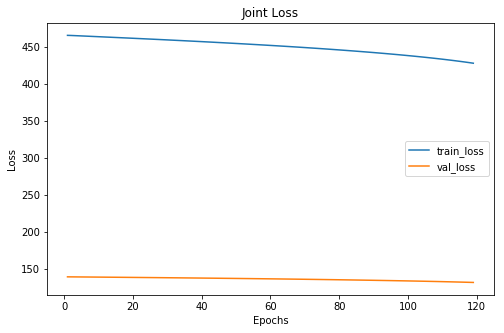

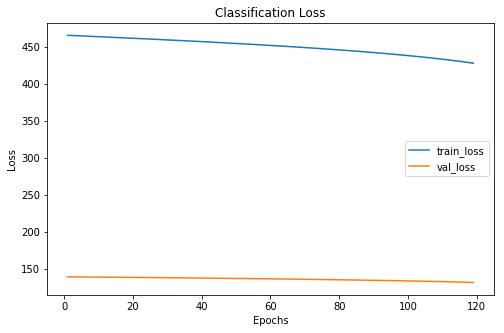

 48%|████▊     | 119/250 [13:26<15:06,  6.92s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 7  37   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    220      76
      2    110      21
Score This Epoch: 0.48925074591240003 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 119 xxxxxxxxxxxxxx


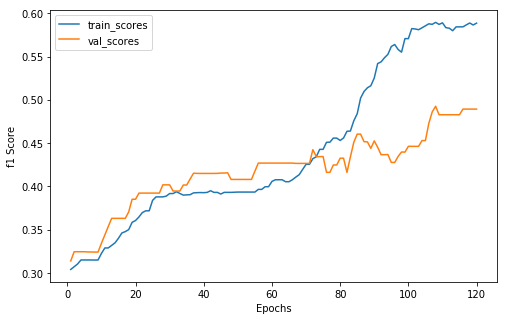

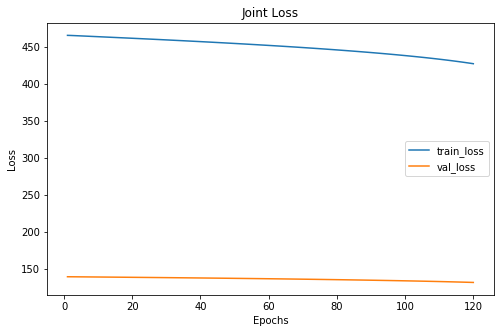

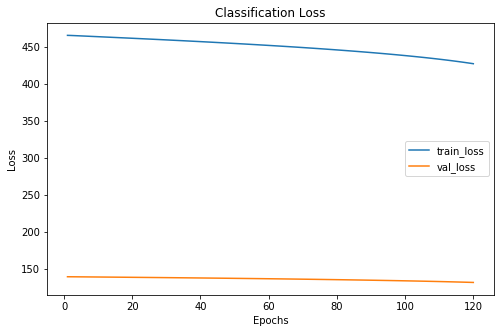

 48%|████▊     | 120/250 [13:33<15:07,  6.98s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 7  37   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    221      76
      2    109      21
Score This Epoch: 0.48925074591240003 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 120 xxxxxxxxxxxxxx


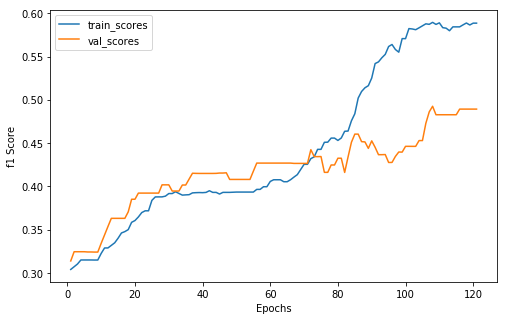

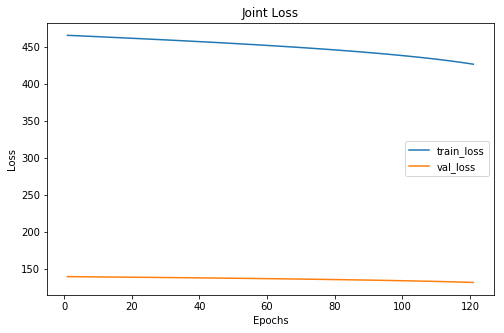

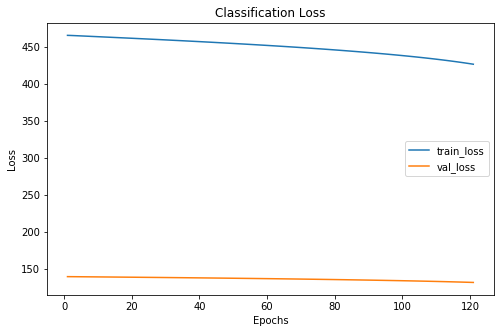

 48%|████▊     | 121/250 [13:40<15:05,  7.02s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 7  37   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    221      76
      2    109      21
Score This Epoch: 0.48925074591240003 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 121 xxxxxxxxxxxxxx


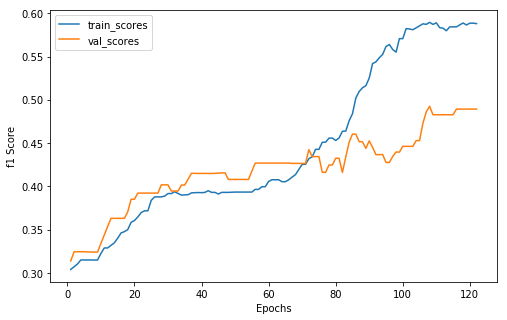

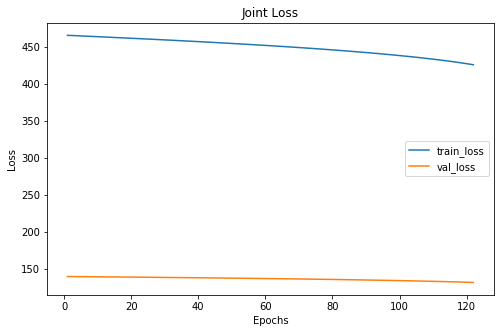

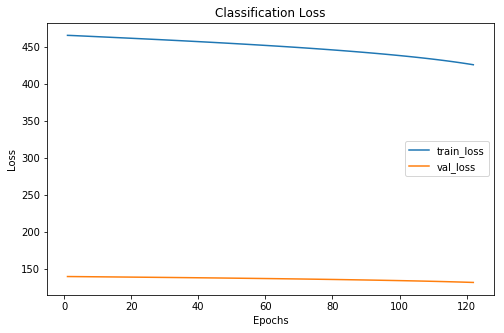

 49%|████▉     | 122/250 [13:47<14:58,  7.02s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 7  37   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     88      29
      1    221      76
      2    110      21
Score This Epoch: 0.48925074591240003 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 122 xxxxxxxxxxxxxx


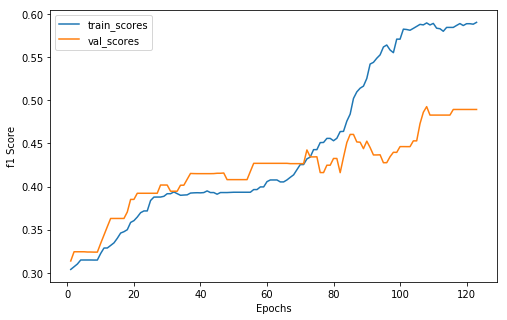

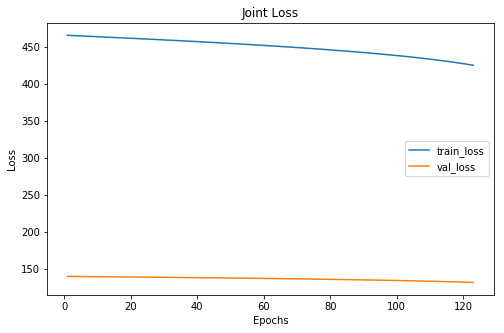

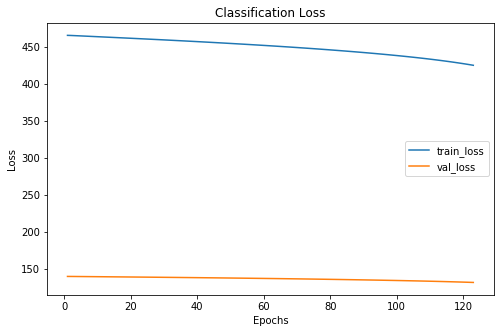

 49%|████▉     | 123/250 [13:54<14:42,  6.95s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 7  37   5
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     88      29
      1    222      76
      2    109      21
Score This Epoch: 0.48925074591240003 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 123 xxxxxxxxxxxxxx


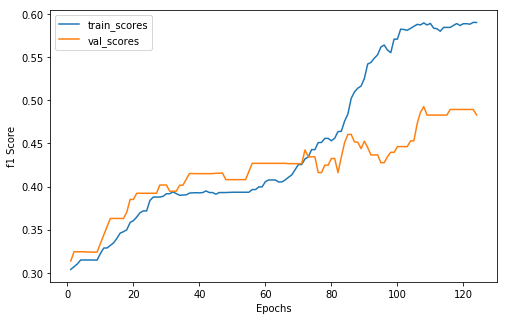

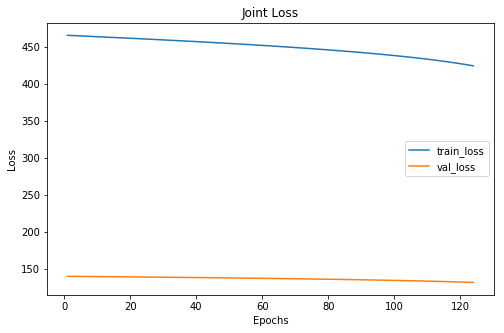

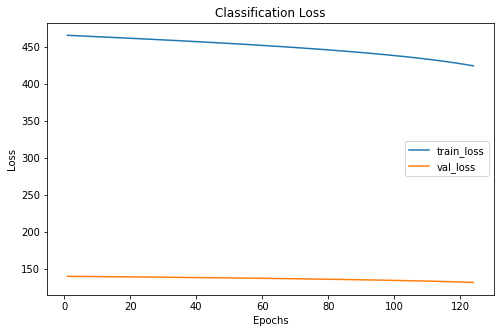

 50%|████▉     | 124/250 [14:01<14:34,  6.94s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 7  36   6
 6  19  11
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     87      29
      1    224      75
      2    108      22
Score This Epoch: 0.48293367031647666 Best Score: 0.4925266015304987
xxxxxxxxxxxxxx epoch: 124 xxxxxxxxxxxxxx


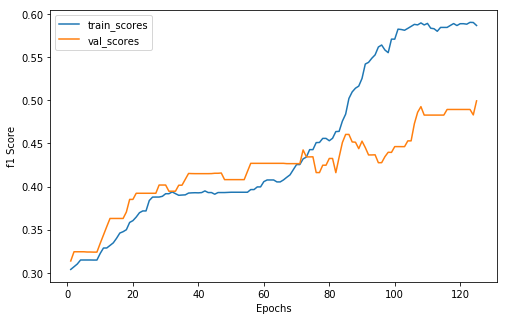

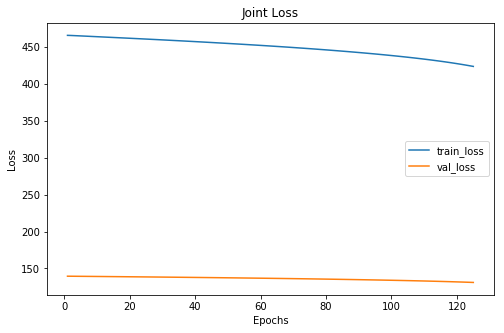

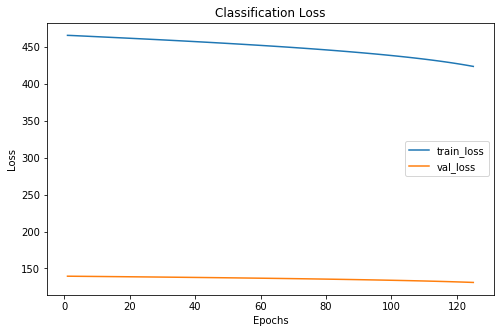

 50%|█████     | 125/250 [14:09<14:44,  7.07s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  20   5
 6  37   6
 6  18  12
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     85      28
      1    225      75
      2    109      23
Score This Epoch: 0.4992102859849549 Best Score: 0.4992102859849549
xxxxxxxxxxxxxx epoch: 125 xxxxxxxxxxxxxx


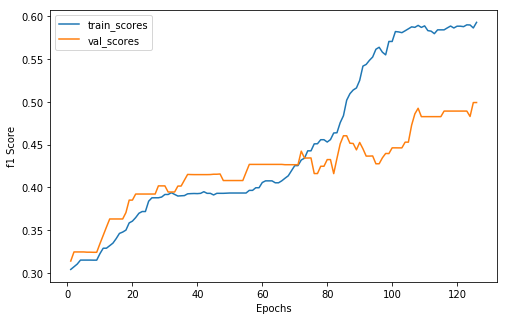

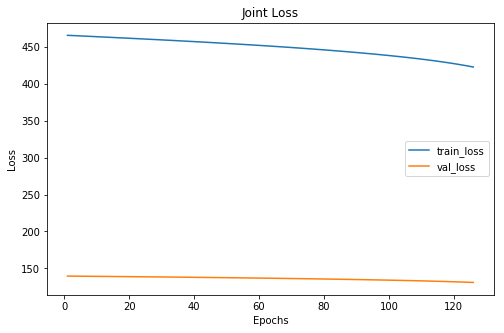

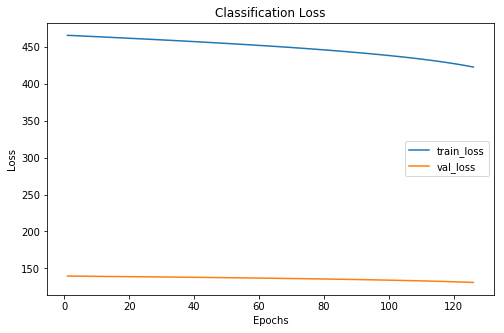

 50%|█████     | 126/250 [14:15<14:30,  7.02s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 6  37   6
 6  17  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     83      27
      1    226      73
      2    110      26
Score This Epoch: 0.49925651557996725 Best Score: 0.49925651557996725
xxxxxxxxxxxxxx epoch: 126 xxxxxxxxxxxxxx


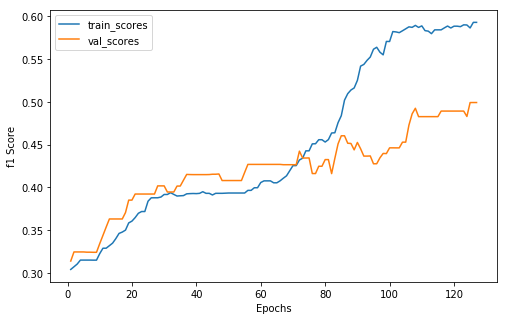

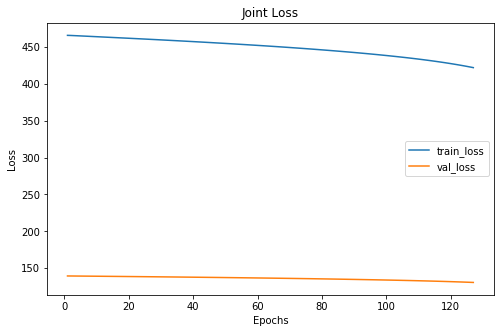

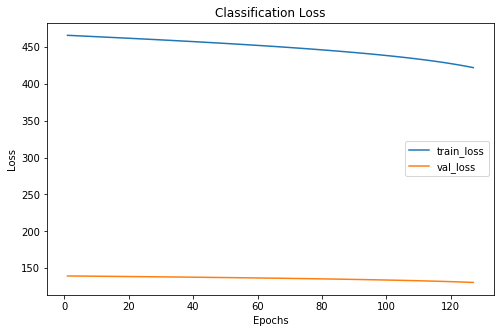

 51%|█████     | 127/250 [14:22<14:00,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 6  37   6
 6  17  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     83      27
      1    226      73
      2    110      26
Score This Epoch: 0.49925651557996725 Best Score: 0.49925651557996725
xxxxxxxxxxxxxx epoch: 127 xxxxxxxxxxxxxx


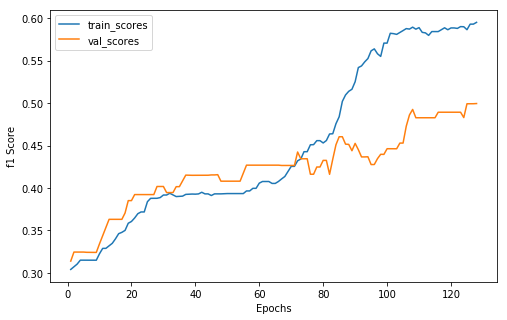

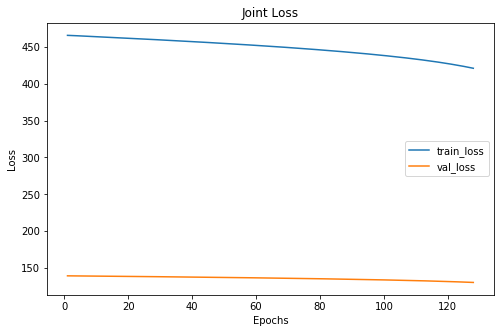

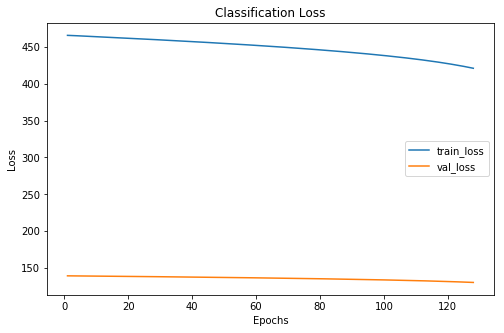

 51%|█████     | 128/250 [14:28<13:34,  6.67s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 6  37   6
 5  18  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     83      26
      1    227      74
      2    109      26
Score This Epoch: 0.49948141226603354 Best Score: 0.49948141226603354
xxxxxxxxxxxxxx epoch: 128 xxxxxxxxxxxxxx


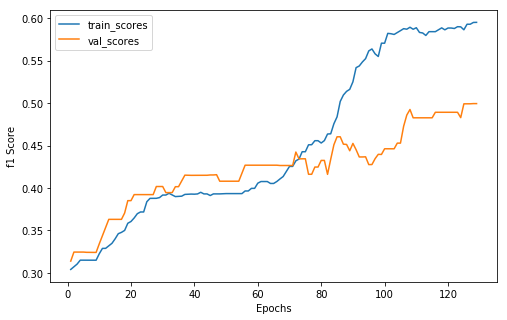

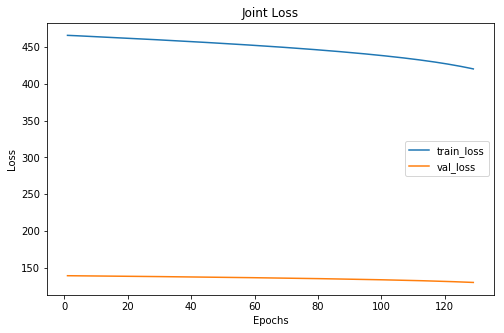

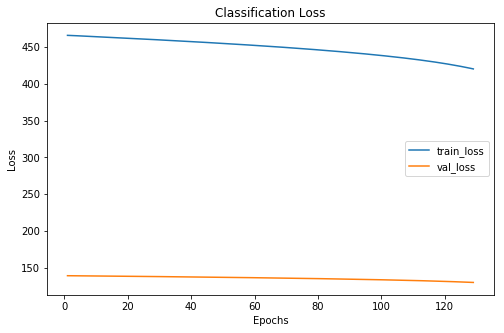

 52%|█████▏    | 129/250 [14:35<13:37,  6.75s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 6  37   6
 5  18  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     83      26
      1    224      74
      2    112      26
Score This Epoch: 0.49948141226603354 Best Score: 0.49948141226603354
xxxxxxxxxxxxxx epoch: 129 xxxxxxxxxxxxxx


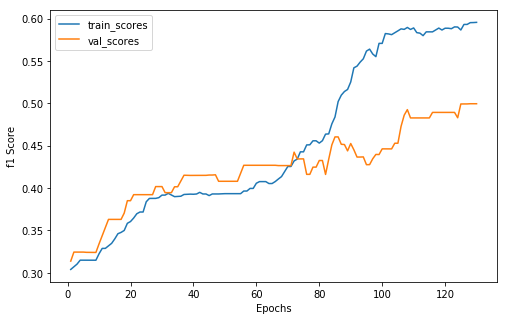

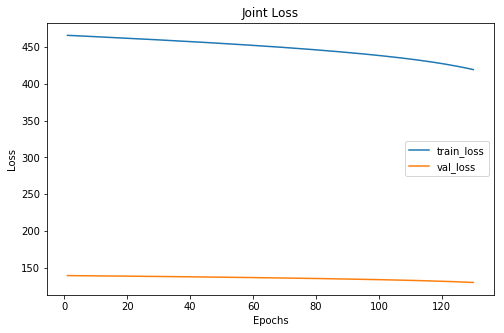

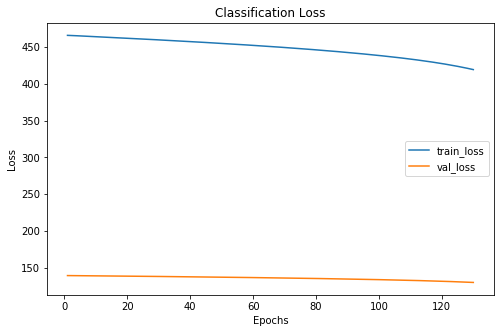

 52%|█████▏    | 130/250 [14:41<13:19,  6.67s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 6  37   6
 5  18  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     83      26
      1    219      74
      2    117      26
Score This Epoch: 0.49948141226603354 Best Score: 0.49948141226603354
xxxxxxxxxxxxxx epoch: 130 xxxxxxxxxxxxxx


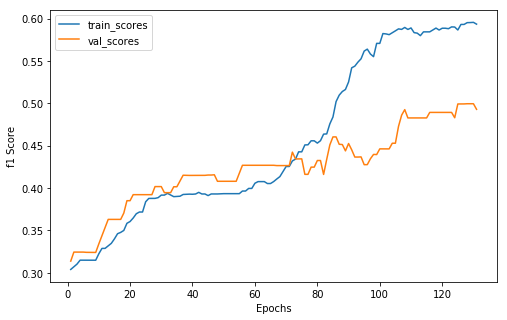

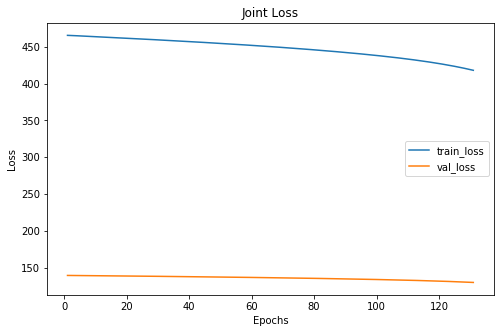

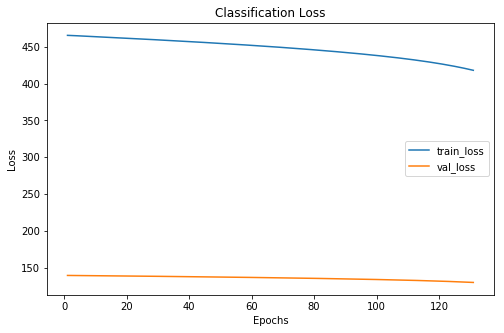

 52%|█████▏    | 131/250 [14:48<13:23,  6.75s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  36   6
 5  18  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     83      27
      1    218      73
      2    118      26
Score This Epoch: 0.4928812878932641 Best Score: 0.49948141226603354
xxxxxxxxxxxxxx epoch: 131 xxxxxxxxxxxxxx


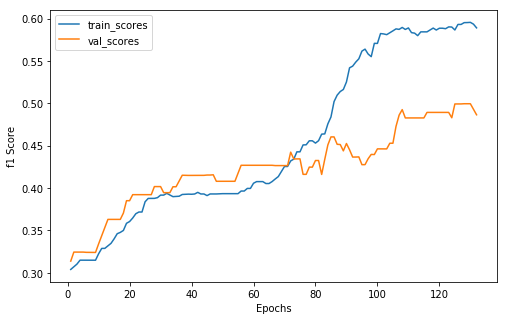

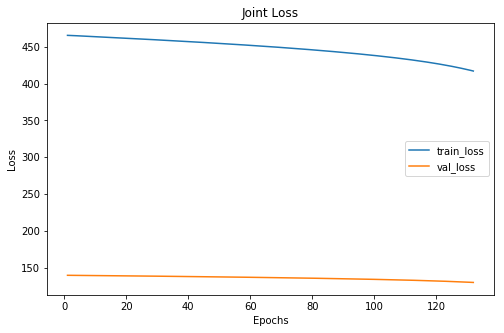

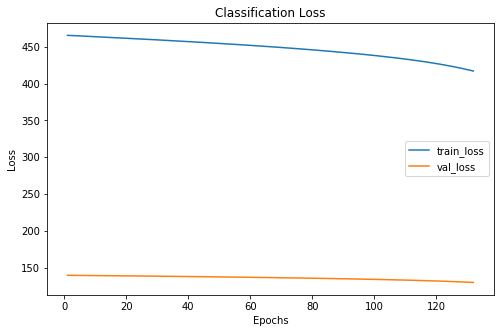

 53%|█████▎    | 132/250 [14:55<13:19,  6.78s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  35   7
 5  18  13
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     83      27
      1    217      72
      2    119      27
Score This Epoch: 0.48644829832759545 Best Score: 0.49948141226603354
xxxxxxxxxxxxxx epoch: 132 xxxxxxxxxxxxxx


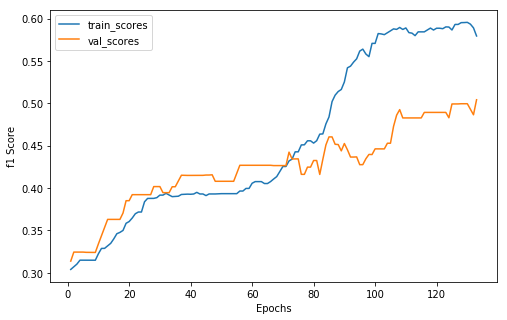

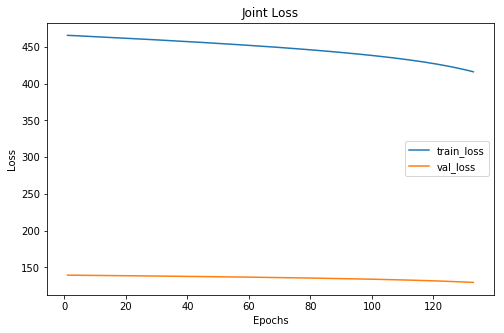

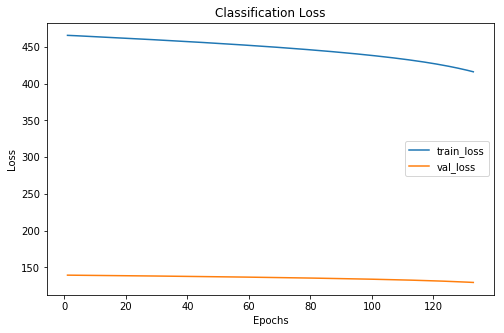

 53%|█████▎    | 133/250 [15:02<13:06,  6.72s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  35   7
 5  16  15
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    218      70
      2    119      29
Score This Epoch: 0.50418372477196 Best Score: 0.50418372477196
xxxxxxxxxxxxxx epoch: 133 xxxxxxxxxxxxxx


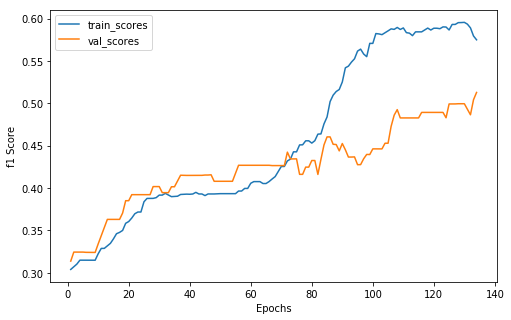

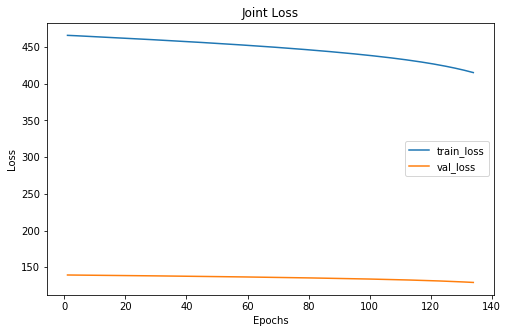

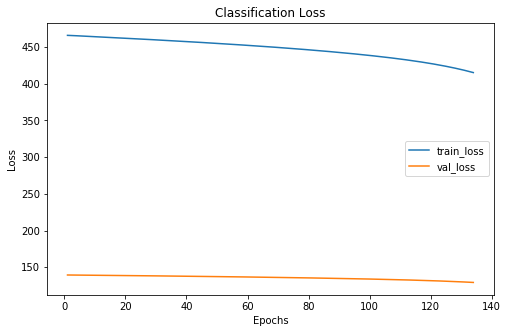

 54%|█████▎    | 134/250 [15:08<12:39,  6.54s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  35   7
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    219      69
      2    118      30
Score This Epoch: 0.5127823599907348 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 134 xxxxxxxxxxxxxx


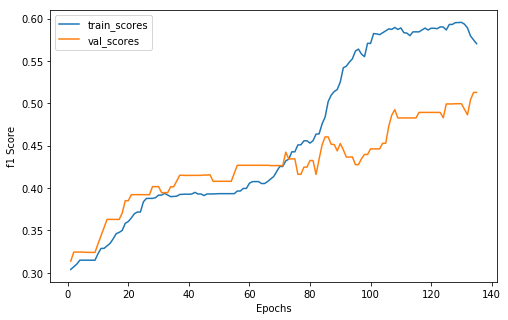

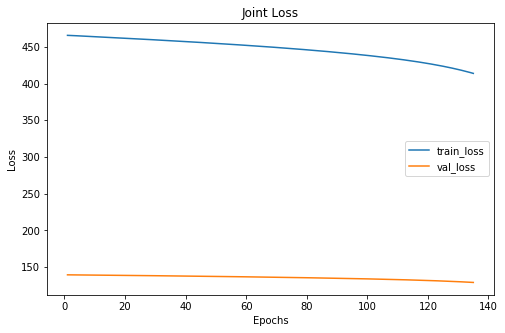

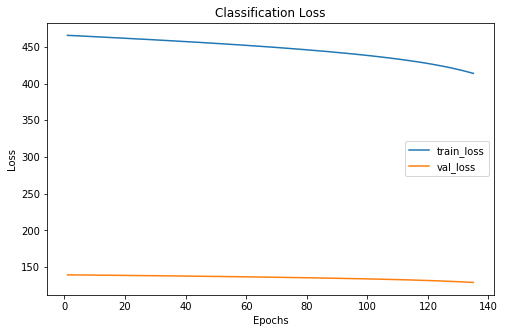

 54%|█████▍    | 135/250 [15:15<12:46,  6.67s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  35   7
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    220      69
      2    117      30
Score This Epoch: 0.5127823599907348 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 135 xxxxxxxxxxxxxx


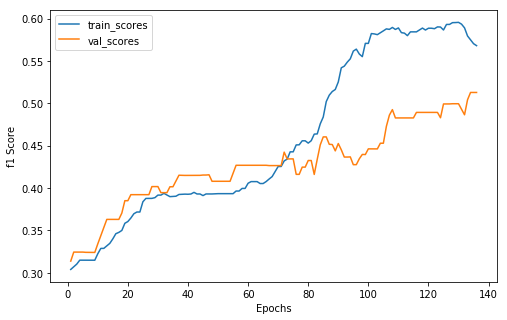

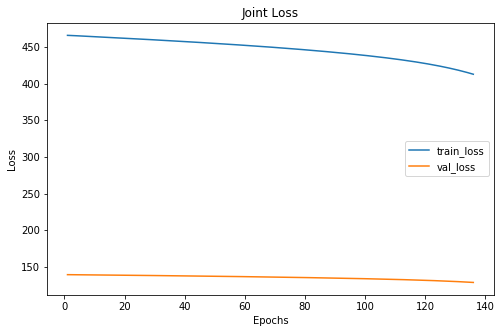

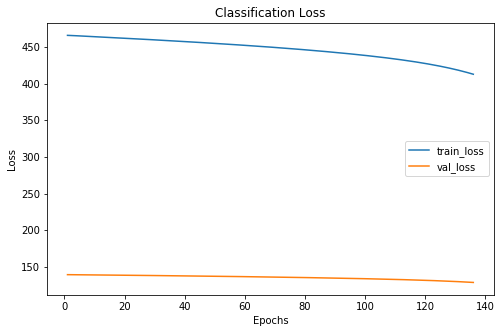

 54%|█████▍    | 136/250 [15:22<12:59,  6.84s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  35   7
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      69
      2    116      30
Score This Epoch: 0.5127823599907348 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 136 xxxxxxxxxxxxxx


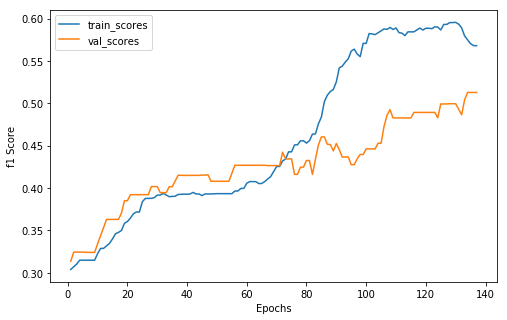

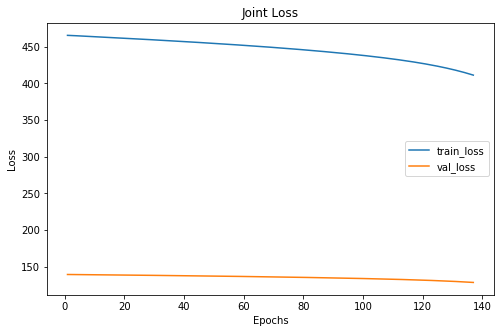

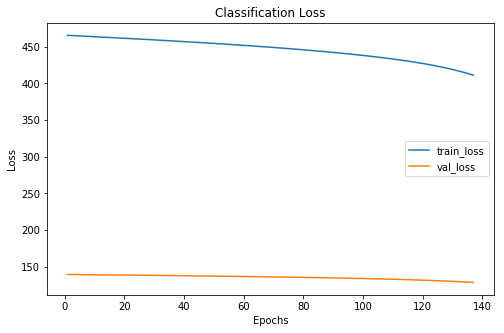

 55%|█████▍    | 137/250 [15:29<12:55,  6.86s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  35   7
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      69
      2    116      30
Score This Epoch: 0.5127823599907348 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 137 xxxxxxxxxxxxxx


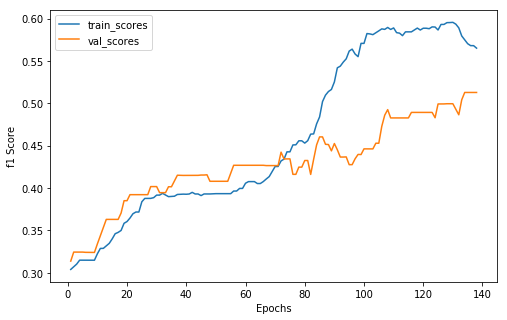

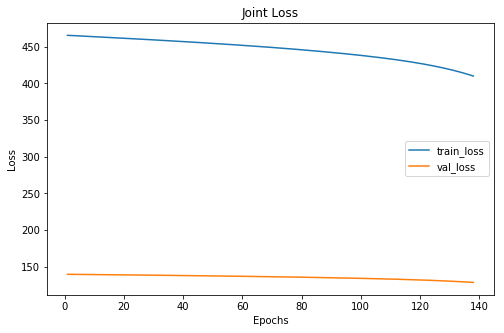

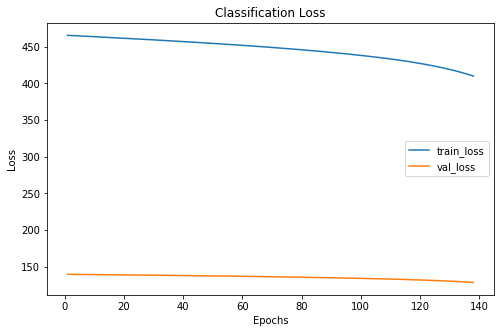

 55%|█████▌    | 138/250 [15:35<12:25,  6.66s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  35   7
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    222      69
      2    116      30
Score This Epoch: 0.5127823599907348 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 138 xxxxxxxxxxxxxx


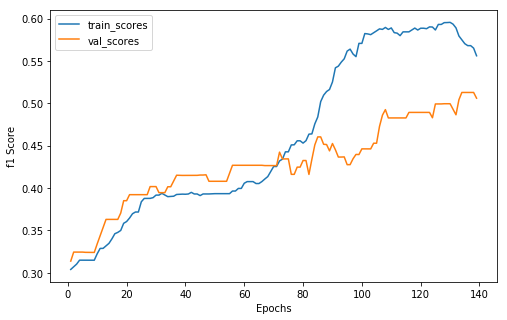

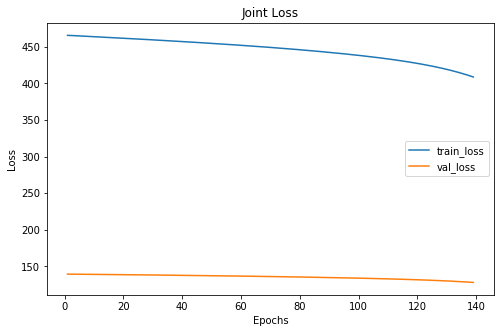

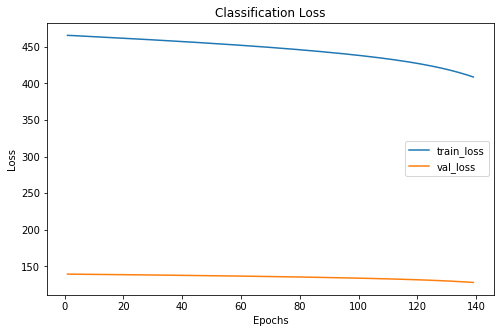

 56%|█████▌    | 139/250 [15:42<12:21,  6.68s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  34   8
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    224      68
      2    114      31
Score This Epoch: 0.5060388700277492 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 139 xxxxxxxxxxxxxx


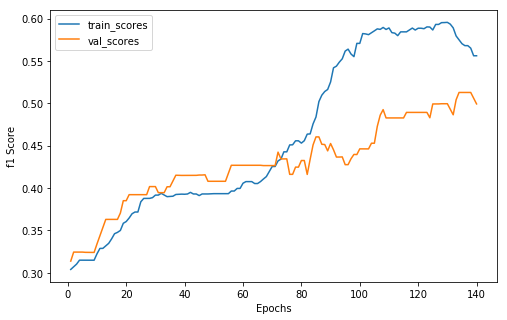

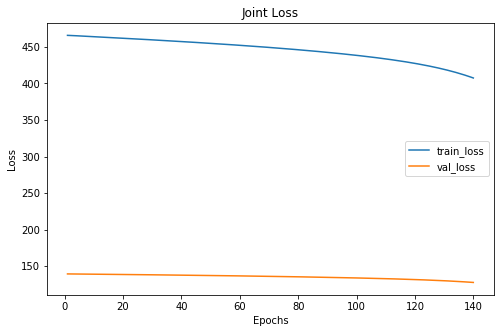

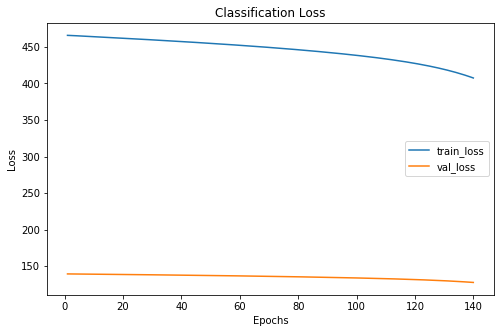

 56%|█████▌    | 140/250 [15:49<12:26,  6.78s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  33   9
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    224      67
      2    114      32
Score This Epoch: 0.4992755722978847 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 140 xxxxxxxxxxxxxx


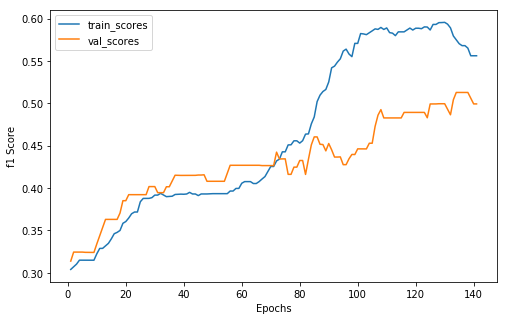

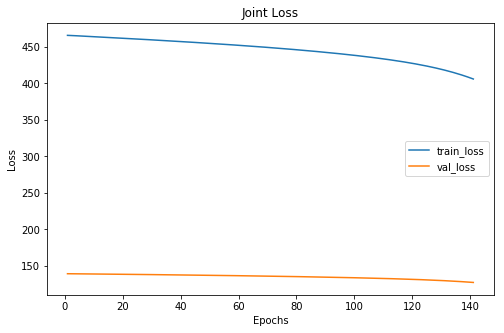

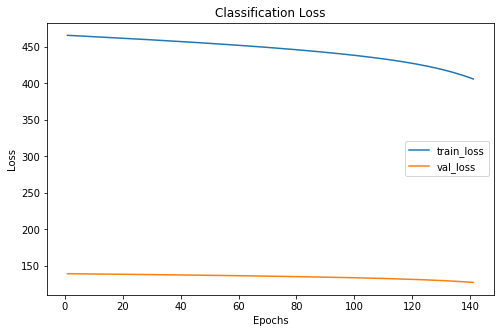

 56%|█████▋    | 141/250 [15:56<12:14,  6.74s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  33   9
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    224      67
      2    114      32
Score This Epoch: 0.4992755722978847 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 141 xxxxxxxxxxxxxx


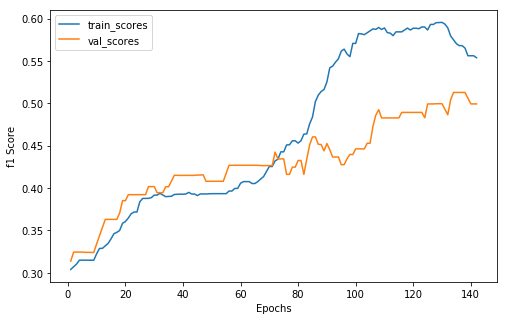

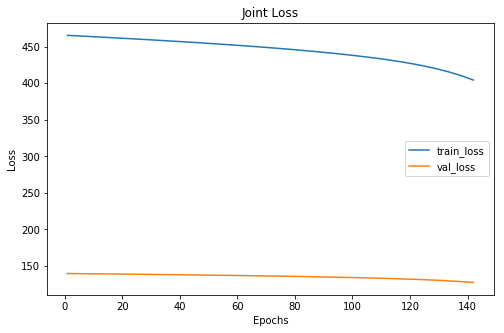

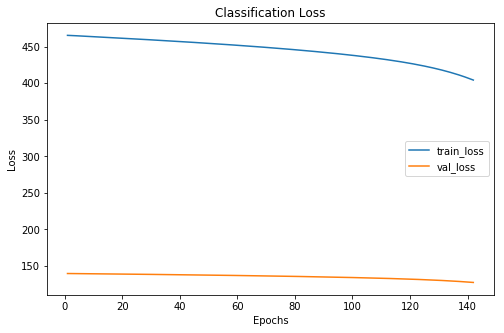

 57%|█████▋    | 142/250 [16:03<12:12,  6.78s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  33   9
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    225      67
      2    113      32
Score This Epoch: 0.4992755722978847 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 142 xxxxxxxxxxxxxx


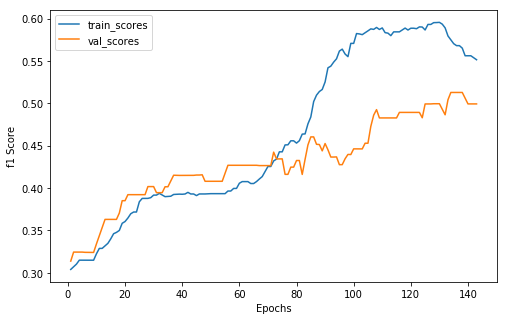

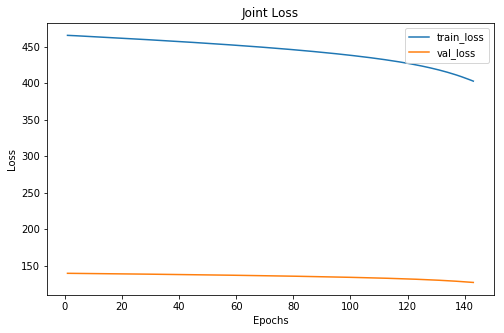

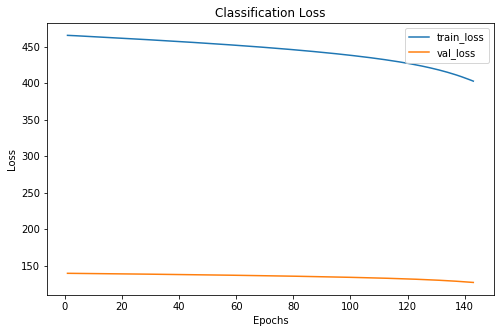

 57%|█████▋    | 143/250 [16:09<11:58,  6.72s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  33   9
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    226      67
      2    112      32
Score This Epoch: 0.4992755722978847 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 143 xxxxxxxxxxxxxx


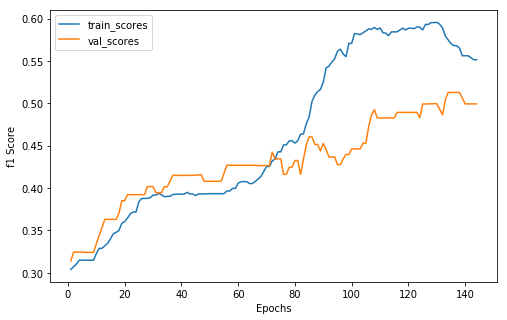

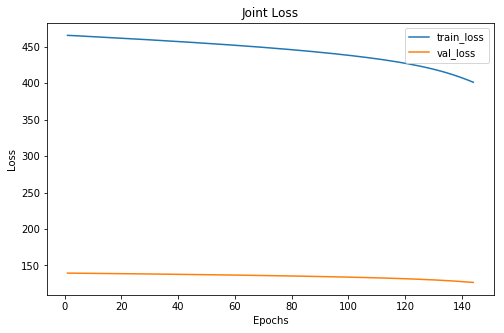

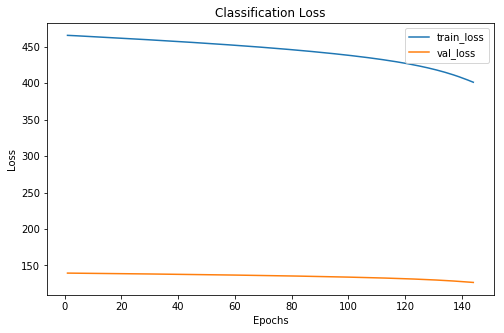

 58%|█████▊    | 144/250 [16:16<11:52,  6.72s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  33   9
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    226      67
      2    112      32
Score This Epoch: 0.4992755722978847 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 144 xxxxxxxxxxxxxx


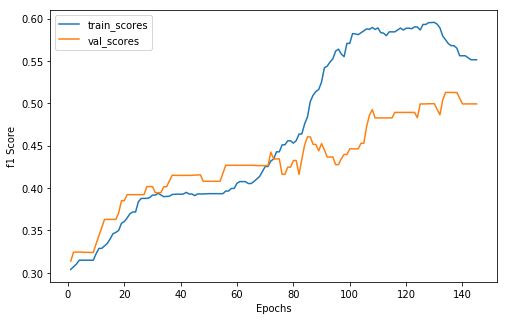

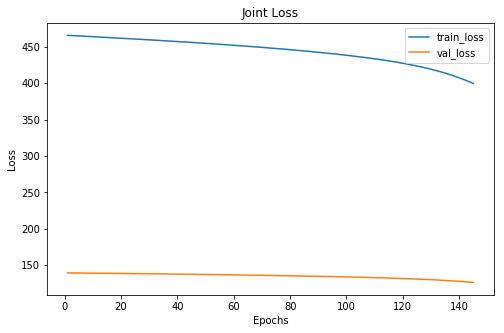

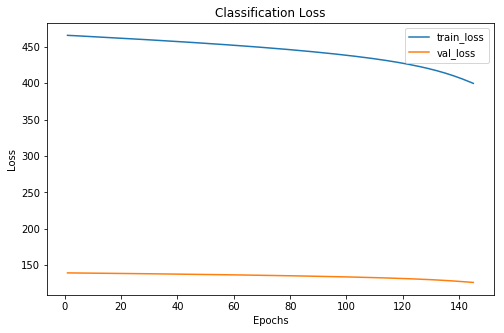

 58%|█████▊    | 145/250 [16:23<11:47,  6.74s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  33   9
 5  15  16
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    226      67
      2    112      32
Score This Epoch: 0.4992755722978847 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 145 xxxxxxxxxxxxxx


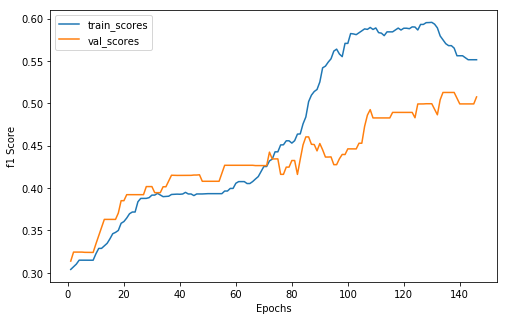

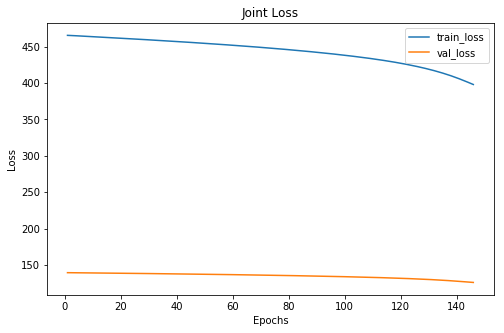

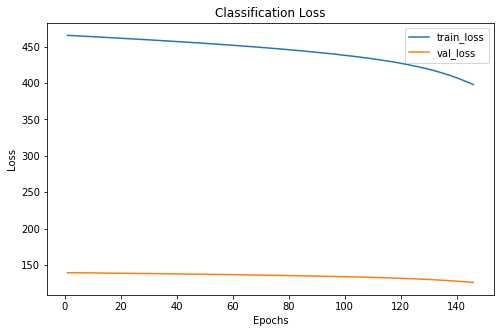

 58%|█████▊    | 146/250 [16:30<11:44,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  33   9
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    226      66
      2    112      33
Score This Epoch: 0.5075325782486908 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 146 xxxxxxxxxxxxxx


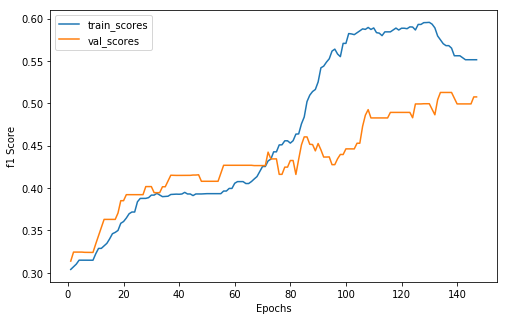

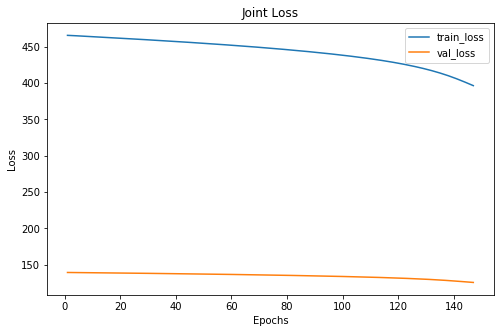

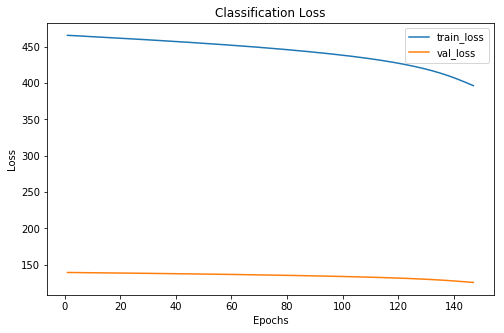

 59%|█████▉    | 147/250 [16:36<11:43,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  33   9
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    226      66
      2    112      33
Score This Epoch: 0.5075325782486908 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 147 xxxxxxxxxxxxxx


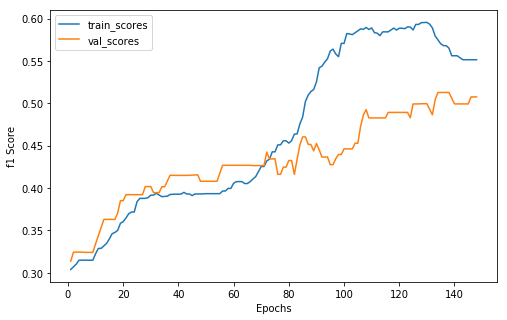

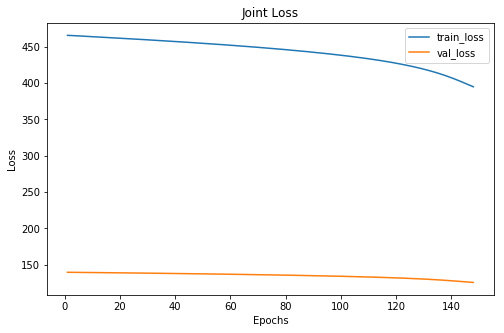

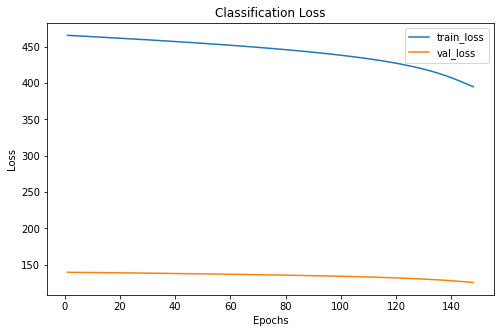

 59%|█████▉    | 148/250 [16:43<11:26,  6.73s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  33   9
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    226      66
      2    112      33
Score This Epoch: 0.5075325782486908 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 148 xxxxxxxxxxxxxx


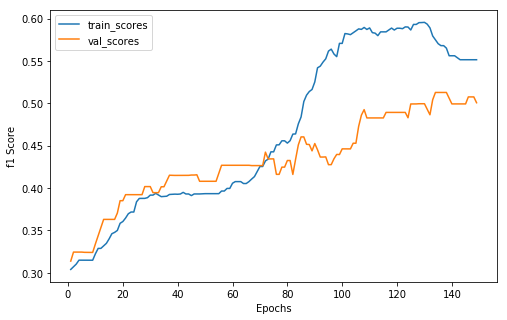

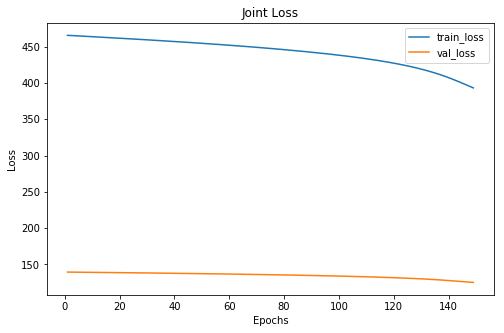

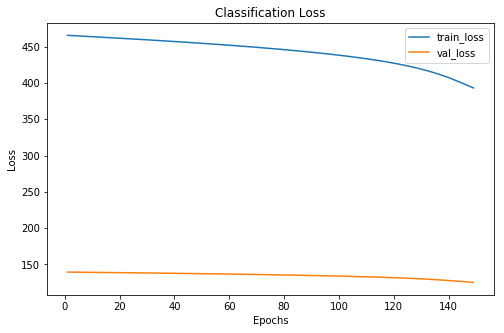

 60%|█████▉    | 149/250 [16:50<11:32,  6.86s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  32  10
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    226      65
      2    112      34
Score This Epoch: 0.5006565199179087 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 149 xxxxxxxxxxxxxx


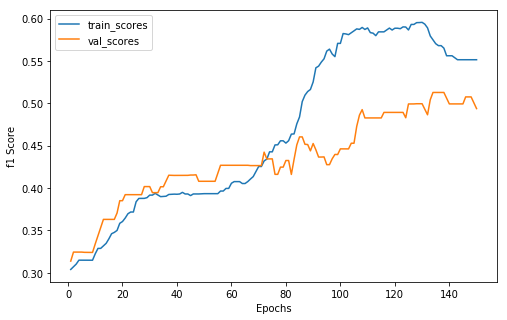

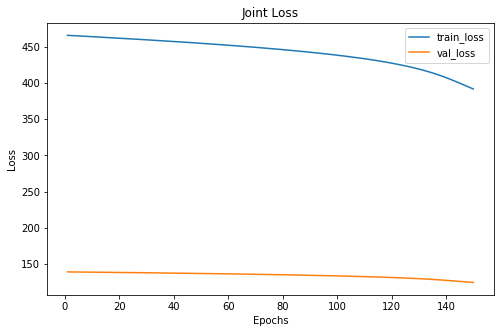

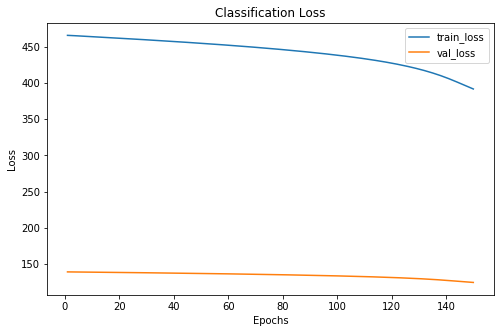

 60%|██████    | 150/250 [16:57<11:38,  6.99s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    226      64
      2    112      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 150 xxxxxxxxxxxxxx


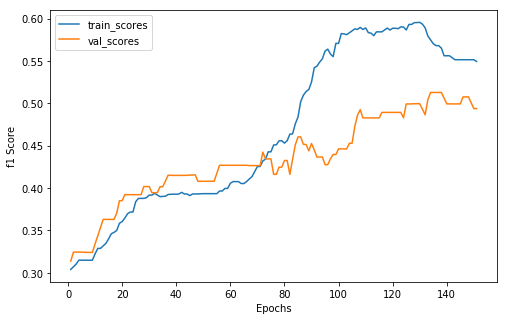

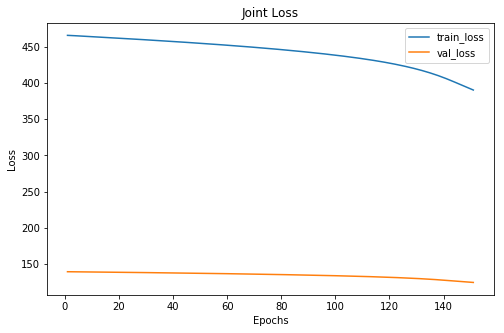

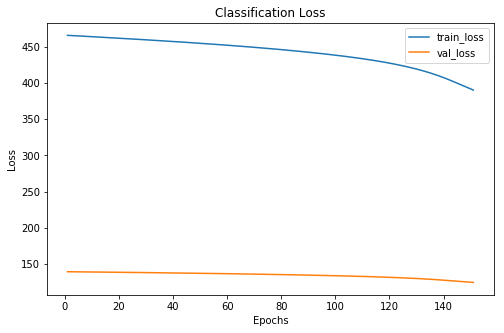

 60%|██████    | 151/250 [17:05<11:38,  7.06s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    225      64
      2    113      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 151 xxxxxxxxxxxxxx


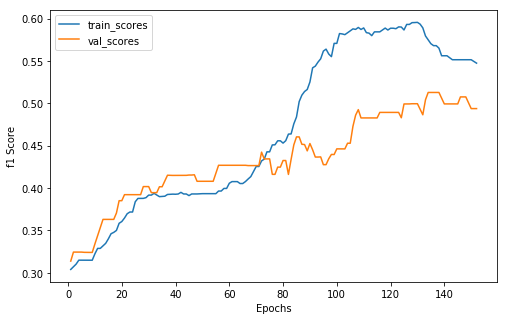

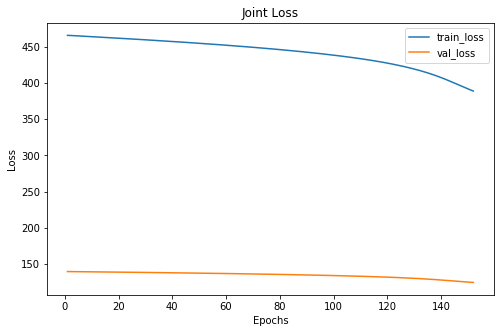

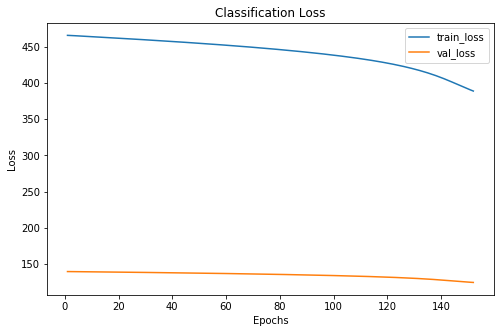

 61%|██████    | 152/250 [17:11<11:19,  6.93s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    224      64
      2    114      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 152 xxxxxxxxxxxxxx


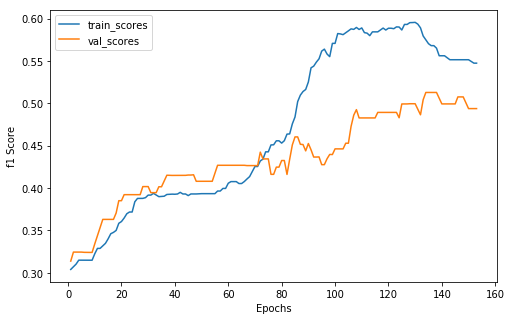

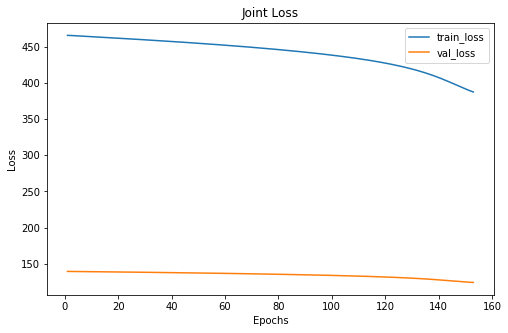

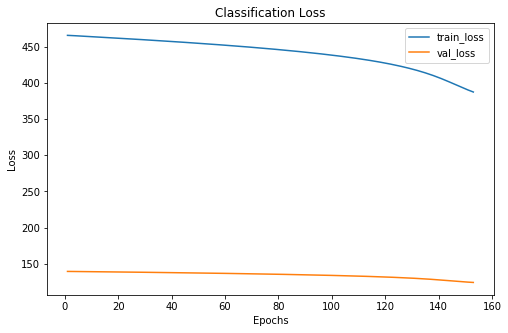

 61%|██████    | 153/250 [17:18<11:20,  7.02s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    224      64
      2    114      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 153 xxxxxxxxxxxxxx


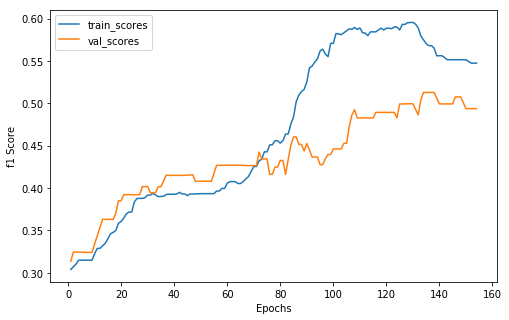

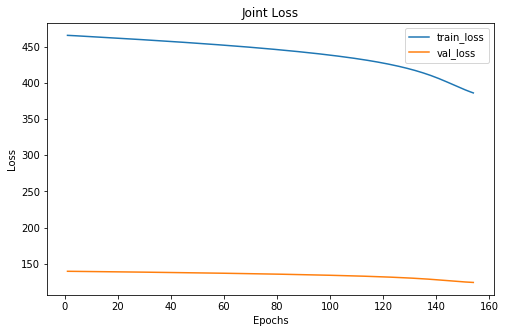

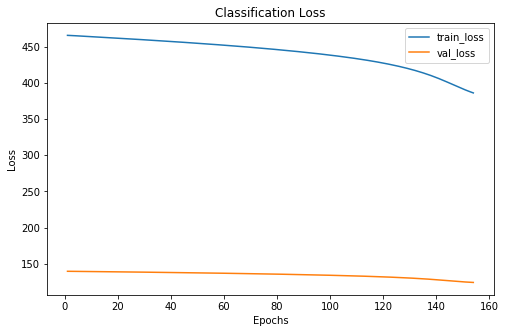

 62%|██████▏   | 154/250 [17:25<10:59,  6.87s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     81      27
      1    224      64
      2    114      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 154 xxxxxxxxxxxxxx


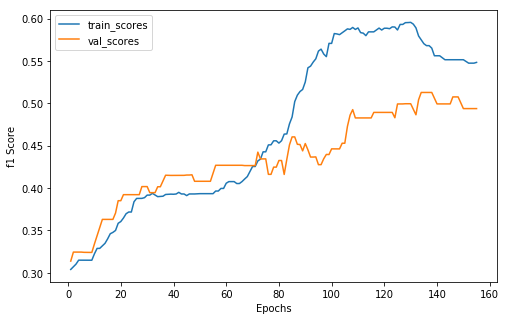

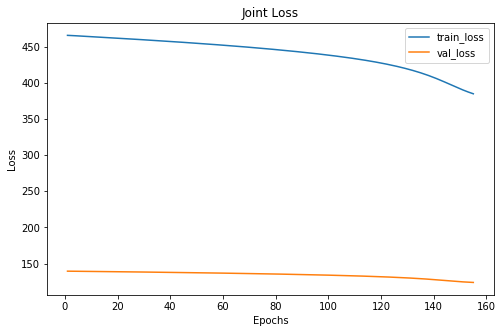

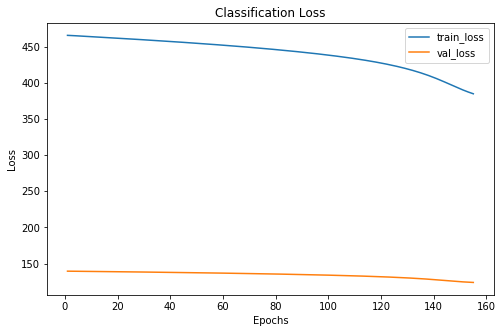

 62%|██████▏   | 155/250 [17:31<10:27,  6.60s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    222      64
      2    115      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 155 xxxxxxxxxxxxxx


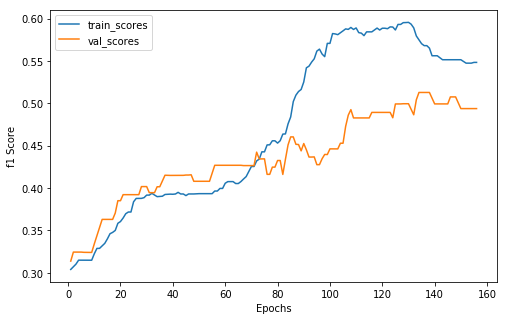

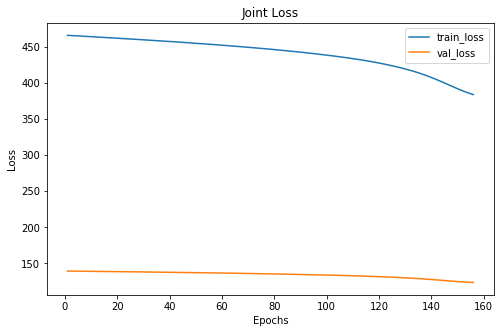

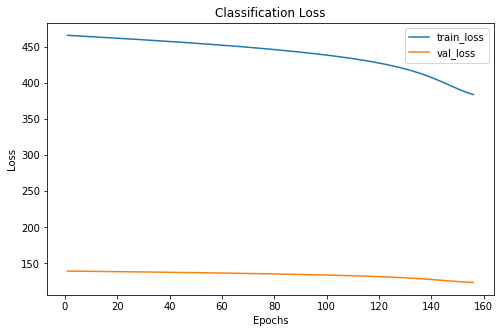

 62%|██████▏   | 156/250 [17:38<10:29,  6.69s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    222      64
      2    115      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 156 xxxxxxxxxxxxxx


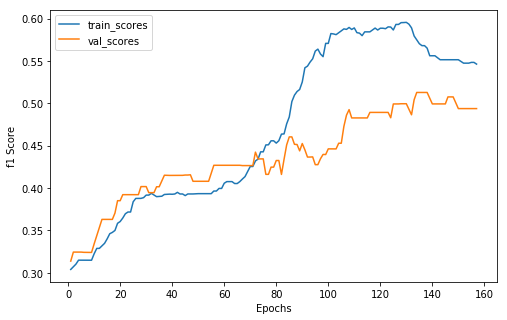

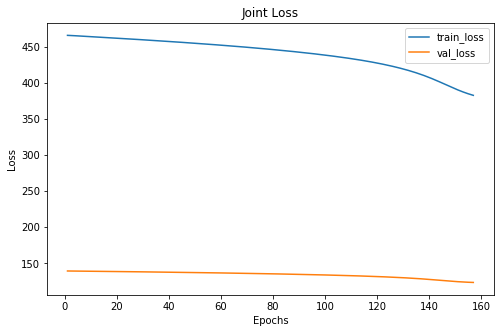

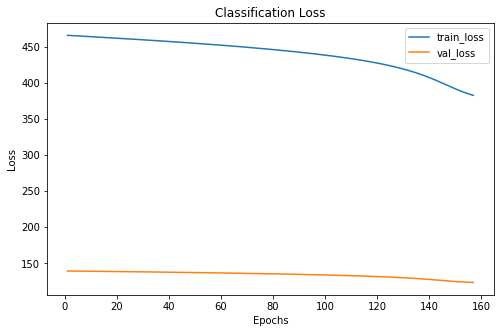

 63%|██████▎   | 157/250 [17:45<10:34,  6.82s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 157 xxxxxxxxxxxxxx


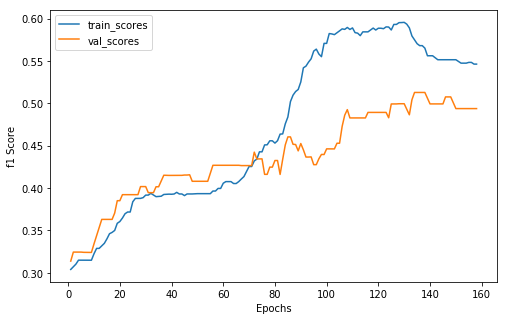

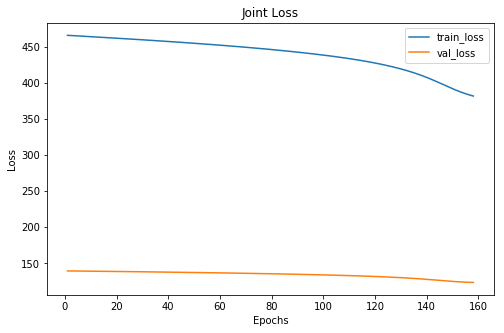

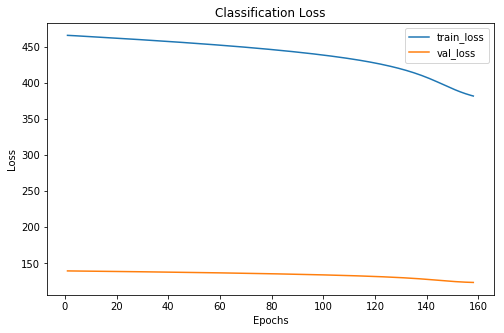

 63%|██████▎   | 158/250 [17:52<10:28,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 158 xxxxxxxxxxxxxx


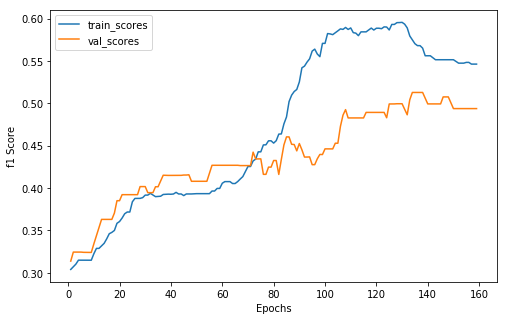

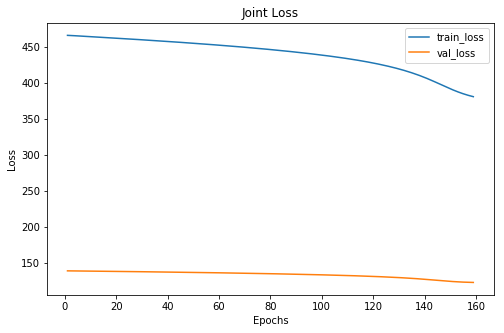

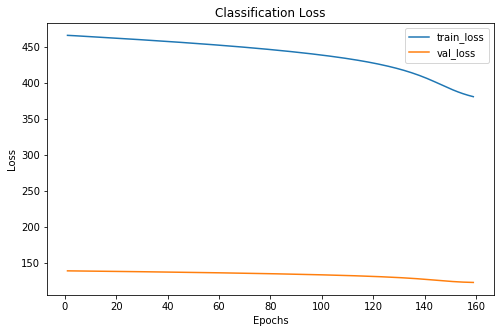

 64%|██████▎   | 159/250 [17:59<10:33,  6.96s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 159 xxxxxxxxxxxxxx


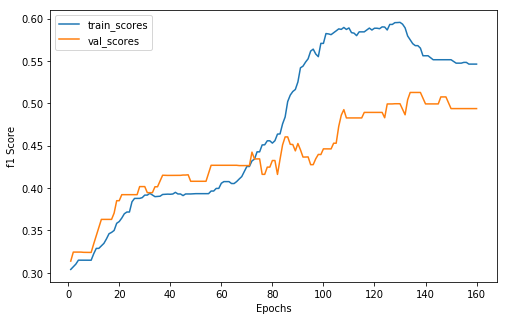

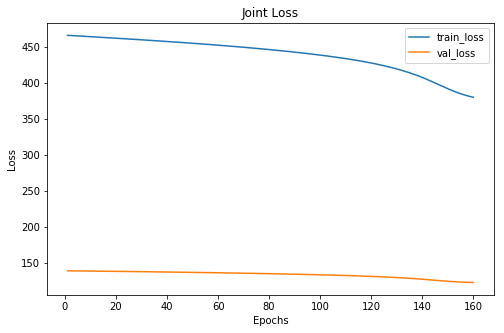

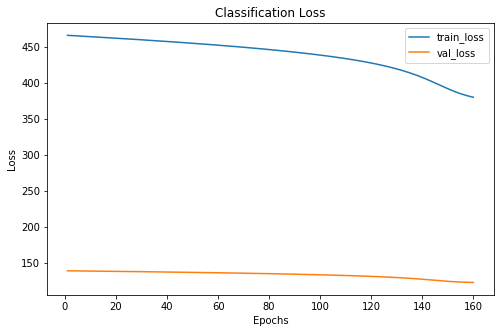

 64%|██████▍   | 160/250 [18:06<10:25,  6.95s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 160 xxxxxxxxxxxxxx


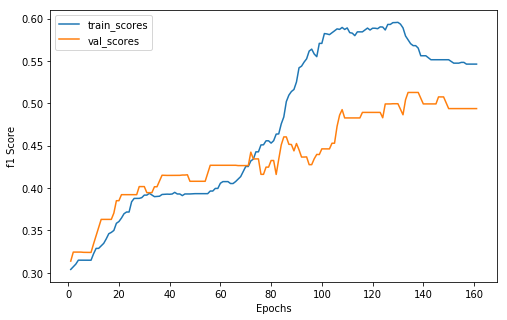

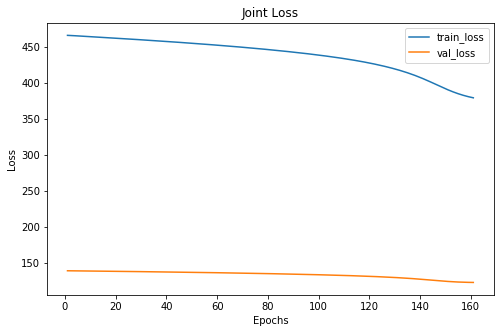

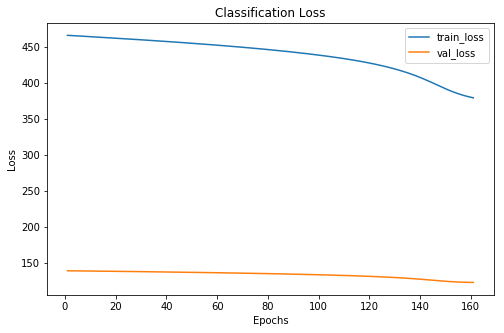

 64%|██████▍   | 161/250 [18:13<10:25,  7.02s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 161 xxxxxxxxxxxxxx


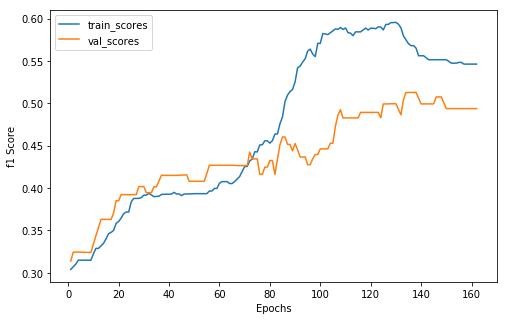

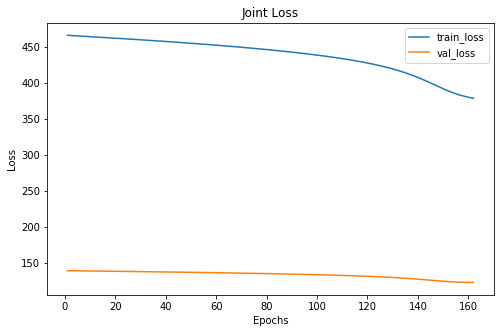

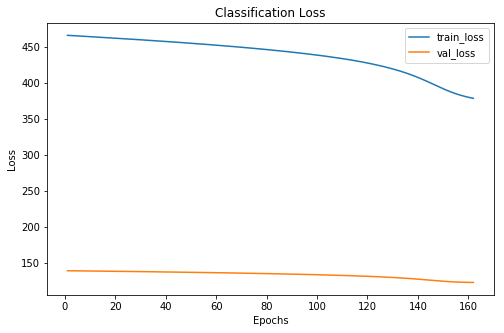

 65%|██████▍   | 162/250 [18:20<10:06,  6.89s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 162 xxxxxxxxxxxxxx


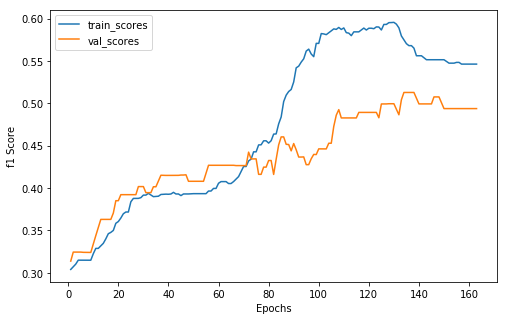

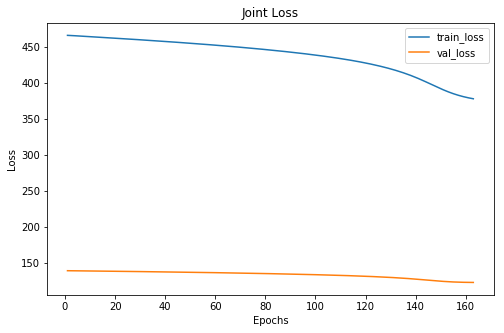

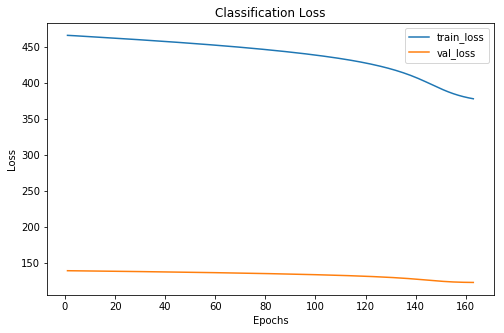

 65%|██████▌   | 163/250 [18:27<10:00,  6.91s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 163 xxxxxxxxxxxxxx


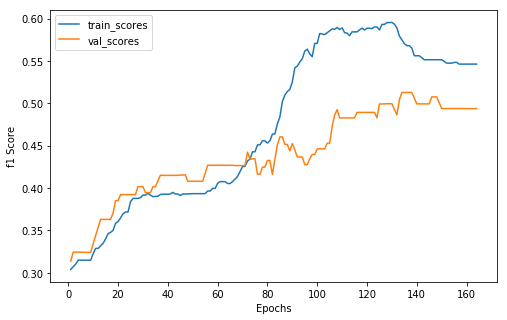

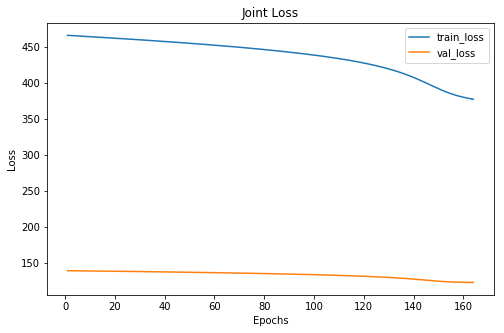

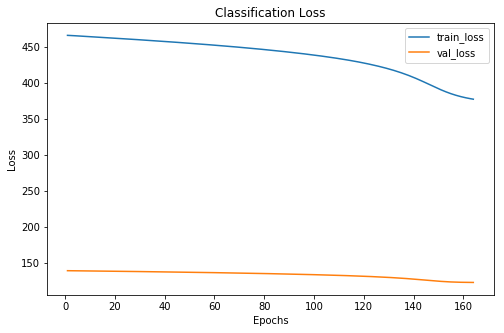

 66%|██████▌   | 164/250 [18:34<09:49,  6.86s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 164 xxxxxxxxxxxxxx


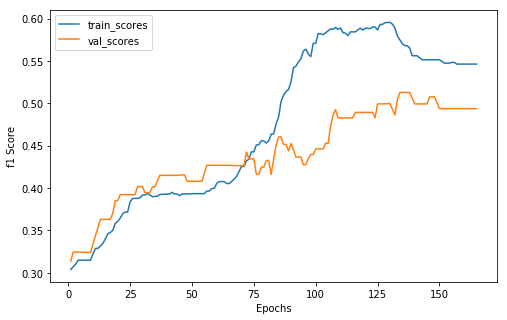

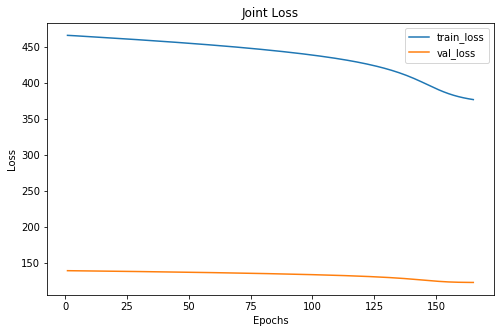

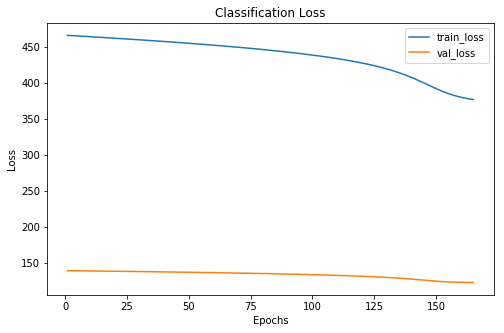

 66%|██████▌   | 165/250 [18:40<09:37,  6.79s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 165 xxxxxxxxxxxxxx


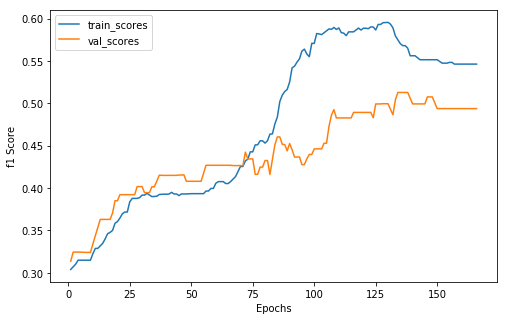

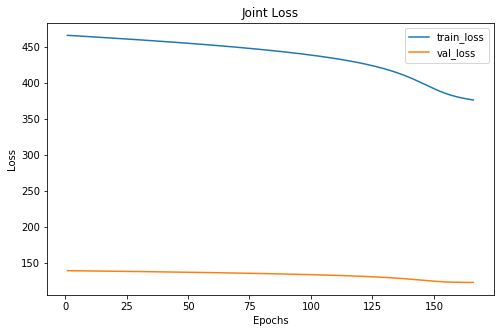

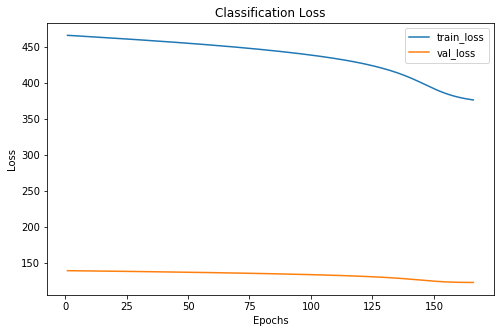

 66%|██████▋   | 166/250 [18:47<09:31,  6.81s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 166 xxxxxxxxxxxxxx


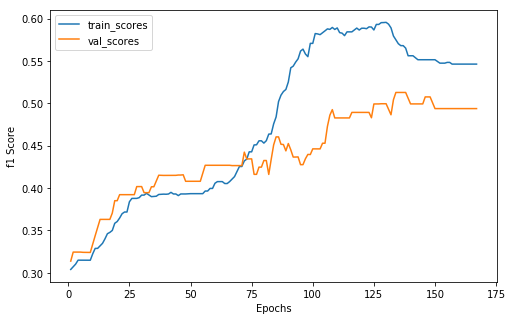

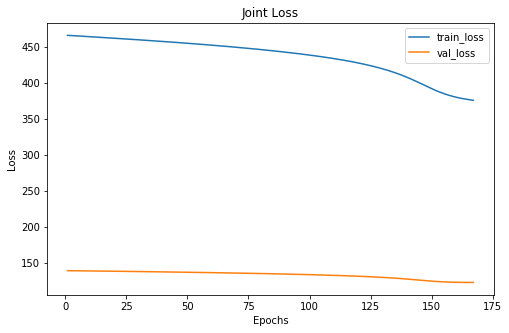

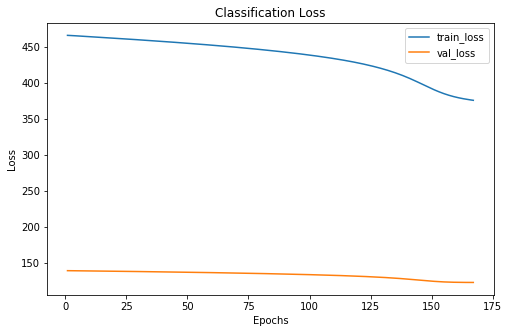

 67%|██████▋   | 167/250 [18:54<09:27,  6.84s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 167 xxxxxxxxxxxxxx


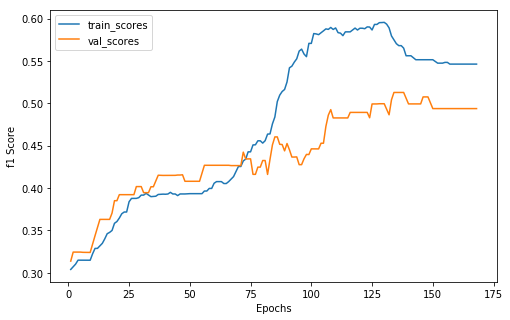

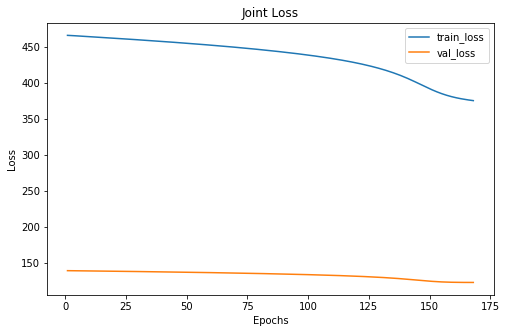

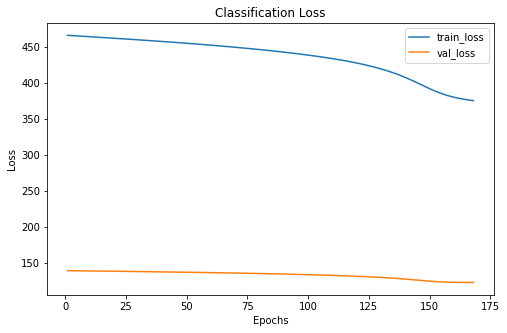

 67%|██████▋   | 168/250 [19:01<09:25,  6.90s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 168 xxxxxxxxxxxxxx


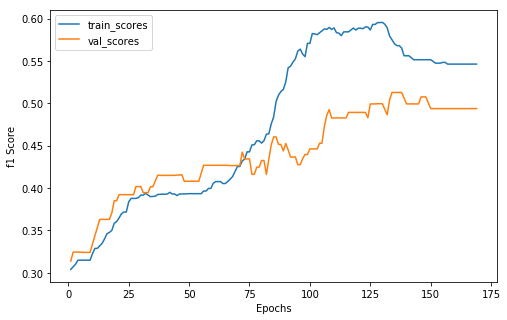

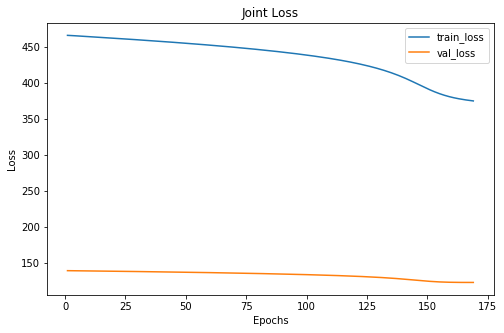

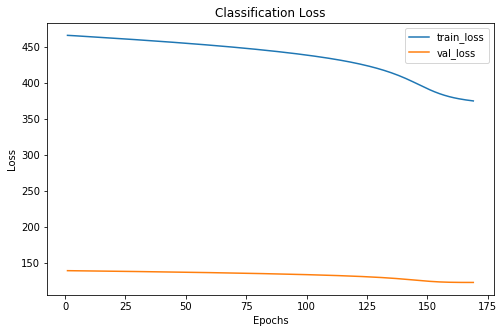

 68%|██████▊   | 169/250 [19:07<09:10,  6.79s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 169 xxxxxxxxxxxxxx


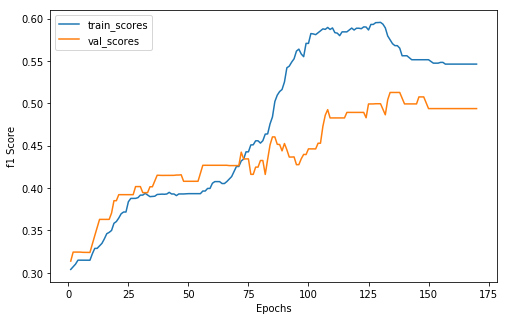

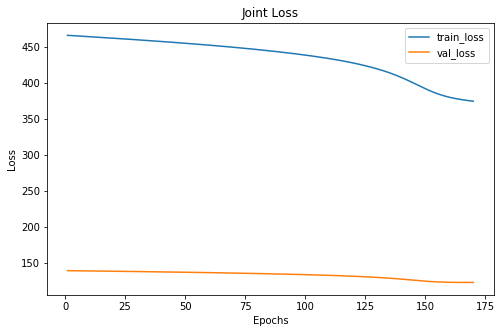

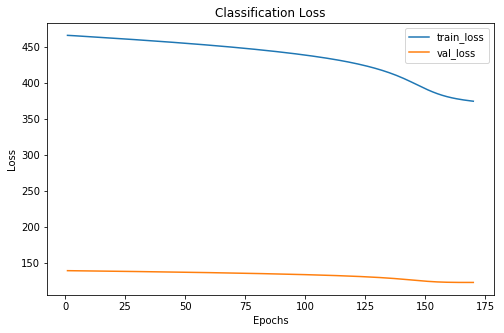

 68%|██████▊   | 170/250 [19:14<08:47,  6.59s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 170 xxxxxxxxxxxxxx


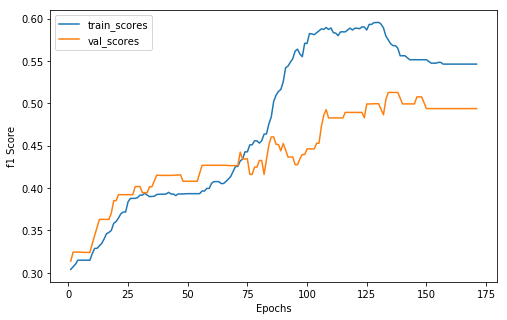

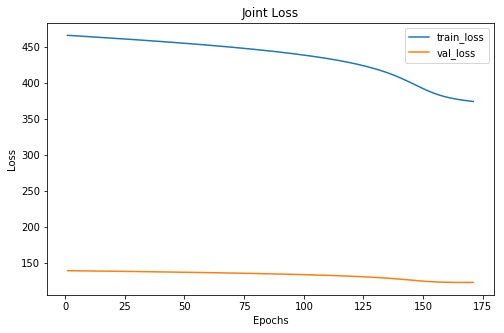

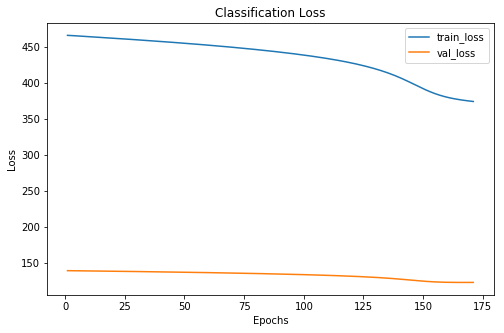

 68%|██████▊   | 171/250 [19:21<08:51,  6.72s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     82      27
      1    221      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 171 xxxxxxxxxxxxxx


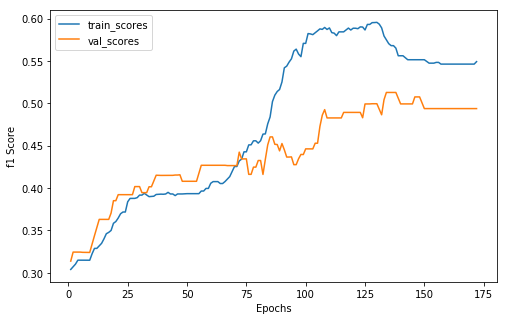

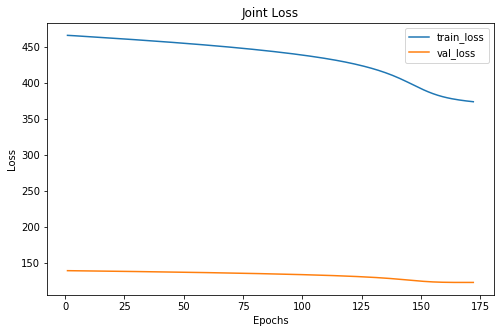

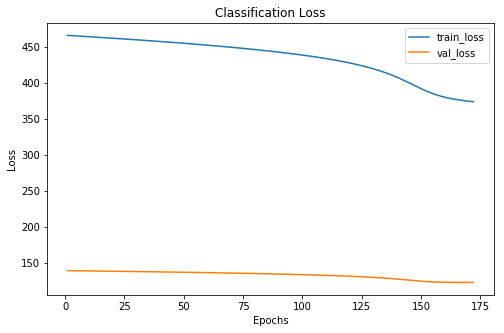

 69%|██████▉   | 172/250 [19:28<08:54,  6.86s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     83      27
      1    220      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 172 xxxxxxxxxxxxxx


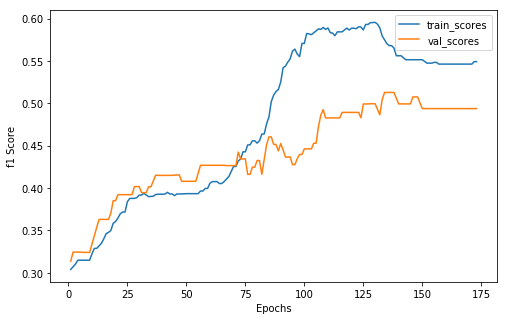

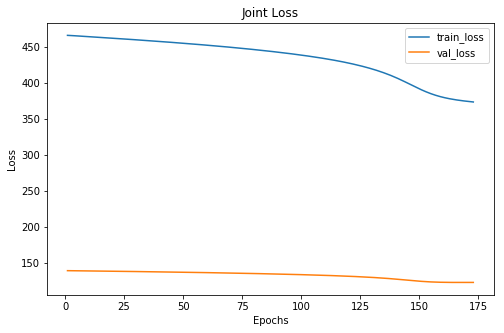

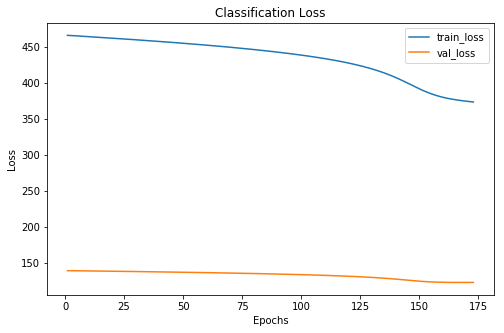

 69%|██████▉   | 173/250 [19:35<08:53,  6.93s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     83      27
      1    220      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 173 xxxxxxxxxxxxxx


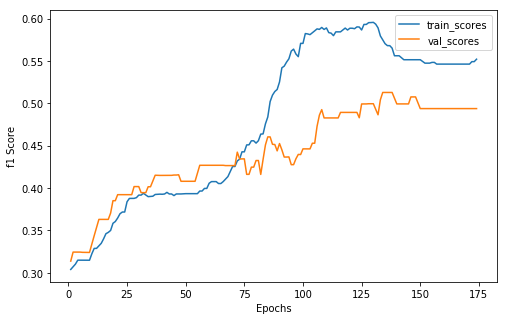

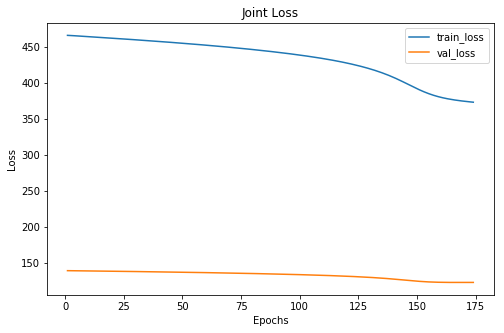

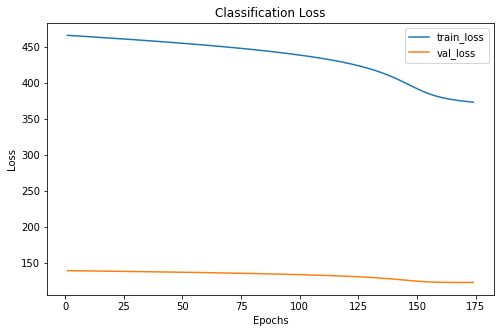

 70%|██████▉   | 174/250 [19:42<08:49,  6.96s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     84      27
      1    219      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 174 xxxxxxxxxxxxxx


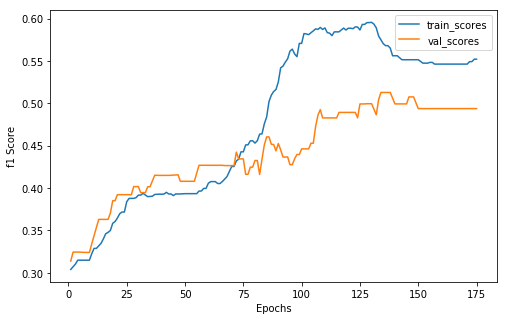

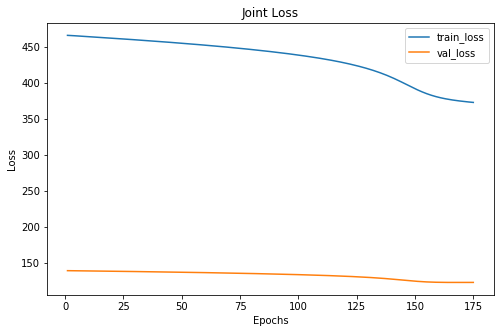

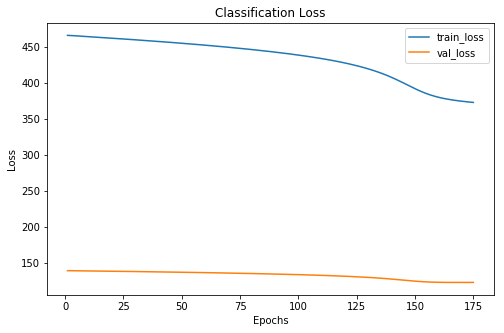

 70%|███████   | 175/250 [19:48<08:27,  6.77s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     84      27
      1    219      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 175 xxxxxxxxxxxxxx


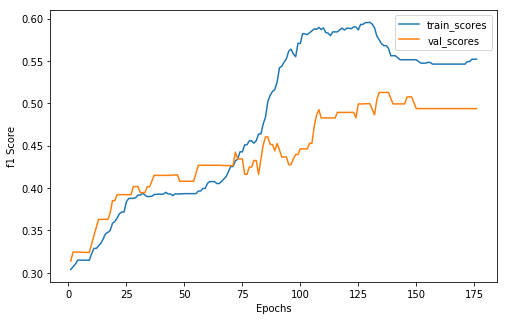

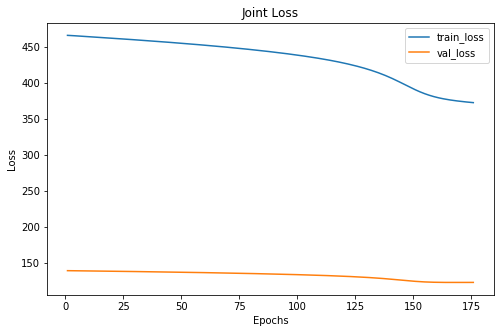

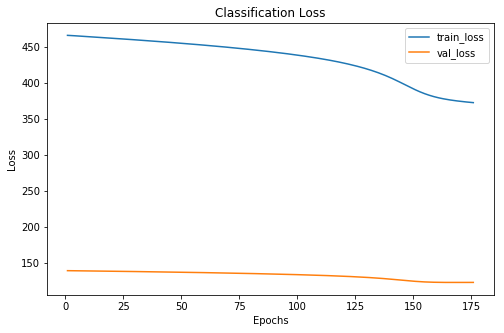

 70%|███████   | 176/250 [19:55<08:20,  6.76s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     84      27
      1    219      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 176 xxxxxxxxxxxxxx


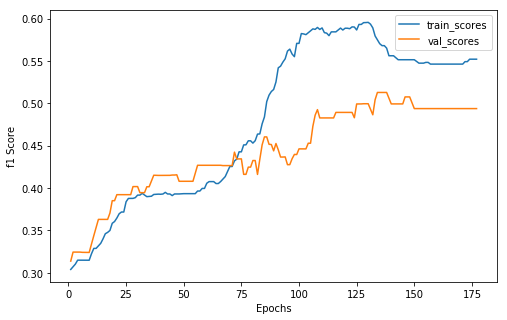

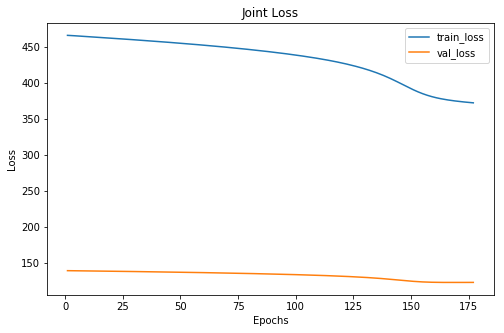

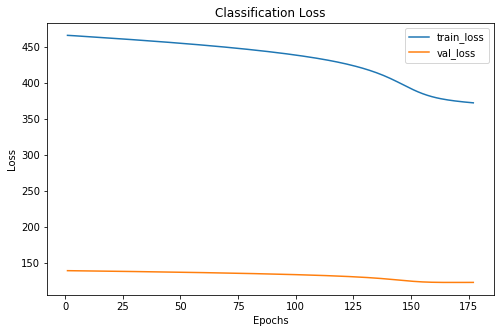

 71%|███████   | 177/250 [20:02<08:20,  6.85s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     84      27
      1    219      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 177 xxxxxxxxxxxxxx


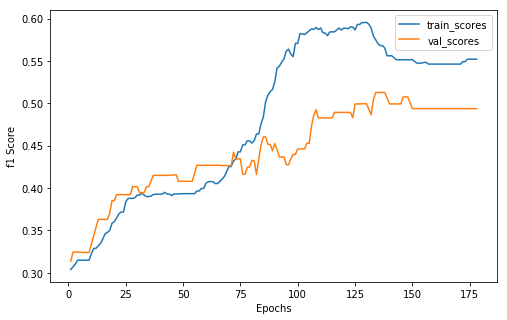

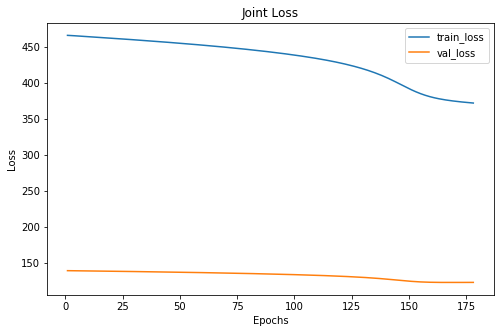

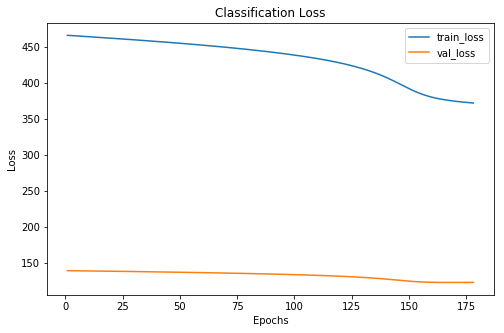

 71%|███████   | 178/250 [20:09<08:10,  6.81s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     84      27
      1    219      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 178 xxxxxxxxxxxxxx


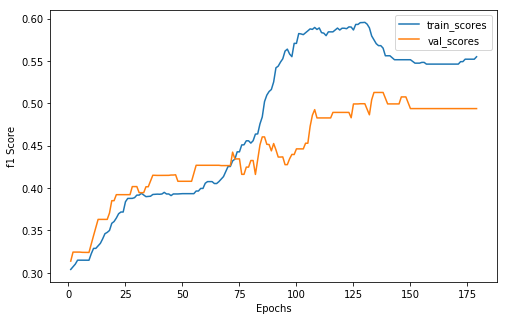

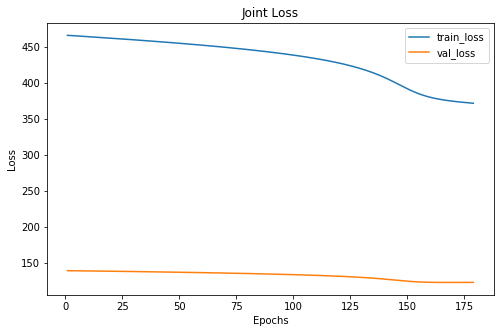

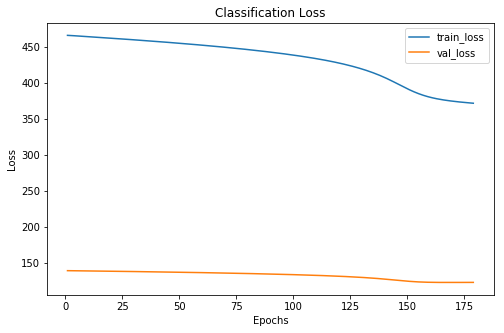

 72%|███████▏  | 179/250 [20:16<08:08,  6.88s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     85      27
      1    218      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 179 xxxxxxxxxxxxxx


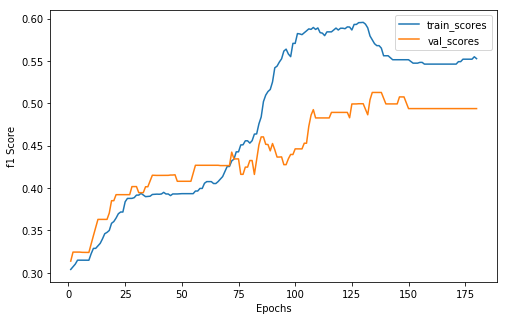

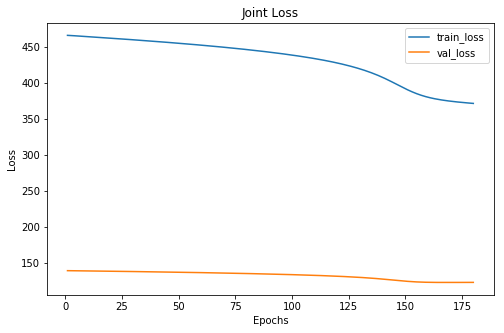

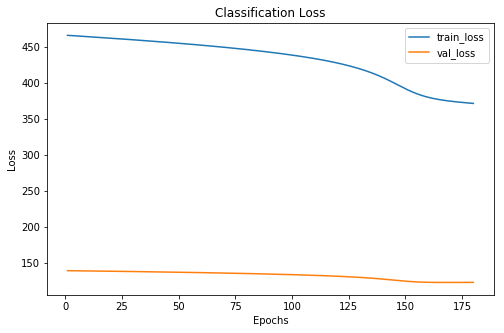

 72%|███████▏  | 180/250 [20:23<08:01,  6.88s/it]

Cofusion Matrix For Val Set: 
--  --  --
15  19   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     86      27
      1    217      64
      2    116      35
Score This Epoch: 0.49375101322260595 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 180 xxxxxxxxxxxxxx


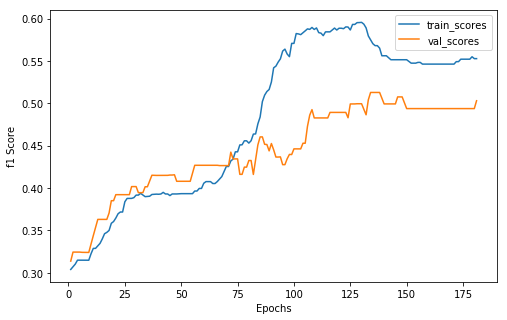

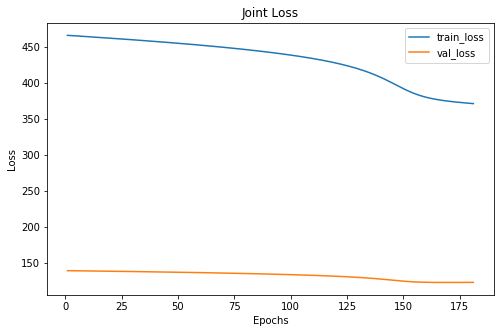

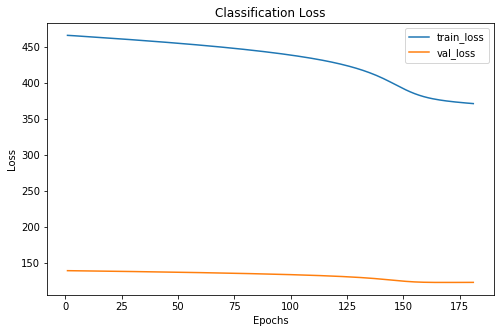

 72%|███████▏  | 181/250 [20:29<07:52,  6.84s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     86      28
      1    217      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 181 xxxxxxxxxxxxxx


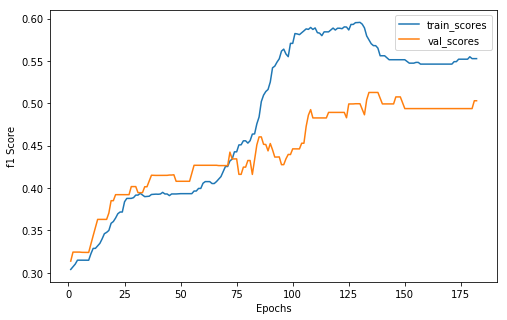

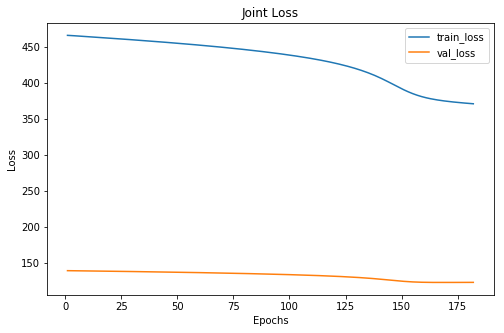

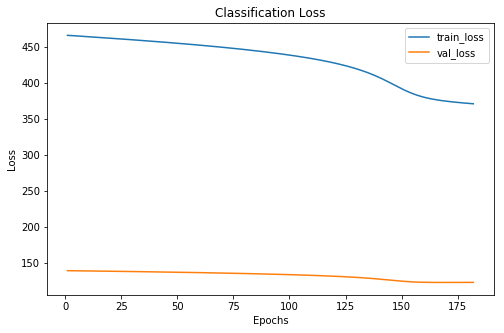

 73%|███████▎  | 182/250 [20:36<07:39,  6.76s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     86      28
      1    217      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 182 xxxxxxxxxxxxxx


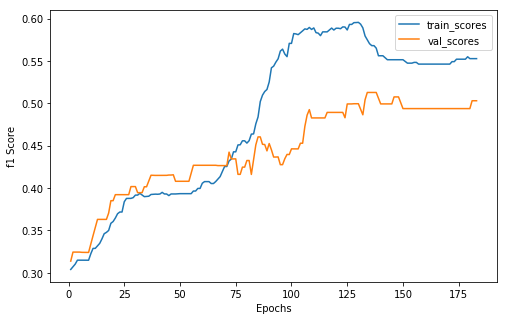

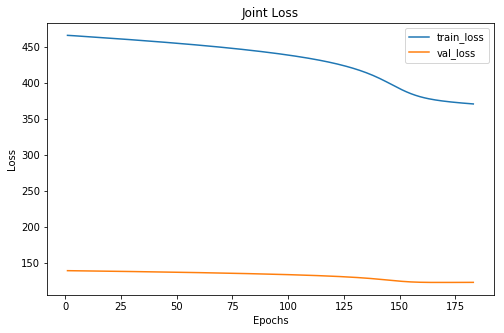

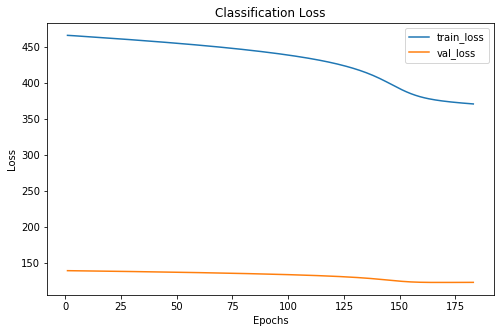

 73%|███████▎  | 183/250 [20:43<07:37,  6.83s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     86      28
      1    217      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 183 xxxxxxxxxxxxxx


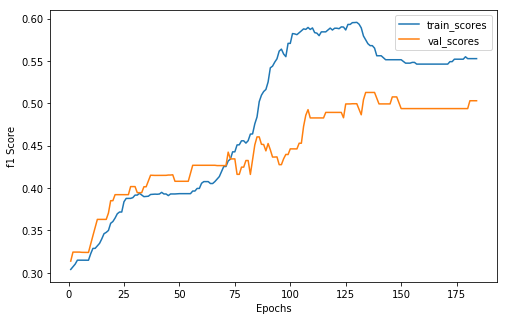

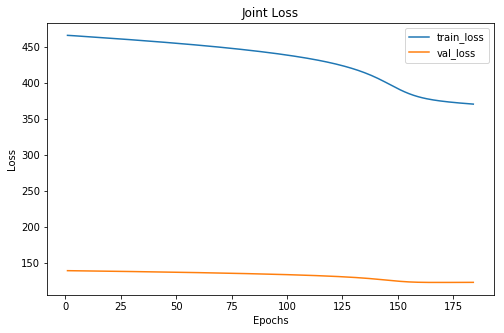

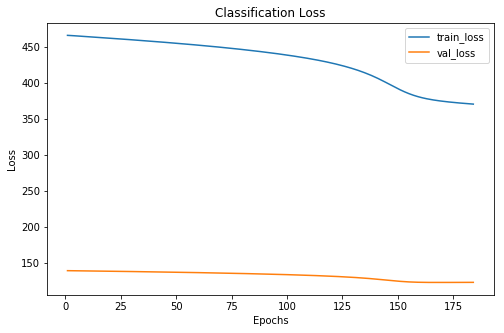

 74%|███████▎  | 184/250 [20:50<07:41,  6.99s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     86      28
      1    217      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 184 xxxxxxxxxxxxxx


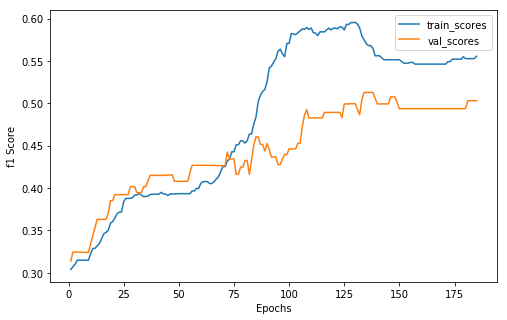

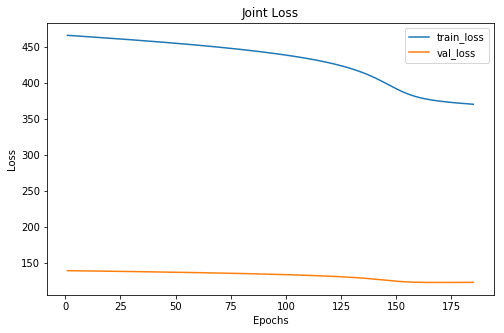

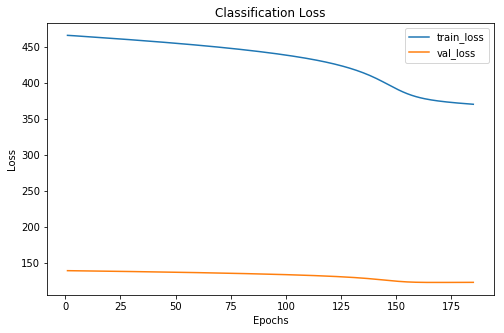

 74%|███████▍  | 185/250 [20:56<07:15,  6.71s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     87      28
      1    216      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 185 xxxxxxxxxxxxxx


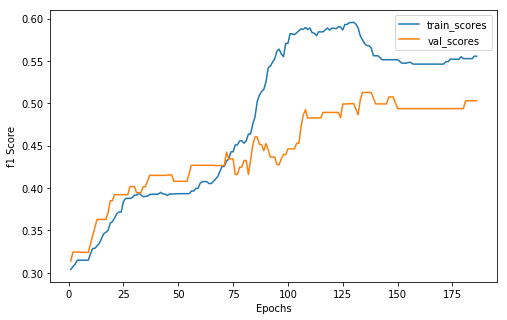

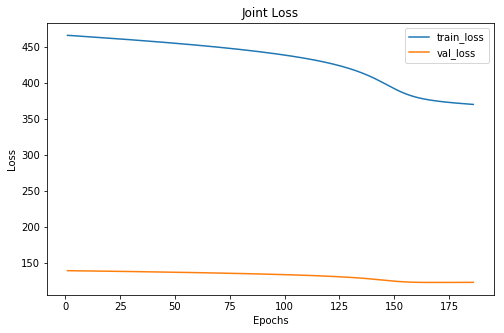

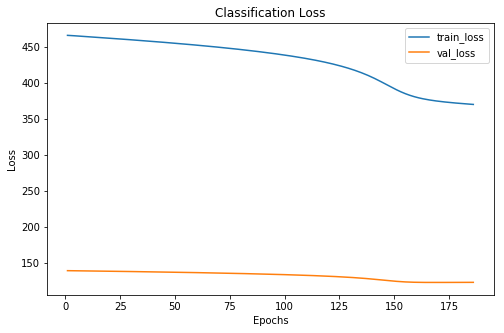

 74%|███████▍  | 186/250 [21:03<07:15,  6.81s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     87      28
      1    216      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 186 xxxxxxxxxxxxxx


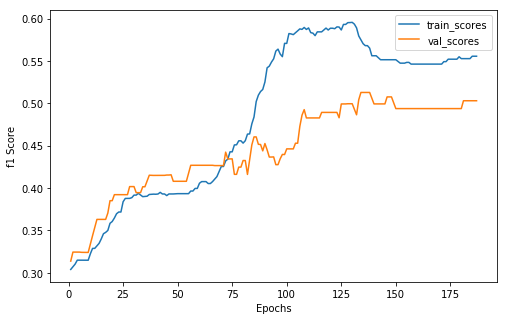

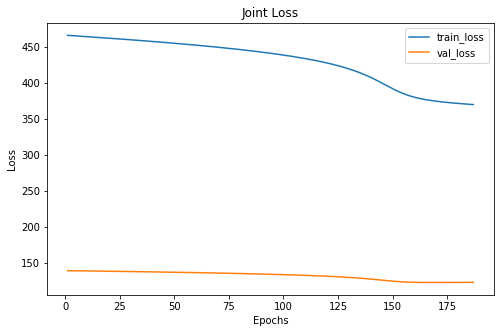

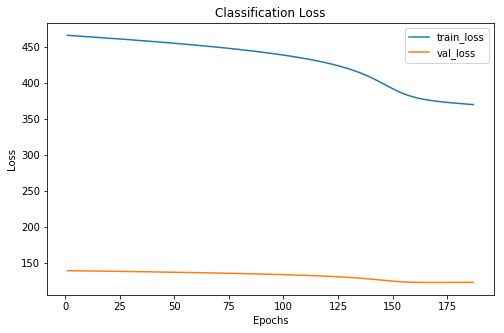

 75%|███████▍  | 187/250 [21:10<07:10,  6.84s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     87      28
      1    216      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 187 xxxxxxxxxxxxxx


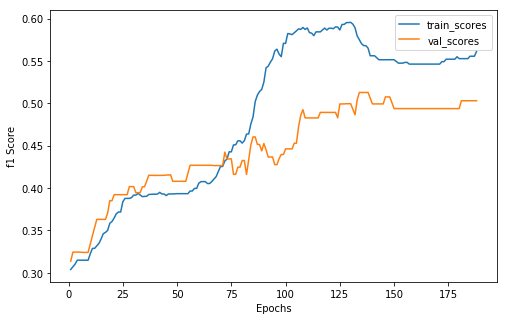

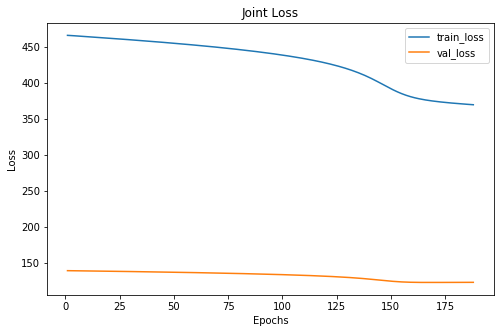

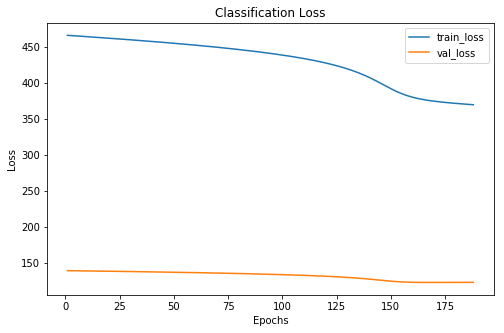

 75%|███████▌  | 188/250 [21:17<07:02,  6.81s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      28
      1    214      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 188 xxxxxxxxxxxxxx


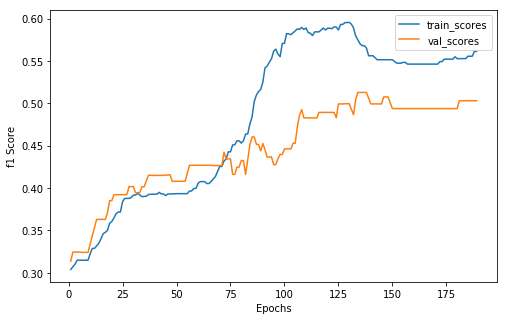

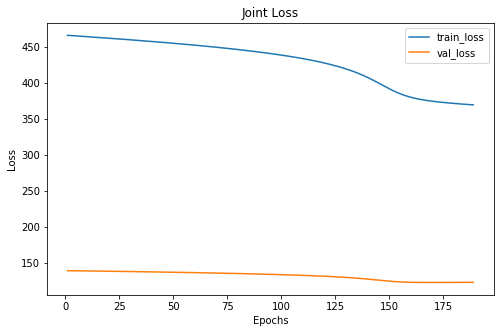

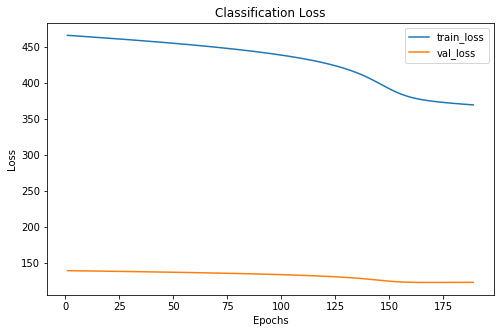

 76%|███████▌  | 189/250 [21:23<06:46,  6.67s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      28
      1    214      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 189 xxxxxxxxxxxxxx


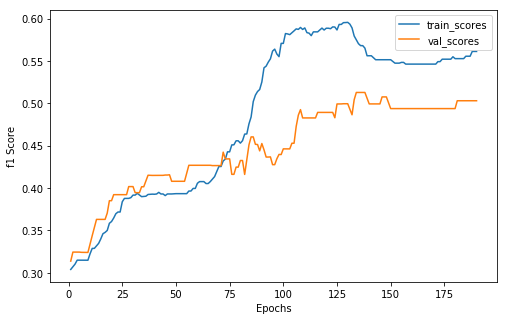

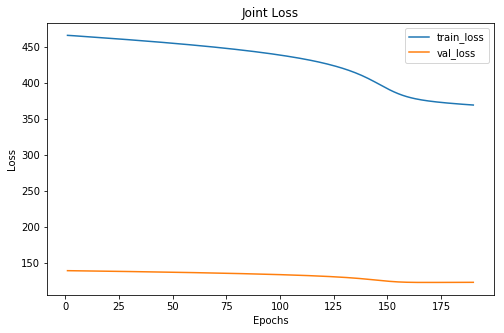

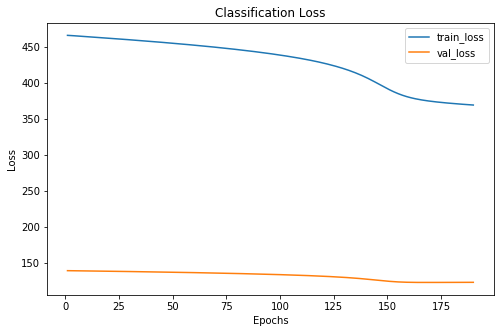

 76%|███████▌  | 190/250 [21:30<06:32,  6.55s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      28
      1    214      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 190 xxxxxxxxxxxxxx


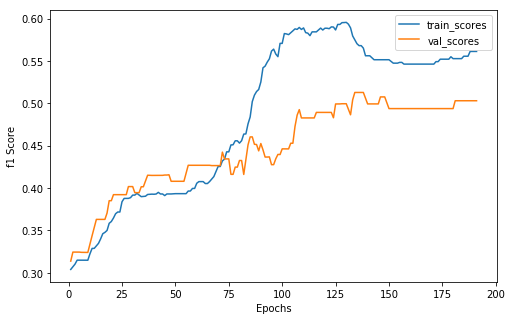

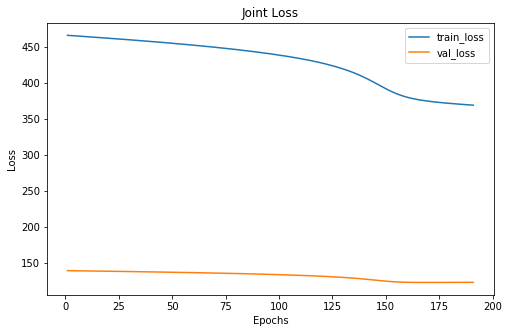

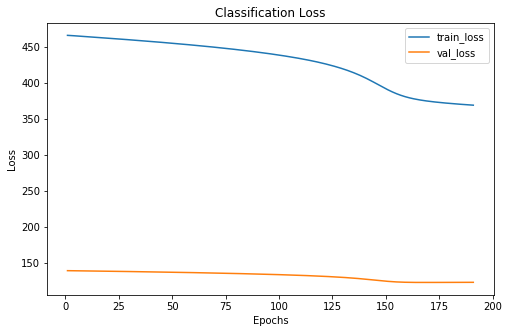

 76%|███████▋  | 191/250 [21:35<06:07,  6.23s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      28
      1    214      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 191 xxxxxxxxxxxxxx


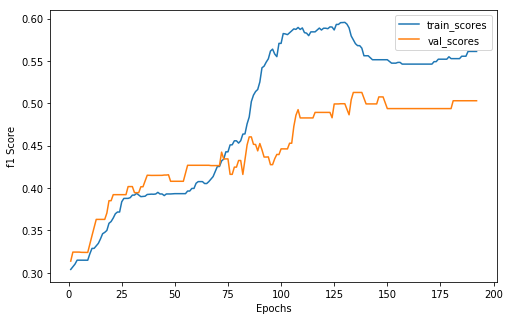

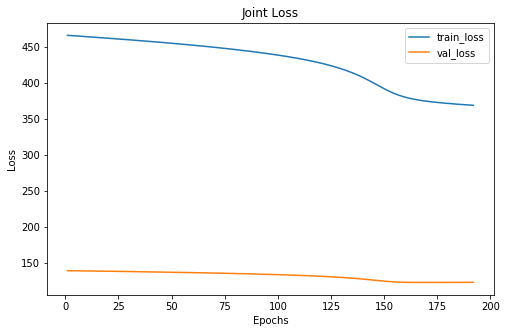

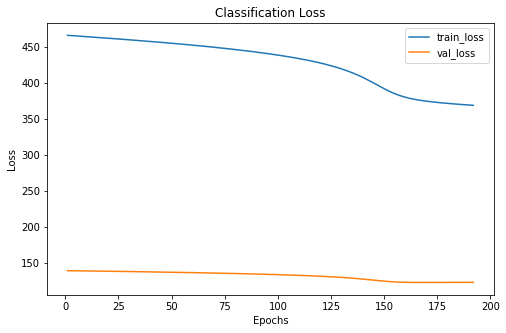

 77%|███████▋  | 192/250 [21:41<05:47,  5.99s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      28
      1    214      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 192 xxxxxxxxxxxxxx


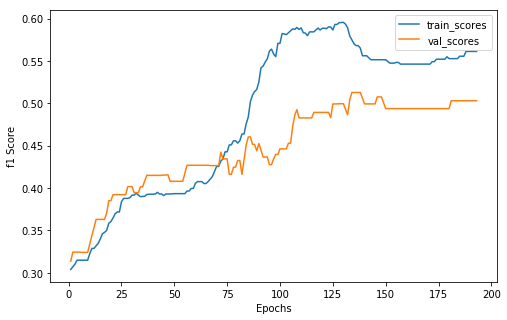

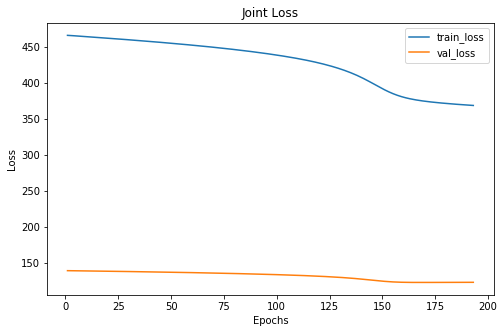

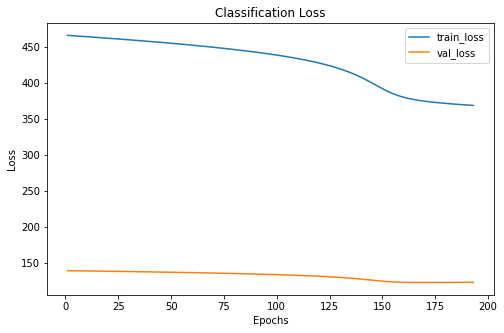

 77%|███████▋  | 193/250 [21:46<05:34,  5.87s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      28
      1    214      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 193 xxxxxxxxxxxxxx


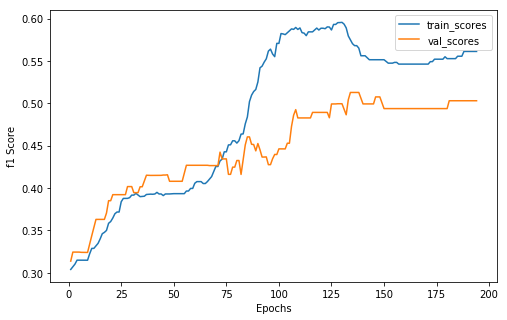

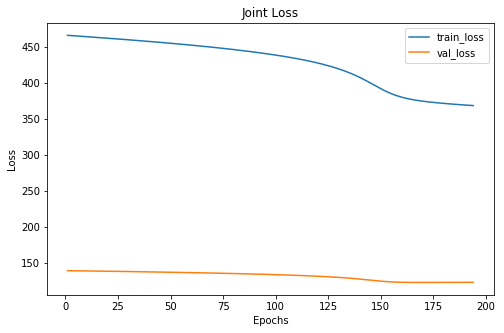

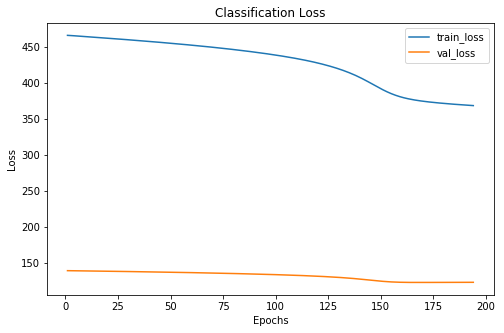

 78%|███████▊  | 194/250 [21:53<05:36,  6.00s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      28
      1    214      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 194 xxxxxxxxxxxxxx


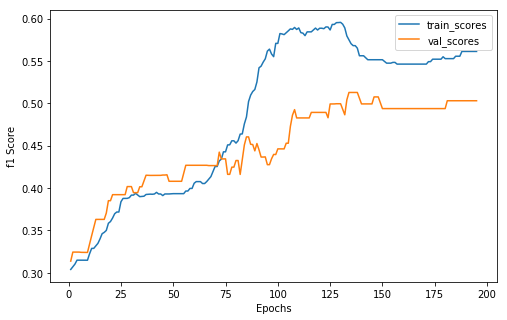

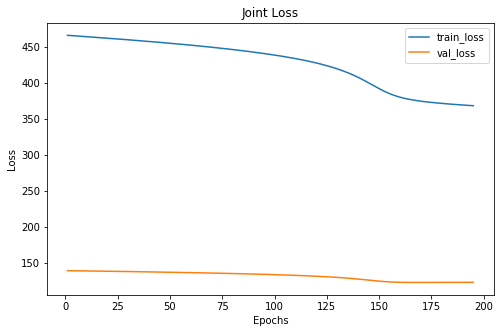

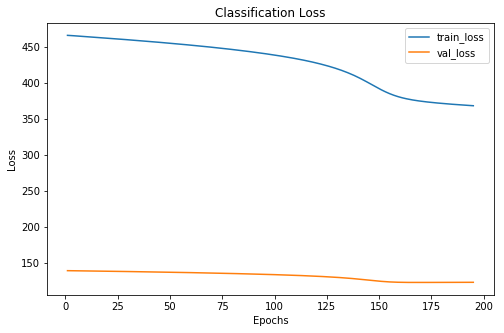

 78%|███████▊  | 195/250 [21:58<05:21,  5.84s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      28
      1    214      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 195 xxxxxxxxxxxxxx


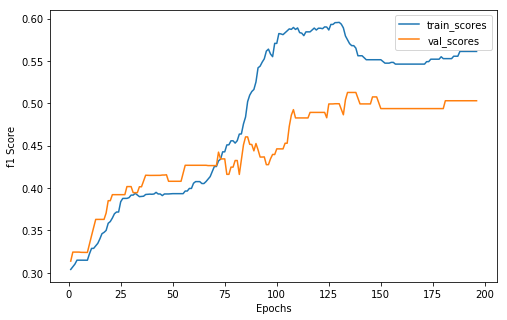

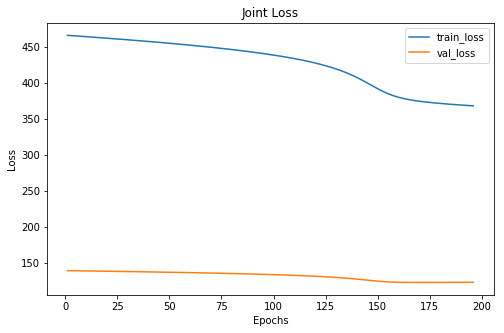

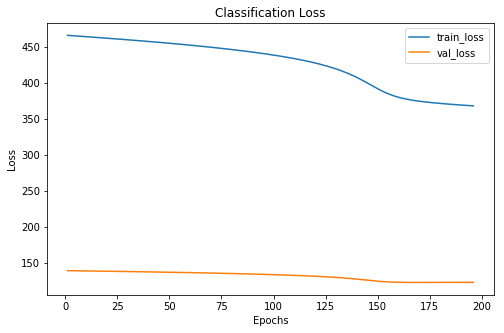

 78%|███████▊  | 196/250 [22:04<05:22,  5.97s/it]

Cofusion Matrix For Val Set: 
--  --  --
16  18   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      28
      1    214      63
      2    116      35
Score This Epoch: 0.5030073759789008 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 196 xxxxxxxxxxxxxx


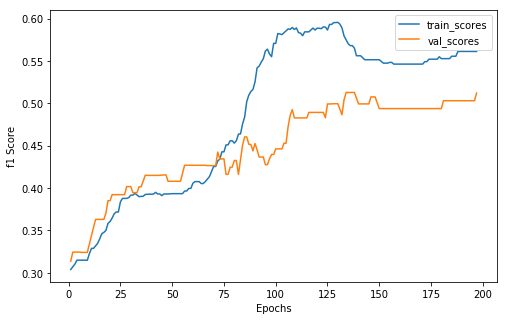

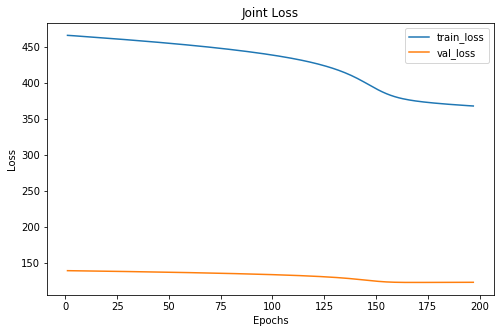

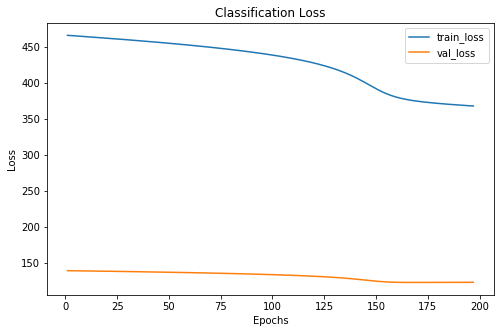

 79%|███████▉  | 197/250 [22:10<05:08,  5.82s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  17   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    214      62
      2    116      35
Score This Epoch: 0.5120880293918524 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 197 xxxxxxxxxxxxxx


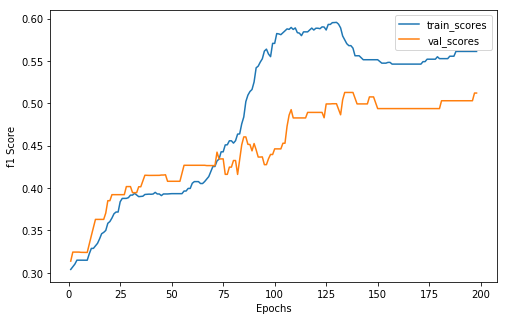

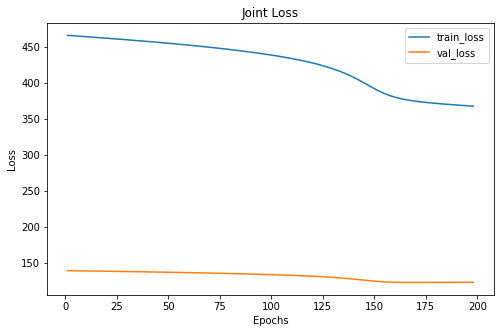

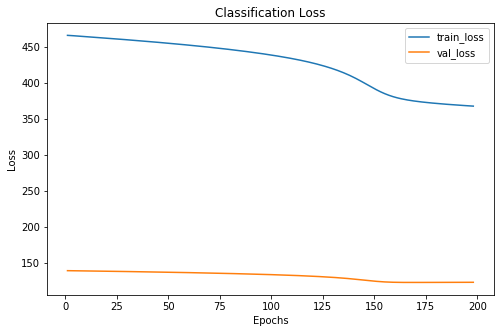

 79%|███████▉  | 198/250 [22:15<04:56,  5.70s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  17   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    214      62
      2    116      35
Score This Epoch: 0.5120880293918524 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 198 xxxxxxxxxxxxxx


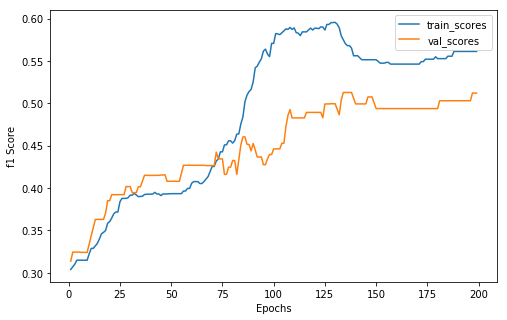

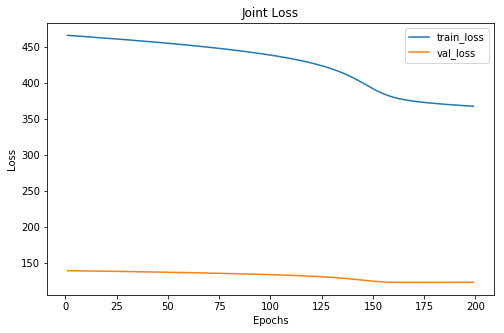

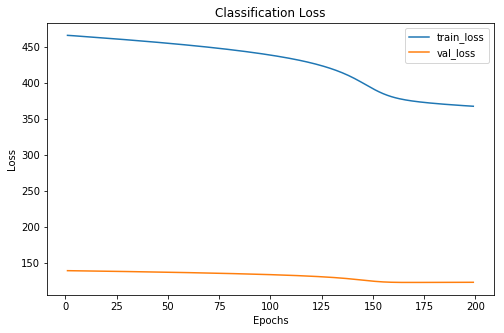

 80%|███████▉  | 199/250 [22:22<05:02,  5.93s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  17   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    214      62
      2    116      35
Score This Epoch: 0.5120880293918524 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 199 xxxxxxxxxxxxxx


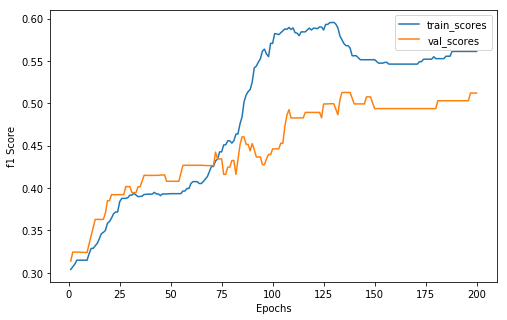

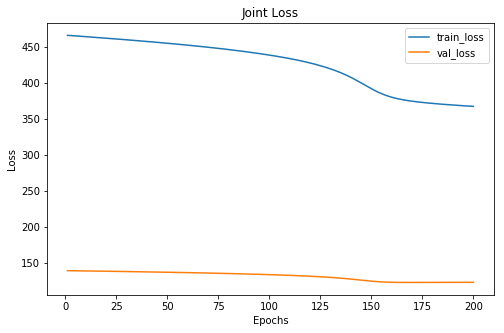

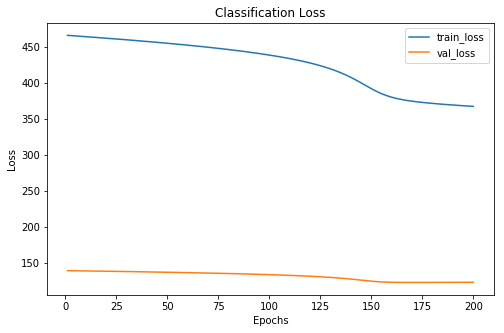

 80%|████████  | 200/250 [22:28<05:07,  6.15s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  17   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    214      62
      2    116      35
Score This Epoch: 0.5120880293918524 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 200 xxxxxxxxxxxxxx


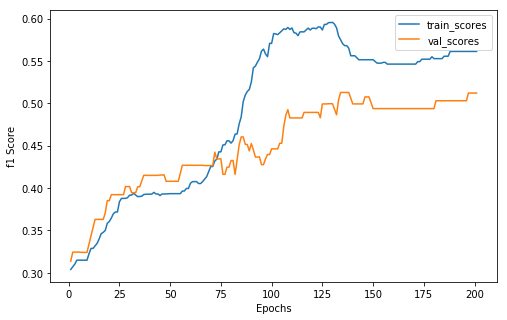

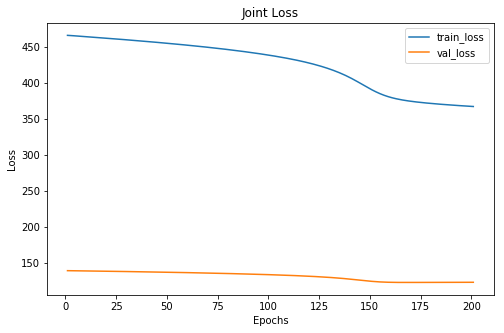

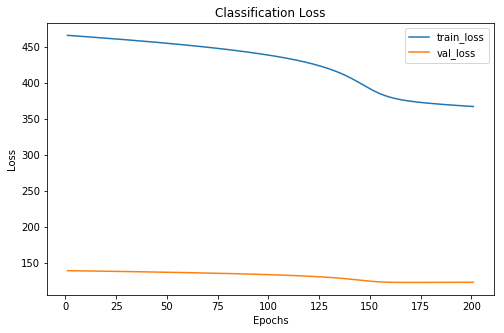

 80%|████████  | 201/250 [22:35<05:02,  6.18s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  17   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    214      62
      2    116      35
Score This Epoch: 0.5120880293918524 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 201 xxxxxxxxxxxxxx


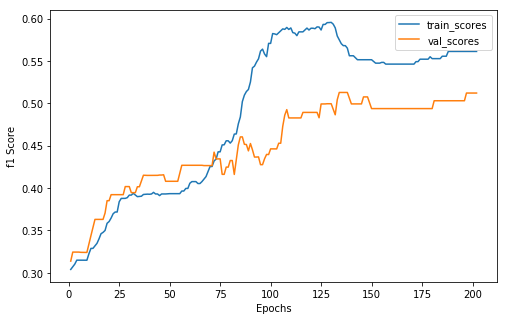

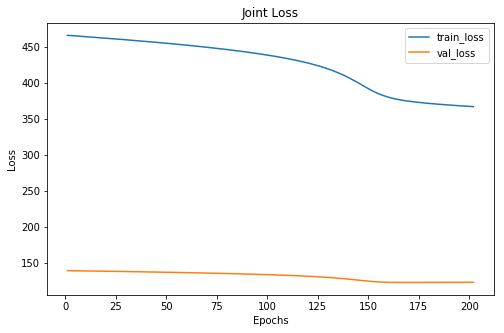

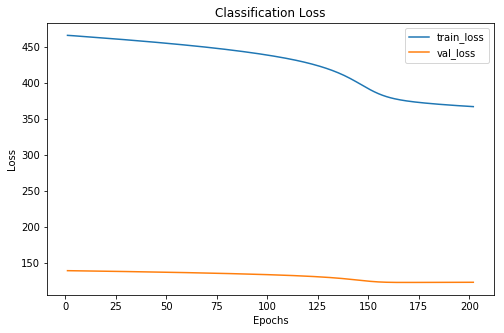

 81%|████████  | 202/250 [22:40<04:45,  5.95s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  17   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    214      62
      2    116      35
Score This Epoch: 0.5120880293918524 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 202 xxxxxxxxxxxxxx


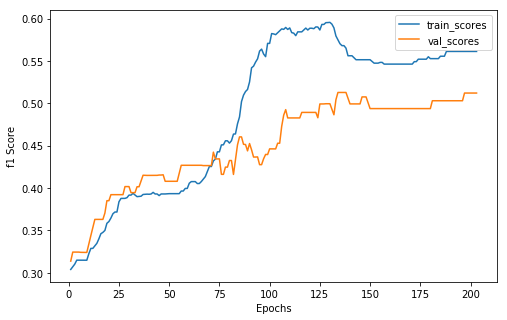

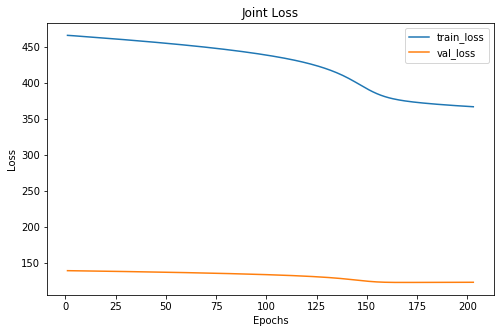

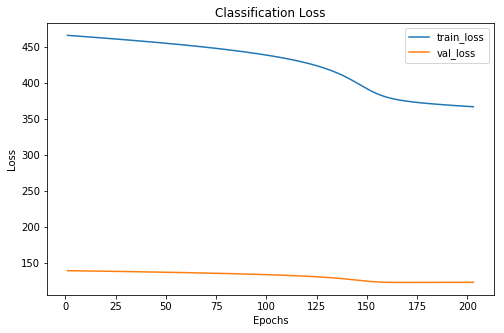

 81%|████████  | 203/250 [22:45<04:32,  5.81s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  17   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    214      62
      2    116      35
Score This Epoch: 0.5120880293918524 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 203 xxxxxxxxxxxxxx


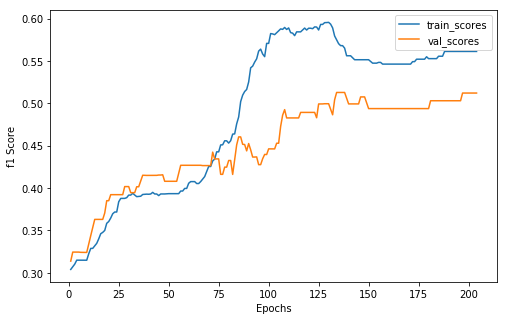

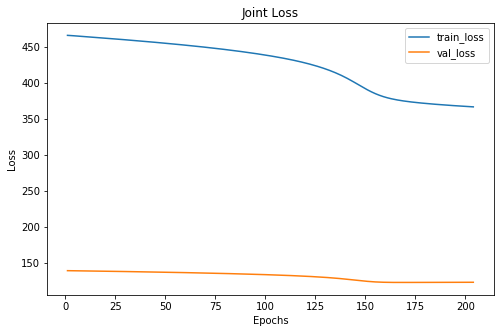

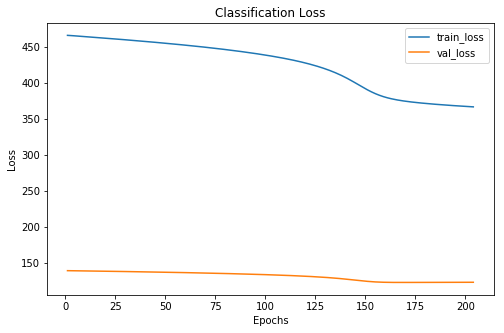

 82%|████████▏ | 204/250 [22:51<04:22,  5.71s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  17   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    214      62
      2    116      35
Score This Epoch: 0.5120880293918524 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 204 xxxxxxxxxxxxxx


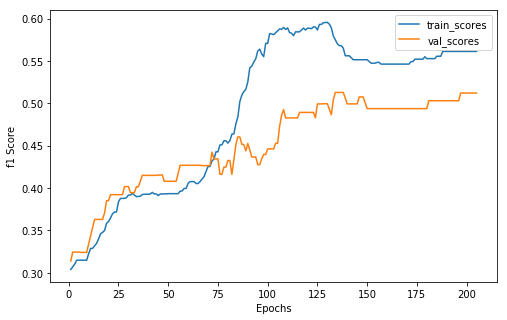

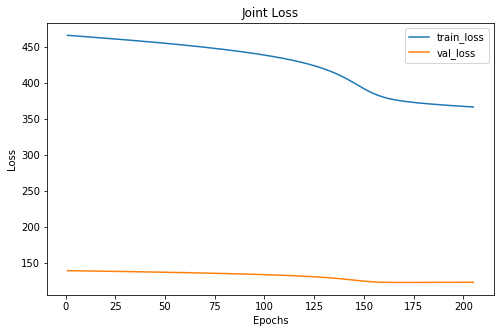

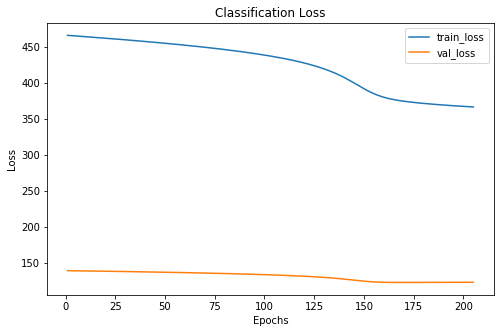

 82%|████████▏ | 205/250 [22:57<04:26,  5.93s/it]

Cofusion Matrix For Val Set: 
--  --  --
17  17   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      29
      1    214      62
      2    116      35
Score This Epoch: 0.5120880293918524 Best Score: 0.5127823599907348
xxxxxxxxxxxxxx epoch: 205 xxxxxxxxxxxxxx


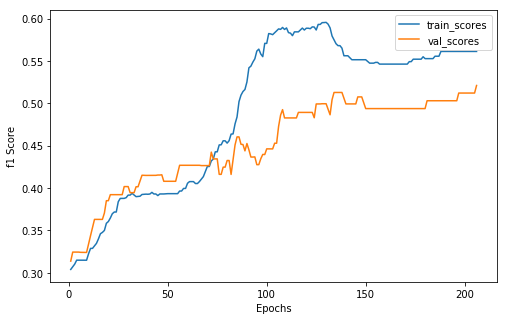

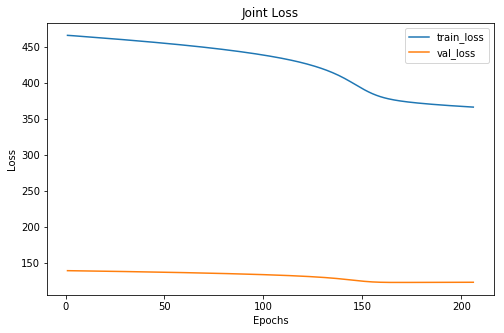

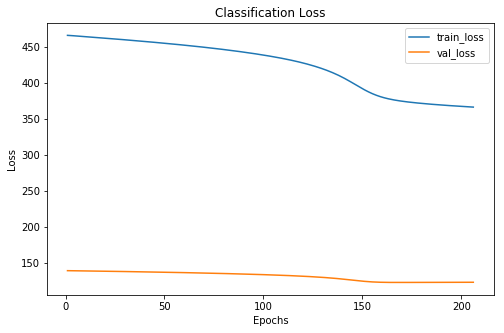

 82%|████████▏ | 206/250 [23:04<04:27,  6.07s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      30
      1    214      61
      2    116      35
Score This Epoch: 0.5210027843830661 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 206 xxxxxxxxxxxxxx


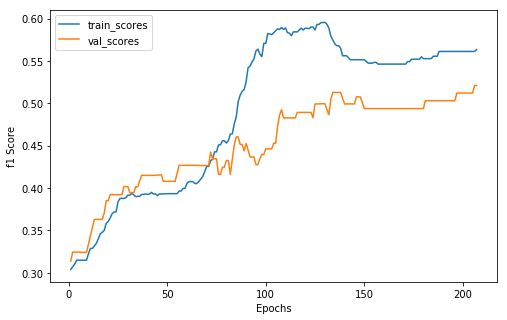

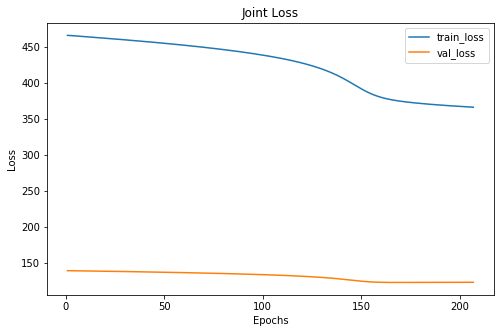

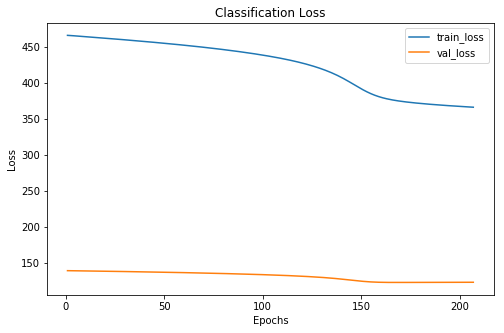

 83%|████████▎ | 207/250 [23:10<04:19,  6.03s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      30
      1    215      61
      2    115      35
Score This Epoch: 0.5210027843830661 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 207 xxxxxxxxxxxxxx


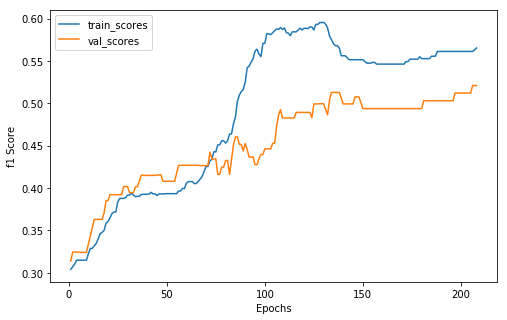

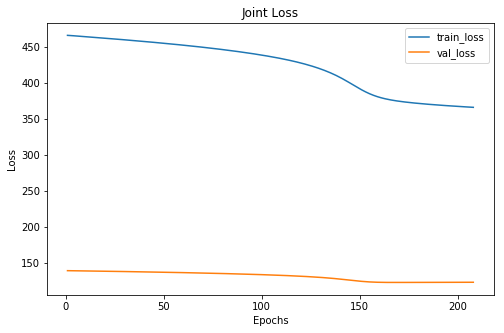

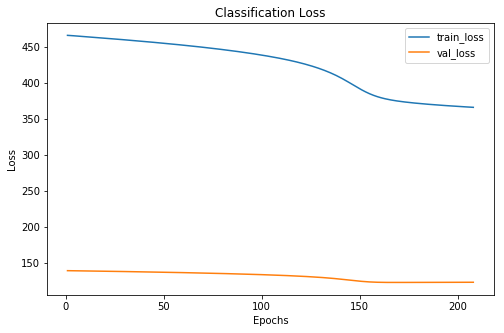

 83%|████████▎ | 208/250 [23:16<04:22,  6.26s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      30
      1    216      61
      2    114      35
Score This Epoch: 0.5210027843830661 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 208 xxxxxxxxxxxxxx


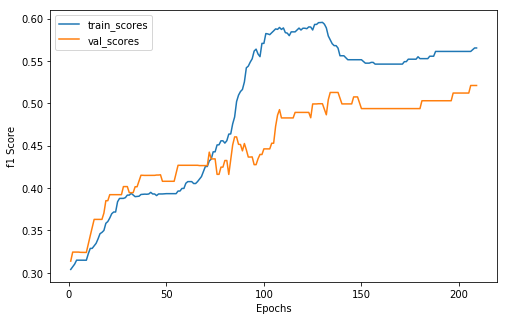

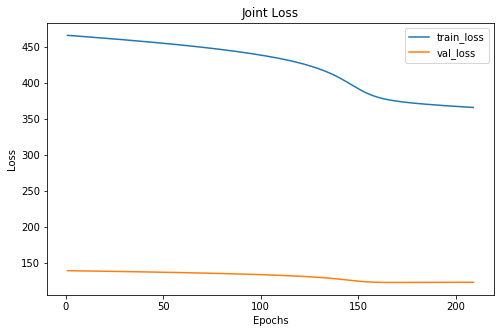

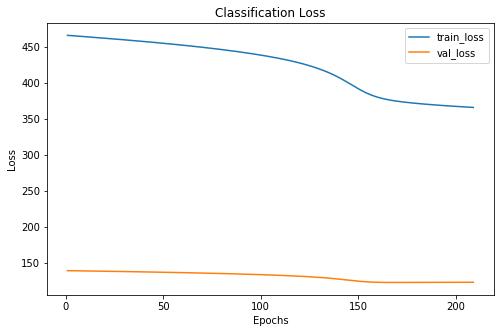

 84%|████████▎ | 209/250 [23:23<04:17,  6.28s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      30
      1    216      61
      2    114      35
Score This Epoch: 0.5210027843830661 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 209 xxxxxxxxxxxxxx


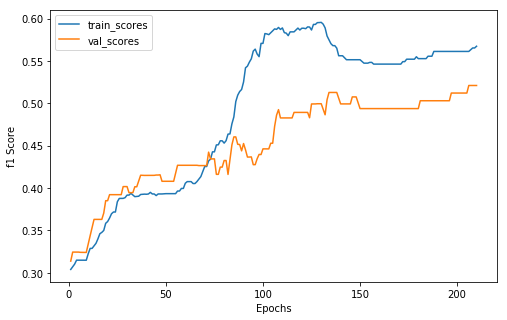

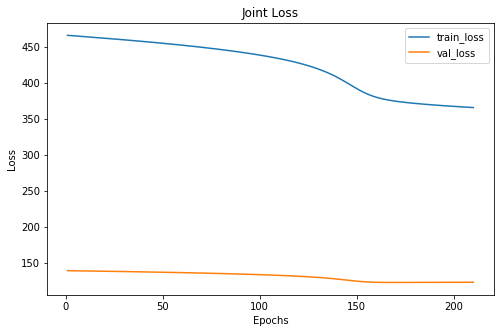

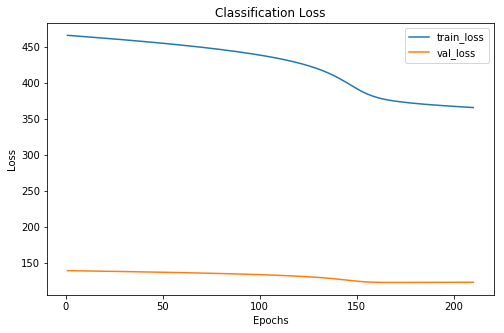

 84%|████████▍ | 210/250 [23:29<04:09,  6.24s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      30
      1    217      61
      2    113      35
Score This Epoch: 0.5210027843830661 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 210 xxxxxxxxxxxxxx


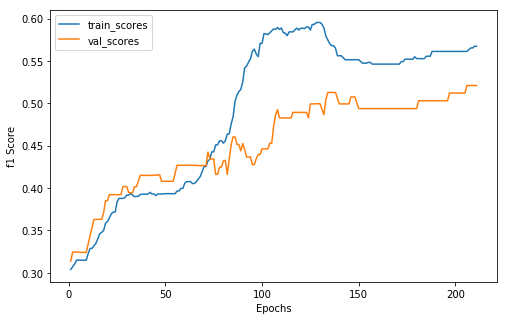

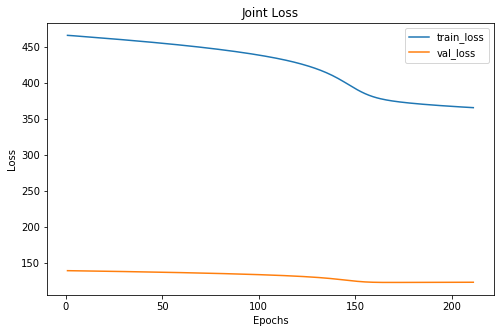

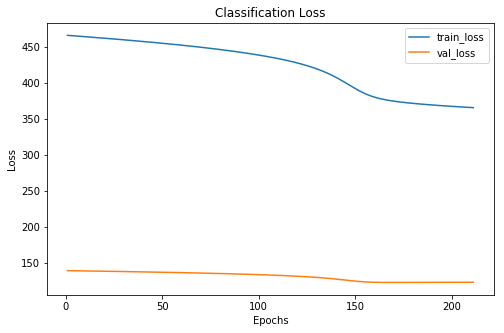

 84%|████████▍ | 211/250 [23:35<04:00,  6.18s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      30
      1    217      61
      2    113      35
Score This Epoch: 0.5210027843830661 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 211 xxxxxxxxxxxxxx


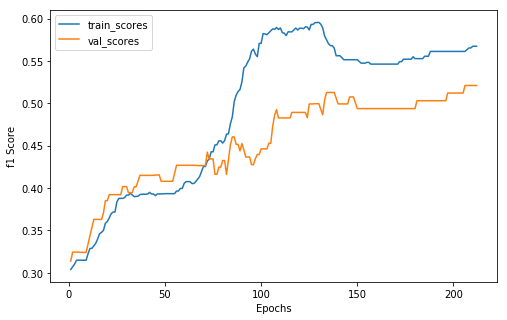

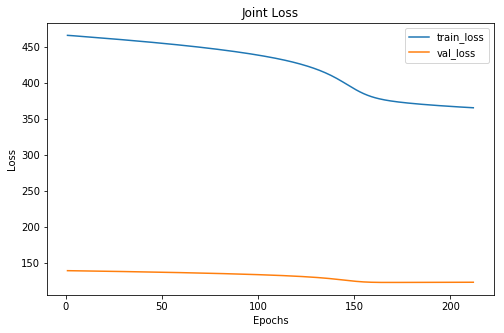

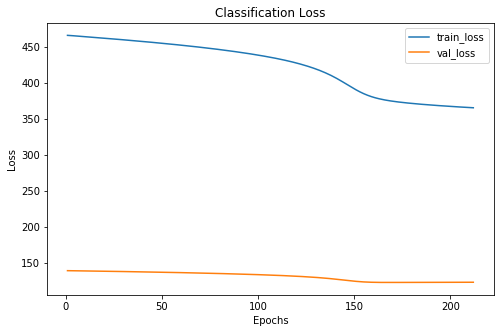

 85%|████████▍ | 212/250 [23:40<03:46,  5.95s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 7  31  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      30
      1    217      61
      2    113      35
Score This Epoch: 0.5210027843830661 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 212 xxxxxxxxxxxxxx


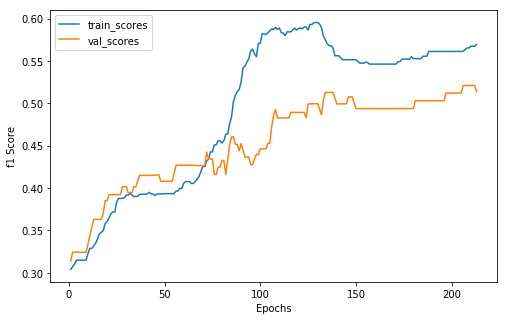

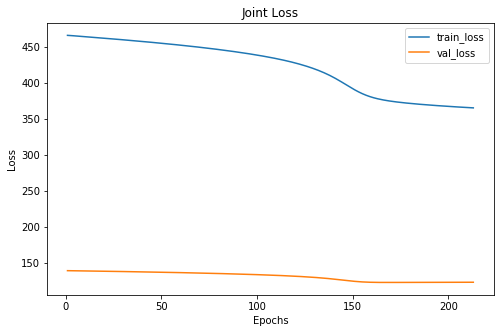

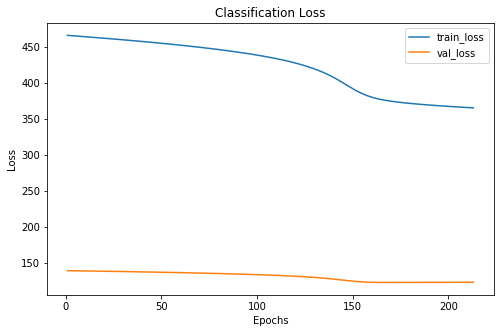

 85%|████████▌ | 213/250 [23:46<03:40,  5.96s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 8  30  11
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      31
      1    218      60
      2    112      35
Score This Epoch: 0.5135866165391944 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 213 xxxxxxxxxxxxxx


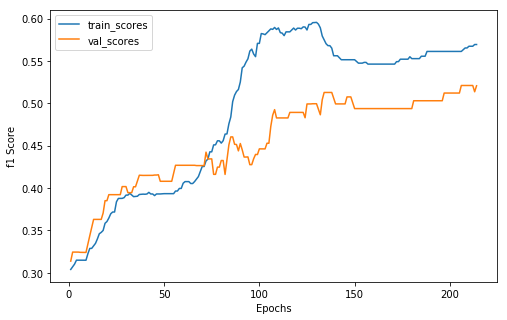

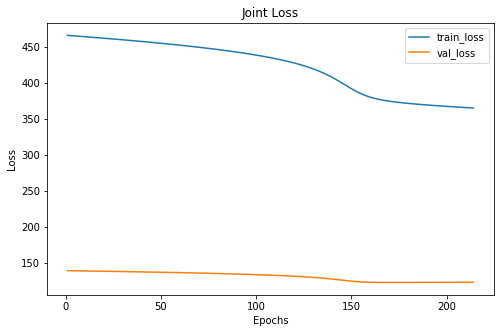

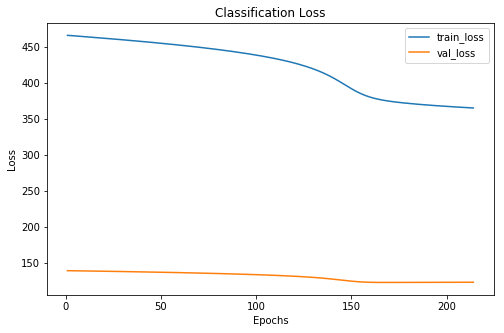

 86%|████████▌ | 214/250 [23:53<03:40,  6.11s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 8  31  10
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      31
      1    218      61
      2    112      34
Score This Epoch: 0.5206658420944136 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 214 xxxxxxxxxxxxxx


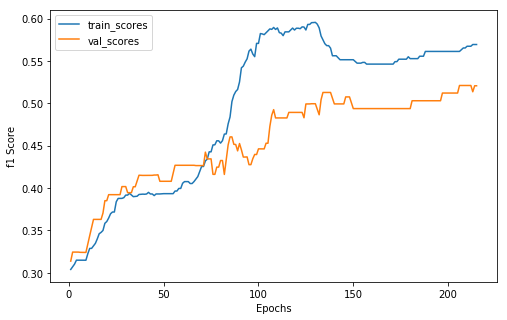

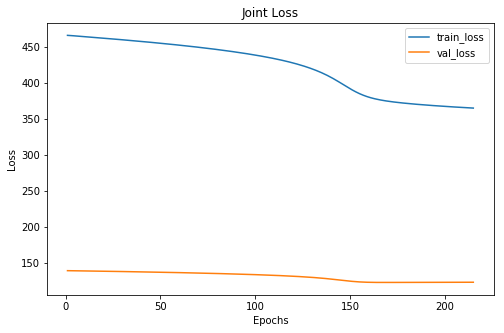

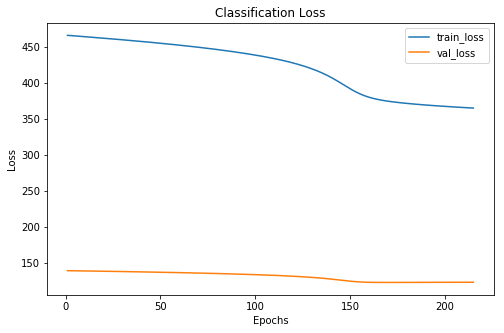

 86%|████████▌ | 215/250 [23:59<03:34,  6.13s/it]

Cofusion Matrix For Val Set: 
--  --  --
18  16   7
 8  31  10
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      31
      1    218      61
      2    112      34
Score This Epoch: 0.5206658420944136 Best Score: 0.5210027843830661
xxxxxxxxxxxxxx epoch: 215 xxxxxxxxxxxxxx


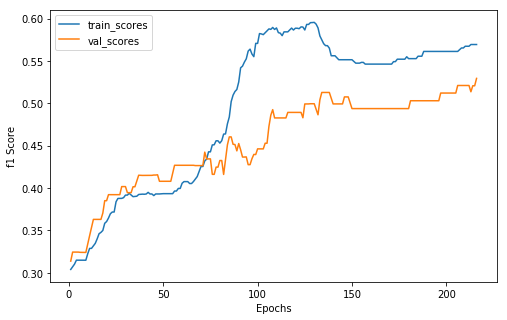

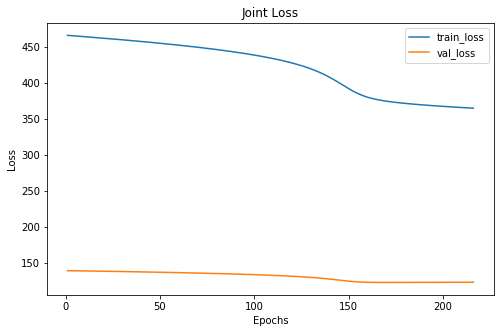

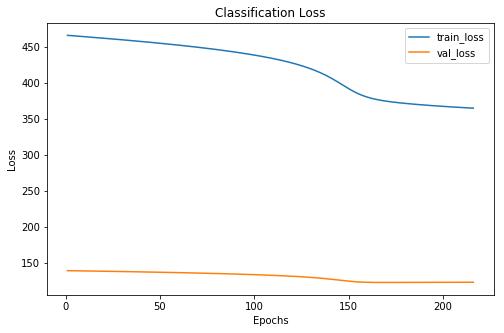

 86%|████████▋ | 216/250 [24:06<03:34,  6.31s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      32
      1    218      60
      2    112      34
Score This Epoch: 0.5293630132711625 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 216 xxxxxxxxxxxxxx


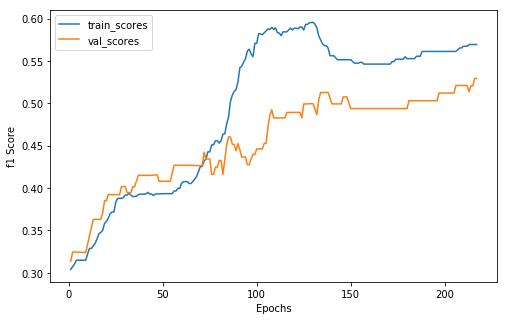

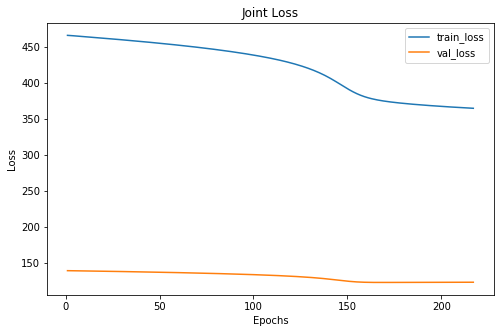

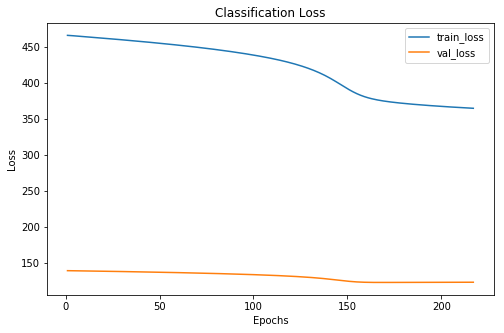

 87%|████████▋ | 217/250 [24:12<03:30,  6.37s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      32
      1    218      60
      2    112      34
Score This Epoch: 0.5293630132711625 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 217 xxxxxxxxxxxxxx


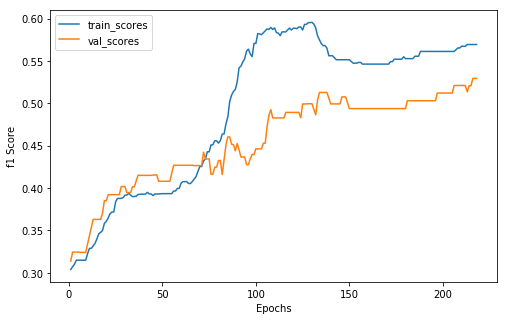

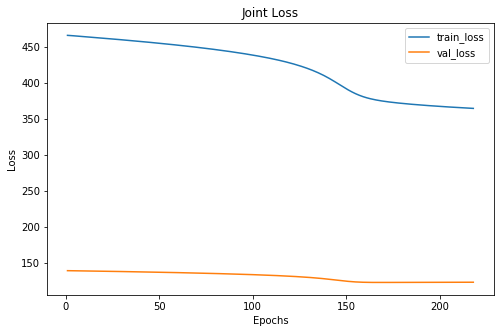

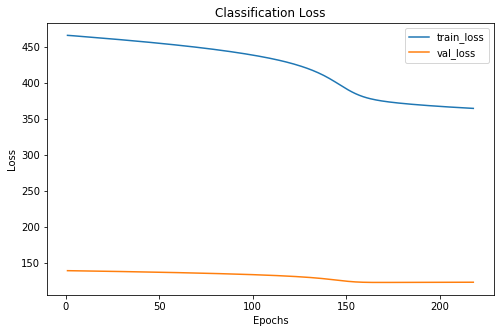

 87%|████████▋ | 218/250 [24:18<03:16,  6.13s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 5  14  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      32
      1    218      60
      2    112      34
Score This Epoch: 0.5293630132711625 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 218 xxxxxxxxxxxxxx


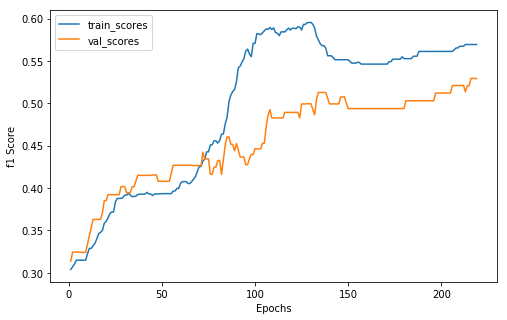

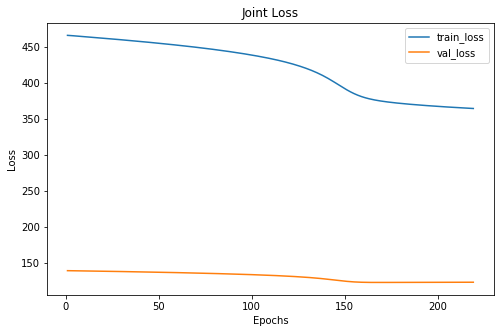

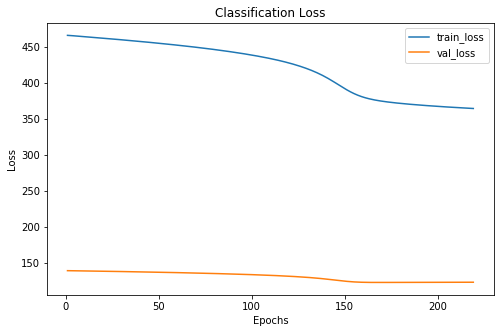

 88%|████████▊ | 219/250 [24:24<03:14,  6.29s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 219 xxxxxxxxxxxxxx


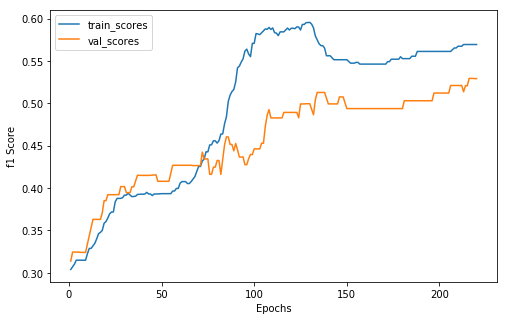

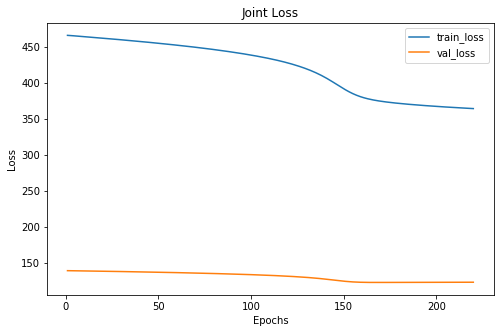

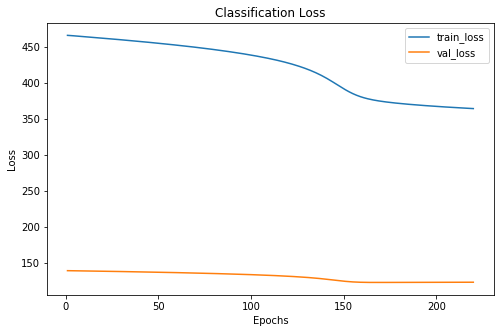

 88%|████████▊ | 220/250 [24:31<03:07,  6.25s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 220 xxxxxxxxxxxxxx


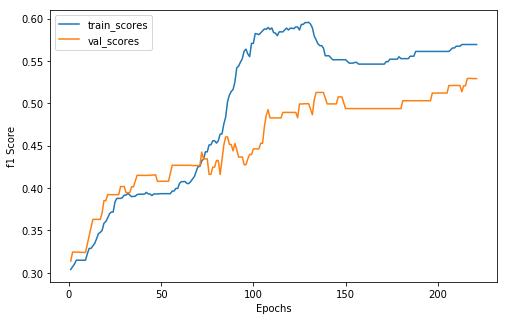

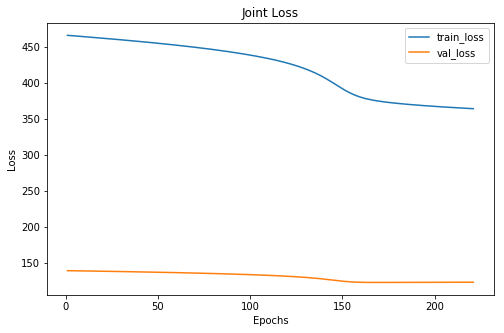

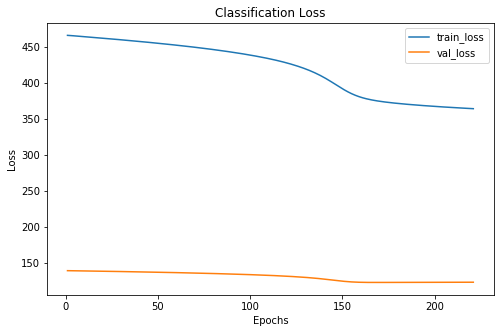

 88%|████████▊ | 221/250 [24:37<03:02,  6.31s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 221 xxxxxxxxxxxxxx


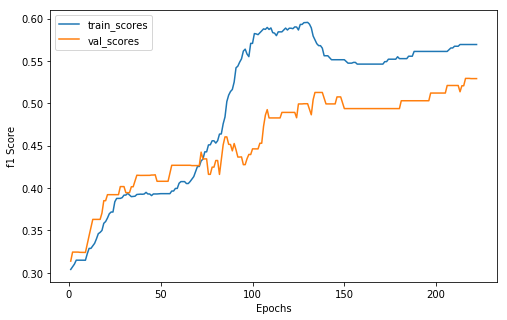

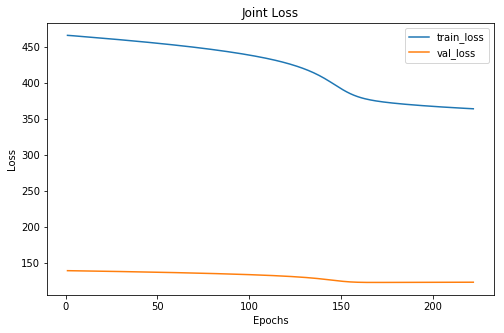

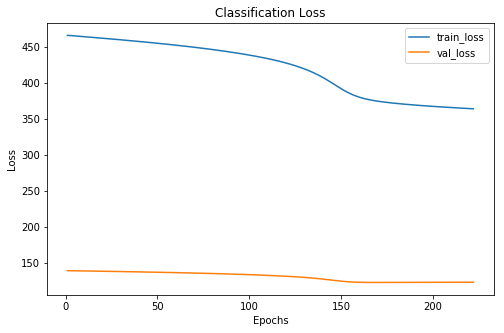

 89%|████████▉ | 222/250 [24:44<03:00,  6.45s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 222 xxxxxxxxxxxxxx


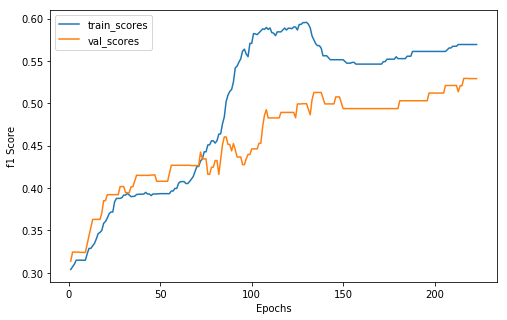

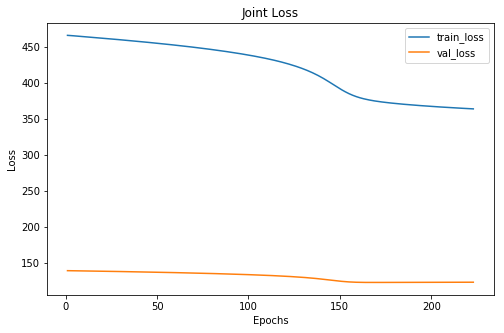

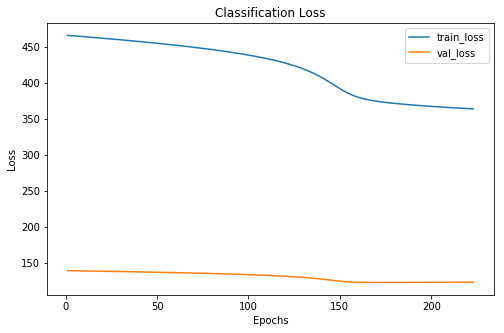

 89%|████████▉ | 223/250 [24:50<02:49,  6.28s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 223 xxxxxxxxxxxxxx


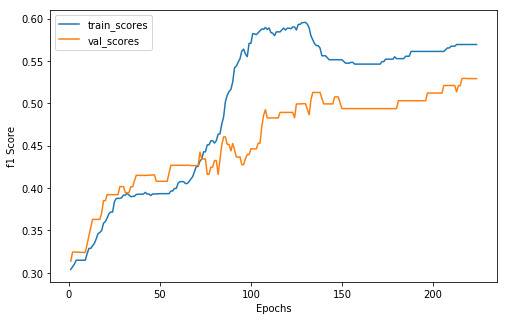

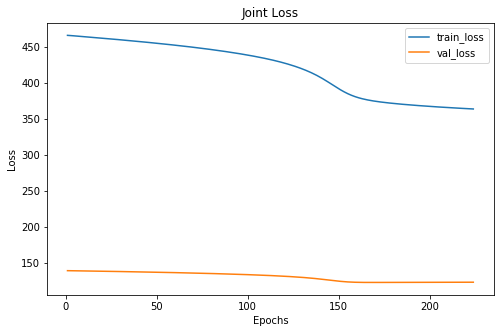

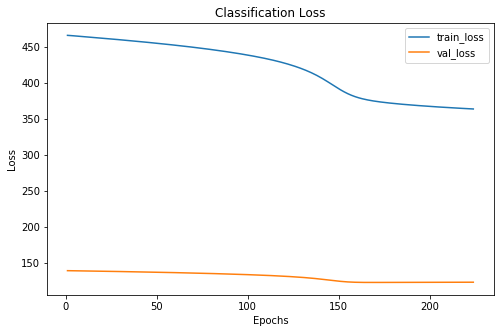

 90%|████████▉ | 224/250 [24:56<02:46,  6.41s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 224 xxxxxxxxxxxxxx


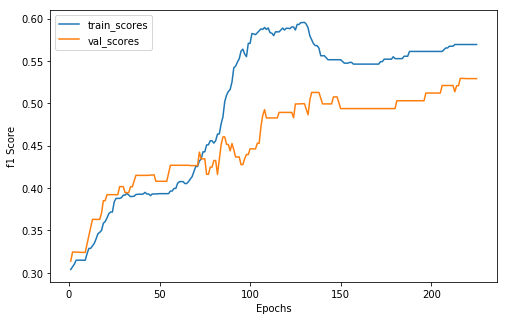

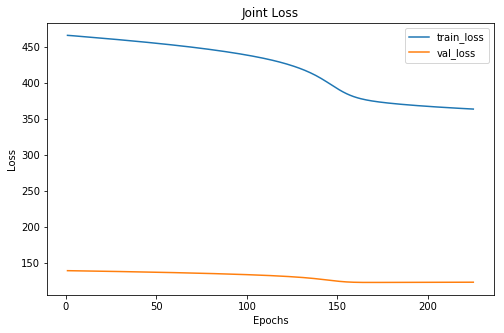

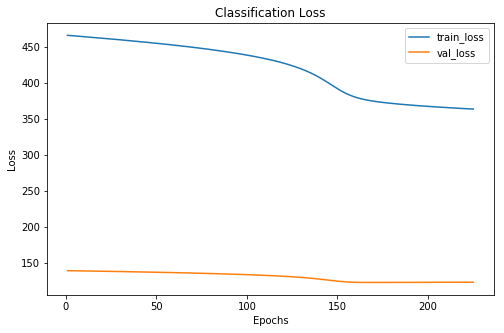

 90%|█████████ | 225/250 [25:03<02:40,  6.44s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 225 xxxxxxxxxxxxxx


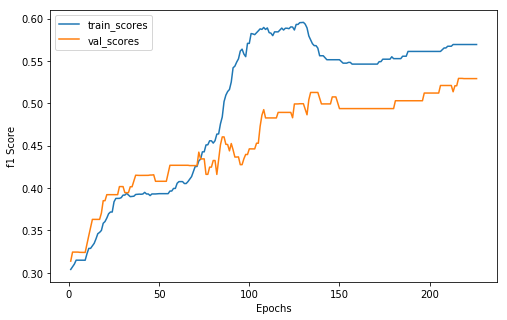

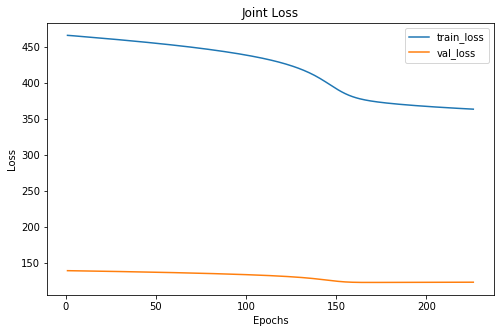

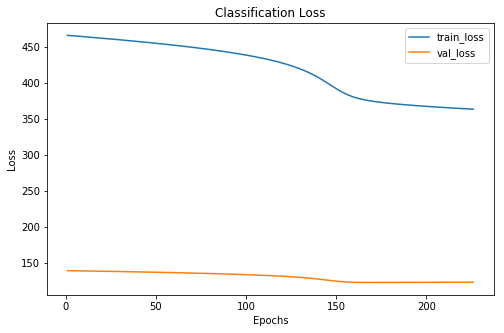

 90%|█████████ | 226/250 [25:09<02:33,  6.41s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 226 xxxxxxxxxxxxxx


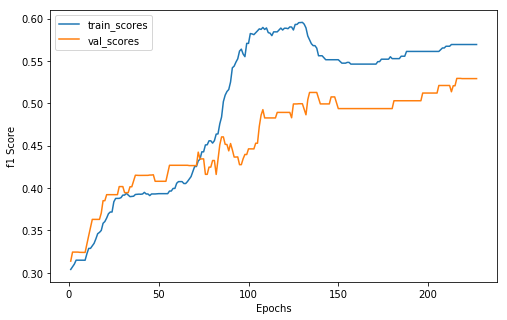

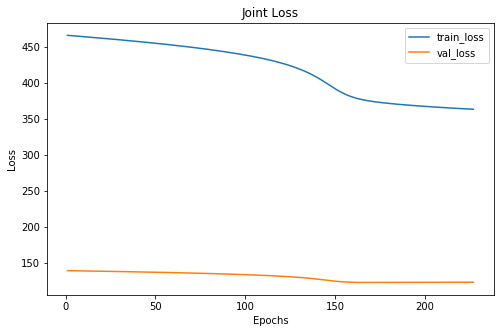

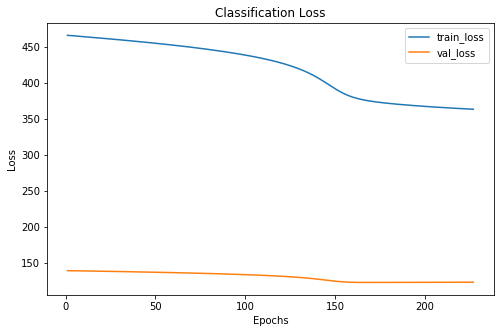

 91%|█████████ | 227/250 [25:16<02:30,  6.55s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 227 xxxxxxxxxxxxxx


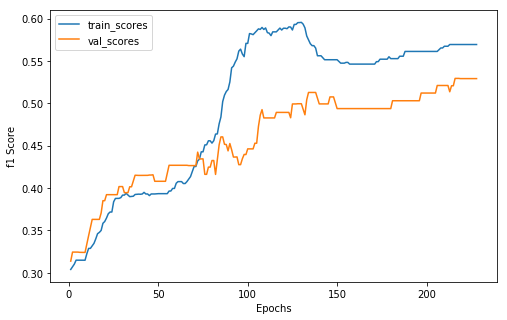

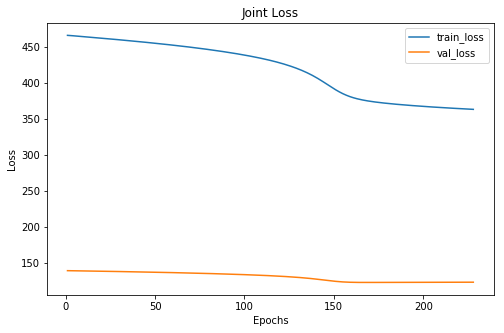

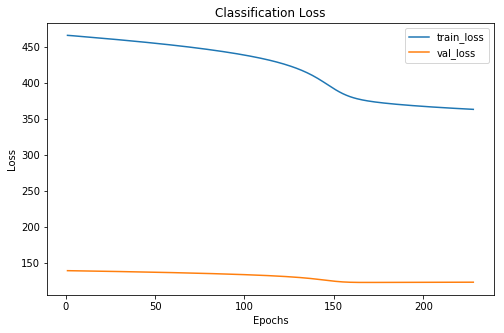

 91%|█████████ | 228/250 [25:22<02:20,  6.39s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 228 xxxxxxxxxxxxxx


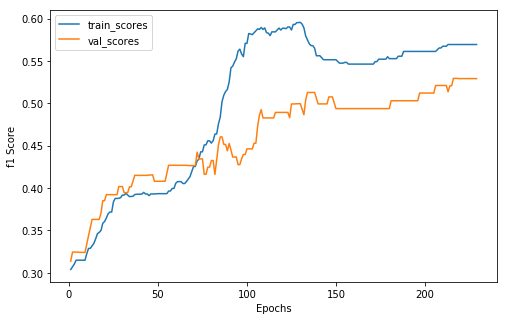

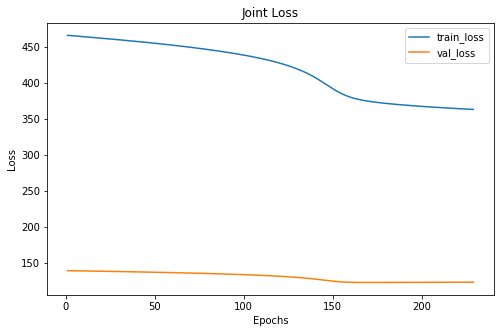

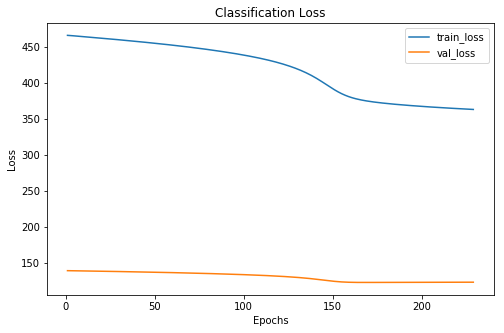

 92%|█████████▏| 229/250 [25:29<02:16,  6.50s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    218      59
      2    112      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 229 xxxxxxxxxxxxxx


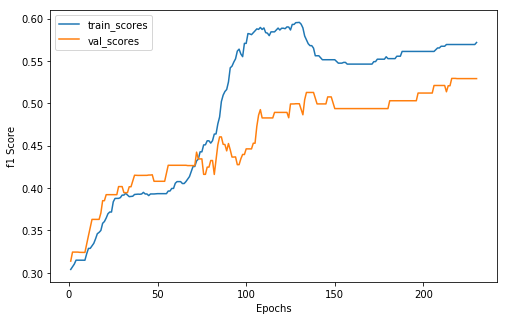

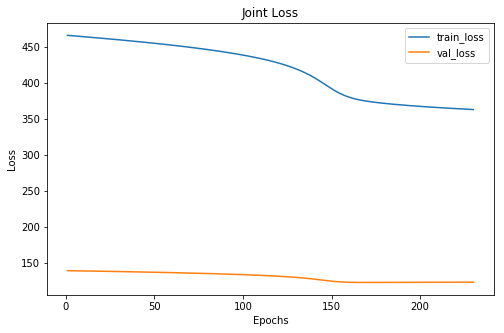

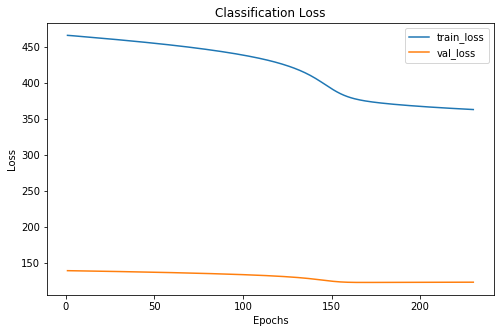

 92%|█████████▏| 230/250 [25:36<02:10,  6.52s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    217      59
      2    113      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 230 xxxxxxxxxxxxxx


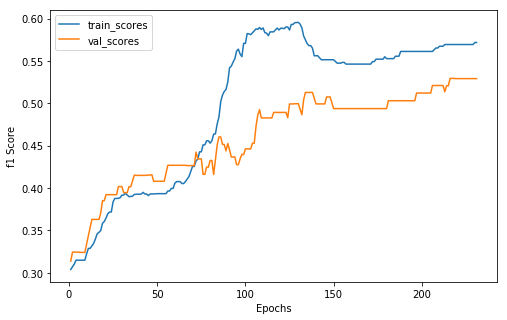

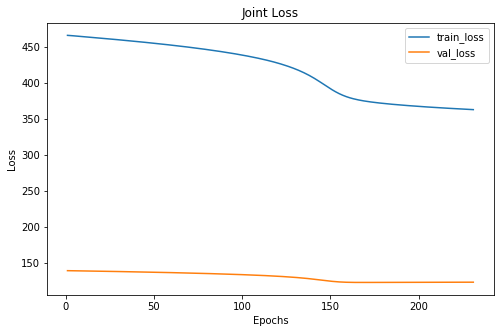

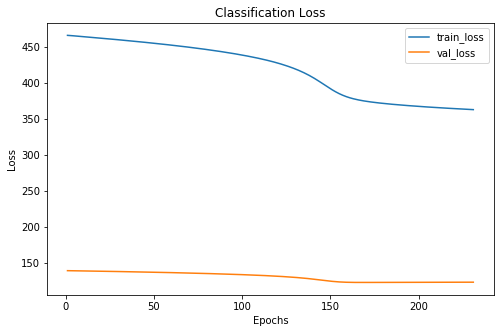

 92%|█████████▏| 231/250 [25:43<02:07,  6.72s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    217      59
      2    113      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 231 xxxxxxxxxxxxxx


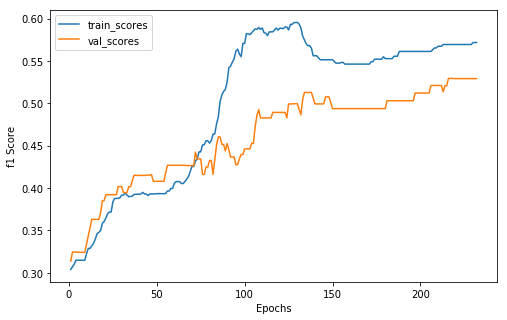

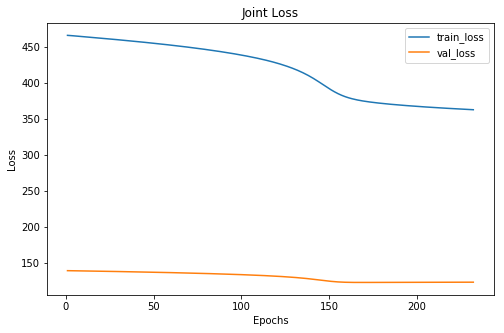

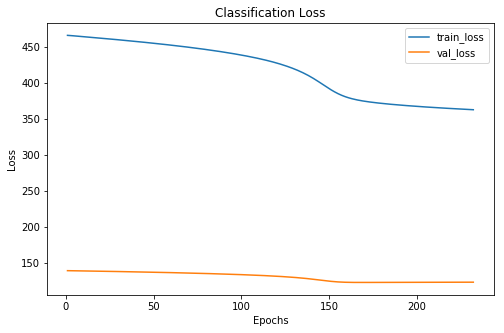

 93%|█████████▎| 232/250 [25:50<02:02,  6.82s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    217      59
      2    113      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 232 xxxxxxxxxxxxxx


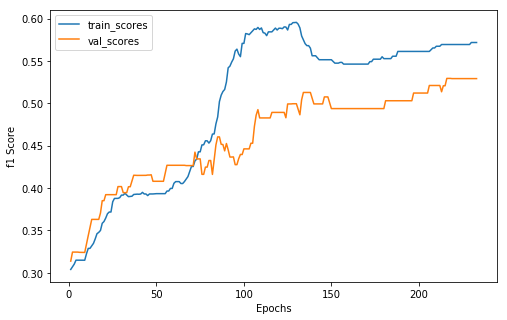

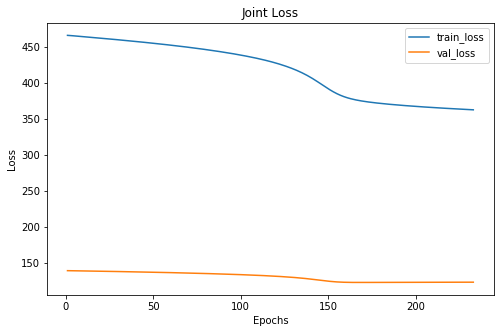

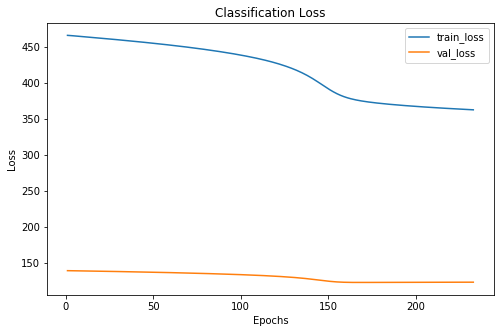

 93%|█████████▎| 233/250 [25:56<01:54,  6.73s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    217      59
      2    113      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 233 xxxxxxxxxxxxxx


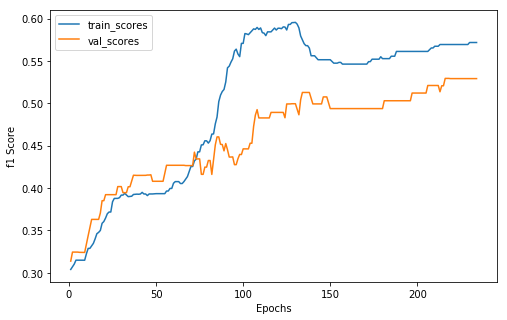

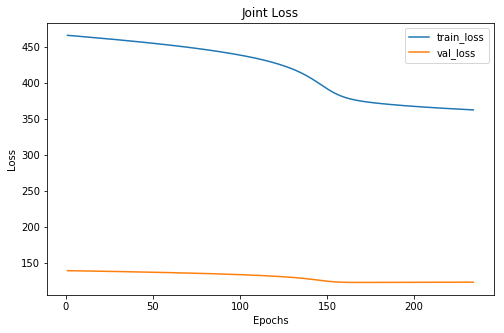

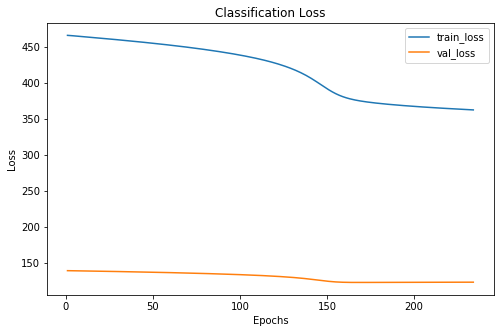

 94%|█████████▎| 234/250 [26:03<01:45,  6.57s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    217      59
      2    113      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 234 xxxxxxxxxxxxxx


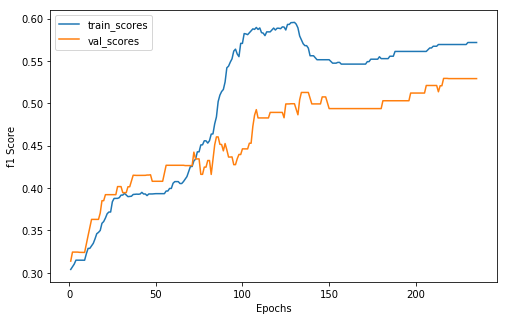

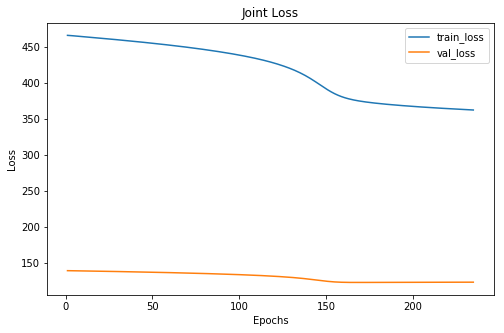

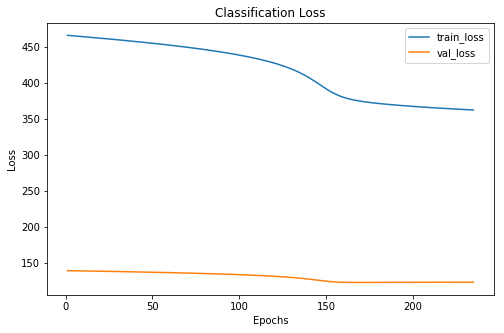

 94%|█████████▍| 235/250 [26:08<01:35,  6.39s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    217      59
      2    113      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 235 xxxxxxxxxxxxxx


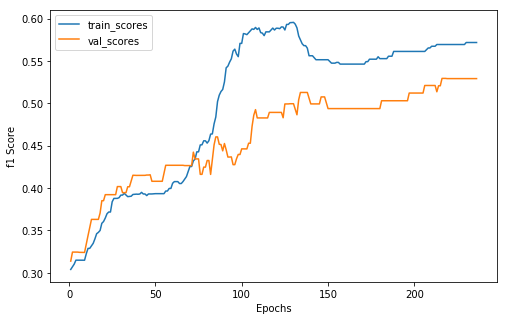

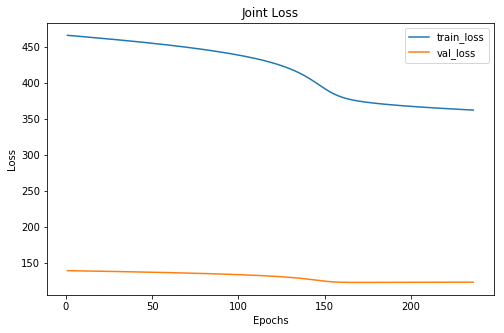

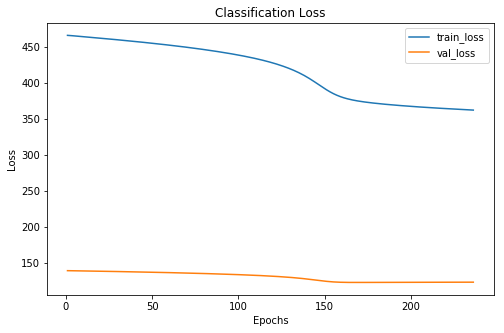

 94%|█████████▍| 236/250 [26:15<01:30,  6.47s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    217      59
      2    113      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 236 xxxxxxxxxxxxxx


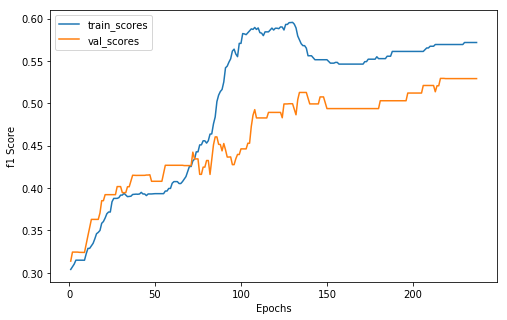

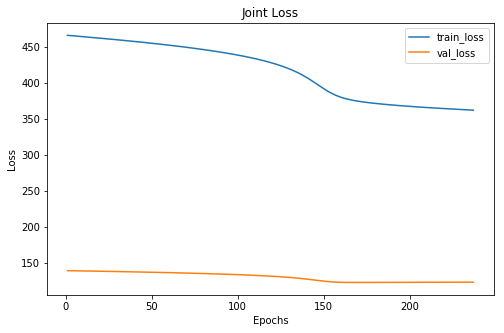

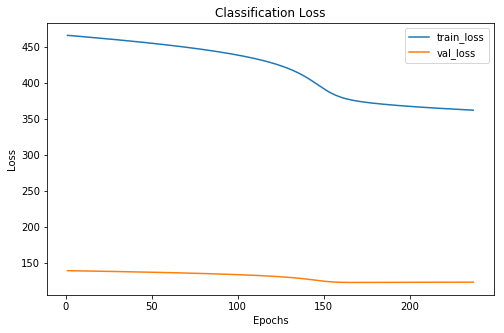

 95%|█████████▍| 237/250 [26:22<01:24,  6.52s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    217      59
      2    113      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 237 xxxxxxxxxxxxxx


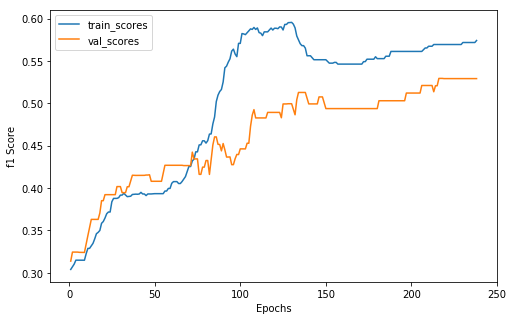

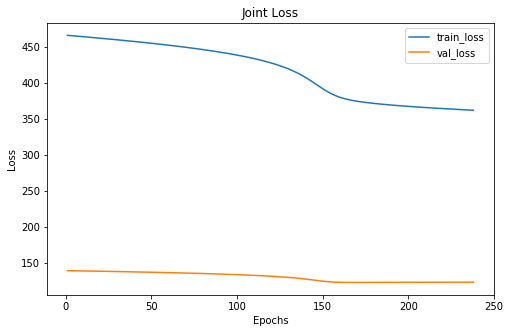

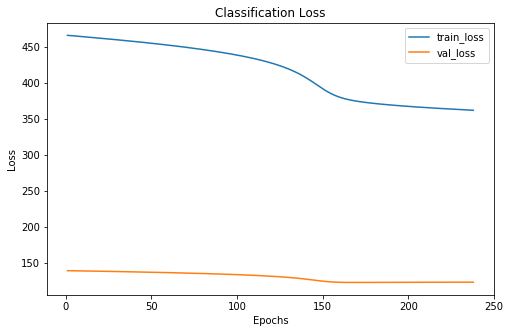

 95%|█████████▌| 238/250 [26:29<01:19,  6.66s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    216      59
      2    114      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 238 xxxxxxxxxxxxxx


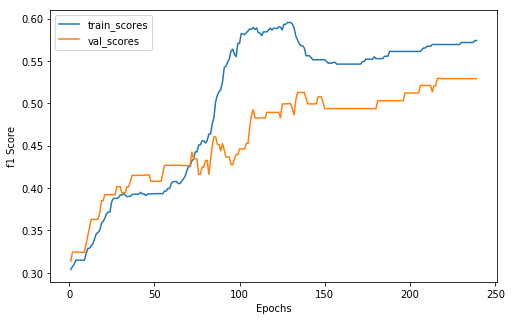

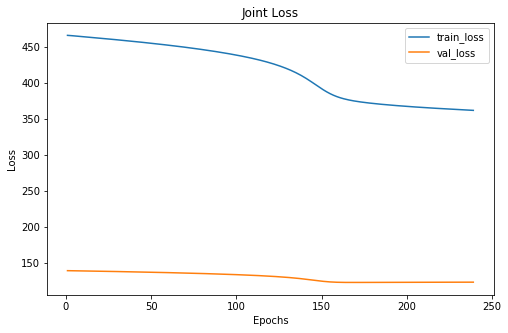

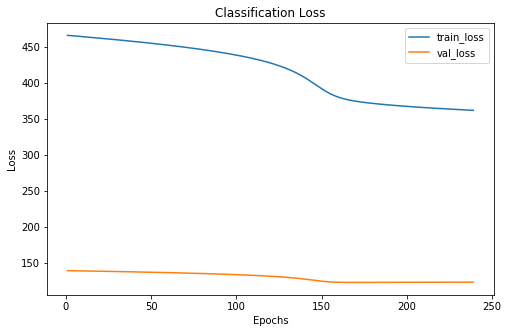

 96%|█████████▌| 239/250 [26:35<01:11,  6.48s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    216      59
      2    114      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 239 xxxxxxxxxxxxxx


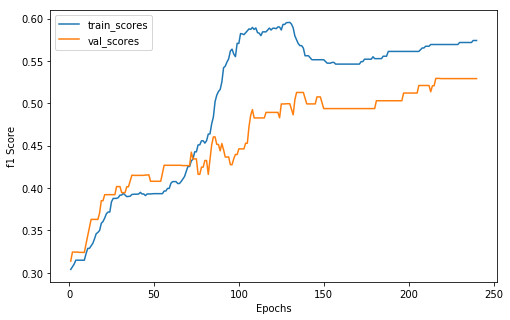

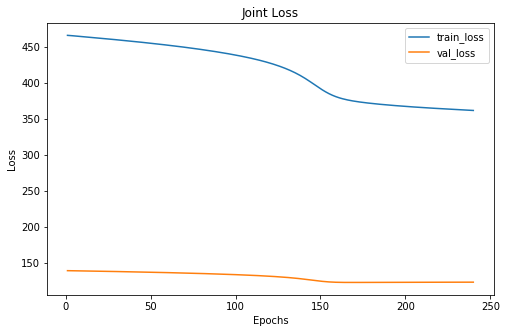

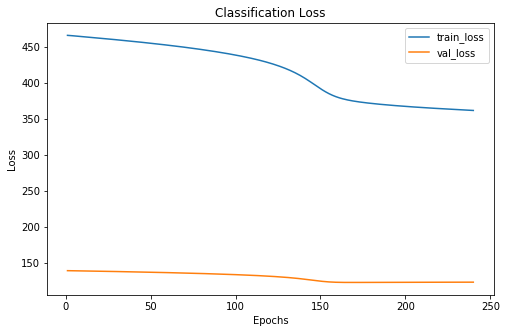

 96%|█████████▌| 240/250 [26:41<01:02,  6.24s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    216      59
      2    114      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 240 xxxxxxxxxxxxxx


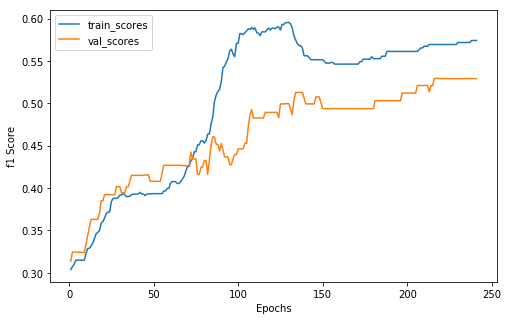

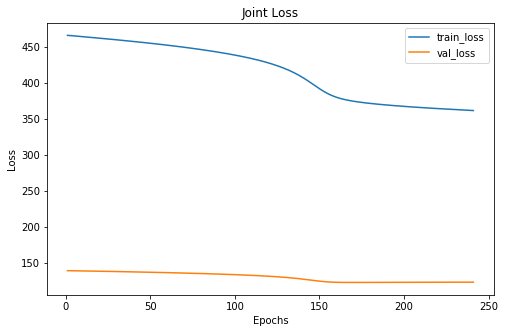

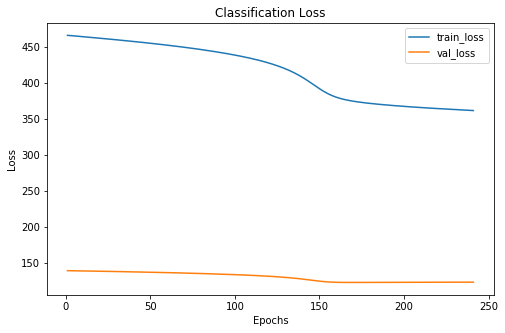

 96%|█████████▋| 241/250 [26:46<00:55,  6.15s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    216      59
      2    114      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 241 xxxxxxxxxxxxxx


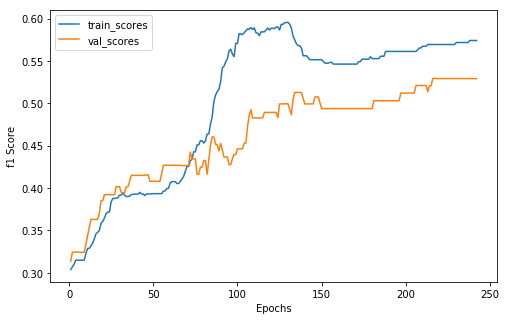

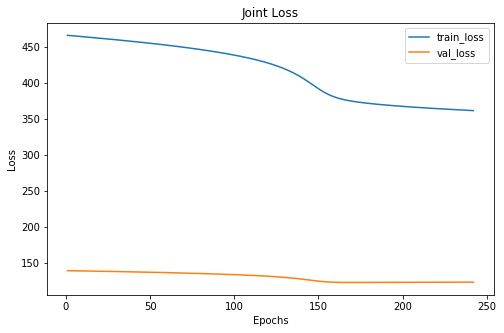

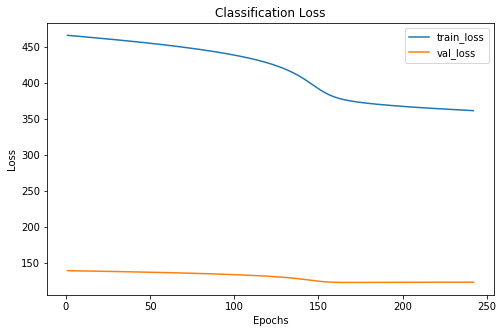

 97%|█████████▋| 242/250 [26:53<00:50,  6.27s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    216      59
      2    114      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 242 xxxxxxxxxxxxxx


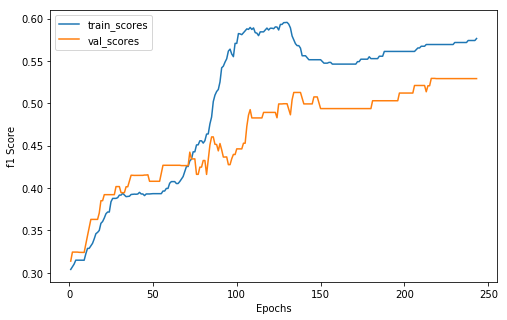

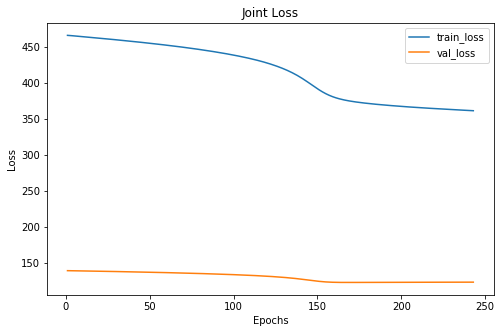

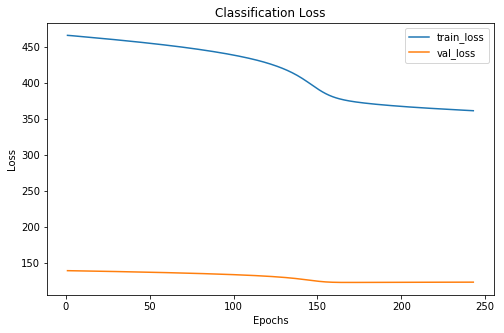

 97%|█████████▋| 243/250 [26:59<00:43,  6.21s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    215      59
      2    115      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 243 xxxxxxxxxxxxxx


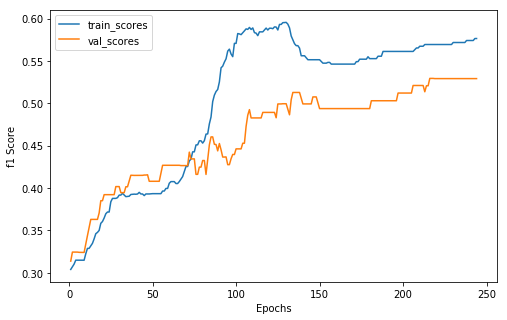

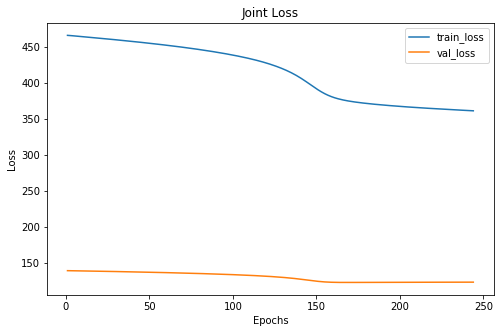

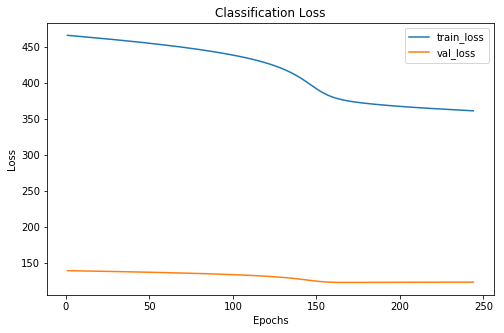

 98%|█████████▊| 244/250 [27:05<00:36,  6.11s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    215      59
      2    115      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 244 xxxxxxxxxxxxxx


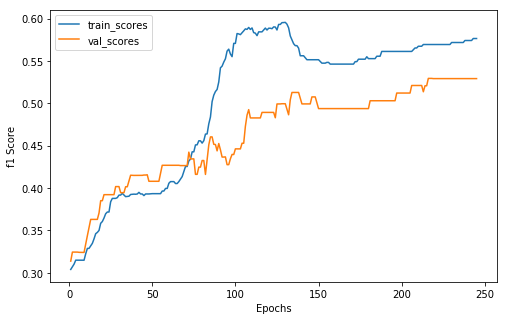

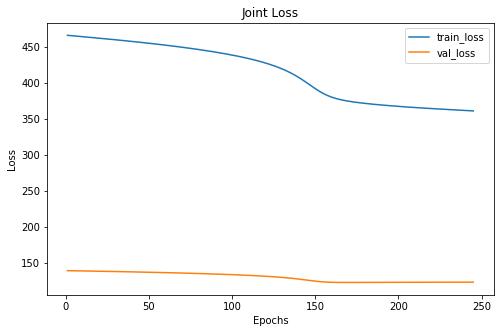

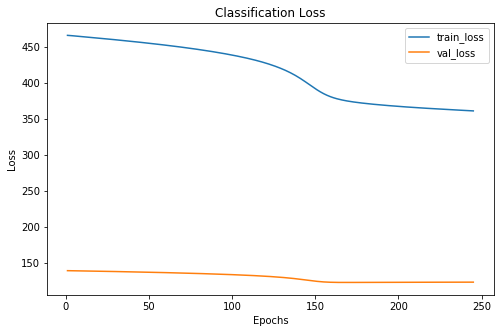

 98%|█████████▊| 245/250 [27:10<00:29,  5.91s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    215      59
      2    115      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 245 xxxxxxxxxxxxxx


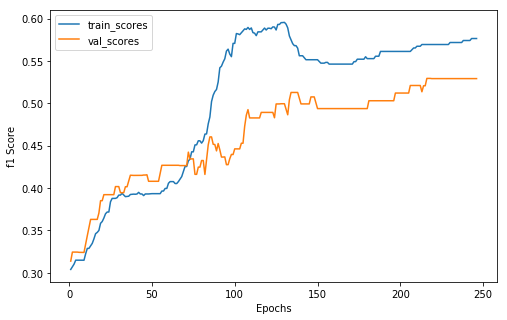

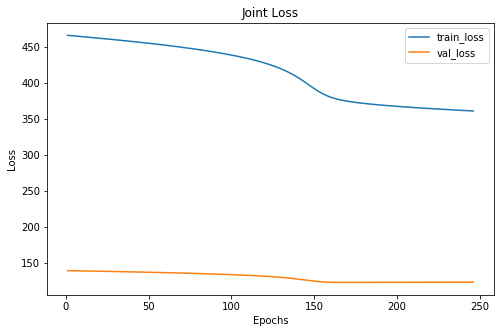

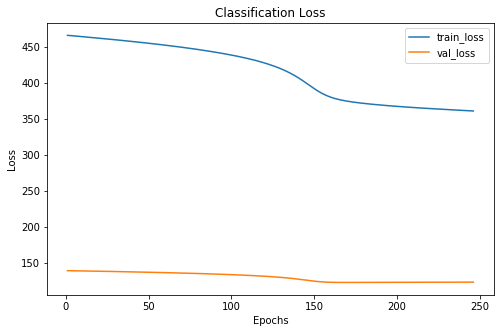

 98%|█████████▊| 246/250 [27:16<00:23,  5.90s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  31  10
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    215      59
      2    115      34
Score This Epoch: 0.5291222061063331 Best Score: 0.5293630132711625
xxxxxxxxxxxxxx epoch: 246 xxxxxxxxxxxxxx


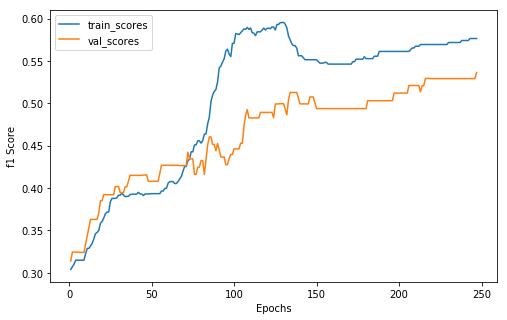

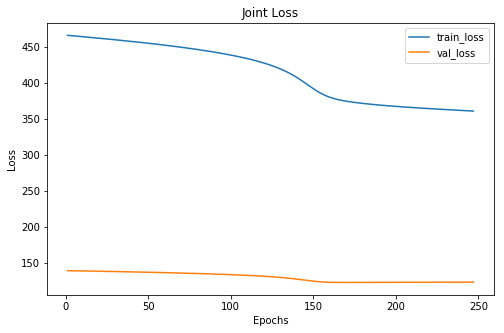

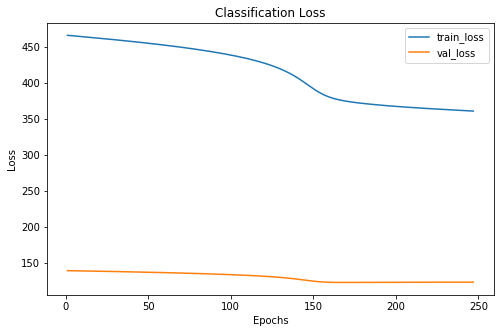

 99%|█████████▉| 247/250 [27:23<00:18,  6.16s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  32   9
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    215      60
      2    115      33
Score This Epoch: 0.5362208467513614 Best Score: 0.5362208467513614
xxxxxxxxxxxxxx epoch: 247 xxxxxxxxxxxxxx


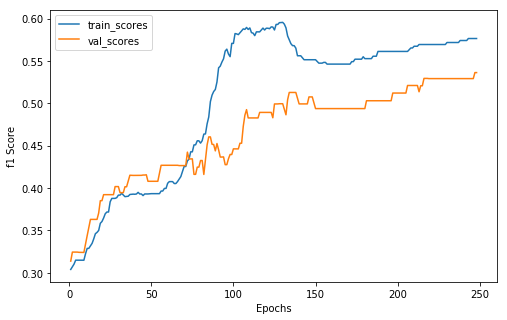

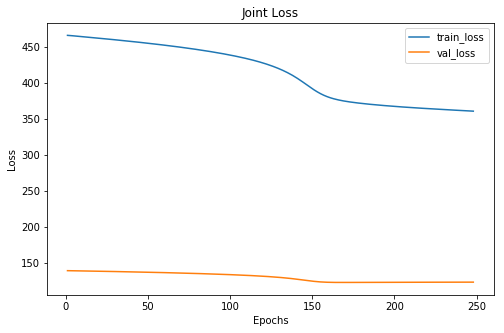

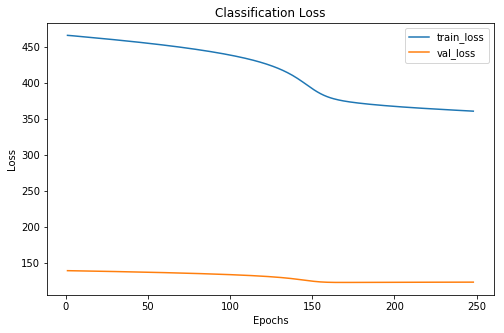

 99%|█████████▉| 248/250 [27:29<00:12,  6.17s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  32   9
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    215      60
      2    115      33
Score This Epoch: 0.5362208467513614 Best Score: 0.5362208467513614
xxxxxxxxxxxxxx epoch: 248 xxxxxxxxxxxxxx


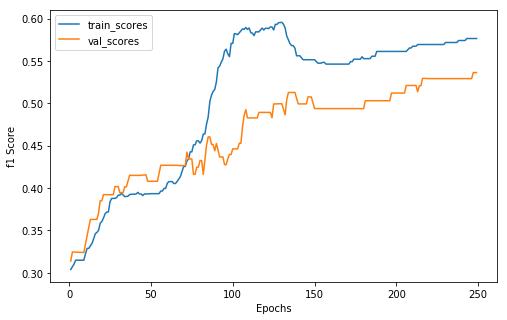

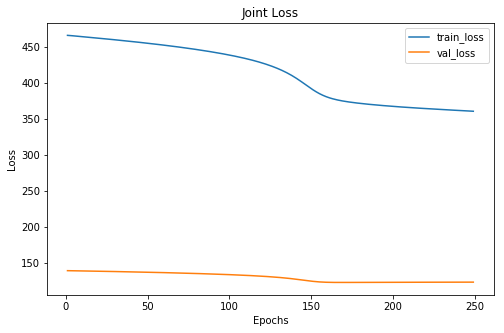

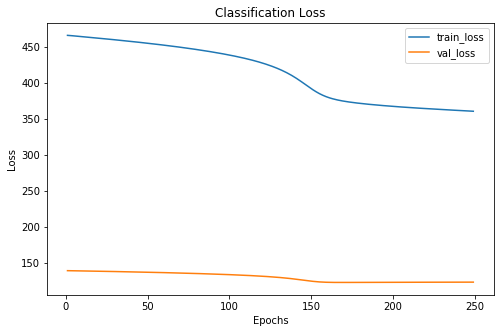

100%|█████████▉| 249/250 [27:36<00:06,  6.21s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  32   9
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    215      60
      2    115      33
Score This Epoch: 0.5362208467513614 Best Score: 0.5362208467513614
xxxxxxxxxxxxxx epoch: 249 xxxxxxxxxxxxxx


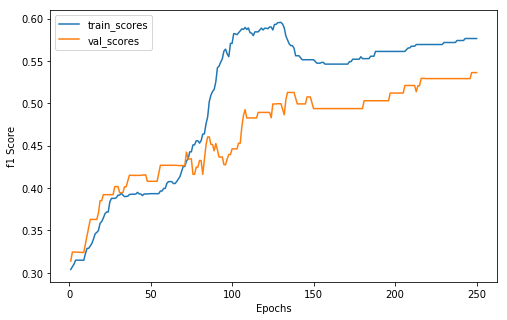

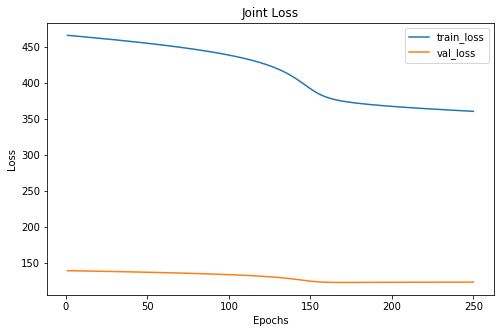

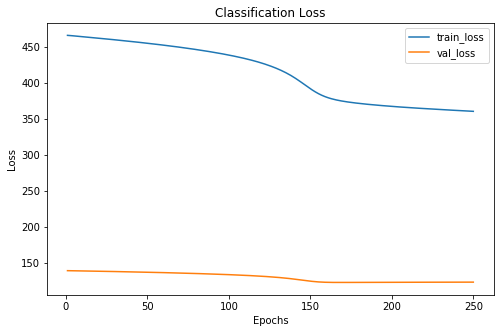

100%|██████████| 250/250 [27:42<00:00,  6.33s/it]

Cofusion Matrix For Val Set: 
--  --  --
19  15   7
 8  32   9
 6  13  17
--  --  --
Predicted Label Distribution:
  Train    Val    Test
-------  -----  ------
      0     89      33
      1    215      60
      2    115      33
Score This Epoch: 0.5362208467513614 Best Score: 0.5362208467513614
Split No:  1
Avg Cross Val Score: 0.5362208467513614


In [9]:
# K fold Cross val score.

avg_val_score = []
best_score_epoch_log = []

for split_no, split in enumerate(splits):
    print("Split No: ", split_no)
    if (split_no > 0): 
        break
    best_split_score = -1
    epoch_at_best_score = 0
    
    tensorified_data['train_ids'] = split['train_ids']
    data['train_ids'] = split['train_ids']
    
    tensorified_data['val_ids'] = split['val_ids']
    data['val_ids'] = split['val_ids']
    
    tensorified_data['test_ids'] = []
    
    total_loss_over_epochs, scores_over_epochs = plotting.get_empty_stat_over_n_epoch_dictionaries()
    reconstruction_loss_over_epochs = deepcopy(total_loss_over_epochs)
    classification_loss_over_epochs = deepcopy(total_loss_over_epochs)
    validation_user_statistics_over_epochs = []
        
    class_weights = torch.tensor(statistics.get_class_weights_in_inverse_proportion(data))
    class_weights = torch.tensor([0.93, 0.82, 1])
#     print(class_weights)
#     print("conv", conversions.prepend_ids_with_string(student_list, "student_"))
#     print('num_features', num_features)
#     print('autencoder_bottle_neck_feature_size', autencoder_bottle_neck_feature_size)
#     print('autoencoder_num_layers', autoencoder_num_layers)
#     print('shared_hidden_layer_size', shared_hidden_layer_size)
#     print('user_dense_layer_hidden_size', user_dense_layer_hidden_size)
#     print('num_classes', num_classes)
#     print('num_covariates', num_covariates)
#     print('shared_layer_dropout_prob', shared_layer_dropout_prob)
#     print('user_head_dropout_prob', user_head_dropout_prob)
    model = multitask_autoencoder.MultiTaskAutoEncoderLearner(
    conversions.prepend_ids_with_string(student_list, "student_"),
                                   num_features,
                                   autencoder_bottle_neck_feature_size,
                                   autoencoder_num_layers,
                                   shared_hidden_layer_size,
                                   user_dense_layer_hidden_size,
                                   num_classes,
                                   num_covariates,
                                   shared_layer_dropout_prob,
                                   user_head_dropout_prob,
                                   train_only_with_covariates=True)



    if cuda_enabled:
        model.cuda()
        class_weights = class_weights.cuda()

    reconstruction_criterion = torch.nn.L1Loss(reduction="sum")
    classification_criterion = torch.nn.CrossEntropyLoss(weight=class_weights)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=decay)


    for epoch in tqdm.tqdm(range(250)):

        (train_total_loss, train_total_reconstruction_loss , train_total_classification_loss, 
         train_labels, train_preds, train_users) = trainer.evaluate_multitask_learner(tensorified_data, 
                                                                          'train_ids',
                                                                          num_classes,
                                                                          model,
                                                                          reconstruction_criterion ,
                                                                          classification_criterion,
                                                                          device,
                                                                          optimizer=optimizer,
                                                                          alpha=alpha,
                                                                          beta=beta,
                                                                          use_histogram=use_historgram)

        (val_total_loss, val_total_reconstruction_loss , val_total_classification_loss, 
         val_labels, val_preds, val_users) =  trainer.evaluate_multitask_learner(tensorified_data,
                                                                      'val_ids',
                                                                      num_classes,
                                                                      model,
                                                                      reconstruction_criterion,
                                                                      classification_criterion,
                                                                      device,
                                                                      alpha=alpha,
                                                                      beta=beta,
                                                                      use_histogram=use_historgram)

        ######## Appending losses ######## 
        total_loss_over_epochs['train_loss'].append(train_total_loss)
        total_loss_over_epochs['val_loss'].append(val_total_loss)

        reconstruction_loss_over_epochs['train_loss'].append(train_total_reconstruction_loss)
        reconstruction_loss_over_epochs['val_loss'].append(val_total_reconstruction_loss)

        classification_loss_over_epochs['train_loss'].append(train_total_classification_loss)
        classification_loss_over_epochs['val_loss'].append(val_total_classification_loss)

        ######## Appending Metrics ######## 
        train_label_list = conversions.tensor_list_to_int_list(train_labels)
        train_pred_list = conversions.tensor_list_to_int_list(train_preds)
        val_label_list = conversions.tensor_list_to_int_list(val_labels)
        val_pred_list = conversions.tensor_list_to_int_list(val_preds)

        train_scores = metrics.precision_recall_fscore_support(train_label_list, train_pred_list, average='weighted')
        val_scores = metrics.precision_recall_fscore_support(val_label_list, val_pred_list, average='weighted')
        
        scores_over_epochs['train_scores'].append(train_scores)
        scores_over_epochs['val_scores'].append(val_scores)

        validation_user_statistics_over_epochs.append(statistics.generate_training_statistics_for_user(val_labels,
                                                                                                    val_preds,
                                                                                                    val_users))
        if epoch%1 == 0:
            print("xxxxxxxxxxxxxx epoch: {} xxxxxxxxxxxxxx".format(epoch))
            plotting.plot_score_over_n_epochs(scores_over_epochs, score_type='f1', fig_size=(8,5))
            plotting.plot_loss_over_n_epochs(total_loss_over_epochs, fig_size=(8, 5), title="Joint Loss")
            plotting.plot_loss_over_n_epochs(classification_loss_over_epochs, fig_size=(8, 5), title="Classification Loss")

            print("Cofusion Matrix For Val Set: ")
            print(tabulate( metrics.confusion_matrix(conversions.tensor_list_to_int_list(val_labels), 
                                                     conversions.tensor_list_to_int_list(val_preds))))
            print("Predicted Label Distribution:")
            print(statistics.get_train_test_val_label_counts_from_predictions(train_preds, val_preds))
            
        if val_scores[2] > best_split_score:
            best_split_score = val_scores[2]
            epoch_at_best_score = epoch
            
        print("Score This Epoch: {} Best Score: {}".format(val_scores[2], best_split_score))
            
    avg_val_score.append(best_split_score)
    best_score_epoch_log.append(epoch_at_best_score)
    
print("Avg Cross Val Score: {}".format(list_mean(avg_val_score)))

In [10]:
# outfile = open('../data/training_data/user_stats/training_date_normalized_shuffled_splits_select_features_dropout.matrix', 'wb')
# pickle.dump(validation_user_statistics_over_epochs, outfile)
# outfile.close()

In [11]:
MODEL_PATH = "{}/no_ae_model.tar".format(data_path)
print(MODEL_PATH)
torch.save(model.state_dict(), MODEL_PATH)

/home/nsimsiri/MultiRes/student_life/data/no_ae_model.tar


In [12]:
print(model)

MultiTaskAutoEncoderLearner(
  (simple_encoder): LSTM(9, 128, batch_first=True)
  (simple_encoder_relu): ReLU()
  (shared_linear): Linear(in_features=132, out_features=256, bias=True)
  (shared_activation): ReLU()
  (shared_layer_dropout): Dropout(p=0.0)
  (shared_linear_1): Linear(in_features=256, out_features=128, bias=True)
  (shared_activation_1): ReLU()
  (user_heads): UserDenseHead(
    (student_dense_layer): ModuleDict(
      (student_1): Sequential(
        (0): Linear(in_features=128, out_features=64, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.0)
        (3): Linear(in_features=64, out_features=3, bias=True)
      )
      (student_10): Sequential(
        (0): Linear(in_features=128, out_features=64, bias=True)
        (1): ReLU()
        (2): Dropout(p=0.0)
        (3): Linear(in_features=64, out_features=3, bias=True)
      )
      (student_2): Sequential(
        (0): Linear(in_features=128, out_features=64, bias=True)
        (1): ReLU()
        (2): Dropout(p